# SARIMAX_SE with GRIDSEARCH_CV and PCA on ADM0, MONTHLY

In [1]:
import pandas as pd

# pd.set_option('display.max_rows', 500)
# pd.set_option('display.max_columns', 500)

import warnings
warnings.simplefilter('ignore')

import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
    
import time
import datetime

import os

## Model Specifications

In [2]:
TARGET_VARIABLE = "SUM(FATALITIES)"
SEASONAL_PERIODICITY = 12 # for data frequency & seasonality S

SEASONALITY = True
NEIGHBORS = False # X_N
SOCIO_ECO_VARS = True # X_SE
N_LAGS_X = 1 # todo: remove or change behavior from max lags to lag
DIM_REDUCTION_METHOD = "PCA"

if SEASONALITY:
    CV_FOLDS = 5
else:
    CV_FOLDS = 5

In [3]:
MODEL_NAME = ""
if SEASONALITY:
    MODEL_NAME += "S" 
    
MODEL_NAME += "ARIMA"

if SOCIO_ECO_VARS and NEIGHBORS:
    MODEL_NAME += "X_SE+N"
    
if SOCIO_ECO_VARS and not NEIGHBORS:
    MODEL_NAME += "X_SE"
    
if not SOCIO_ECO_VARS and NEIGHBORS:
    MODEL_NAME += "X_N"
    
if SEASONAL_PERIODICITY ==  12:
    MODEL_NAME += "_MONTHLY"
elif SEASONAL_PERIODICITY == 4:
    MODEL_NAME += "_QUARTERLY"

MODEL_NAME

'SARIMAX_SE_MONTHLY'

### Hyperparameter Grid

In [4]:
# create a set of sarima configs to try
PARAM_GRID = list()
# parameter options to try

### PCA
if NEIGHBORS or SOCIO_ECO_VARS:
    n_components = range(0, 4) # include up to three main components
else:
    n_components = [0]
    

### ARMA
p_params = range(4) # AR 3
d_params = range(2) # Differencing 1
q_params = range(4) # MA 3


### SEASONALITY
if SEASONALITY:
    P_params = range(3) # 5
    D_params = range(2) # 1
    Q_params = range(3) # 2
    
    ### TREND
    # t_params = ['n','c','t','ct'] # Form of Trend
    # t_params = ['n', 't', 'ct'] # Form of Trend
    t_params = ["n"]

    ### SEASONAL PERIODICITY
    m_params = [SEASONAL_PERIODICITY]   
else:
    P_params = [0]
    D_params = [0]
    Q_params = [0]

    t_params = ["n"] # Form of Trend

    m_params = [0] 

for n in n_components:
    for p in p_params:
        for d in d_params:
            for q in q_params:
                for P in P_params:
                    for D in D_params:
                        for Q in Q_params:
                            for m in m_params:
                                for t in t_params:
                                    cfg = [n, (p, d, q), (P, D, Q, m), t]
                                    PARAM_GRID.append(cfg)
len(PARAM_GRID)    

2304

## Model Training

In [5]:
from common_functions import *
from forecasters import *

#### Training Method

In [6]:
def sarimax(target_variable="SUM(FATALITIES)", 
            target_country="MLI", 
            predictor_countries=["BFA"], 
            n_lags_X = N_LAGS_X, 
            seasonal_periodicity = SEASONAL_PERIODICITY):
        
    ### GET DATA
    y, X = getData(target_variable = target_variable, 
                   target_country = target_country, 
                   predictor_countries = predictor_countries,
                   socio_eco_vars = SOCIO_ECO_VARS,
                   n_lags_X = N_LAGS_X, 
                   seasonal_periodicity = SEASONAL_PERIODICITY)
    
    ### SPLIT DATA
    X_train, X_test, y_train, y_test = train_test_split(y = y,
                                                        X = X, 
                                                        forecast_horizon = SEASONAL_PERIODICITY)
    
    ### TRAINING WITH GRIDSEARCHCV
    gscv = GridSearchCV(param_grid = PARAM_GRID,
                        forecaster = TimeSeriesForecasterPCA_LinInt,
                        seasonal_periodicity = SEASONAL_PERIODICITY,
                        cv_folds = CV_FOLDS)
    training_res = gscv.train(X_train, y_train)

    if training_res is not None:
        model = gscv
        # print ARIMA summary
        print(training_res)
        print(model.best_model_result.mle_retvals)
        plt.tight_layout()
        try:
            model.best_model_result.plot_diagnostics(figsize=(16*0.7, 10*0.7), lags = SEASONAL_PERIODICITY+1)
        except: 
            pass
        best_parameters = str(model.best_model_cv_results)
        
    else:
        print("No model fitted --> Prediction with Naive Model ")
        model = NoChange().fit(X_train, y_train)
        best_parameters = np.nan
        
    ### PREDICTION
    prediction_results = model.evaluate_model(X_test, y_test, fh = SEASONAL_PERIODICITY)
    
    if prediction_results["FAT_PRED"].isnull().values.any():
        model = NoChange().fit(X_train, y_train)
        print("Model Prediction failed --> Prediction with Naive Model ")
        model = NoChange().fit(X_train, y_train)
        best_parameters = np.nan
        prediction_results = model.evaluate_model(X_test, y_test, fh = SEASONAL_PERIODICITY)
    
    ### ADJUST RESULT DF
    prediction_results["GID_0"] = target_country
    prediction_results["MONTH"] = pd.to_datetime(prediction_results["MONTH"].astype(str)) 
    prediction_results["PARAMETERS"] = best_parameters

    print(prediction_results)

    return prediction_results

#### Automated Training for all 234 Countries 

In [7]:
acled_monthly_adm0 = pd.read_csv("../data/TB003_EVENT_OUTCOMES_MONTHLY_START_DATE.csv")
gid0_neighbors = pd.read_csv("../data/GID_0_Neighbours.csv")
# gid_list = acled_monthly_adm0["GID_0"].unique()[::-1] #reverse
gid_list = acled_monthly_adm0["GID_0"].unique()
len(gid_list)

234

File already exists.
######## ABW (1/234) #########
12
Model for this country has already been fitted.
######## AFG (2/234) #########
12
Model for this country has already been fitted.
######## AGO (3/234) #########
12
Model for this country has already been fitted.
######## AIA (4/234) #########
12
Model for this country has already been fitted.
######## ALA (5/234) #########
12
Model for this country has already been fitted.
######## ALB (6/234) #########
12
Model for this country has already been fitted.
######## AND (7/234) #########
12
Model for this country has already been fitted.
######## ARE (8/234) #########
12
Model for this country has already been fitted.
######## ARG (9/234) #########
12
Model for this country has already been fitted.
######## ARM (10/234) #########
12
Model for this country has already been fitted.
######## ASM (11/234) #########
12
Model for this country has already been fitted.
######## ATA (12/234) #########
12
Model for this country has already been 

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.14255553730053516, 'fold_results': [0.0, 0.20707555414900003, 0.35638884325133796, 0.1493132891023379, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_MAR   No. Observations:                  289
Model:                         SARIMAX   Log Likelihood                -185.334
Date:                 Fri, 21 Oct 2022   AIC                            372.667
Time:                         14:44:57   BIC                            376.333
Sample:                     02-28-1997   HQIC                           374.136
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

<Figure size 432x288 with 0 Axes>

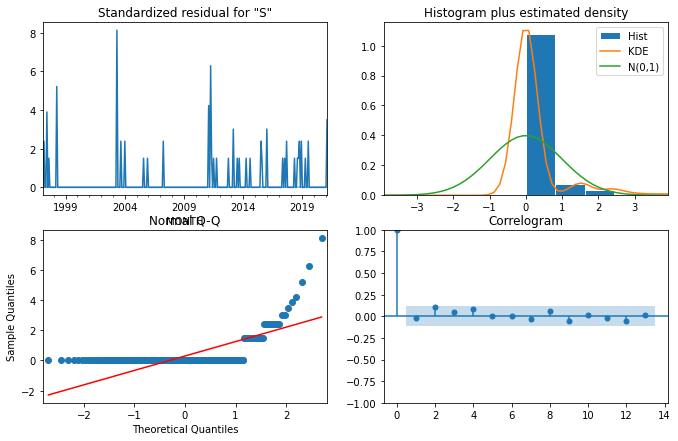

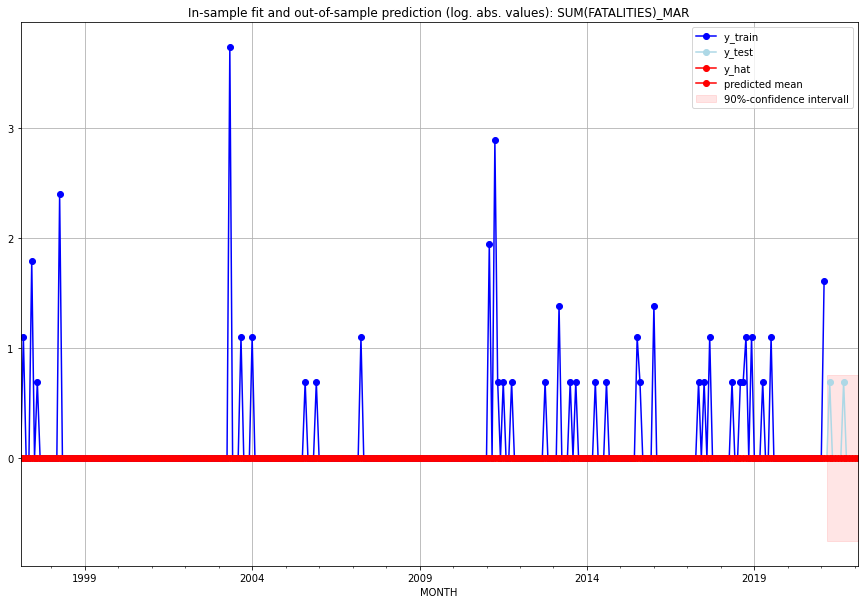

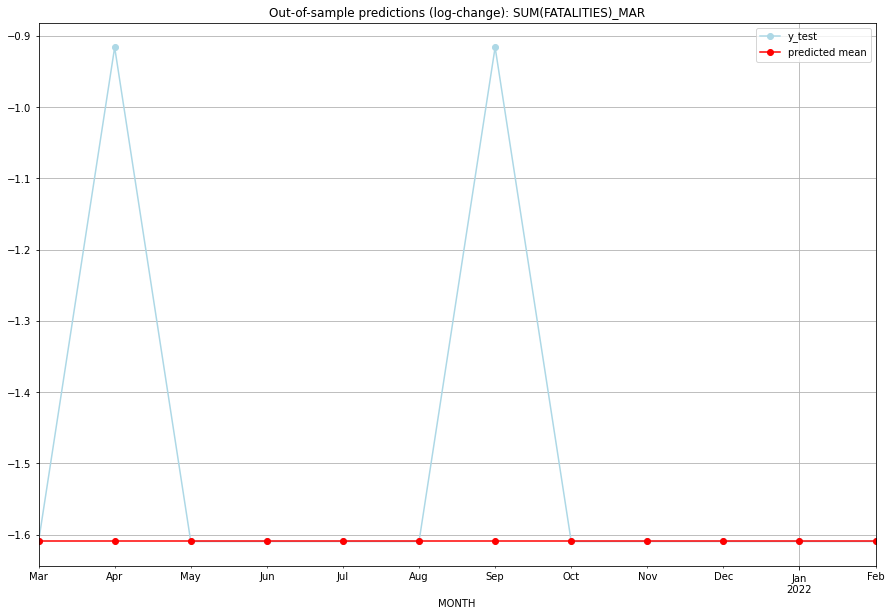

TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0     -1.609438       -1.609438   MAR   
1  2021-04-01       0.0         1.0     -1.609438       -0.916291   MAR   
2  2021-05-01       0.0         0.0     -1.609438       -1.609438   MAR   
3  2021-06-01       0.0         0.0     -1.609438       -1.609438   MAR   
4  2021-07-01       0.0         0.0     -1.609438       -1.609438   MAR   
5  2021-08-01       0.0         0.0     -1.609438       -1.609438   MAR   
6  2021-09-01       0.0         1.0     -1.609438       -0.916291   MAR   
7  2021-10-01       0.0         0.0     -1.609438       -1.609438   MAR   
8  2021-11-01       0.0         0.0     -1.609438       -1.609438   MAR   
9  2021-12-01       0.0         0.0     -1.609438       -1.609438   MAR   
10 2022-01-01       0.0         0.0     -1.609438       -1.609438   MAR   
11 2022-02-01       0.0         0.0     -1.609438   

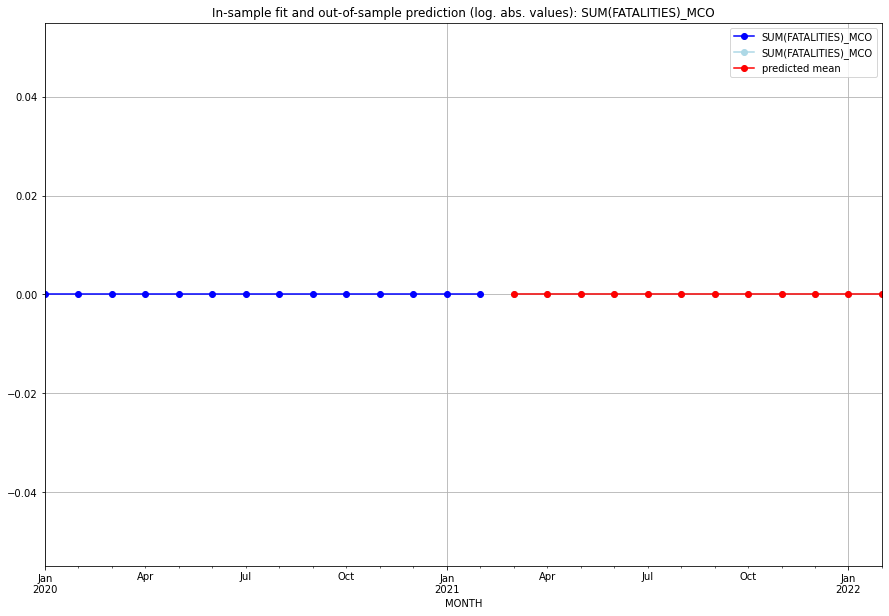

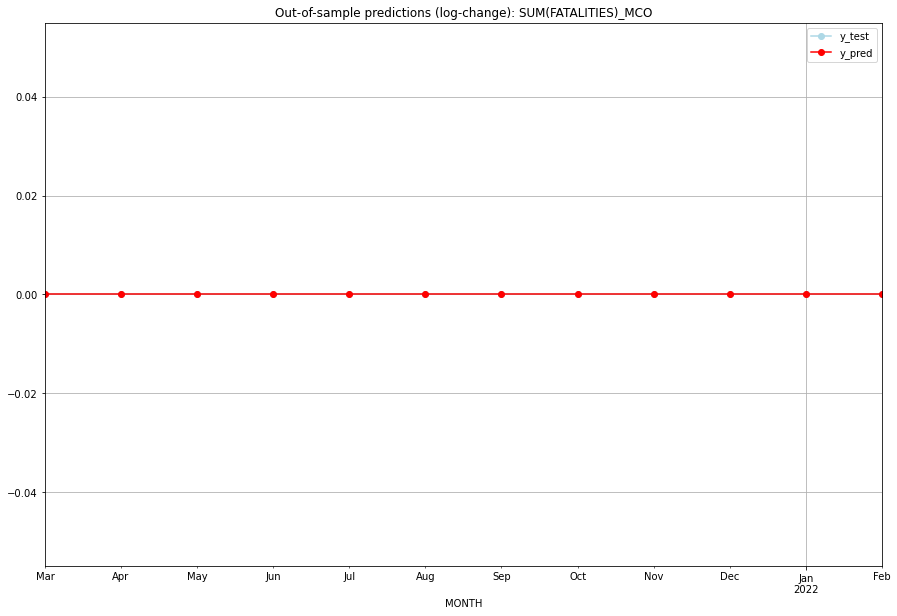

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MCO   
1  2021-04-01       0.0         0.0           0.0             0.0   MCO   
2  2021-05-01       0.0         0.0           0.0             0.0   MCO   
3  2021-06-01       0.0         0.0           0.0             0.0   MCO   
4  2021-07-01       0.0         0.0           0.0             0.0   MCO   
5  2021-08-01       0.0         0.0           0.0             0.0   MCO   
6  2021-09-01       0.0         0.0           0.0             0.0   MCO   
7  2021-10-01       0.0         0.0           0.0             0.0   MCO   
8  2021-11-01       0.0         0.0           0.0             0.0   MCO   
9  2021-12-01       0.0         0.0           0.0             0.0   MCO   
10 2022-01-01       0.0         0.0           0.0             0.0   MCO   
11 2022-02-01       0.0         0.0           0.0             0.0   

<Figure size 432x288 with 0 Axes>

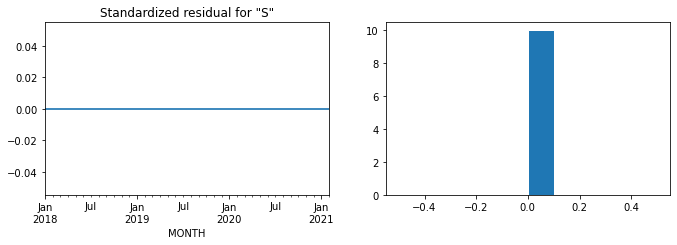

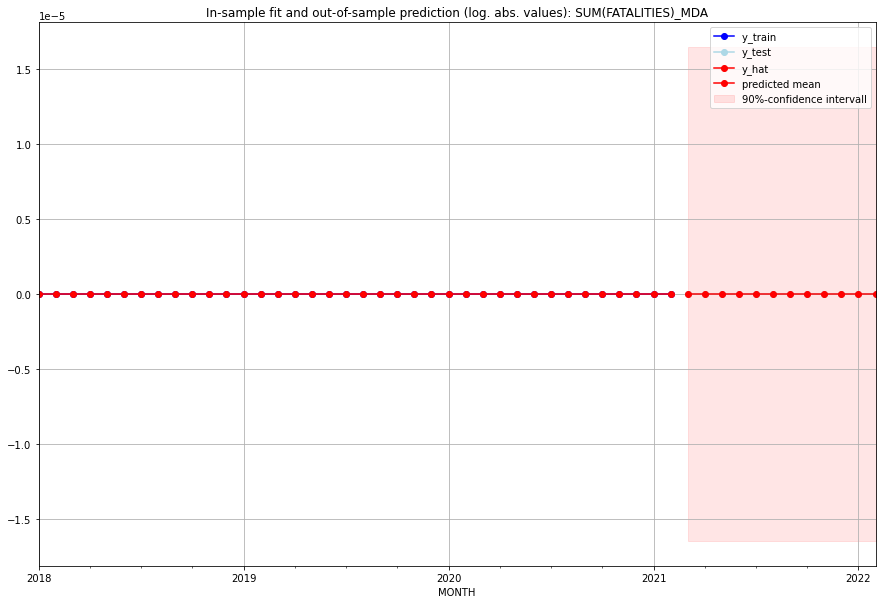

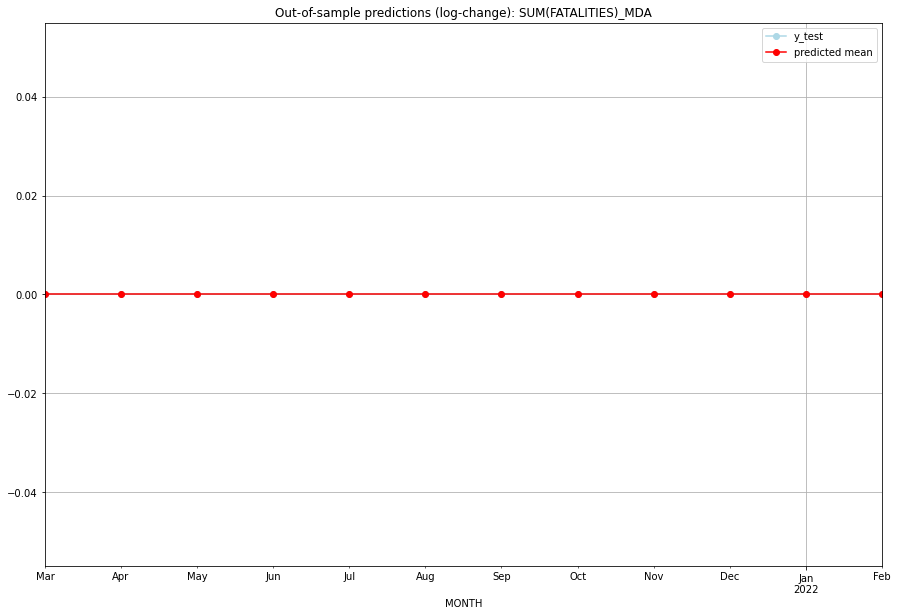

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MDA   
1  2021-04-01       0.0         0.0           0.0             0.0   MDA   
2  2021-05-01       0.0         0.0           0.0             0.0   MDA   
3  2021-06-01       0.0         0.0           0.0             0.0   MDA   
4  2021-07-01       0.0         0.0           0.0             0.0   MDA   
5  2021-08-01       0.0         0.0           0.0             0.0   MDA   
6  2021-09-01       0.0         0.0           0.0             0.0   MDA   
7  2021-10-01       0.0         0.0           0.0             0.0   MDA   
8  2021-11-01       0.0         0.0           0.0             0.0   MDA   
9  2021-12-01       0.0         0.0           0.0             0.0   MDA   
10 2022-01-01       0.0         0.0           0.0             0.0   MDA   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (3, 1, 3), (2, 0, 2, 12), 'n'], 'cv_score': 0.7544804813157692, 'fold_results': [1.0634164208465007, 0.5781689300006786, 0.7703246469822899, 0.8755077073203497, 0.4849847014290269]}
Training finished.
                                        SARIMAX Results                                        
Dep. Variable:                     SUM(FATALITIES)_MDG   No. Observations:                  289
Model:             SARIMAX(3, 1, 3)x(2, 0, [1, 2], 12)   Log Likelihood                -351.219
Date:                                 Fri, 21 Oct 2022   AIC                            724.438
Time:                                         14:56:24   BIC                            764.731
Sample:                                     02-28-1997   HQIC                           740.585
                                          - 02-28-2021                                         
Covariance Type:                                   opg                                        

<Figure size 432x288 with 0 Axes>

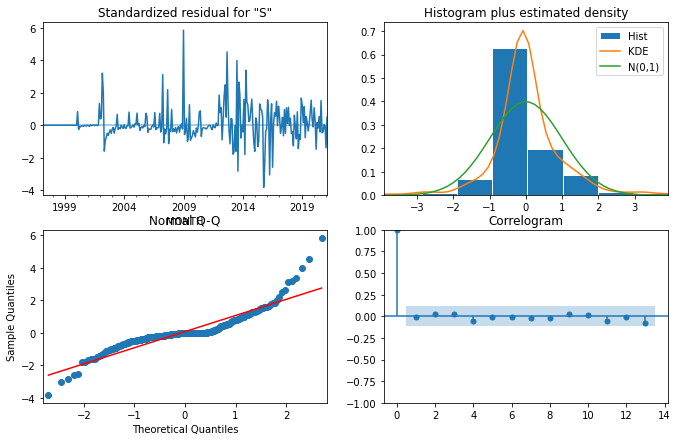

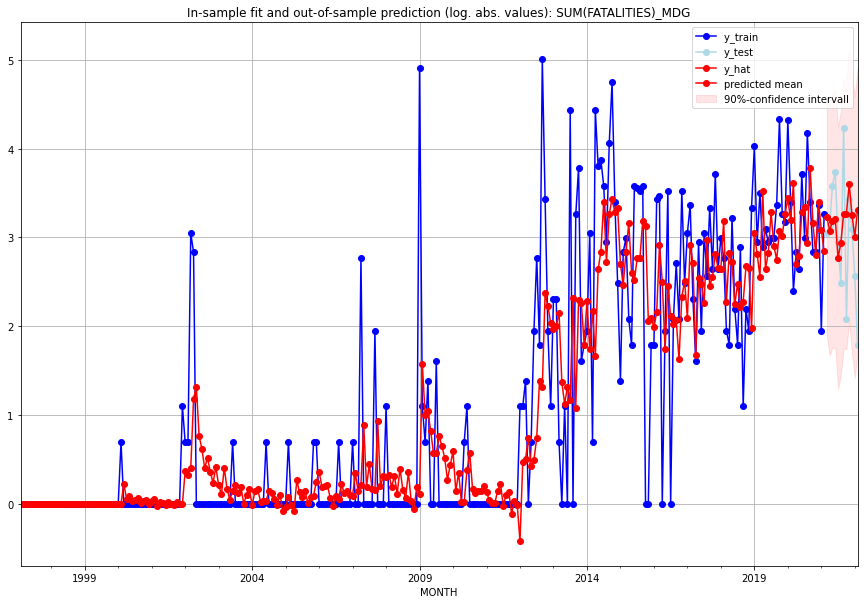

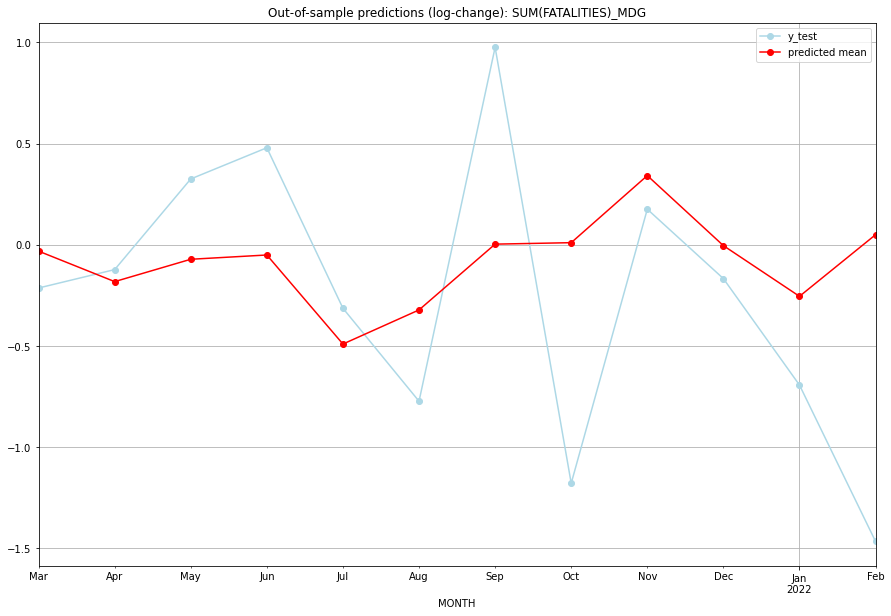

TADDA: 0.5353941629128817
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  24.198223        20.0     -0.031323       -0.213574   MDG   
1  2021-04-01  20.674198        22.0     -0.181974       -0.122602   MDG   
2  2021-05-01  23.204968        35.0     -0.071539        0.325422   MDG   
3  2021-06-01  23.721694        41.0     -0.050415        0.479573   MDG   
4  2021-07-01  14.920478        18.0     -0.490490       -0.313658   MDG   
5  2021-08-01  17.843906        11.0     -0.321907       -0.773190   MDG   
6  2021-09-01  25.084844        68.0      0.003258        0.976010   MDG   
7  2021-10-01  25.273820         7.0      0.010476       -1.178655   MDG   
8  2021-11-01  35.602709        30.0      0.342026        0.175891   MDG   
9  2021-12-01  24.894437        21.0     -0.004068       -0.167054   MDG   
10 2022-01-01  19.153967        12.0     -0.254695       -0.693147   MDG   
11 2022-02-01  26.330567         5.0     

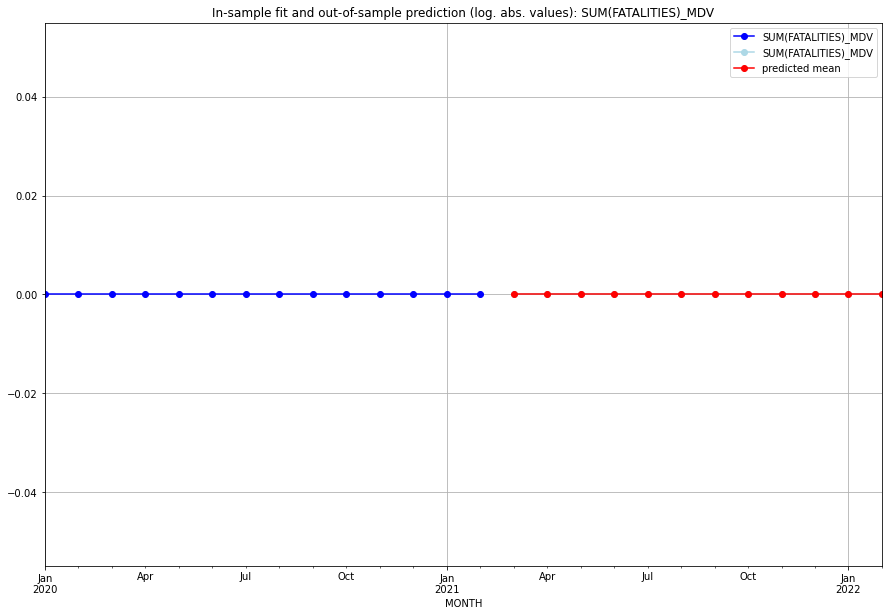

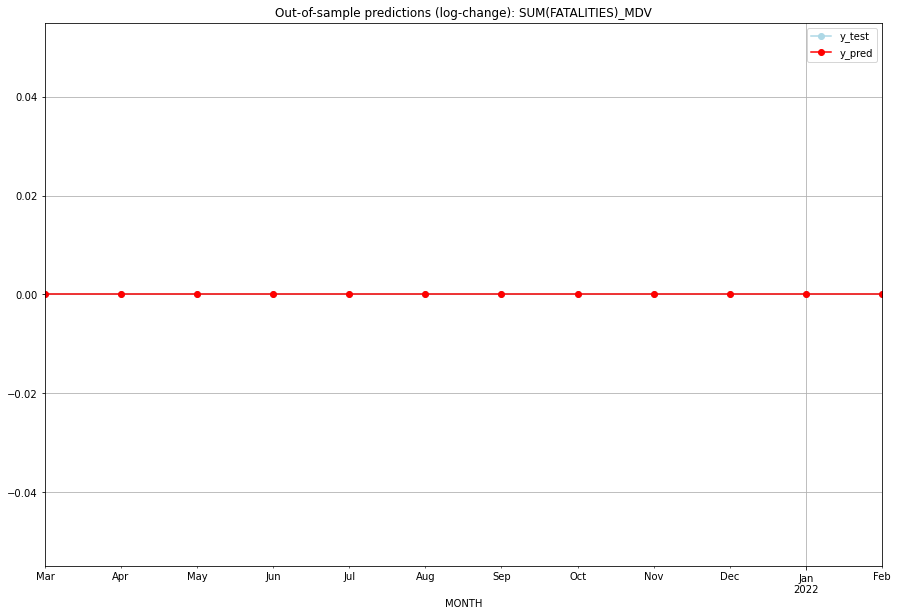

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MDV   
1  2021-04-01       0.0         0.0           0.0             0.0   MDV   
2  2021-05-01       0.0         0.0           0.0             0.0   MDV   
3  2021-06-01       0.0         0.0           0.0             0.0   MDV   
4  2021-07-01       0.0         0.0           0.0             0.0   MDV   
5  2021-08-01       0.0         0.0           0.0             0.0   MDV   
6  2021-09-01       0.0         0.0           0.0             0.0   MDV   
7  2021-10-01       0.0         0.0           0.0             0.0   MDV   
8  2021-11-01       0.0         0.0           0.0             0.0   MDV   
9  2021-12-01       0.0         0.0           0.0             0.0   MDV   
10 2022-01-01       0.0         0.0           0.0             0.0   MDV   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (0, 1, 3), (0, 0, 1, 12), 'n'], 'cv_score': 0.09374542298164323, 'fold_results': [nan, 0.09374542298164323]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_MEX   No. Observations:                   38
Model:             SARIMAX(0, 1, 3)x(0, 0, [1], 12)   Log Likelihood                  26.097
Date:                              Fri, 21 Oct 2022   AIC                            -38.195
Time:                                      14:57:44   BIC                            -26.918
Sample:                                  01-31-2018   HQIC                           -34.219
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------

<Figure size 432x288 with 0 Axes>

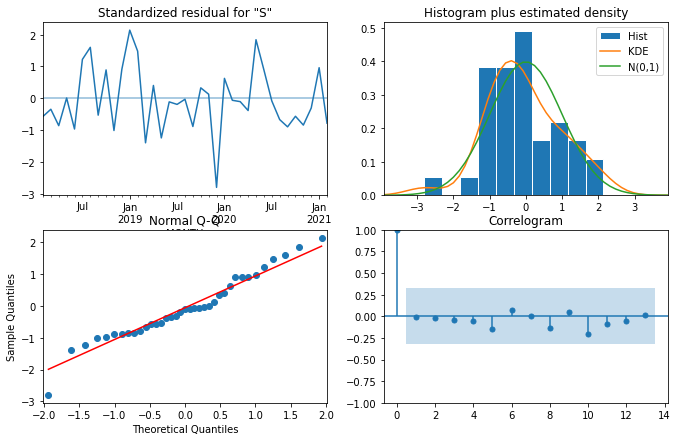

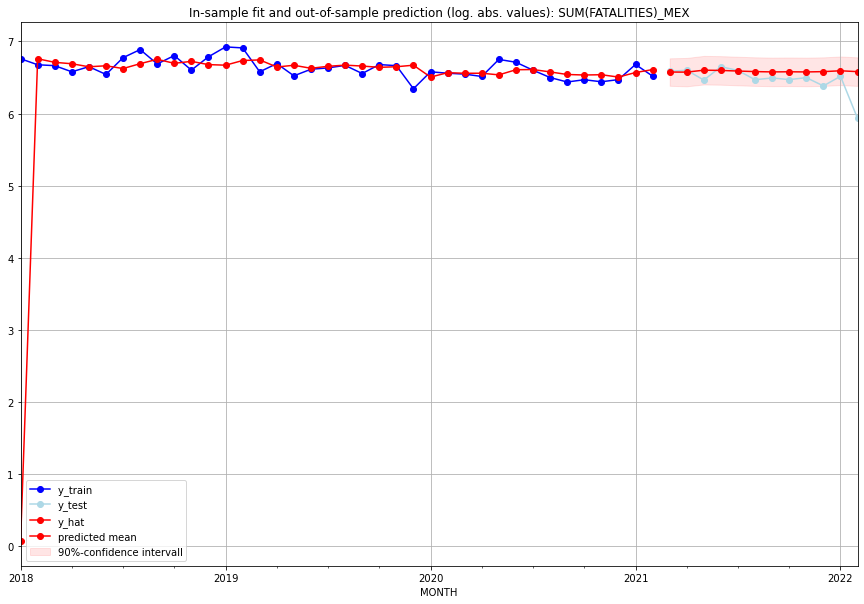

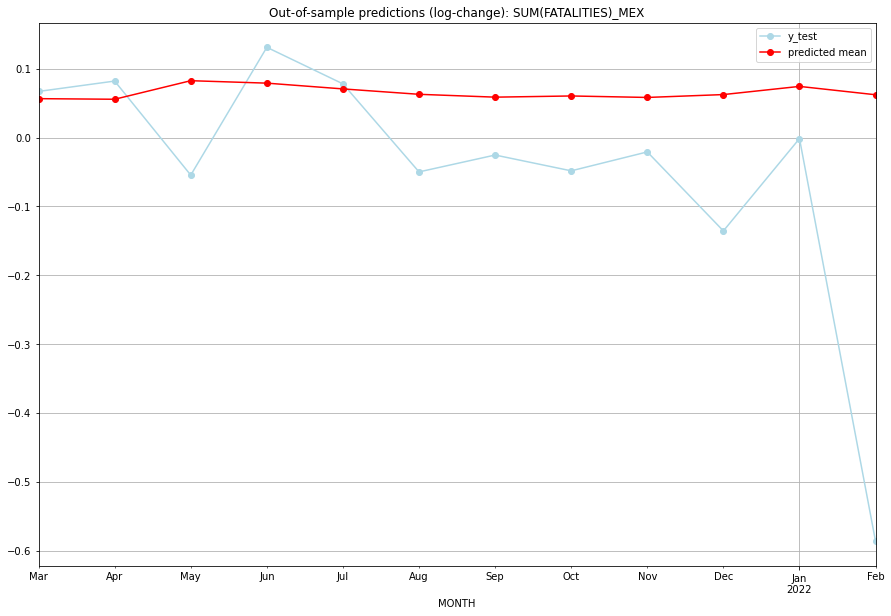

TADDA: 0.17192795554129767
Evaluation finished.
        MONTH    FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  716.422674       724.0      0.056518        0.067024   MEX   
1  2021-04-01  715.805698       735.0      0.055658        0.082083   MEX   
2  2021-05-01  735.395378       641.0      0.082620       -0.054559   MEX   
3  2021-06-01  732.783167       772.0      0.079066        0.131132   MEX   
4  2021-07-01  726.661243       732.0      0.070688        0.077998   MEX   
5  2021-08-01  720.980823       644.0      0.062851       -0.049897   MEX   
6  2021-09-01  717.997899       660.0      0.058711       -0.025393   MEX   
7  2021-10-01  719.234961       645.0      0.060430       -0.048348   MEX   
8  2021-11-01  717.690016       663.0      0.058283       -0.020865   MEX   
9  2021-12-01  720.696250       591.0      0.062457       -0.135641   MEX   
10 2022-01-01  729.314589       676.0      0.074328       -0.001476   MEX   
11 2022-02-01  720.505694   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.0, 'fold_results': [0.0, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_MKD   No. Observations:                   38
Model:                         SARIMAX   Log Likelihood                  29.122
Date:                 Fri, 21 Oct 2022   AIC                            -56.244
Time:                         14:58:57   BIC                            -54.606
Sample:                     01-31-2018   HQIC                           -55.661
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0126      0.001     18.748      0.000       0.011       

<Figure size 432x288 with 0 Axes>

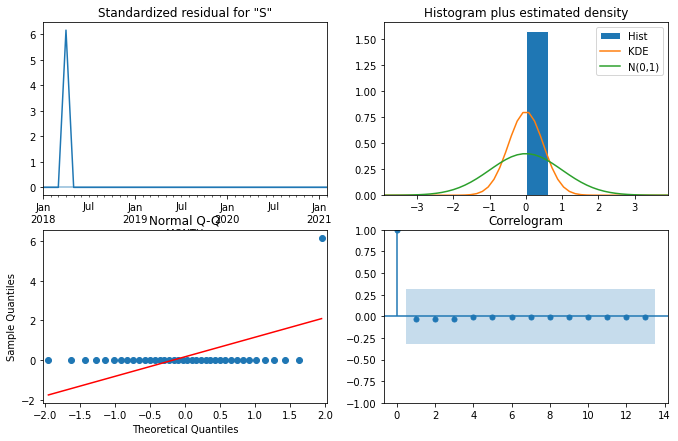

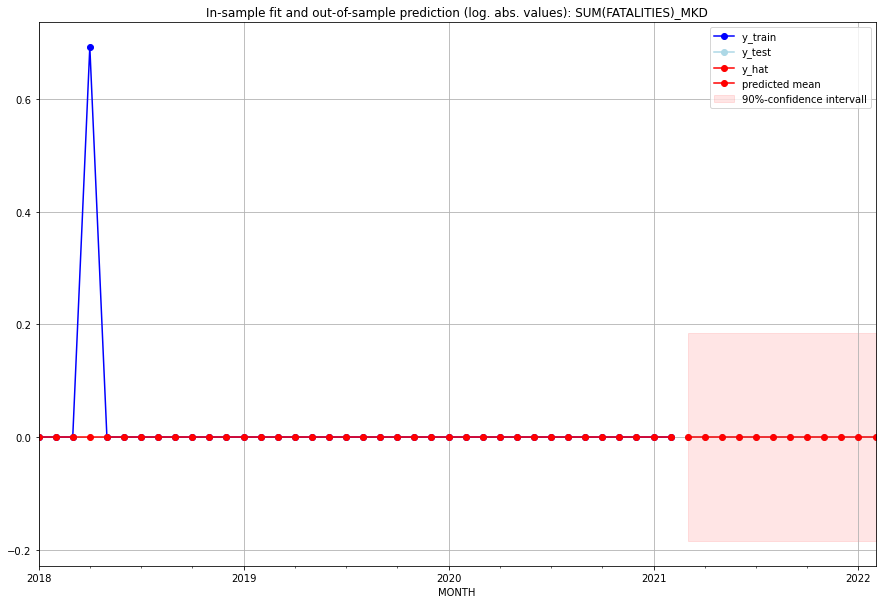

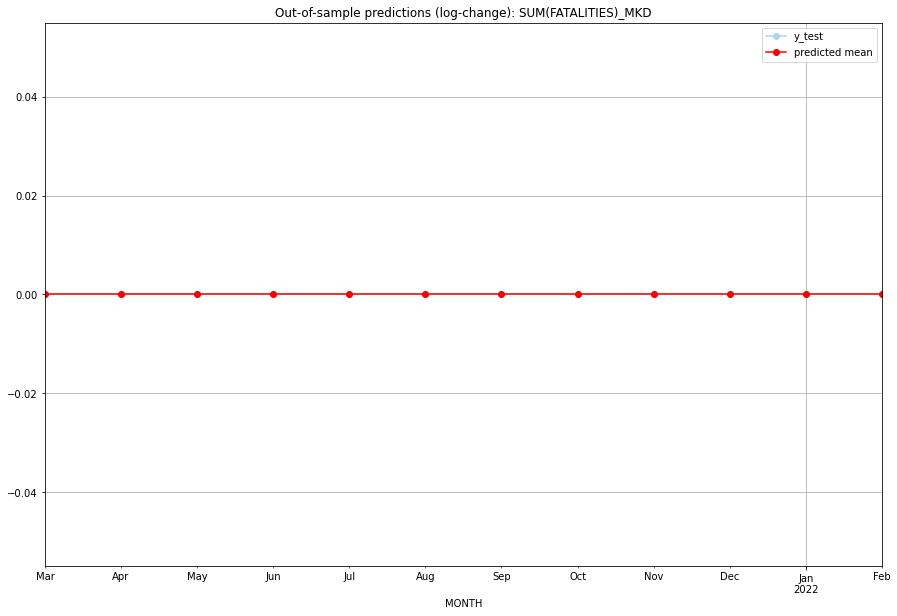

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MKD   
1  2021-04-01       0.0         0.0           0.0             0.0   MKD   
2  2021-05-01       0.0         0.0           0.0             0.0   MKD   
3  2021-06-01       0.0         0.0           0.0             0.0   MKD   
4  2021-07-01       0.0         0.0           0.0             0.0   MKD   
5  2021-08-01       0.0         0.0           0.0             0.0   MKD   
6  2021-09-01       0.0         0.0           0.0             0.0   MKD   
7  2021-10-01       0.0         0.0           0.0             0.0   MKD   
8  2021-11-01       0.0         0.0           0.0             0.0   MKD   
9  2021-12-01       0.0         0.0           0.0             0.0   MKD   
10 2022-01-01       0.0         0.0           0.0             0.0   MKD   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 0), (2, 0, 1, 12), 'n'], 'cv_score': 0.503414052420004, 'fold_results': [0.5750388997520791, 0.4618061513576012, 0.3764378408860048, 0.5652187693136312, 0.538568600790704]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_MLI   No. Observations:                  289
Model:             SARIMAX(0, 1, 0)x(2, 0, [1], 12)   Log Likelihood                -469.408
Date:                              Fri, 21 Oct 2022   AIC                            946.816
Time:                                      15:10:56   BIC                            961.468
Sample:                                  02-28-1997   HQIC                           952.688
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef   

<Figure size 432x288 with 0 Axes>

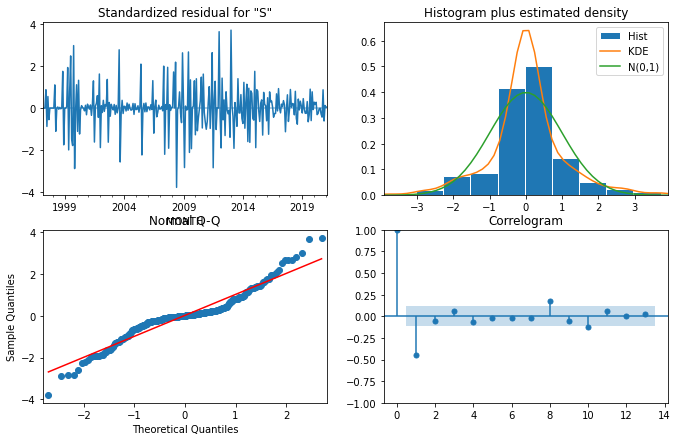

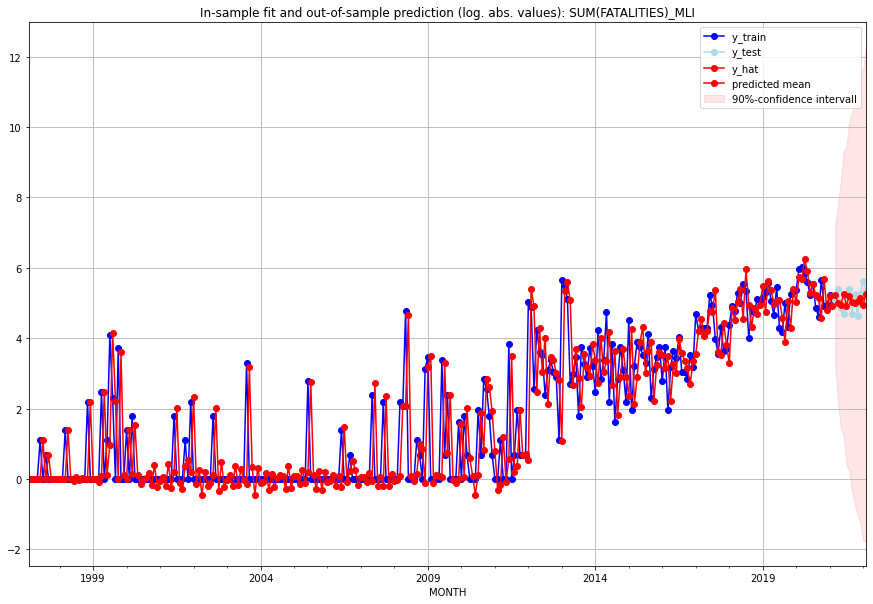

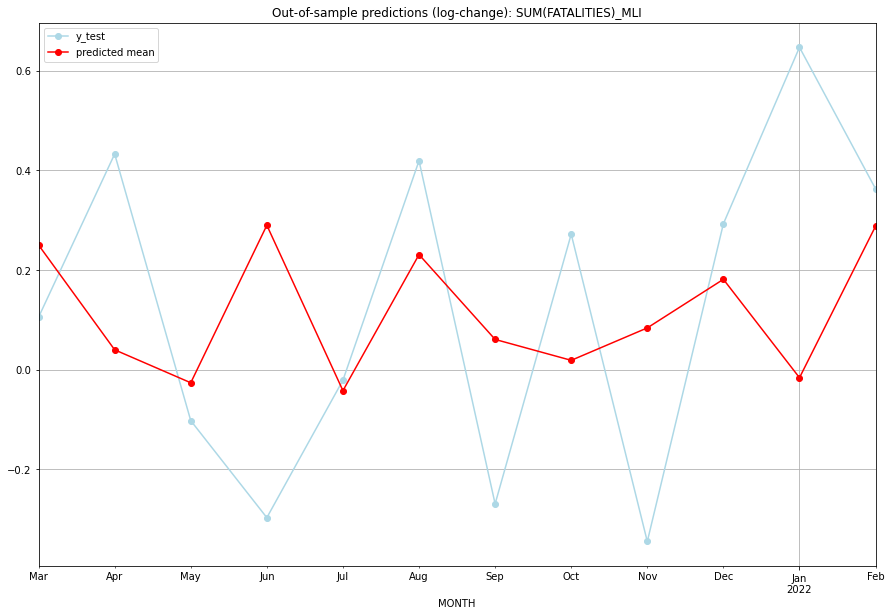

TADDA: 0.3101523436835339
Evaluation finished.
        MONTH    FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  183.929429       159.0      0.250161        0.105361   MLI   
1  2021-04-01  148.854297       221.0      0.039850        0.432864   MLI   
2  2021-05-01  139.264304       129.0     -0.026285       -0.102279   MLI   
3  2021-06-01  191.405692       106.0      0.289793       -0.296984   MLI   
4  2021-07-01  137.063585       140.0     -0.042099       -0.021053   MLI   
5  2021-08-01  180.411364       218.0      0.230954        0.419258   MLI   
6  2021-09-01  152.009438       109.0      0.060686       -0.269333   MLI   
7  2021-10-01  145.724940       188.0      0.018746        0.271934   MLI   
8  2021-11-01  155.591251       101.0      0.083826       -0.344840   MLI   
9  2021-12-01  171.629388       192.0      0.181334        0.292877   MLI   
10 2022-01-01  140.693763       274.0     -0.016145        0.646958   MLI   
11 2022-02-01  191.057583    

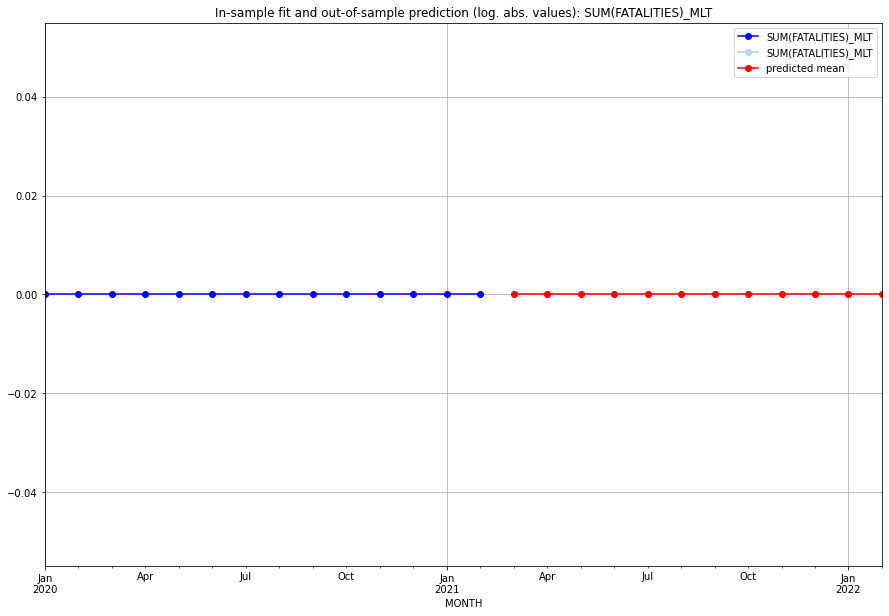

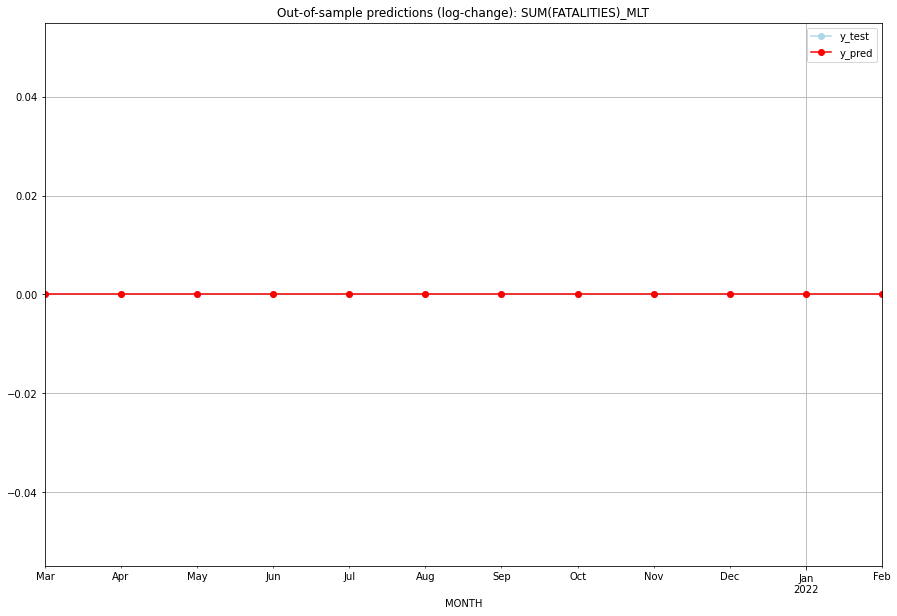

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MLT   
1  2021-04-01       0.0         0.0           0.0             0.0   MLT   
2  2021-05-01       0.0         0.0           0.0             0.0   MLT   
3  2021-06-01       0.0         0.0           0.0             0.0   MLT   
4  2021-07-01       0.0         0.0           0.0             0.0   MLT   
5  2021-08-01       0.0         0.0           0.0             0.0   MLT   
6  2021-09-01       0.0         0.0           0.0             0.0   MLT   
7  2021-10-01       0.0         0.0           0.0             0.0   MLT   
8  2021-11-01       0.0         0.0           0.0             0.0   MLT   
9  2021-12-01       0.0         0.0           0.0             0.0   MLT   
10 2022-01-01       0.0         0.0           0.0             0.0   MLT   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (3, 0, 1), (2, 0, 1, 12), 'n'], 'cv_score': 0.8980762633174076, 'fold_results': [1.111857434944871, 0.8849066557035119, 0.7883303301921639, nan, 0.8072106324290838]}
Training finished.
                                     SARIMAX Results                                      
Dep. Variable:                SUM(FATALITIES)_MMR   No. Observations:                  134
Model:             SARIMAX(3, 0, 1)x(2, 0, 1, 12)   Log Likelihood                -183.100
Date:                            Fri, 21 Oct 2022   AIC                            386.201
Time:                                    15:17:00   BIC                            415.179
Sample:                                01-31-2010   HQIC                           397.977
                                     - 02-28-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|

<Figure size 432x288 with 0 Axes>

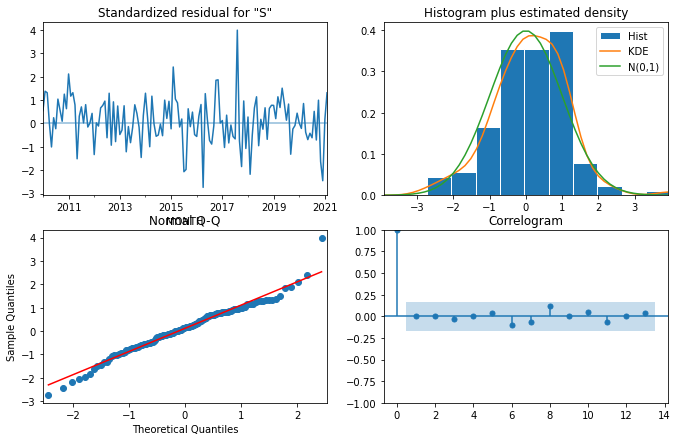

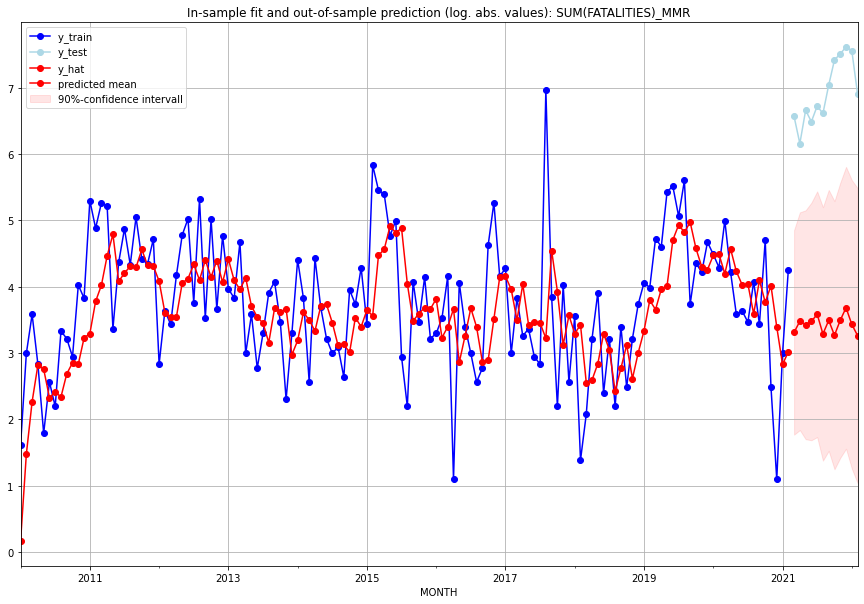

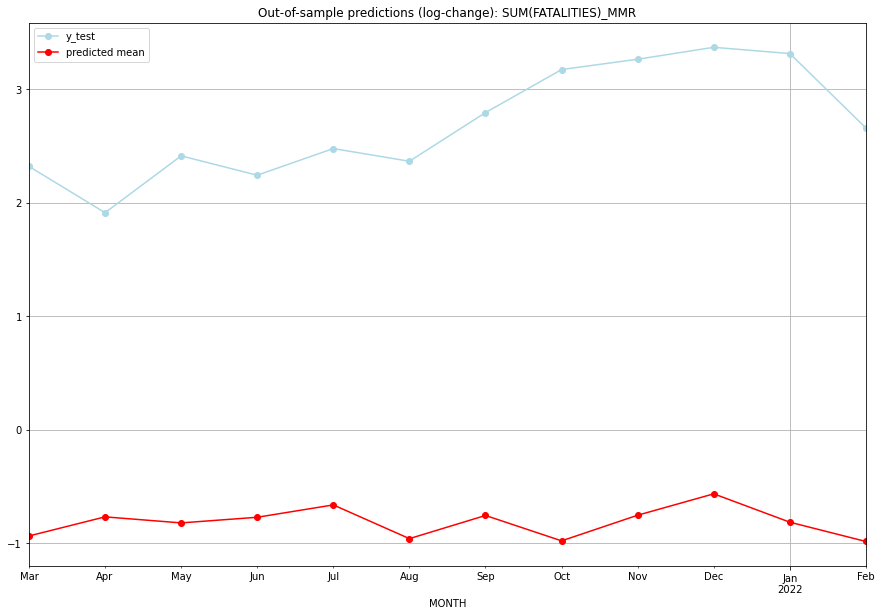

TADDA: 4.317878541772379
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  26.458803       710.0     -0.935808        2.318177   MMR   
1  2021-04-01  31.489037       472.0     -0.767593        1.910600   MMR   
2  2021-05-01  29.808448       779.0     -0.820706        2.410799   MMR   
3  2021-06-01  31.372882       657.0     -0.771174        2.240710   MMR   
4  2021-07-01  35.096285       831.0     -0.662305        2.475337   MMR   
5  2021-08-01  25.822131       743.0     -0.959268        2.363546   MMR   
6  2021-09-01  31.889550      1141.0     -0.755340        2.792041   MMR   
7  2021-10-01  25.301640      1667.0     -0.978864        3.170885   MMR   
8  2021-11-01  31.966901      1826.0     -0.752991        3.261935   MMR   
9  2021-12-01  38.791456      2028.0     -0.564843        3.366803   MMR   
10 2022-01-01  29.997177      1919.0     -0.814599        3.311585   MMR   
11 2022-02-01  25.155338       996.0     -

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.0, 'fold_results': [0.0, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_MNE   No. Observations:                   38
Model:                         SARIMAX   Log Likelihood                  15.952
Date:                 Fri, 21 Oct 2022   AIC                            -29.904
Time:                         15:18:12   BIC                            -28.267
Sample:                     01-31-2018   HQIC                           -29.322
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0253      0.002     13.077      0.000       0.021       

<Figure size 432x288 with 0 Axes>

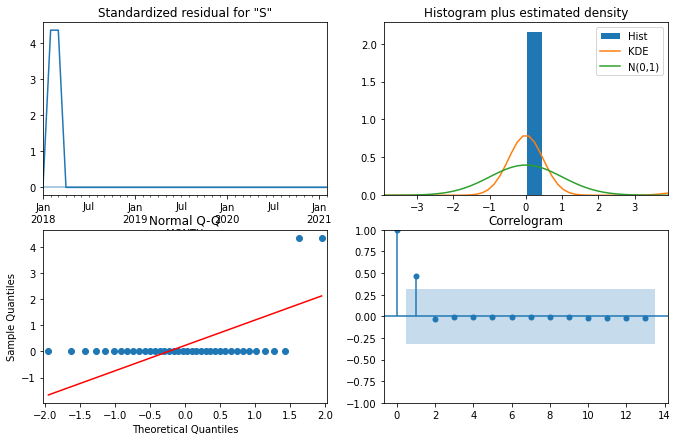

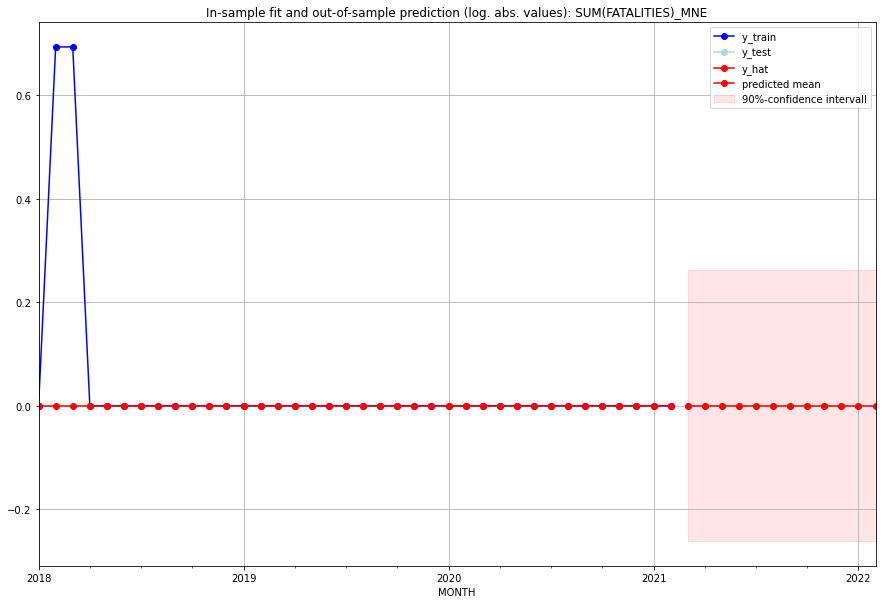

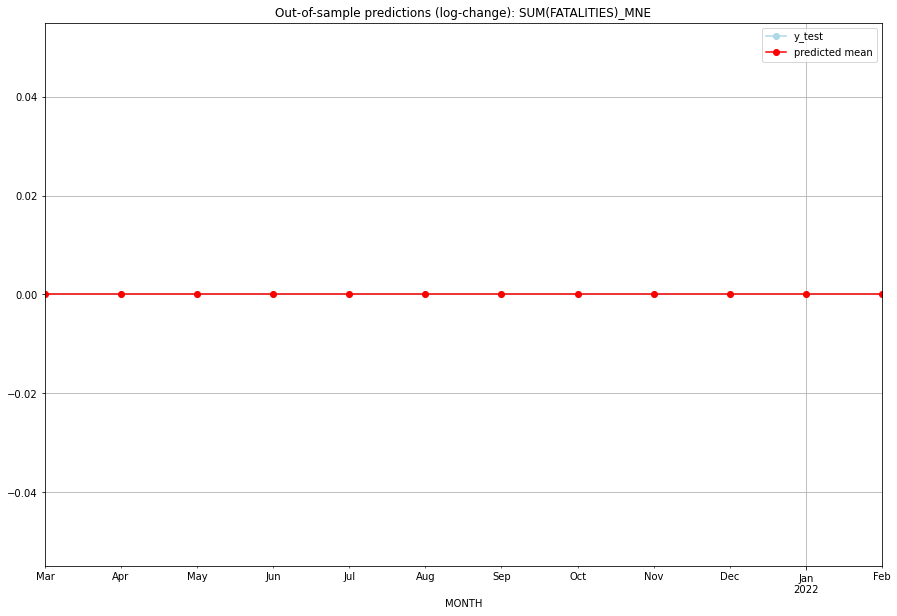

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MNE   
1  2021-04-01       0.0         0.0           0.0             0.0   MNE   
2  2021-05-01       0.0         0.0           0.0             0.0   MNE   
3  2021-06-01       0.0         0.0           0.0             0.0   MNE   
4  2021-07-01       0.0         0.0           0.0             0.0   MNE   
5  2021-08-01       0.0         0.0           0.0             0.0   MNE   
6  2021-09-01       0.0         0.0           0.0             0.0   MNE   
7  2021-10-01       0.0         0.0           0.0             0.0   MNE   
8  2021-11-01       0.0         0.0           0.0             0.0   MNE   
9  2021-12-01       0.0         0.0           0.0             0.0   MNE   
10 2022-01-01       0.0         0.0           0.0             0.0   MNE   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.0, 'fold_results': [0.0, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_MNG   No. Observations:                   38
Model:                         SARIMAX   Log Likelihood                  29.122
Date:                 Fri, 21 Oct 2022   AIC                            -56.244
Time:                         15:19:19   BIC                            -54.606
Sample:                     01-31-2018   HQIC                           -55.661
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0126      0.001     18.748      0.000       0.011       

<Figure size 432x288 with 0 Axes>

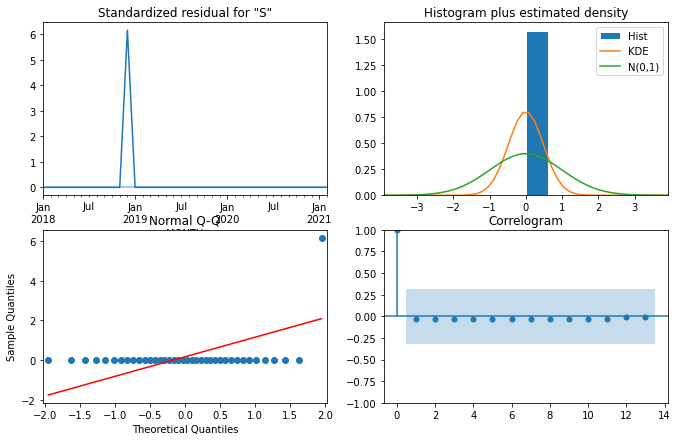

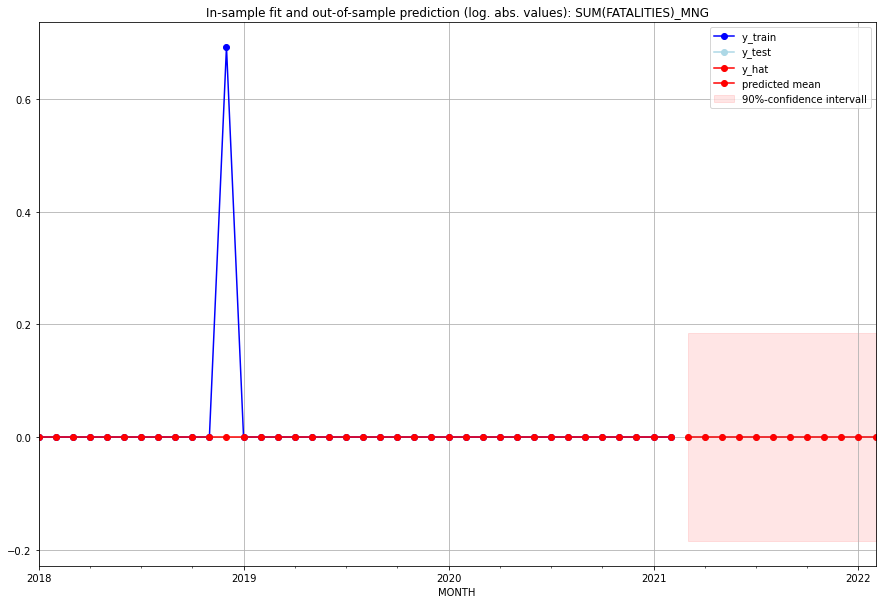

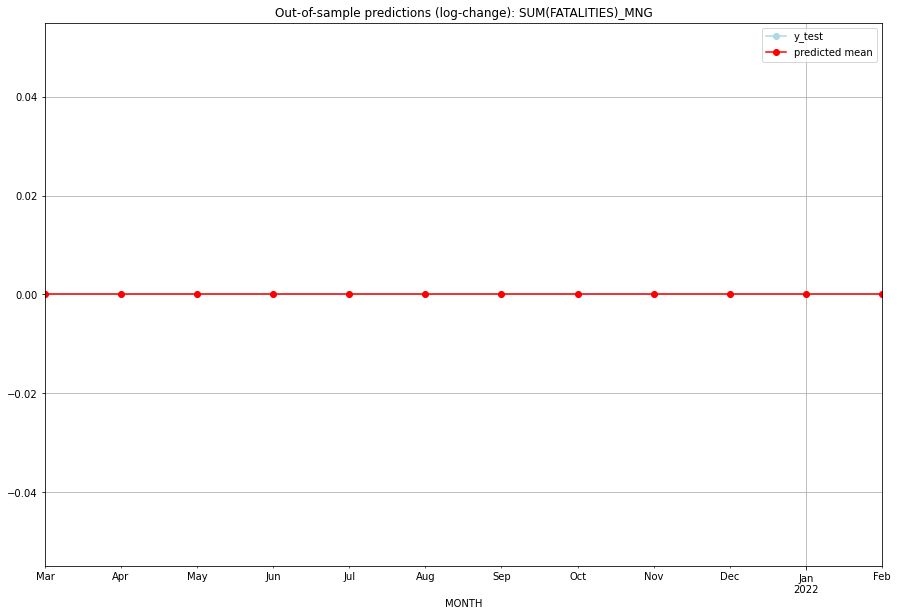

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MNG   
1  2021-04-01       0.0         0.0           0.0             0.0   MNG   
2  2021-05-01       0.0         0.0           0.0             0.0   MNG   
3  2021-06-01       0.0         0.0           0.0             0.0   MNG   
4  2021-07-01       0.0         0.0           0.0             0.0   MNG   
5  2021-08-01       0.0         0.0           0.0             0.0   MNG   
6  2021-09-01       0.0         0.0           0.0             0.0   MNG   
7  2021-10-01       0.0         0.0           0.0             0.0   MNG   
8  2021-11-01       0.0         0.0           0.0             0.0   MNG   
9  2021-12-01       0.0         0.0           0.0             0.0   MNG   
10 2022-01-01       0.0         0.0           0.0             0.0   MNG   
11 2022-02-01       0.0         0.0           0.0             0.0   

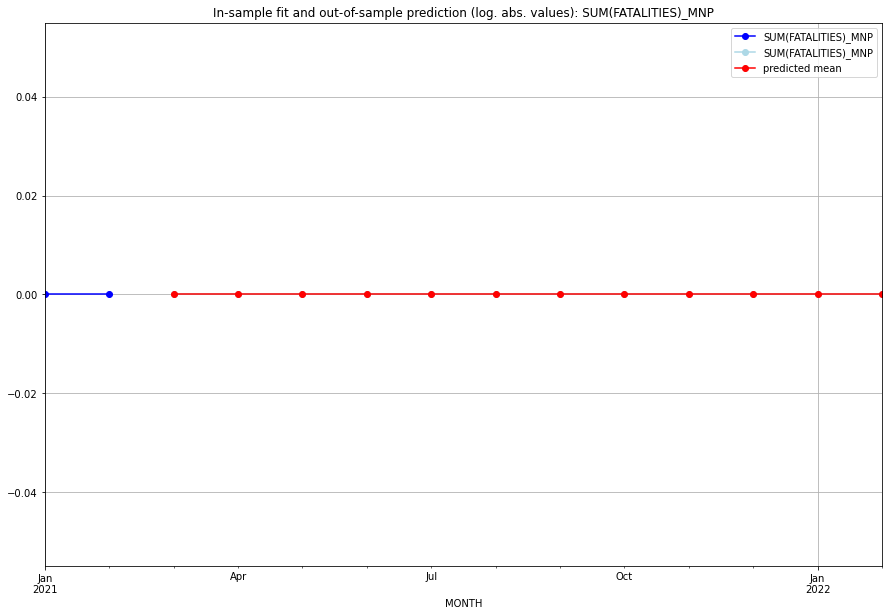

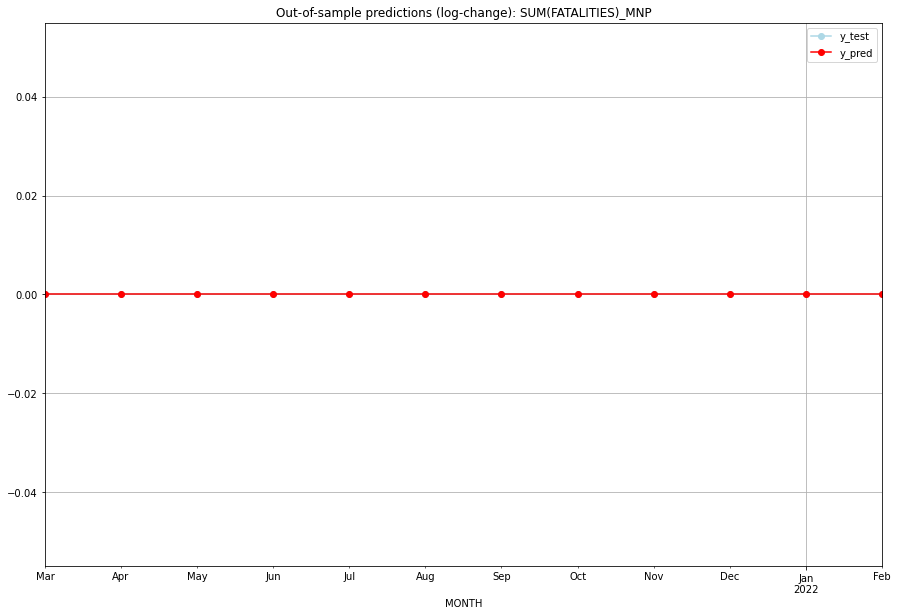

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MNP   
1  2021-04-01       0.0         0.0           0.0             0.0   MNP   
2  2021-05-01       0.0         0.0           0.0             0.0   MNP   
3  2021-06-01       0.0         0.0           0.0             0.0   MNP   
4  2021-07-01       0.0         0.0           0.0             0.0   MNP   
5  2021-08-01       0.0         0.0           0.0             0.0   MNP   
6  2021-09-01       0.0         0.0           0.0             0.0   MNP   
7  2021-10-01       0.0         0.0           0.0             0.0   MNP   
8  2021-11-01       0.0         0.0           0.0             0.0   MNP   
9  2021-12-01       0.0         0.0           0.0             0.0   MNP   
10 2022-01-01       0.0         0.0           0.0             0.0   MNP   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.7742585088447526, 'fold_results': [0.9449691432819655, 0.4057465418928771, 0.8721193983763252, 0.8250088365655817, 0.8234486241070136]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_MOZ   No. Observations:                  289
Model:                SARIMAX(0, 1, 0)   Log Likelihood                -347.135
Date:                 Fri, 21 Oct 2022   AIC                            696.270
Time:                         15:31:05   BIC                            699.933
Sample:                     02-28-1997   HQIC                           697.738
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------

<Figure size 432x288 with 0 Axes>

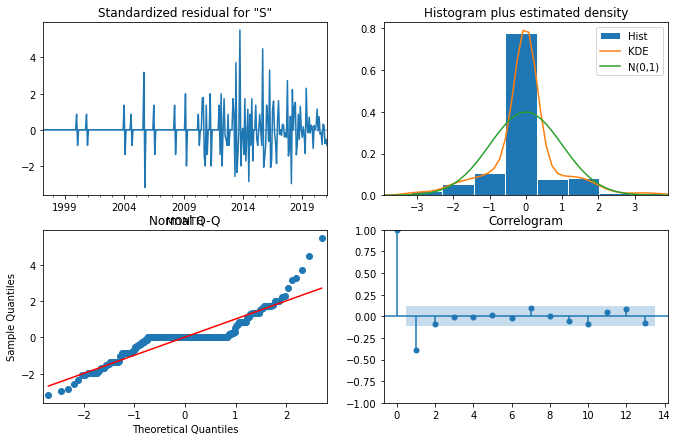

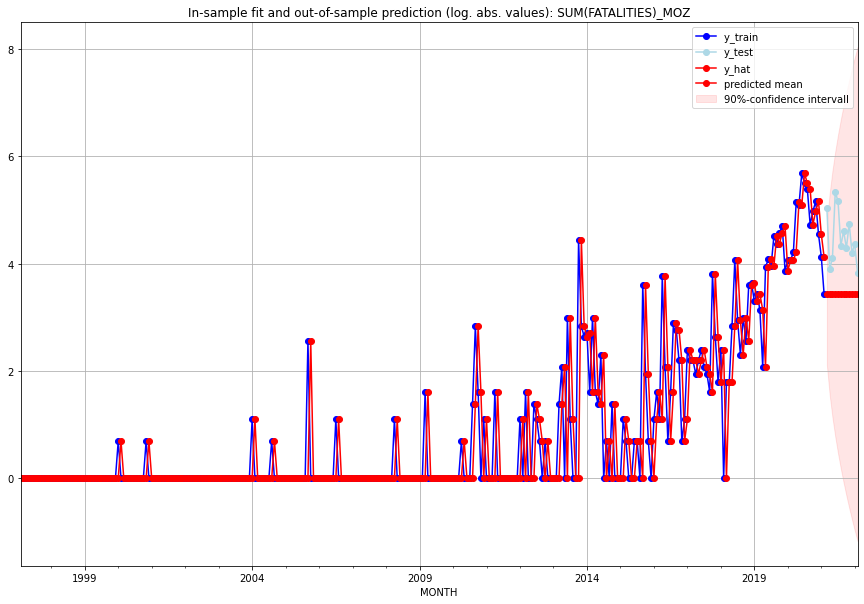

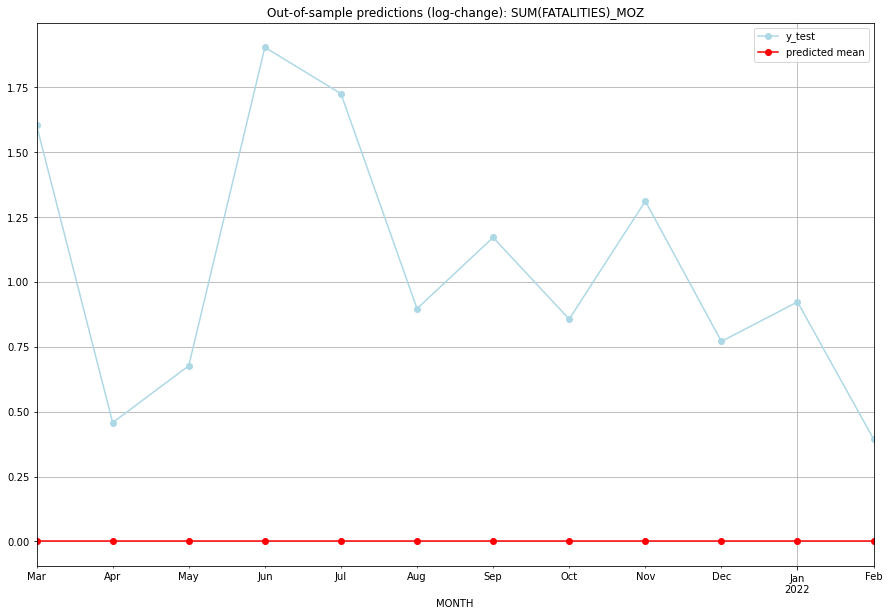

TADDA: 1.0574776356789486
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01      30.0       153.0 -4.440892e-16        1.602965   MOZ   
1  2021-04-01      30.0        48.0 -4.440892e-16        0.457833   MOZ   
2  2021-05-01      30.0        60.0 -4.440892e-16        0.676887   MOZ   
3  2021-06-01      30.0       207.0 -4.440892e-16        1.903551   MOZ   
4  2021-07-01      30.0       173.0 -4.440892e-16        1.725068   MOZ   
5  2021-08-01      30.0        75.0 -4.440892e-16        0.896746   MOZ   
6  2021-09-01      30.0        99.0 -4.440892e-16        1.171183   MOZ   
7  2021-10-01      30.0        72.0 -4.440892e-16        0.856472   MOZ   
8  2021-11-01      30.0       114.0 -4.440892e-16        1.310945   MOZ   
9  2021-12-01      30.0        66.0 -4.440892e-16        0.770705   MOZ   
10 2022-01-01      30.0        77.0 -4.440892e-16        0.922722   MOZ   
11 2022-02-01      30.0        45.0 -4.440892e-16    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.14255553730053516, 'fold_results': [0.0, 0.09155102405567582, 0.1493132891023379, 0.1493132891023379, 0.3226000842423242]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_MRT   No. Observations:                  289
Model:                         SARIMAX   Log Likelihood                -214.031
Date:                 Fri, 21 Oct 2022   AIC                            430.061
Time:                         15:43:49   BIC                            433.728
Sample:                     02-28-1997   HQIC                           431.530
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------

<Figure size 432x288 with 0 Axes>

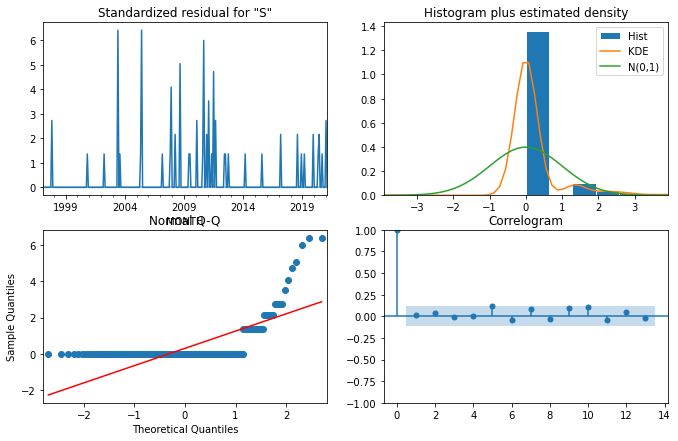

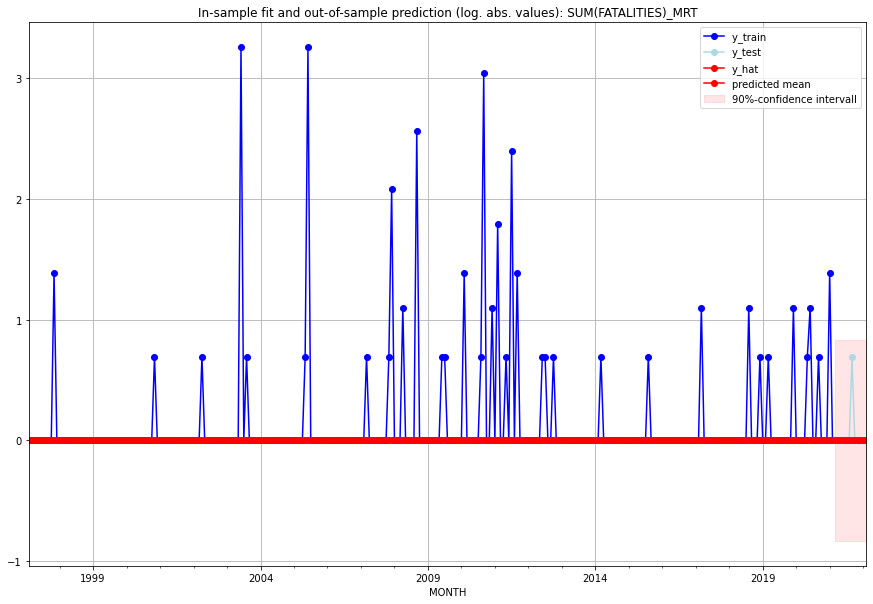

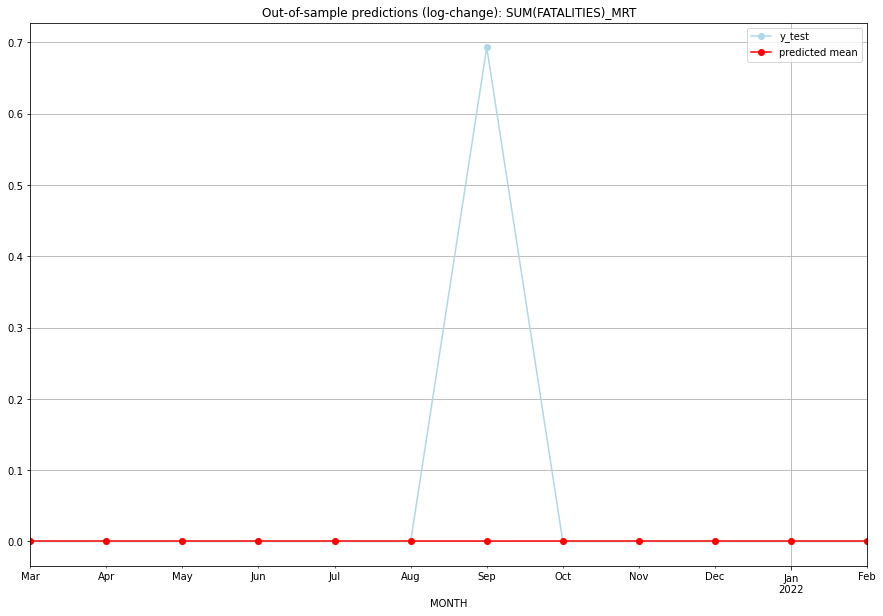

TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0        0.000000   MRT   
1  2021-04-01       0.0         0.0           0.0        0.000000   MRT   
2  2021-05-01       0.0         0.0           0.0        0.000000   MRT   
3  2021-06-01       0.0         0.0           0.0        0.000000   MRT   
4  2021-07-01       0.0         0.0           0.0        0.000000   MRT   
5  2021-08-01       0.0         0.0           0.0        0.000000   MRT   
6  2021-09-01       0.0         1.0           0.0        0.693147   MRT   
7  2021-10-01       0.0         0.0           0.0        0.000000   MRT   
8  2021-11-01       0.0         0.0           0.0        0.000000   MRT   
9  2021-12-01       0.0         0.0           0.0        0.000000   MRT   
10 2022-01-01       0.0         0.0           0.0        0.000000   MRT   
11 2022-02-01       0.0         0.0           0.0  

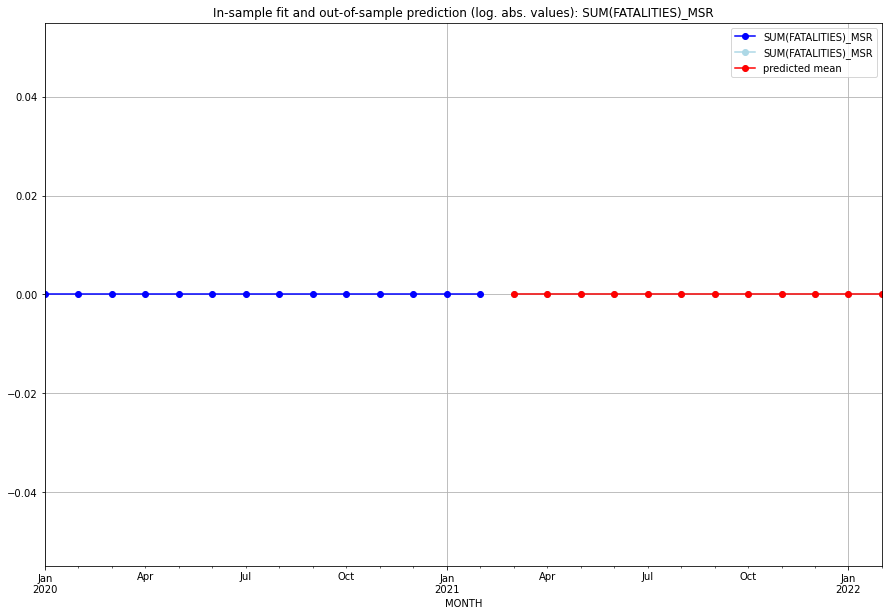

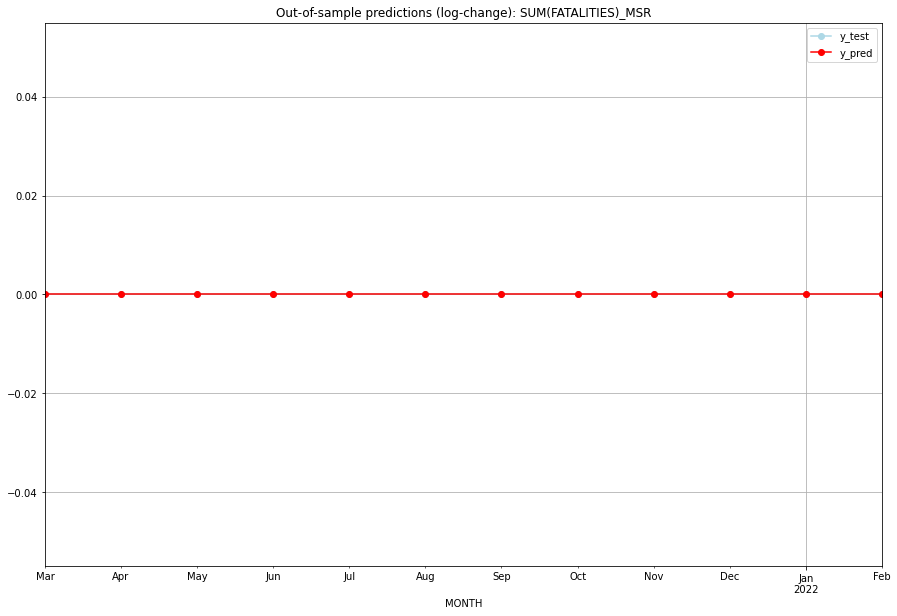

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MSR   
1  2021-04-01       0.0         0.0           0.0             0.0   MSR   
2  2021-05-01       0.0         0.0           0.0             0.0   MSR   
3  2021-06-01       0.0         0.0           0.0             0.0   MSR   
4  2021-07-01       0.0         0.0           0.0             0.0   MSR   
5  2021-08-01       0.0         0.0           0.0             0.0   MSR   
6  2021-09-01       0.0         0.0           0.0             0.0   MSR   
7  2021-10-01       0.0         0.0           0.0             0.0   MSR   
8  2021-11-01       0.0         0.0           0.0             0.0   MSR   
9  2021-12-01       0.0         0.0           0.0             0.0   MSR   
10 2022-01-01       0.0         0.0           0.0             0.0   MSR   
11 2022-02-01       0.0         0.0           0.0             0.0   

<Figure size 432x288 with 0 Axes>

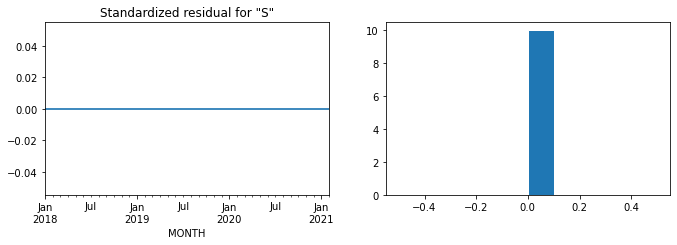

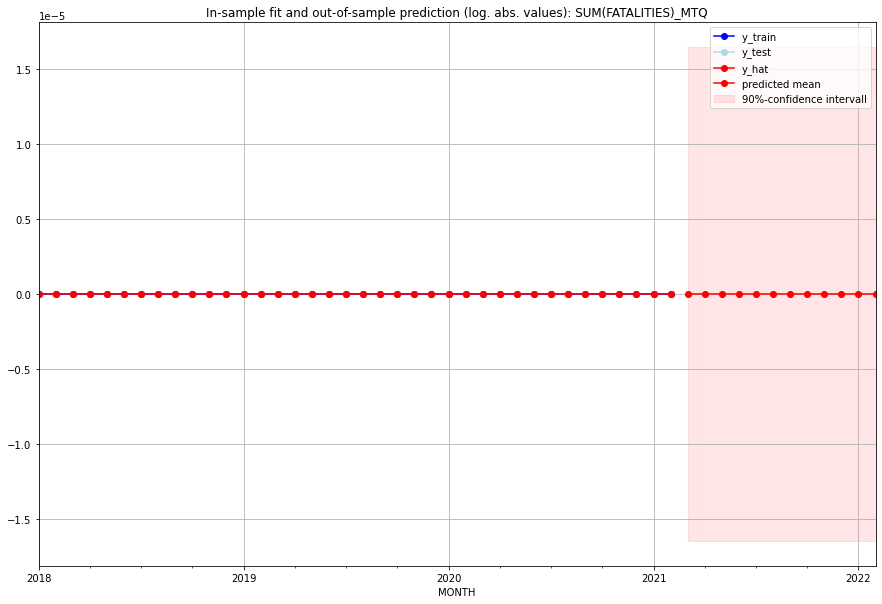

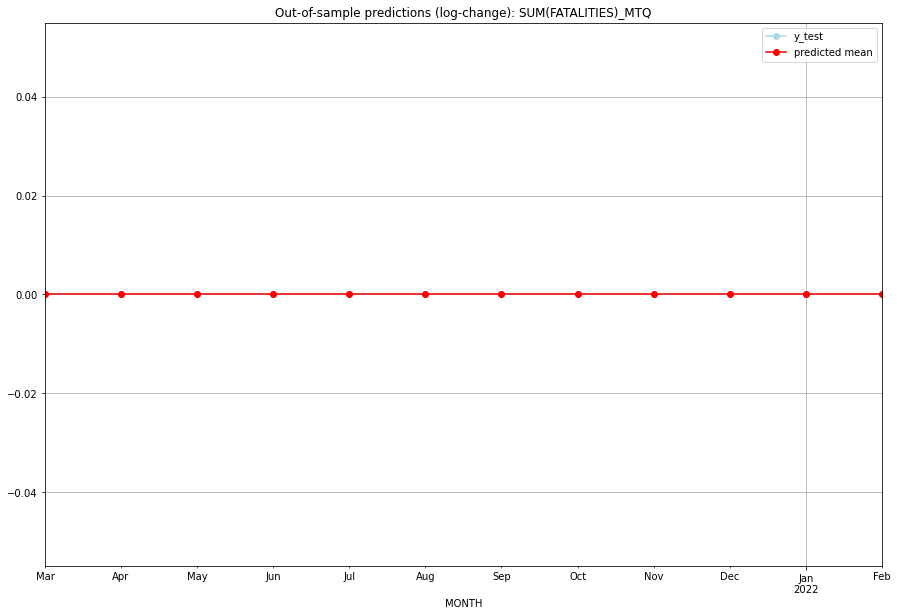

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   MTQ   
1  2021-04-01       0.0         0.0           0.0             0.0   MTQ   
2  2021-05-01       0.0         0.0           0.0             0.0   MTQ   
3  2021-06-01       0.0         0.0           0.0             0.0   MTQ   
4  2021-07-01       0.0         0.0           0.0             0.0   MTQ   
5  2021-08-01       0.0         0.0           0.0             0.0   MTQ   
6  2021-09-01       0.0         0.0           0.0             0.0   MTQ   
7  2021-10-01       0.0         0.0           0.0             0.0   MTQ   
8  2021-11-01       0.0         0.0           0.0             0.0   MTQ   
9  2021-12-01       0.0         0.0           0.0             0.0   MTQ   
10 2022-01-01       0.0         0.0           0.0             0.0   MTQ   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (3, 1, 3), (0, 1, 0, 12), 'n'], 'cv_score': 0.03465734845721061, 'fold_results': [0.0, 0.0, 0.0, 0.0, 0.17328674228605304]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_MUS   No. Observations:                  289
Model:             SARIMAX(3, 1, 3)x(0, 1, [], 12)   Log Likelihood                 397.747
Date:                             Fri, 21 Oct 2022   AIC                           -777.495
Time:                                     16:06:28   BIC                           -744.911
Sample:                                 02-28-1997   HQIC                          -764.420
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------

<Figure size 432x288 with 0 Axes>

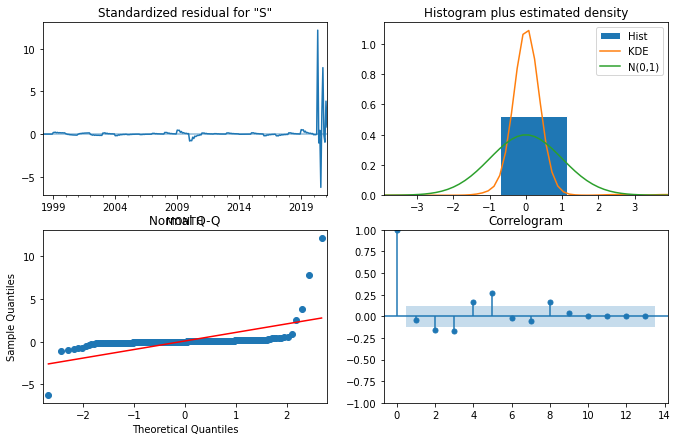

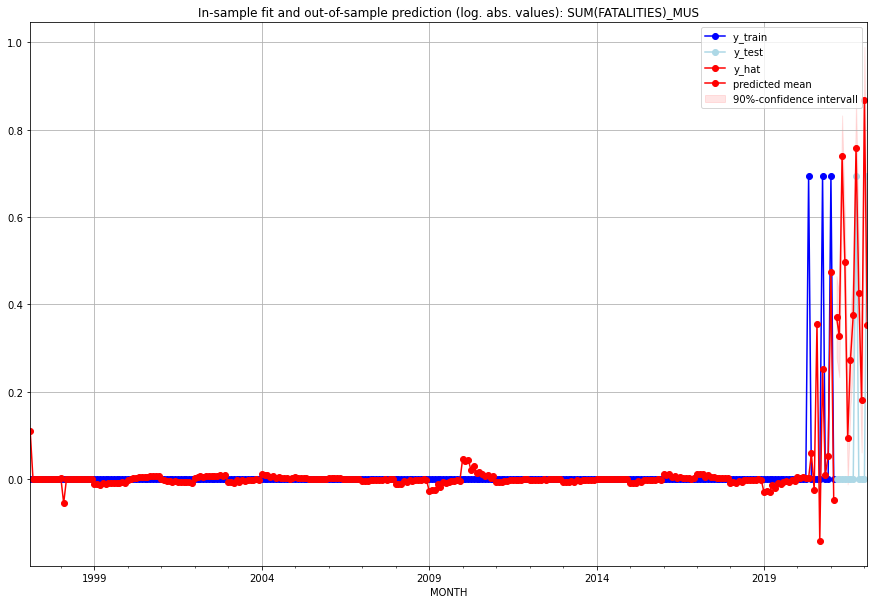

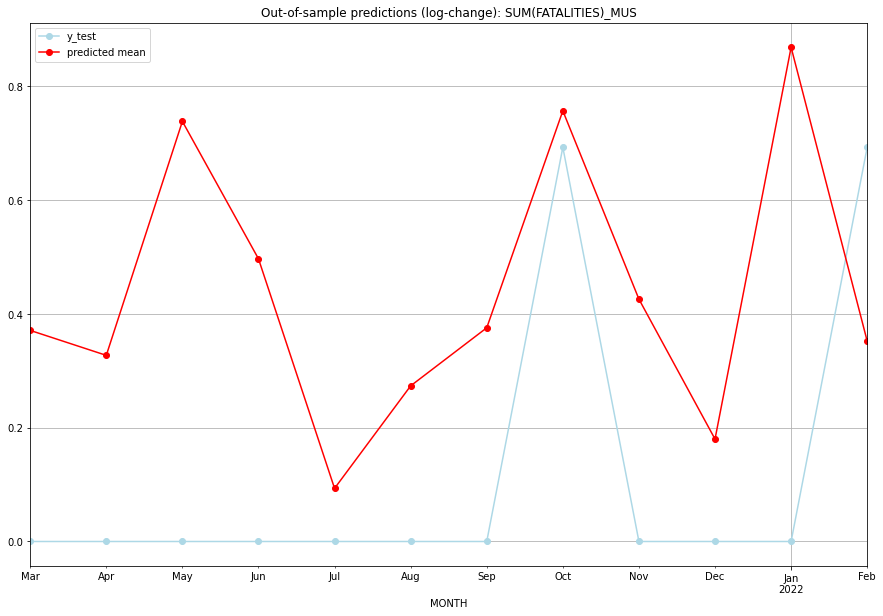

TADDA: 0.37971296746504296
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.449363         0.0      0.371124        0.000000   MUS   
1  2021-04-01  0.387166         0.0      0.327263        0.000000   MUS   
2  2021-05-01  1.093024         0.0      0.738610        0.000000   MUS   
3  2021-06-01  0.643814         0.0      0.497019        0.000000   MUS   
4  2021-07-01  0.097887         0.0      0.093387        0.000000   MUS   
5  2021-08-01  0.314720         0.0      0.273624        0.000000   MUS   
6  2021-09-01  0.456021         0.0      0.375707        0.000000   MUS   
7  2021-10-01  1.132217         1.0      0.757162        0.693147   MUS   
8  2021-11-01  0.531236         0.0      0.426075        0.000000   MUS   
9  2021-12-01  0.197266         0.0      0.180041        0.000000   MUS   
10 2022-01-01  1.384153         0.0      0.868844        0.000000   MUS   
11 2022-02-01  0.422335         1.0      0.352300   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [3, (2, 1, 1), (0, 1, 1, 12), 'n'], 'cv_score': 0.6713946994992777, 'fold_results': [0.793262916048833, 0.45633117066414175, 0.6668533876088851, 0.6394251015452918, 0.8011009216292369]}
Training finished.
                                     SARIMAX Results                                      
Dep. Variable:                SUM(FATALITIES)_MWI   No. Observations:                  289
Model:             SARIMAX(2, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -192.058
Date:                            Fri, 21 Oct 2022   AIC                            400.116
Time:                                    16:18:48   BIC                            429.079
Sample:                                02-28-1997   HQIC                           411.738
                                     - 02-28-2021                                         
Covariance Type:                              opg                                         
                 coef    std err      

<Figure size 432x288 with 0 Axes>

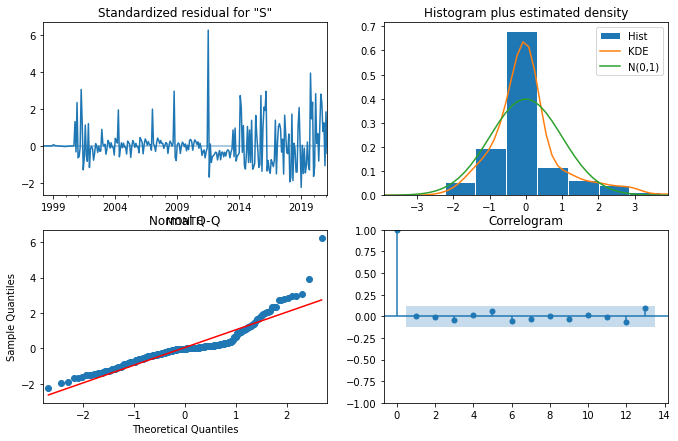

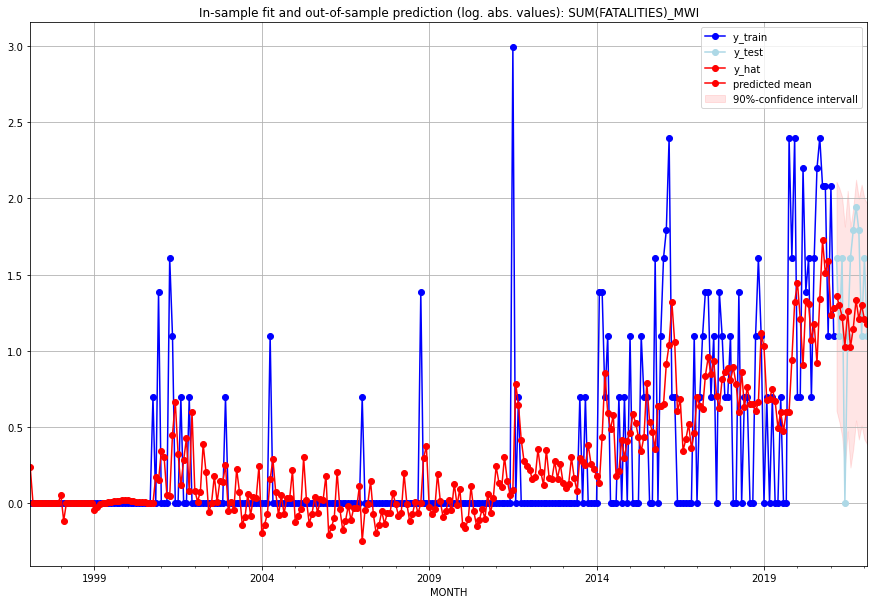

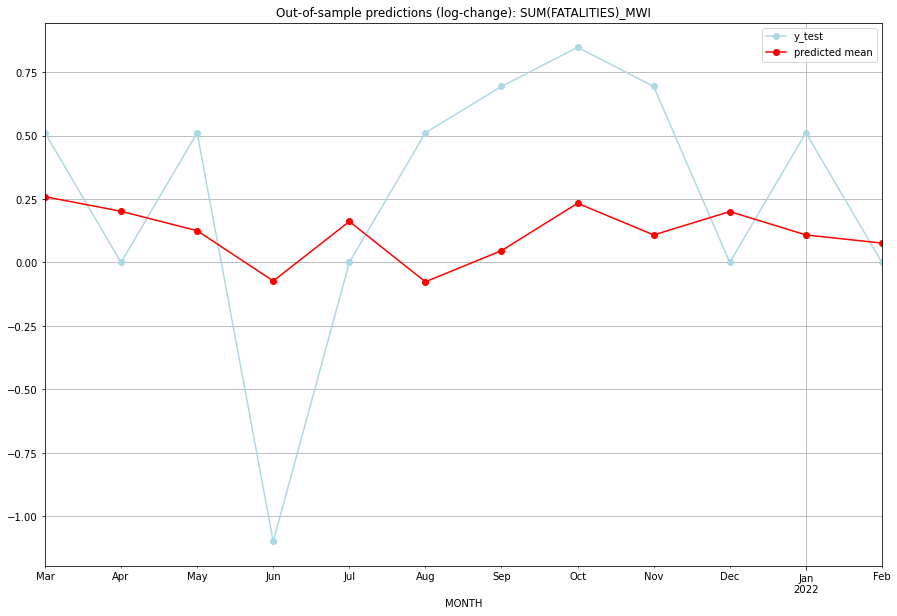

TADDA: 0.4344345831613512
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  2.887395         4.0      0.259127        0.510826   MWI   
1  2021-04-01  2.670205         2.0      0.201635        0.000000   MWI   
2  2021-05-01  2.399938         4.0      0.125145        0.510826   MWI   
3  2021-06-01  1.789405         0.0     -0.072784       -1.098612   MWI   
4  2021-07-01  2.525543         2.0      0.161422        0.000000   MWI   
5  2021-08-01  1.780685         4.0     -0.075915        0.510826   MWI   
6  2021-09-01  2.142951         5.0      0.046550        0.693147   MWI   
7  2021-10-01  2.787859         6.0      0.233189        0.847298   MWI   
8  2021-11-01  2.343987         5.0      0.108552        0.693147   MWI   
9  2021-12-01  2.665946         2.0      0.200474        0.000000   MWI   
10 2022-01-01  2.344090         4.0      0.108582        0.510826   MWI   
11 2022-02-01  2.237777         2.0      0.076275    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (1, 1, 0), (1, 1, 2, 12), 'n'], 'cv_score': 0.1348205934101309, 'fold_results': [nan, 0.1348205934101309]}
Training finished.
                                        SARIMAX Results                                        
Dep. Variable:                     SUM(FATALITIES)_MYS   No. Observations:                   38
Model:             SARIMAX(1, 1, 0)x(1, 1, [1, 2], 12)   Log Likelihood                 -23.368
Date:                                 Fri, 21 Oct 2022   AIC                             60.736
Time:                                         16:20:07   BIC                             69.268
Sample:                                     01-31-2018   HQIC                            63.103
                                          - 02-28-2021                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0

<Figure size 432x288 with 0 Axes>

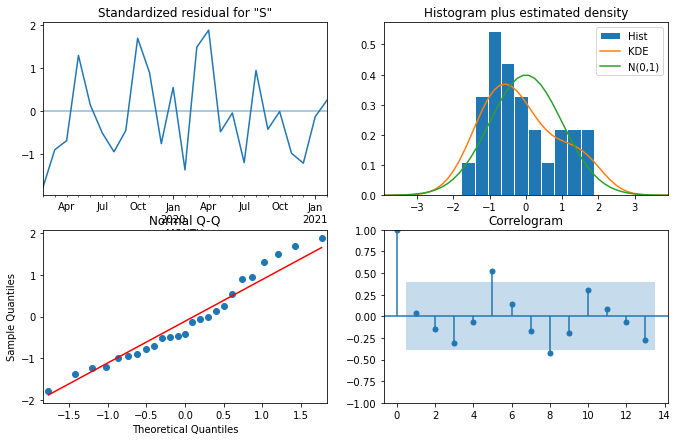

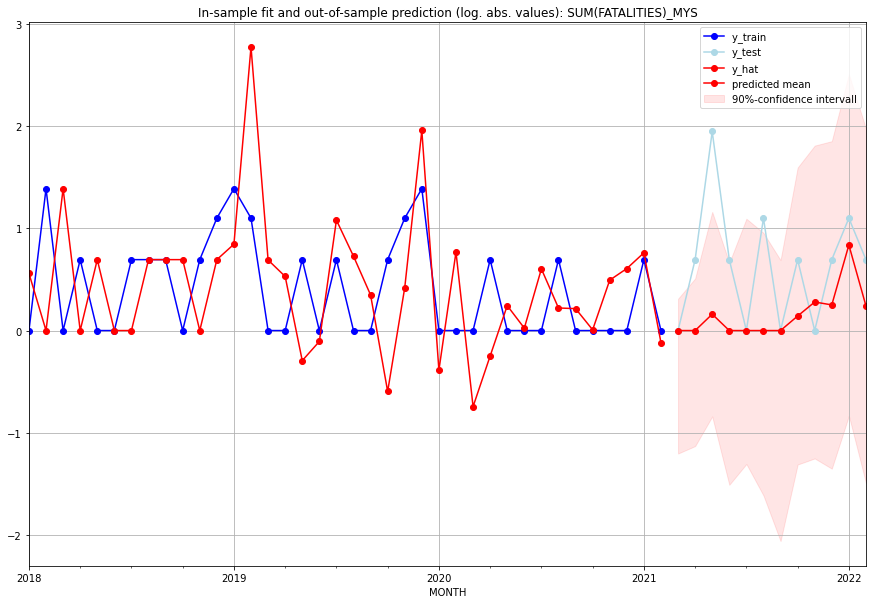

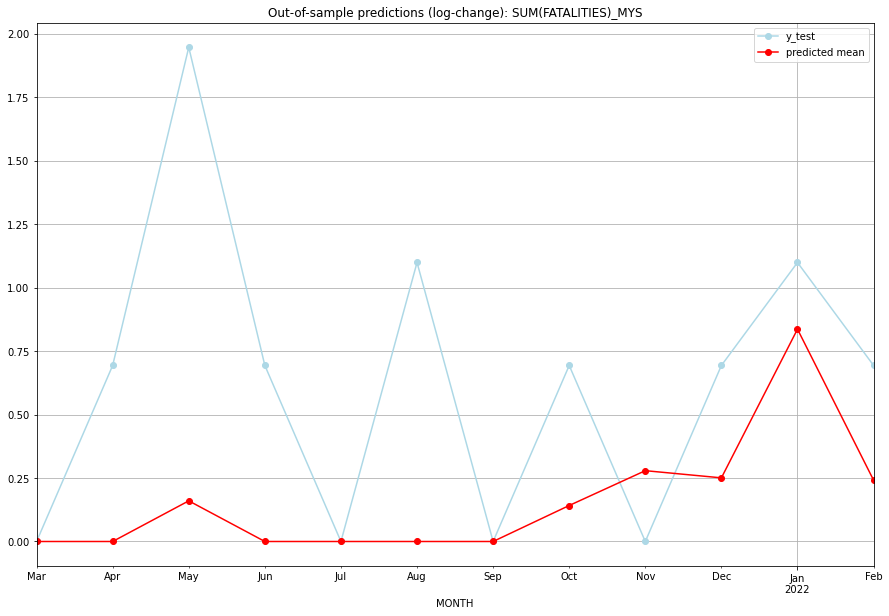

TADDA: 0.5214906696967399
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.000000         0.0      0.000000        0.000000   MYS   
1  2021-04-01  0.000000         1.0      0.000000        0.693147   MYS   
2  2021-05-01  0.173543         6.0      0.160027        1.945910   MYS   
3  2021-06-01  0.000000         1.0      0.000000        0.693147   MYS   
4  2021-07-01  0.000000         0.0      0.000000        0.000000   MYS   
5  2021-08-01  0.000000         2.0      0.000000        1.098612   MYS   
6  2021-09-01  0.000000         0.0      0.000000        0.000000   MYS   
7  2021-10-01  0.152247         1.0      0.141714        0.693147   MYS   
8  2021-11-01  0.321640         0.0      0.278874        0.000000   MYS   
9  2021-12-01  0.284752         1.0      0.250566        0.693147   MYS   
10 2022-01-01  1.307222         2.0      0.836044        1.098612   MYS   
11 2022-02-01  0.273164         1.0      0.241505    

<Figure size 432x288 with 0 Axes>

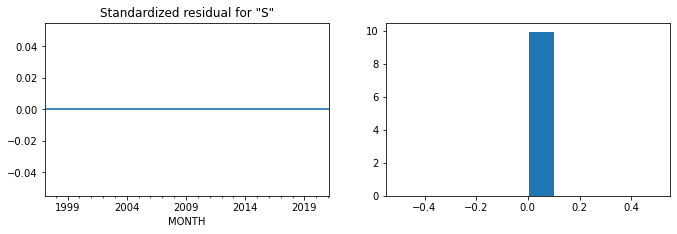

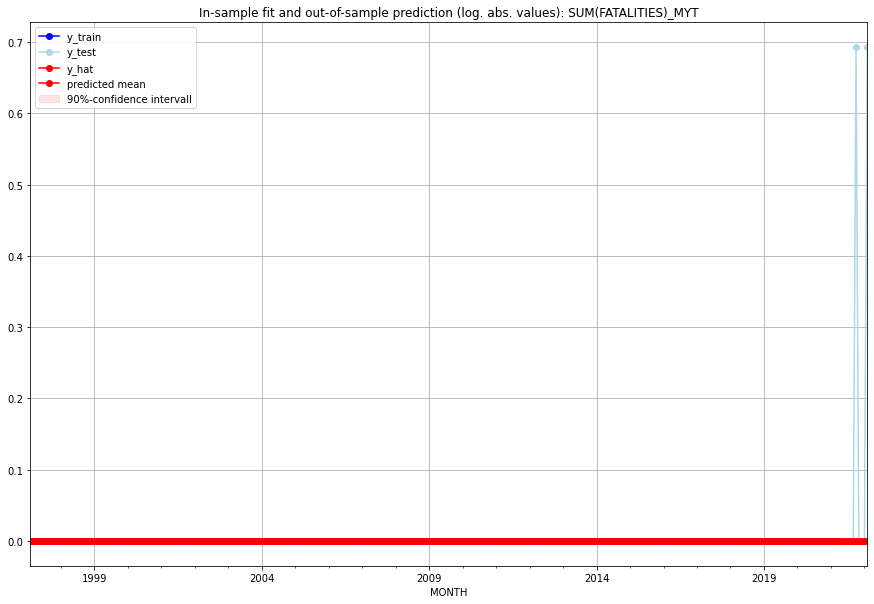

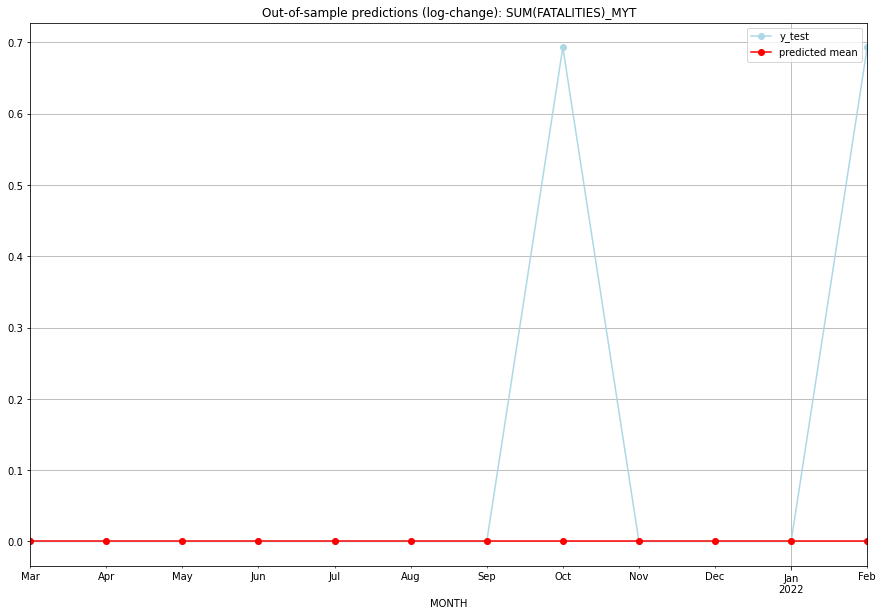

TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0        0.000000   MYT   
1  2021-04-01       0.0         0.0           0.0        0.000000   MYT   
2  2021-05-01       0.0         0.0           0.0        0.000000   MYT   
3  2021-06-01       0.0         0.0           0.0        0.000000   MYT   
4  2021-07-01       0.0         0.0           0.0        0.000000   MYT   
5  2021-08-01       0.0         0.0           0.0        0.000000   MYT   
6  2021-09-01       0.0         0.0           0.0        0.000000   MYT   
7  2021-10-01       0.0         1.0           0.0        0.693147   MYT   
8  2021-11-01       0.0         0.0           0.0        0.000000   MYT   
9  2021-12-01       0.0         0.0           0.0        0.000000   MYT   
10 2022-01-01       0.0         0.0           0.0        0.000000   MYT   
11 2022-02-01       0.0         1.0           0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.07607246985779728, 'fold_results': [0.0, 0.11552453009332421, 0.057762265046662105, 0.20707555414900003, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_NAM   No. Observations:                  289
Model:                         SARIMAX   Log Likelihood                -279.797
Date:                 Fri, 21 Oct 2022   AIC                            561.594
Time:                         16:31:24   BIC                            565.260
Sample:                     02-28-1997   HQIC                           563.063
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------

<Figure size 432x288 with 0 Axes>

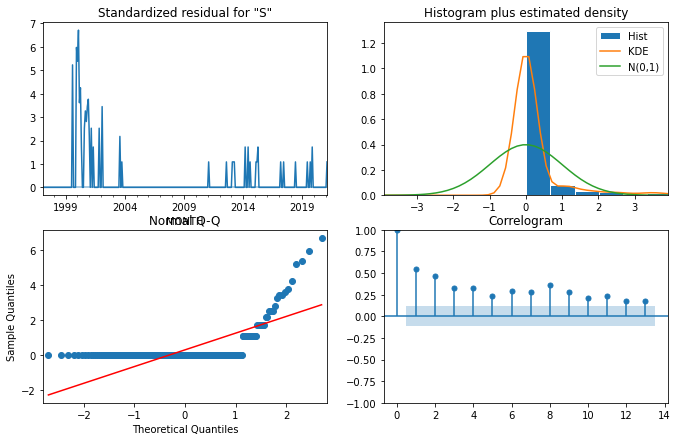

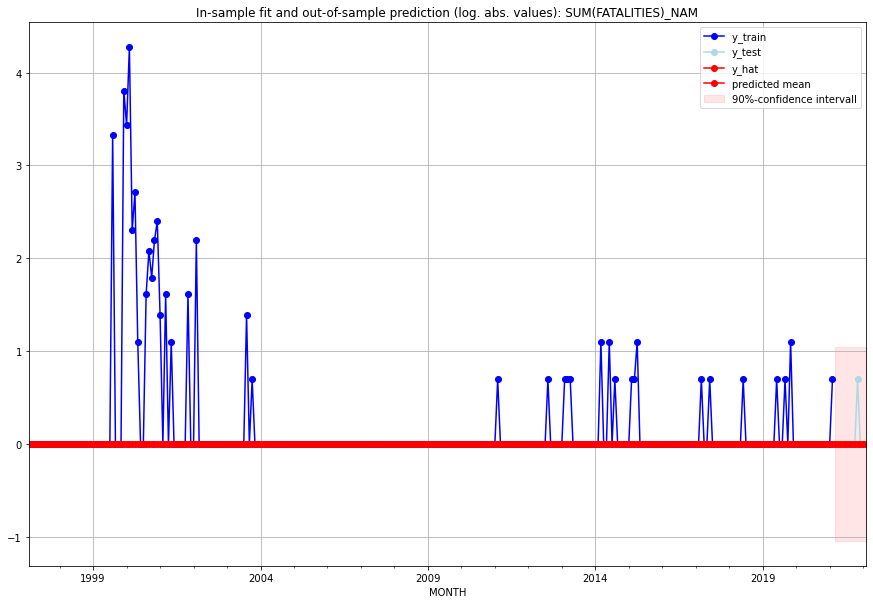

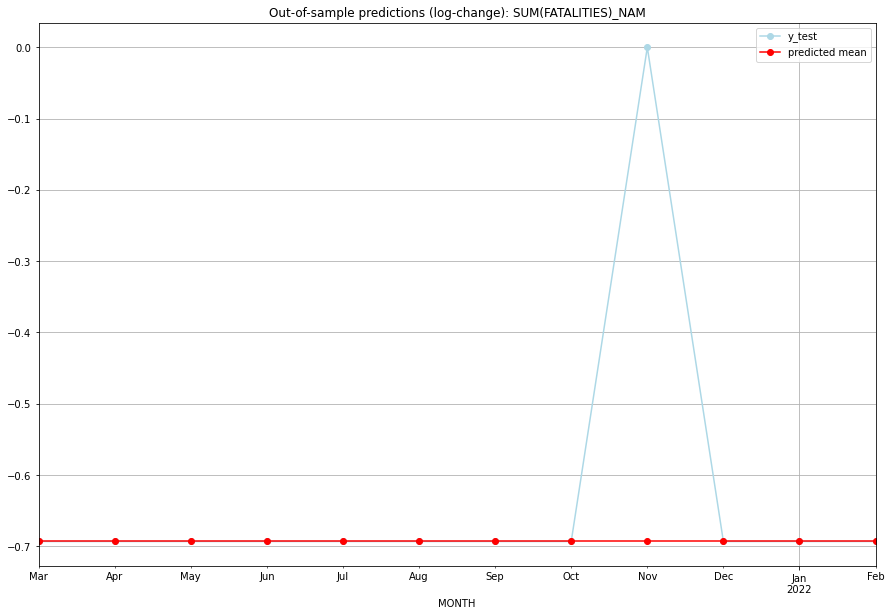

TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0     -0.693147       -0.693147   NAM   
1  2021-04-01       0.0         0.0     -0.693147       -0.693147   NAM   
2  2021-05-01       0.0         0.0     -0.693147       -0.693147   NAM   
3  2021-06-01       0.0         0.0     -0.693147       -0.693147   NAM   
4  2021-07-01       0.0         0.0     -0.693147       -0.693147   NAM   
5  2021-08-01       0.0         0.0     -0.693147       -0.693147   NAM   
6  2021-09-01       0.0         0.0     -0.693147       -0.693147   NAM   
7  2021-10-01       0.0         0.0     -0.693147       -0.693147   NAM   
8  2021-11-01       0.0         1.0     -0.693147        0.000000   NAM   
9  2021-12-01       0.0         0.0     -0.693147       -0.693147   NAM   
10 2022-01-01       0.0         0.0     -0.693147       -0.693147   NAM   
11 2022-02-01       0.0         0.0     -0.693147  

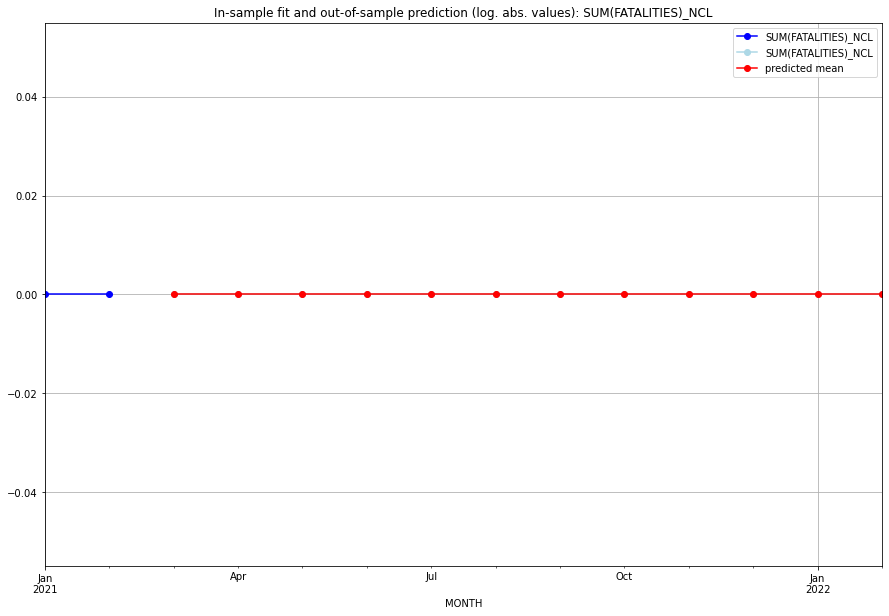

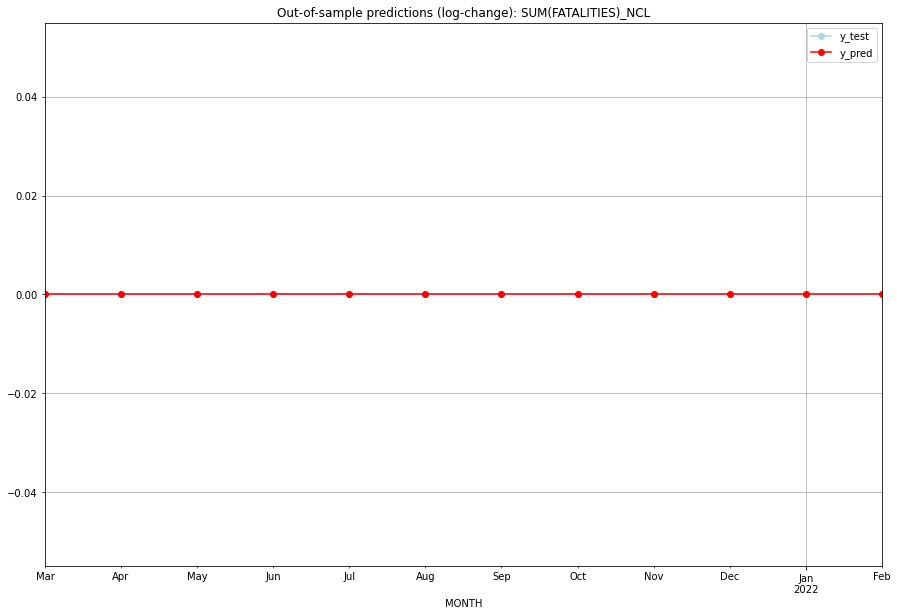

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   NCL   
1  2021-04-01       0.0         0.0           0.0             0.0   NCL   
2  2021-05-01       0.0         0.0           0.0             0.0   NCL   
3  2021-06-01       0.0         0.0           0.0             0.0   NCL   
4  2021-07-01       0.0         0.0           0.0             0.0   NCL   
5  2021-08-01       0.0         0.0           0.0             0.0   NCL   
6  2021-09-01       0.0         0.0           0.0             0.0   NCL   
7  2021-10-01       0.0         0.0           0.0             0.0   NCL   
8  2021-11-01       0.0         0.0           0.0             0.0   NCL   
9  2021-12-01       0.0         0.0           0.0             0.0   NCL   
10 2022-01-01       0.0         0.0           0.0             0.0   NCL   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (0, 1, 1), (1, 1, 2, 12), 'n'], 'cv_score': 1.0041741829917605, 'fold_results': [0.9245965032010082, 1.0970330447465273, 1.0234322237135007, 1.1113332819691724, 0.8644758613285942]}
Training finished.
                                        SARIMAX Results                                        
Dep. Variable:                     SUM(FATALITIES)_NER   No. Observations:                  289
Model:             SARIMAX(0, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood                -438.466
Date:                                 Fri, 21 Oct 2022   AIC                            888.933
Time:                                         16:41:54   BIC                            910.655
Sample:                                     02-28-1997   HQIC                           897.650
                                          - 02-28-2021                                         
Covariance Type:                                   opg                                        

<Figure size 432x288 with 0 Axes>

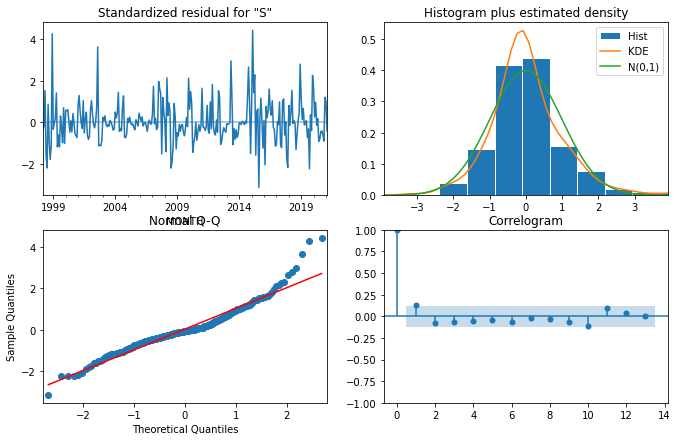

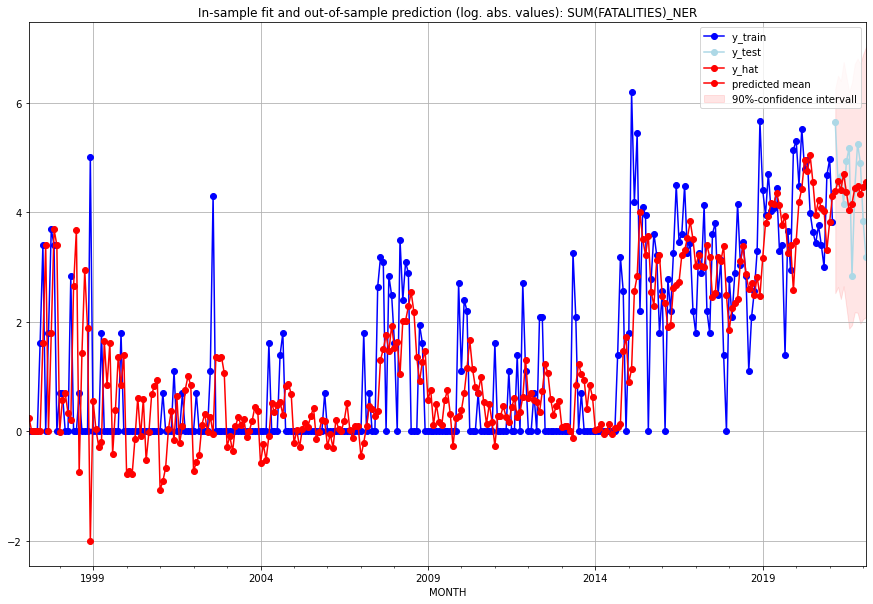

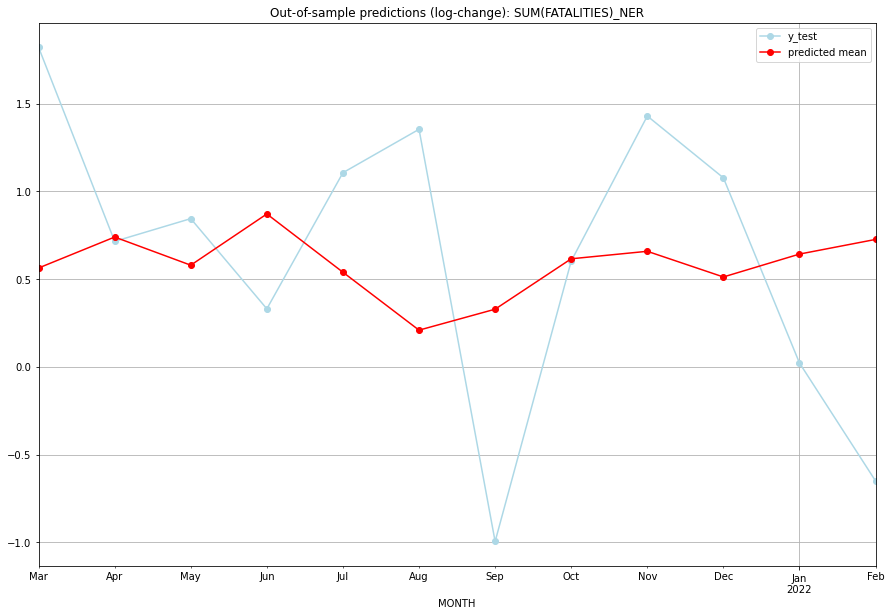

TADDA: 0.79354484848299
Evaluation finished.
        MONTH    FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01   79.761312       283.0      0.562857        1.820333   NER   
1  2021-04-01   95.341626        93.0      0.739259        0.714653   NER   
2  2021-05-01   81.067636       106.0      0.578902        0.844187   NER   
3  2021-06-01  108.883539        63.0      0.870780        0.330242   NER   
4  2021-07-01   77.839136       138.0      0.538768        1.105833   NER   
5  2021-08-01   55.677691       177.0      0.208739        1.353142   NER   
6  2021-09-01   62.865201        16.0      0.328133       -0.995428   NER   
7  2021-10-01   84.113109        83.0      0.615340        0.602175   NER   
8  2021-11-01   87.826872       191.0      0.658048        1.428854   NER   
9  2021-12-01   75.740095       134.0      0.511783        1.076633   NER   
10 2022-01-01   86.430230        46.0      0.642200        0.021506   NER   
11 2022-02-01   94.042687      

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (2, 0, 0), (2, 1, 1, 12), 'n'], 'cv_score': 0.3527649252588685, 'fold_results': [0.3767498939581073, 0.598182128679022, 0.2330204764006265, 0.27860167611116515, 0.27727045114542154]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_NGA   No. Observations:                  289
Model:             SARIMAX(2, 0, 0)x(2, 1, [1], 12)   Log Likelihood                -436.406
Date:                              Fri, 21 Oct 2022   AIC                            886.811
Time:                                      16:53:35   BIC                            912.179
Sample:                                  02-28-1997   HQIC                           896.990
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef

<Figure size 432x288 with 0 Axes>

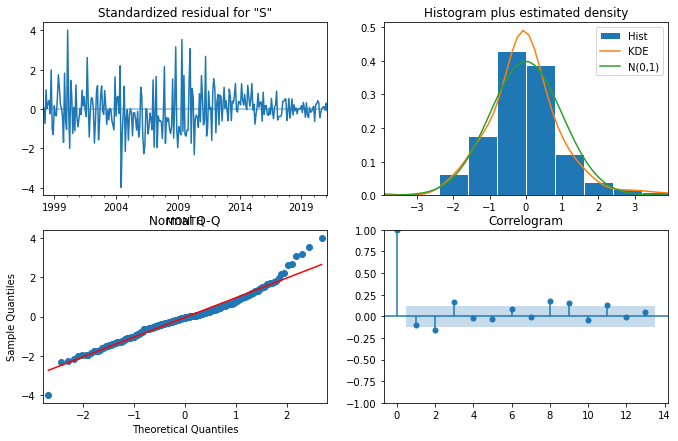

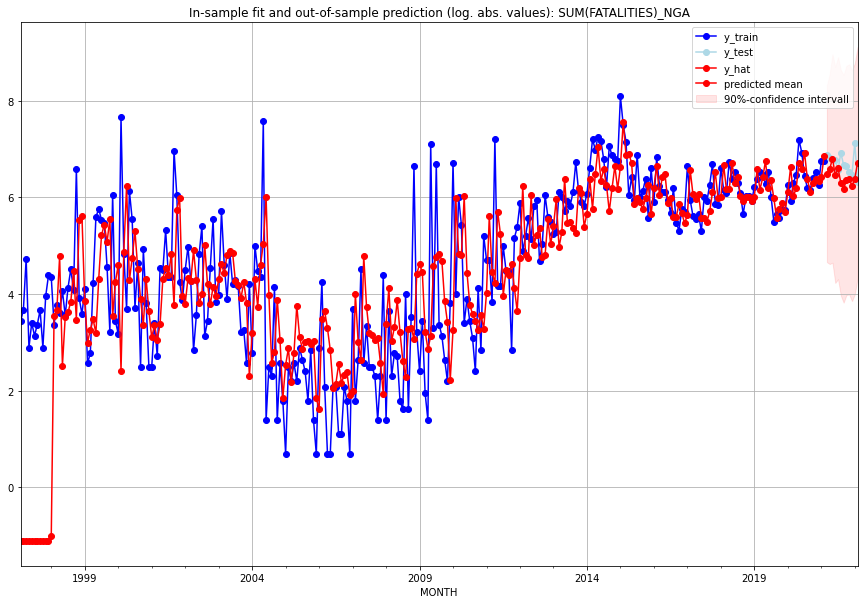

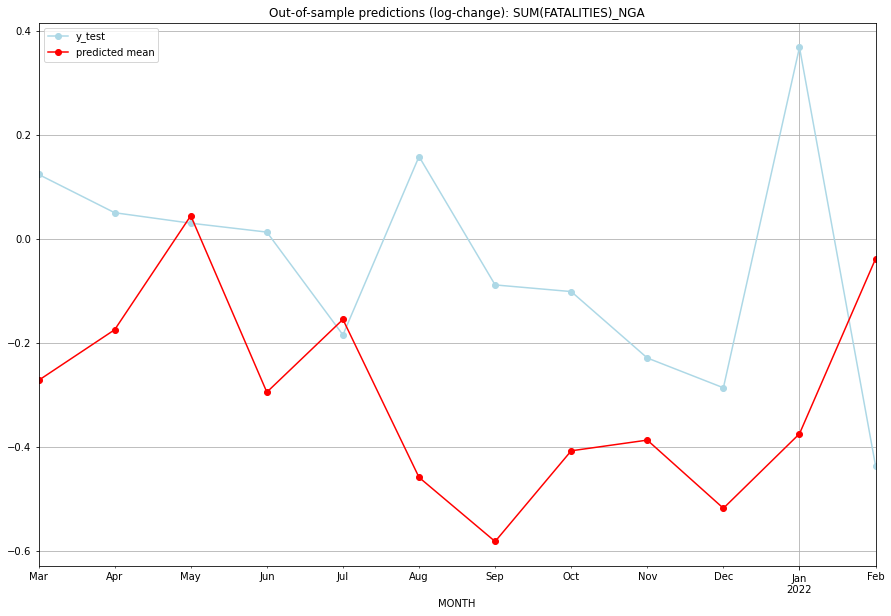

TADDA: 0.4578946960627533
Evaluation finished.
        MONTH    FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  653.284117       971.0     -0.272227        0.123587   NGA   
1  2021-04-01  720.137669       902.0     -0.174939        0.049954   NGA   
2  2021-05-01  896.774061       884.0      0.044150        0.029819   NGA   
3  2021-06-01  638.560451       869.0     -0.294988        0.012724   NGA   
4  2021-07-01  734.561780       713.0     -0.155134       -0.184886   NGA   
5  2021-08-01  541.959051      1005.0     -0.458735        0.157968   NGA   
6  2021-09-01  478.999751       785.0     -0.581983       -0.088812   NGA   
7  2021-10-01  570.408682       775.0     -0.407664       -0.101616   NGA   
8  2021-11-01  582.277510       682.0     -0.387106       -0.229274   NGA   
9  2021-12-01  510.653394       644.0     -0.518121       -0.286519   NGA   
10 2022-01-01  589.422933      1240.0     -0.374930        0.367904   NGA   
11 2022-02-01  825.495033    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (2, 1, 1), (2, 0, 1, 12), 'n'], 'cv_score': 0.5770274687212139, 'fold_results': [0.5770274687212139, nan]}
Training finished.
                                     SARIMAX Results                                      
Dep. Variable:                SUM(FATALITIES)_NIC   No. Observations:                   38
Model:             SARIMAX(2, 1, 1)x(2, 0, 1, 12)   Log Likelihood                 -53.961
Date:                            Fri, 21 Oct 2022   AIC                            125.921
Time:                                    16:54:47   BIC                            140.419
Sample:                                01-31-2018   HQIC                           131.032
                                     - 02-28-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------

<Figure size 432x288 with 0 Axes>

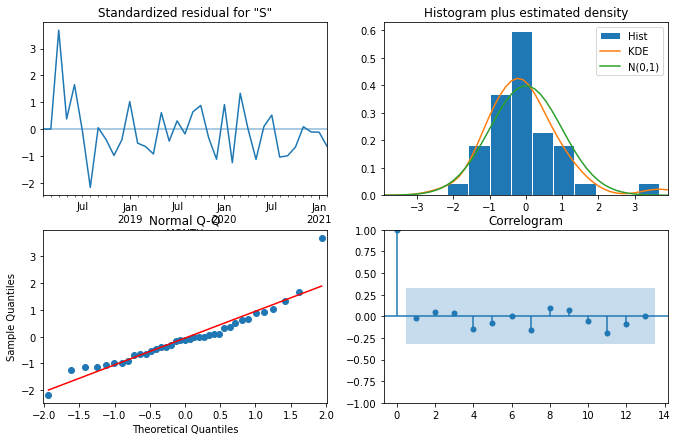

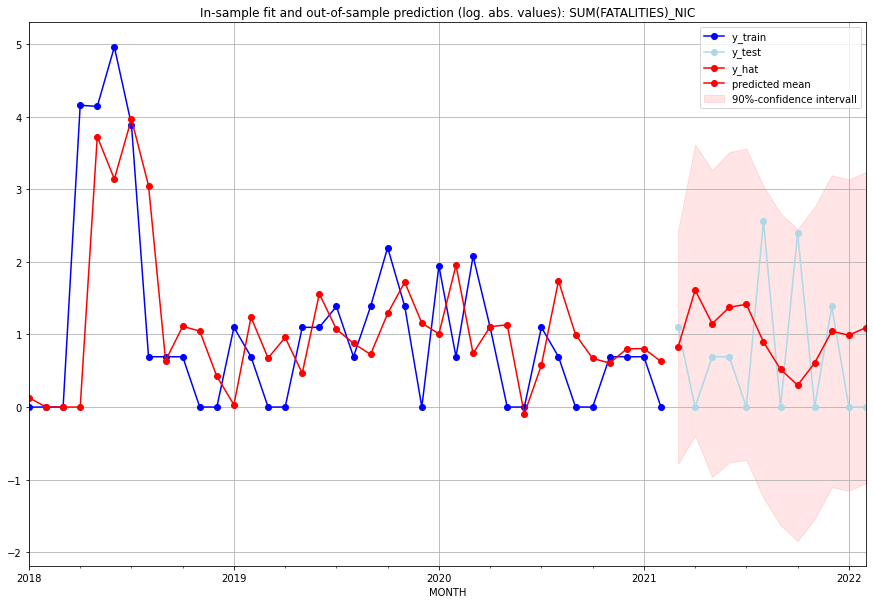

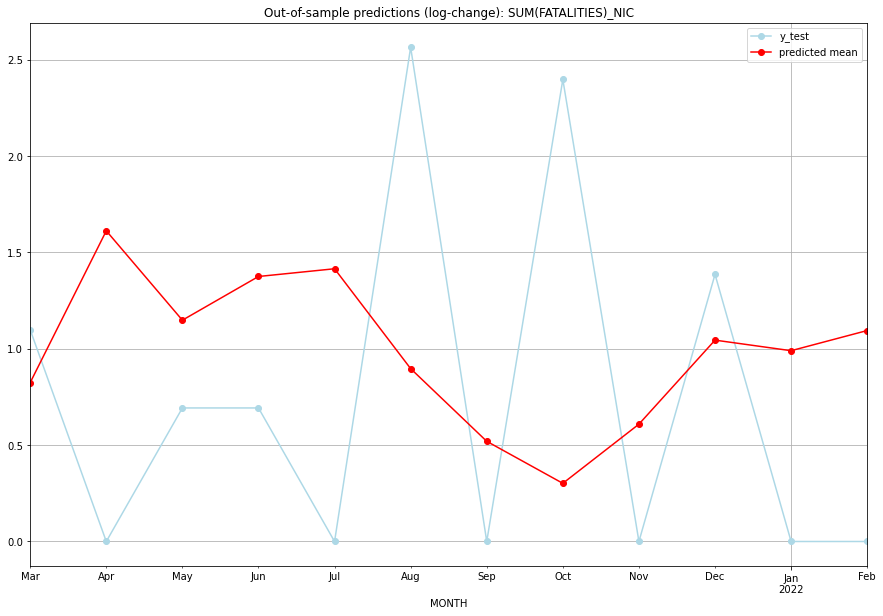

TADDA: 0.9798889006678467
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.281329         2.0      0.824758        1.098612   NIC   
1  2021-04-01  4.015186         0.0      1.612470        0.000000   NIC   
2  2021-05-01  2.153694         1.0      1.148575        0.693147   NIC   
3  2021-06-01  2.956788         1.0      1.375433        0.693147   NIC   
4  2021-07-01  3.118785         0.0      1.415558        0.000000   NIC   
5  2021-08-01  1.452706        12.0      0.897192        2.564949   NIC   
6  2021-09-01  0.681997         0.0      0.519982        0.000000   NIC   
7  2021-10-01  0.352381        10.0      0.301866        2.397895   NIC   
8  2021-11-01  0.838498         0.0      0.608949        0.000000   NIC   
9  2021-12-01  1.843794         3.0      1.045139        1.386294   NIC   
10 2022-01-01  1.691990         0.0      0.990281        0.000000   NIC   
11 2022-02-01  1.988936         0.0      1.094918    

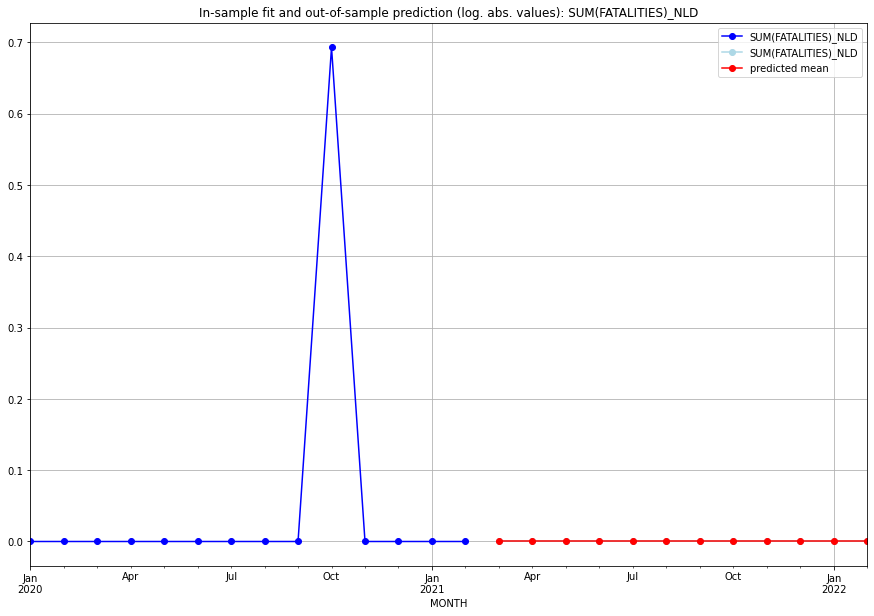

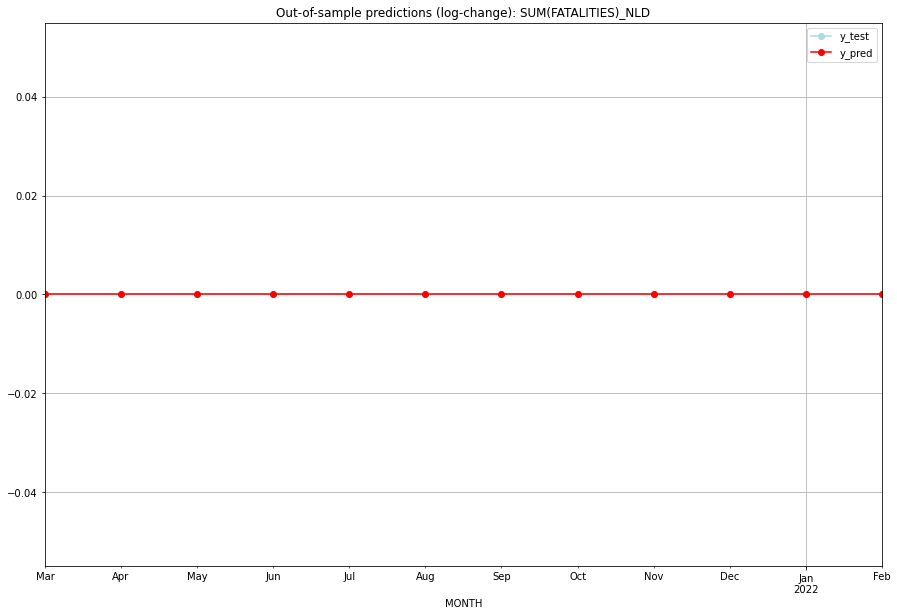

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   NLD   
1  2021-04-01       0.0         0.0           0.0             0.0   NLD   
2  2021-05-01       0.0         0.0           0.0             0.0   NLD   
3  2021-06-01       0.0         0.0           0.0             0.0   NLD   
4  2021-07-01       0.0         0.0           0.0             0.0   NLD   
5  2021-08-01       0.0         0.0           0.0             0.0   NLD   
6  2021-09-01       0.0         0.0           0.0             0.0   NLD   
7  2021-10-01       0.0         0.0           0.0             0.0   NLD   
8  2021-11-01       0.0         0.0           0.0             0.0   NLD   
9  2021-12-01       0.0         0.0           0.0             0.0   NLD   
10 2022-01-01       0.0         0.0           0.0             0.0   NLD   
11 2022-02-01       0.0         0.0           0.0             0.0   

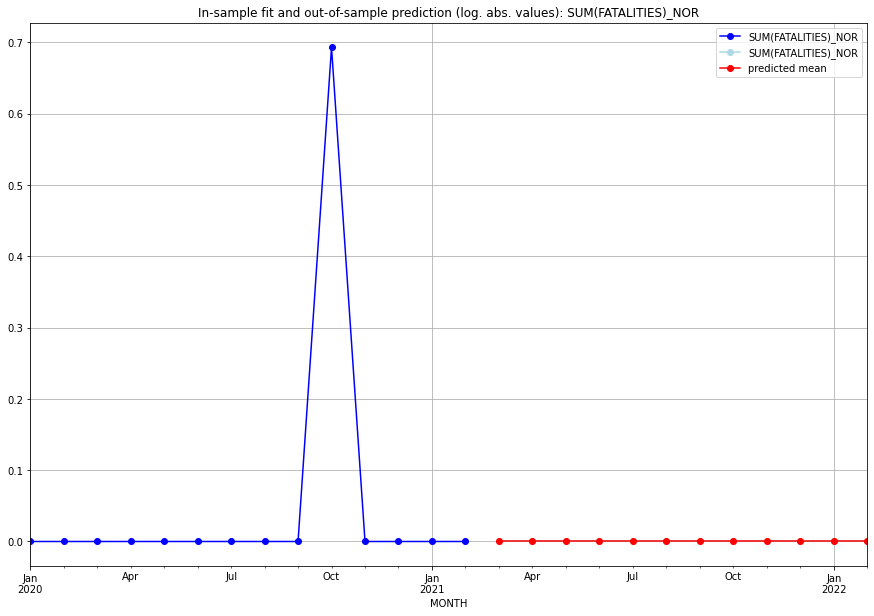

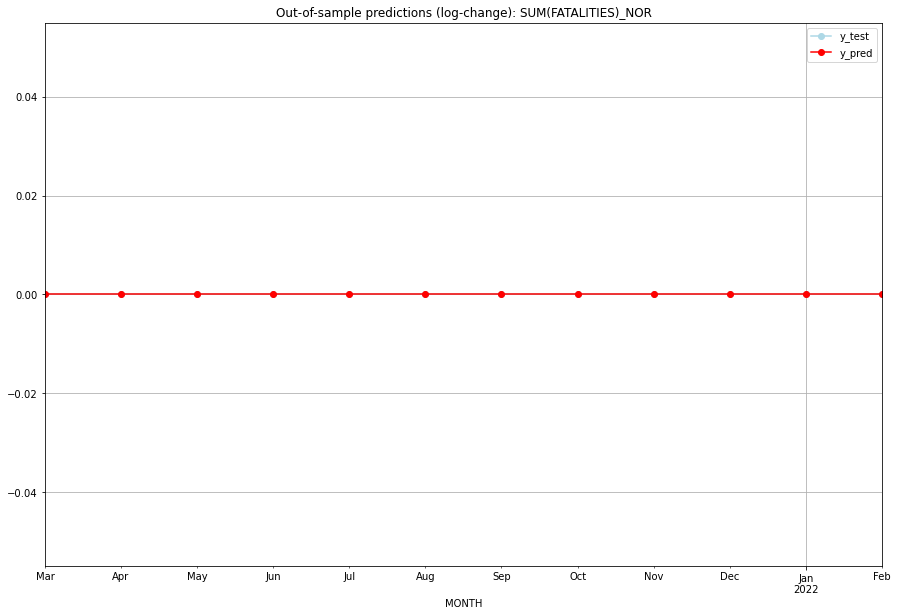

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   NOR   
1  2021-04-01       0.0         0.0           0.0             0.0   NOR   
2  2021-05-01       0.0         0.0           0.0             0.0   NOR   
3  2021-06-01       0.0         0.0           0.0             0.0   NOR   
4  2021-07-01       0.0         0.0           0.0             0.0   NOR   
5  2021-08-01       0.0         0.0           0.0             0.0   NOR   
6  2021-09-01       0.0         0.0           0.0             0.0   NOR   
7  2021-10-01       0.0         0.0           0.0             0.0   NOR   
8  2021-11-01       0.0         0.0           0.0             0.0   NOR   
9  2021-12-01       0.0         0.0           0.0             0.0   NOR   
10 2022-01-01       0.0         0.0           0.0             0.0   NOR   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (0, 0, 1), (1, 0, 2, 12), 'n'], 'cv_score': 0.5203135545853912, 'fold_results': [0.316800309455947, 0.7172869574166997, 0.4013129052115025, 0.6667715520929463, 0.4993960487498604]}
Training finished.
                                        SARIMAX Results                                        
Dep. Variable:                     SUM(FATALITIES)_NPL   No. Observations:                  134
Model:             SARIMAX(0, 0, 1)x(1, 0, [1, 2], 12)   Log Likelihood                -152.545
Date:                                 Fri, 21 Oct 2022   AIC                            319.089
Time:                                         17:00:19   BIC                            339.374
Sample:                                     01-31-2010   HQIC                           327.333
                                          - 02-28-2021                                         
Covariance Type:                                   opg                                         

<Figure size 432x288 with 0 Axes>

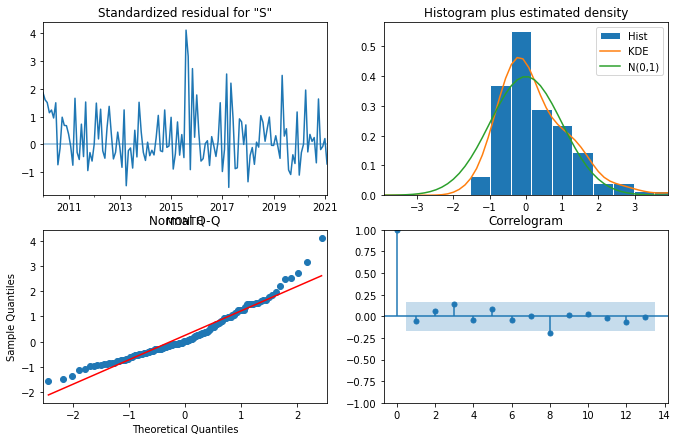

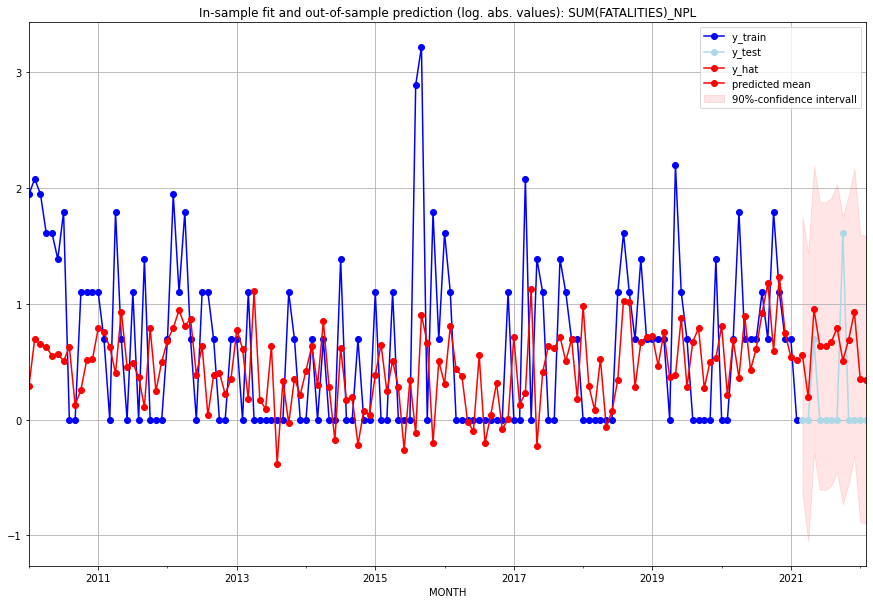

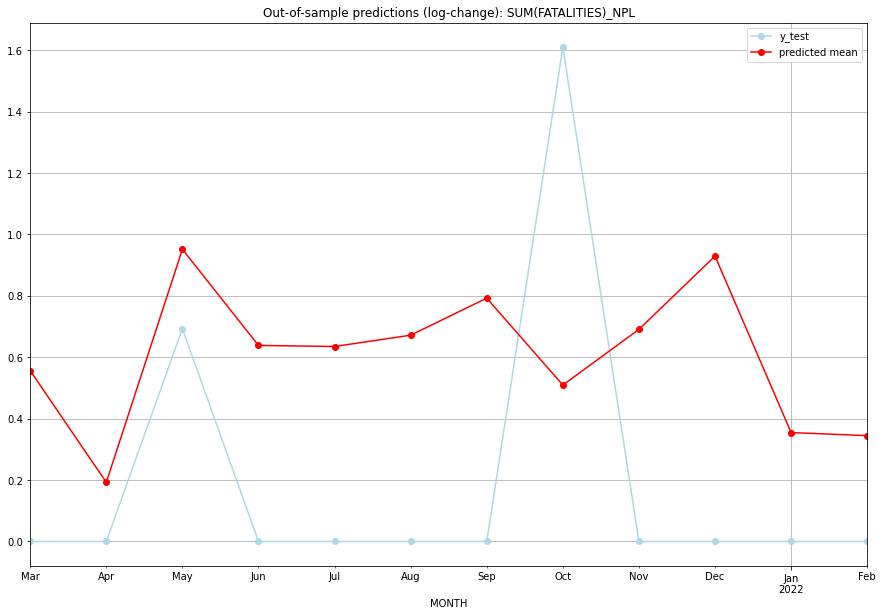

TADDA: 0.5970891154407466
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.744181         0.0      0.556285        0.000000   NPL   
1  2021-04-01  0.212452         0.0      0.192645        0.000000   NPL   
2  2021-05-01  1.590024         1.0      0.951667        0.693147   NPL   
3  2021-06-01  0.893649         0.0      0.638505        0.000000   NPL   
4  2021-07-01  0.887060         0.0      0.635020        0.000000   NPL   
5  2021-08-01  0.957839         0.0      0.671841        0.000000   NPL   
6  2021-09-01  1.208971         0.0      0.792527        0.000000   NPL   
7  2021-10-01  0.664361         4.0      0.509442        1.609438   NPL   
8  2021-11-01  0.995378         0.0      0.690834        0.000000   NPL   
9  2021-12-01  1.533139         0.0      0.929459        0.000000   NPL   
10 2022-01-01  0.425830         0.0      0.354754        0.000000   NPL   
11 2022-02-01  0.411542         0.0      0.344683    

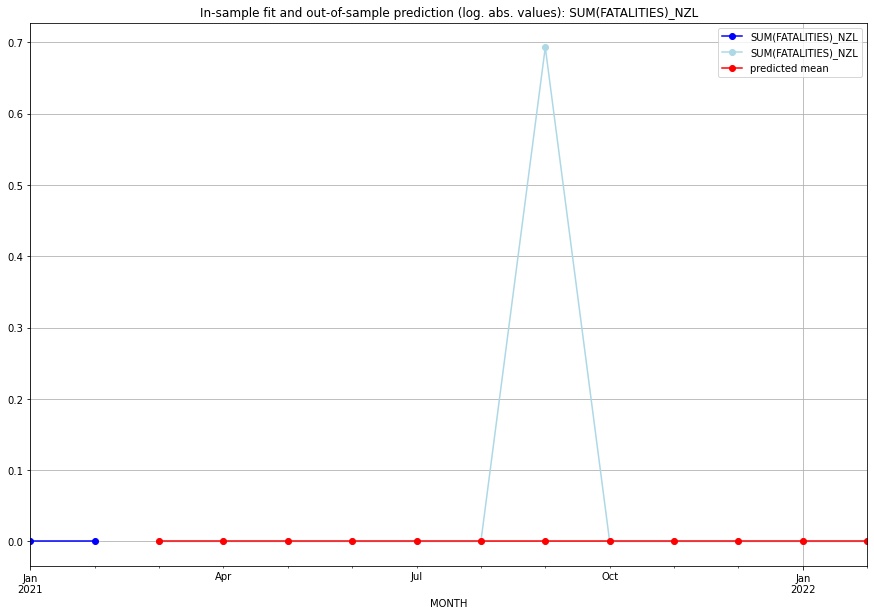

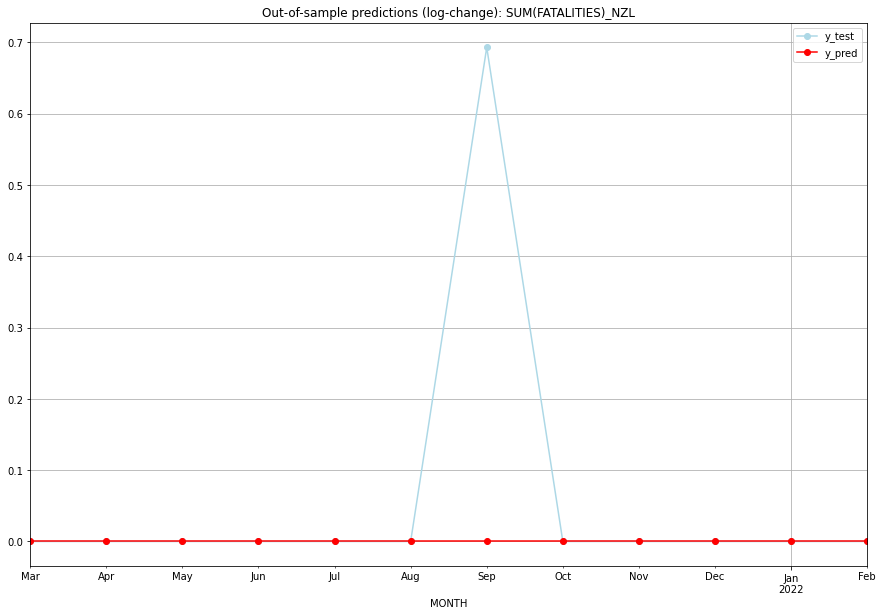

TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0    0.000000           0.0        0.000000   NZL   
1  2021-04-01       0.0    0.000000           0.0        0.000000   NZL   
2  2021-05-01       0.0    0.000000           0.0        0.000000   NZL   
3  2021-06-01       0.0    0.000000           0.0        0.000000   NZL   
4  2021-07-01       0.0    0.000000           0.0        0.000000   NZL   
5  2021-08-01       0.0    0.000000           0.0        0.000000   NZL   
6  2021-09-01       0.0    0.693147           0.0        0.693147   NZL   
7  2021-10-01       0.0    0.000000           0.0        0.000000   NZL   
8  2021-11-01       0.0    0.000000           0.0        0.000000   NZL   
9  2021-12-01       0.0    0.000000           0.0        0.000000   NZL   
10 2022-01-01       0.0    0.000000           0.0        0.000000   NZL   
11 2022-02-01       0.0    0.000000           0.0  

<Figure size 432x288 with 0 Axes>

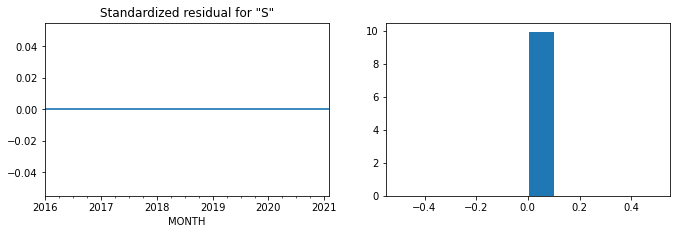

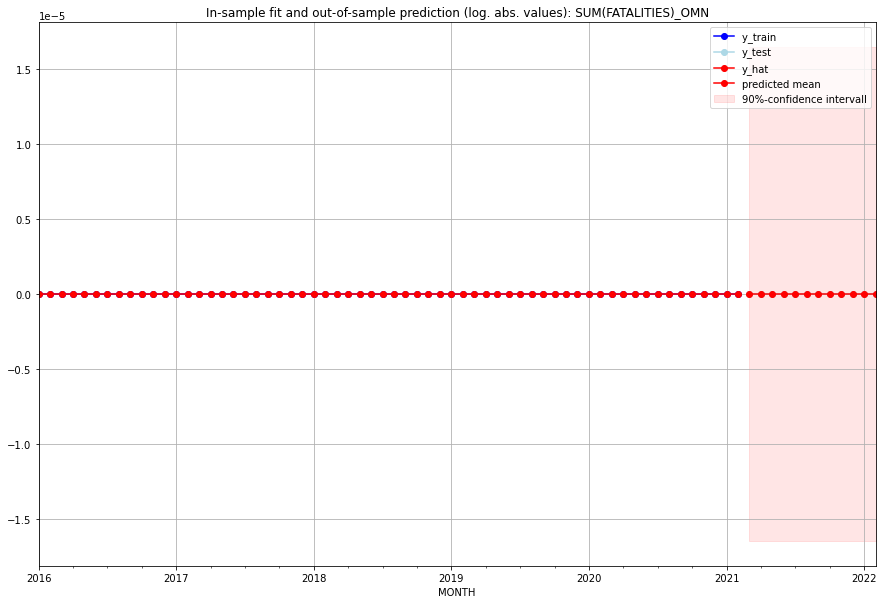

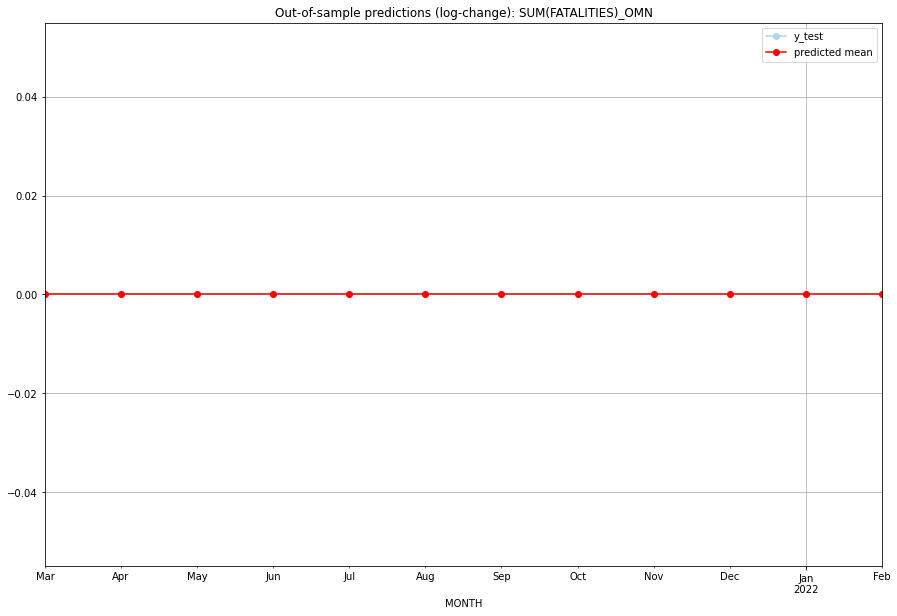

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   OMN   
1  2021-04-01       0.0         0.0           0.0             0.0   OMN   
2  2021-05-01       0.0         0.0           0.0             0.0   OMN   
3  2021-06-01       0.0         0.0           0.0             0.0   OMN   
4  2021-07-01       0.0         0.0           0.0             0.0   OMN   
5  2021-08-01       0.0         0.0           0.0             0.0   OMN   
6  2021-09-01       0.0         0.0           0.0             0.0   OMN   
7  2021-10-01       0.0         0.0           0.0             0.0   OMN   
8  2021-11-01       0.0         0.0           0.0             0.0   OMN   
9  2021-12-01       0.0         0.0           0.0             0.0   OMN   
10 2022-01-01       0.0         0.0           0.0             0.0   OMN   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [3, (2, 0, 2), (1, 0, 0, 12), 'n'], 'cv_score': 0.329657319909261, 'fold_results': [0.36314803212887764, 0.3543899706157491, 0.36981230020251094, 0.25528354517685553, 0.3056527514223118]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_PAK   No. Observations:                  134
Model:             SARIMAX(2, 0, 2)x(1, 0, [], 12)   Log Likelihood                 -75.522
Date:                             Fri, 21 Oct 2022   AIC                            169.045
Time:                                     17:06:33   BIC                            195.125
Sample:                                 01-31-2010   HQIC                           179.643
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std

<Figure size 432x288 with 0 Axes>

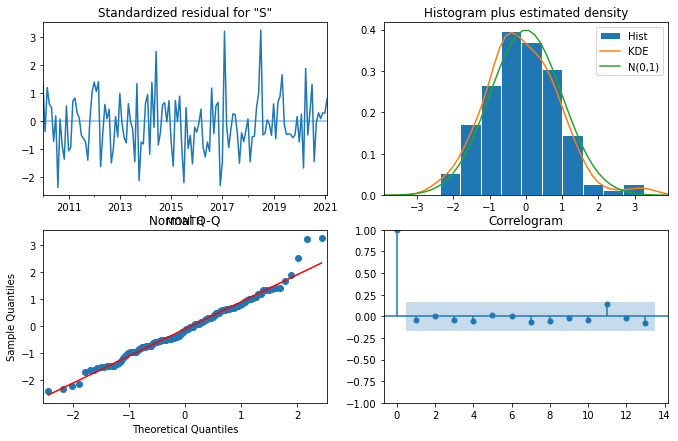

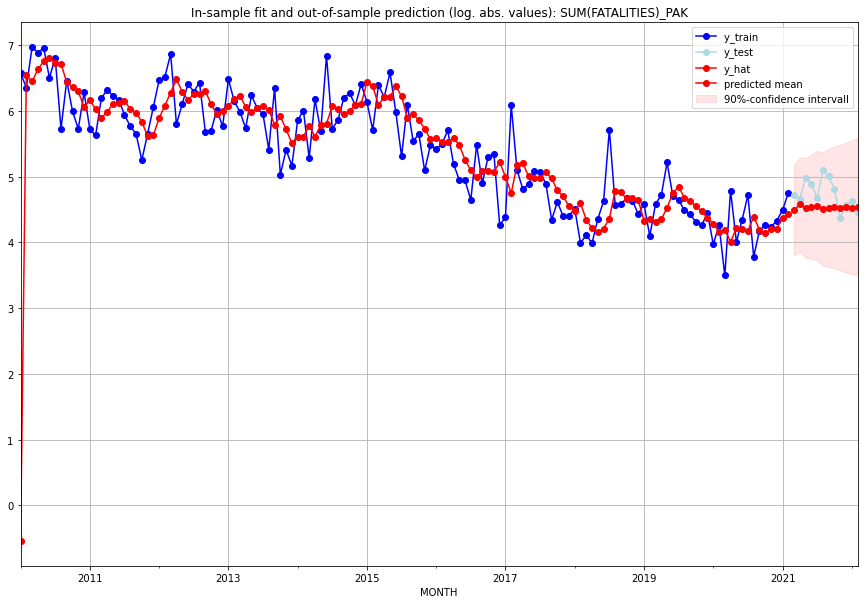

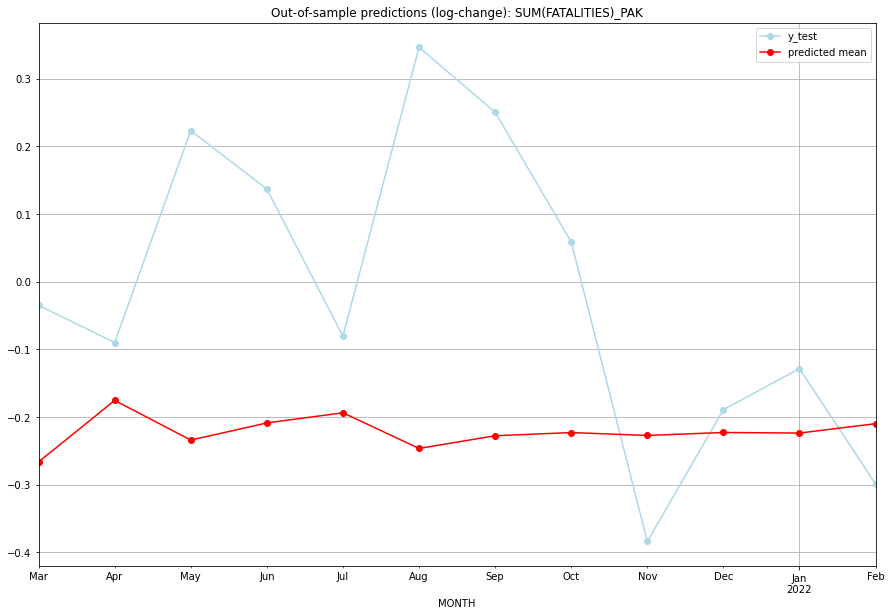

TADDA: 0.34180758894747165
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  87.858516       111.0     -0.266545       -0.035091   PAK   
1  2021-04-01  96.316487       105.0     -0.175622       -0.090151   PAK   
2  2021-05-01  90.776792       144.0     -0.234231        0.223144   PAK   
3  2021-06-01  93.128116       132.0     -0.208933        0.136759   PAK   
4  2021-07-01  94.554395       106.0     -0.193895       -0.080761   PAK   
5  2021-08-01  89.646449       163.0     -0.246623        0.346276   PAK   
6  2021-09-01  91.364381       148.0     -0.227849        0.250356   PAK   
7  2021-10-01  91.800462       122.0     -0.223139        0.058594   PAK   
8  2021-11-01  91.402238        78.0     -0.227439       -0.384142   PAK   
9  2021-12-01  91.810972        95.0     -0.223025       -0.189242   PAK   
10 2022-01-01  91.731905       101.0     -0.223878       -0.128617   PAK   
11 2022-02-01  93.024494        85.0    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.17328679513998632, 'fold_results': [0.17328679513998632, 0.17328679513998632]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_PAN   No. Observations:                   38
Model:                         SARIMAX   Log Likelihood                 -12.625
Date:                 Fri, 21 Oct 2022   AIC                             27.251
Time:                         17:07:45   BIC                             28.888
Sample:                     01-31-2018   HQIC                            27.833
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.1138    

<Figure size 432x288 with 0 Axes>

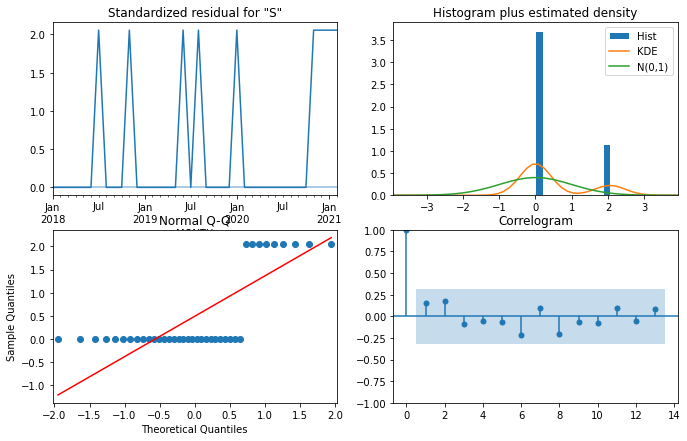

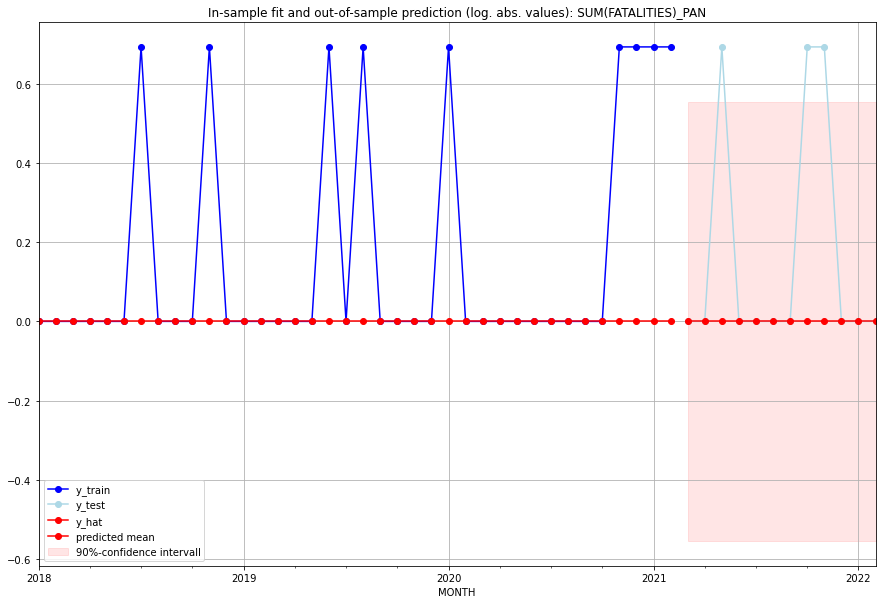

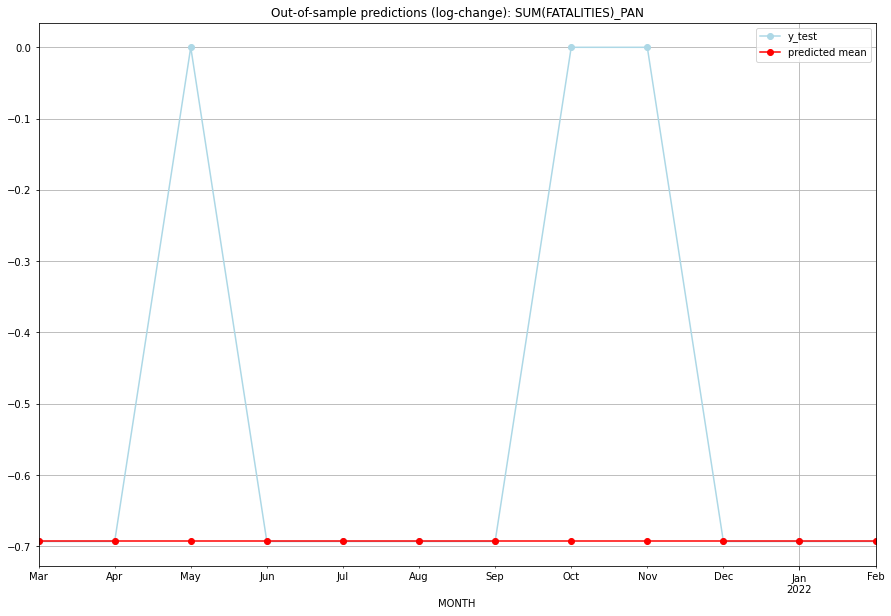

TADDA: 0.17328679513998632
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0     -0.693147       -0.693147   PAN   
1  2021-04-01       0.0         0.0     -0.693147       -0.693147   PAN   
2  2021-05-01       0.0         1.0     -0.693147        0.000000   PAN   
3  2021-06-01       0.0         0.0     -0.693147       -0.693147   PAN   
4  2021-07-01       0.0         0.0     -0.693147       -0.693147   PAN   
5  2021-08-01       0.0         0.0     -0.693147       -0.693147   PAN   
6  2021-09-01       0.0         0.0     -0.693147       -0.693147   PAN   
7  2021-10-01       0.0         1.0     -0.693147        0.000000   PAN   
8  2021-11-01       0.0         1.0     -0.693147        0.000000   PAN   
9  2021-12-01       0.0         0.0     -0.693147       -0.693147   PAN   
10 2022-01-01       0.0         0.0     -0.693147       -0.693147   PAN   
11 2022-02-01       0.0         0.0     -0.693147   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (3, 1, 3), (1, 0, 0, 12), 'n'], 'cv_score': 0.5647140849841444, 'fold_results': [nan, 0.5647140849841444]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_PER   No. Observations:                   38
Model:             SARIMAX(3, 1, 3)x(1, 0, [], 12)   Log Likelihood                 -39.731
Date:                             Fri, 21 Oct 2022   AIC                             97.462
Time:                                     17:09:03   BIC                            111.961
Sample:                                 01-31-2018   HQIC                           102.574
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------

<Figure size 432x288 with 0 Axes>

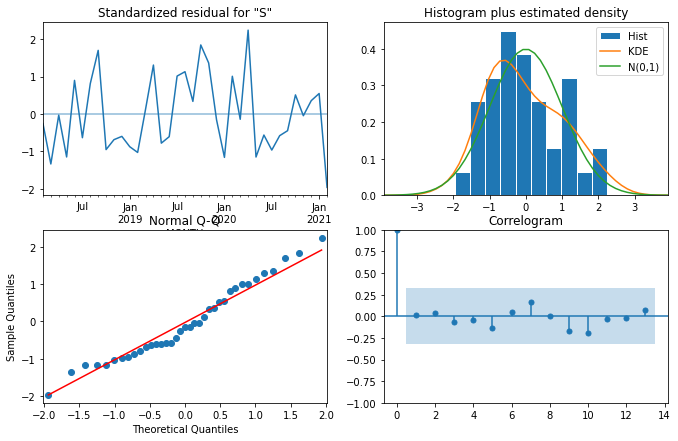

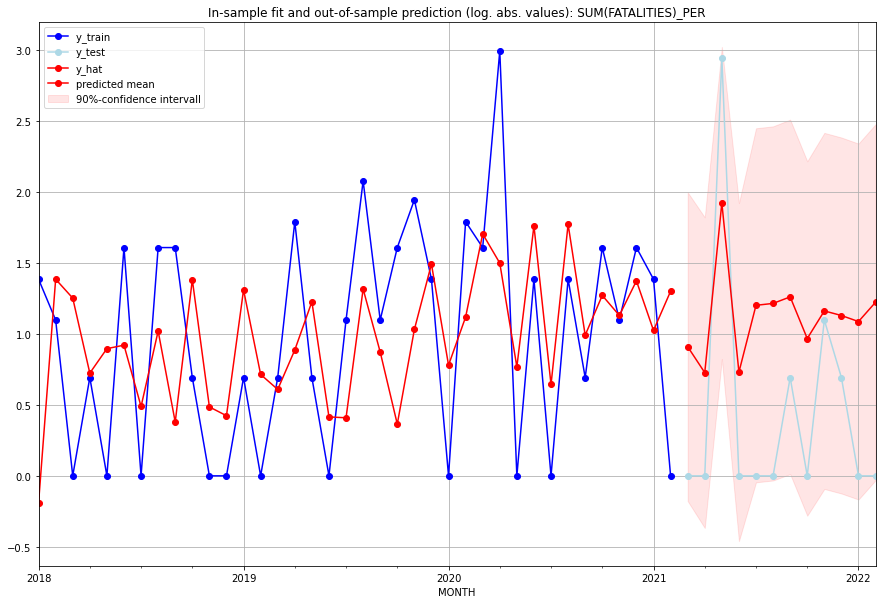

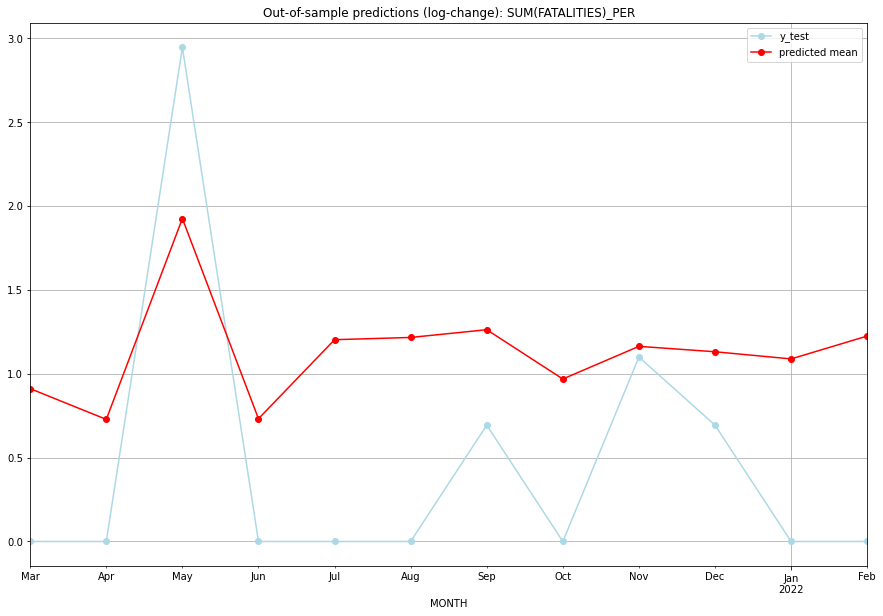

TADDA: 0.8465186365038901
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.485850         0.0      0.910614        0.000000   PER   
1  2021-04-01  1.069971         0.0      0.727535        0.000000   PER   
2  2021-05-01  5.848936        18.0      1.924093        2.944439   PER   
3  2021-06-01  1.077894         0.0      0.731355        0.000000   PER   
4  2021-07-01  2.327990         0.0      1.202368        0.000000   PER   
5  2021-08-01  2.372638         0.0      1.215695        0.000000   PER   
6  2021-09-01  2.531957         1.0      1.261852        0.693147   PER   
7  2021-10-01  1.633163         0.0      0.968186        0.000000   PER   
8  2021-11-01  2.198792         2.0      1.162773        1.098612   PER   
9  2021-12-01  2.097094         1.0      1.130464        0.693147   PER   
10 2022-01-01  1.967855         0.0      1.087840        0.000000   PER   
11 2022-02-01  2.401111         0.0      1.224102    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [3, (2, 1, 3), (0, 0, 0, 12), 'n'], 'cv_score': 0.2013773990868446, 'fold_results': [nan, 0.23216876998335248, 0.13287677646633086, 0.23908665081085045]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_PHL   No. Observations:                   62
Model:                SARIMAX(2, 1, 3)   Log Likelihood                 -31.795
Date:                 Fri, 21 Oct 2022   AIC                             81.590
Time:                         17:11:57   BIC                            100.588
Sample:                     01-31-2016   HQIC                            89.036
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

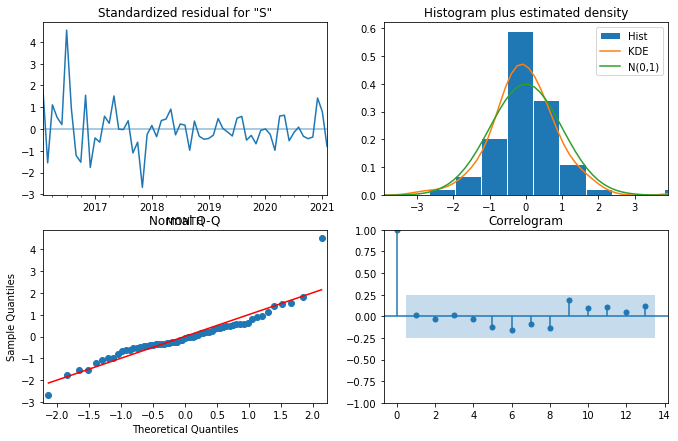

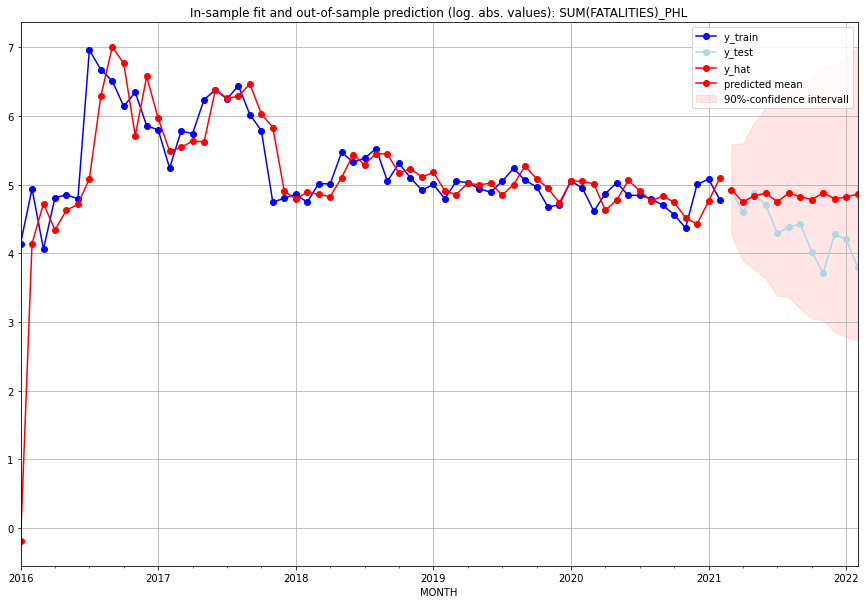

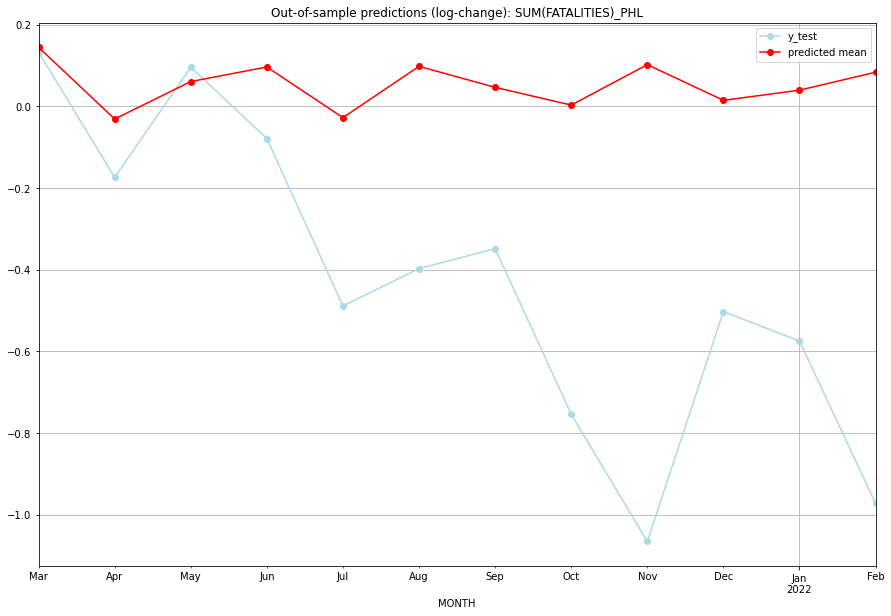

TADDA: 0.5263735631816648
Evaluation finished.
        MONTH    FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  136.553776       135.0      0.144891        0.133531   PHL   
1  2021-04-01  114.396745        99.0     -0.030747       -0.173953   PHL   
2  2021-05-01  125.482812       130.0      0.060983        0.096074   PHL   
3  2021-06-01  130.083349       109.0      0.096710       -0.078643   PHL   
4  2021-07-01  114.785994        72.0     -0.027380       -0.488664   PHL   
5  2021-08-01  130.286718        79.0      0.098260       -0.397097   PHL   
6  2021-09-01  123.703546        83.0      0.046816       -0.348307   PHL   
7  2021-10-01  118.404357        55.0      0.003392       -0.753772   PHL   
8  2021-11-01  130.840128        40.0      0.102467       -1.065551   PHL   
9  2021-12-01  119.797747        71.0      0.014994       -0.502457   PHL   
10 2022-01-01  122.841856        66.0      0.039882       -0.574431   PHL   
11 2022-02-01  128.413690    

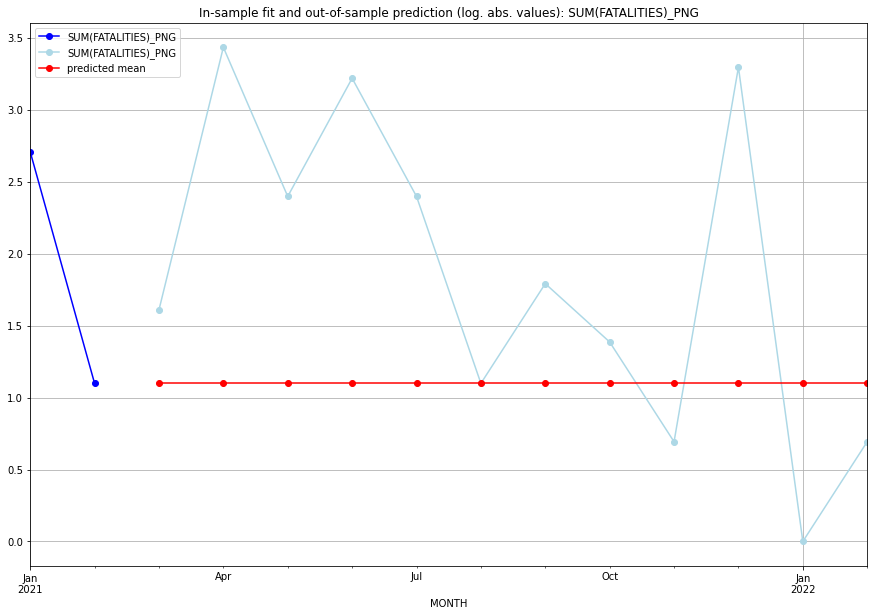

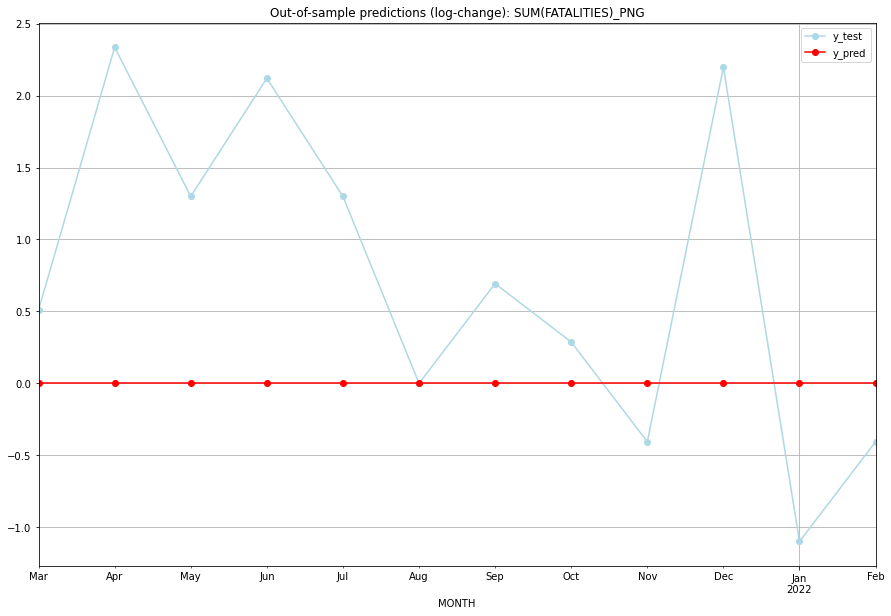

TADDA: 1.054385531606335
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.098612    1.609438           0.0        0.510826   PNG   
1  2021-04-01  1.098612    3.433987           0.0        2.335375   PNG   
2  2021-05-01  1.098612    2.397895           0.0        1.299283   PNG   
3  2021-06-01  1.098612    3.218876           0.0        2.120264   PNG   
4  2021-07-01  1.098612    2.397895           0.0        1.299283   PNG   
5  2021-08-01  1.098612    1.098612           0.0        0.000000   PNG   
6  2021-09-01  1.098612    1.791759           0.0        0.693147   PNG   
7  2021-10-01  1.098612    1.386294           0.0        0.287682   PNG   
8  2021-11-01  1.098612    0.693147           0.0       -0.405465   PNG   
9  2021-12-01  1.098612    3.295837           0.0        2.197225   PNG   
10 2022-01-01  1.098612    0.000000           0.0       -1.098612   PNG   
11 2022-02-01  1.098612    0.693147           0.0     

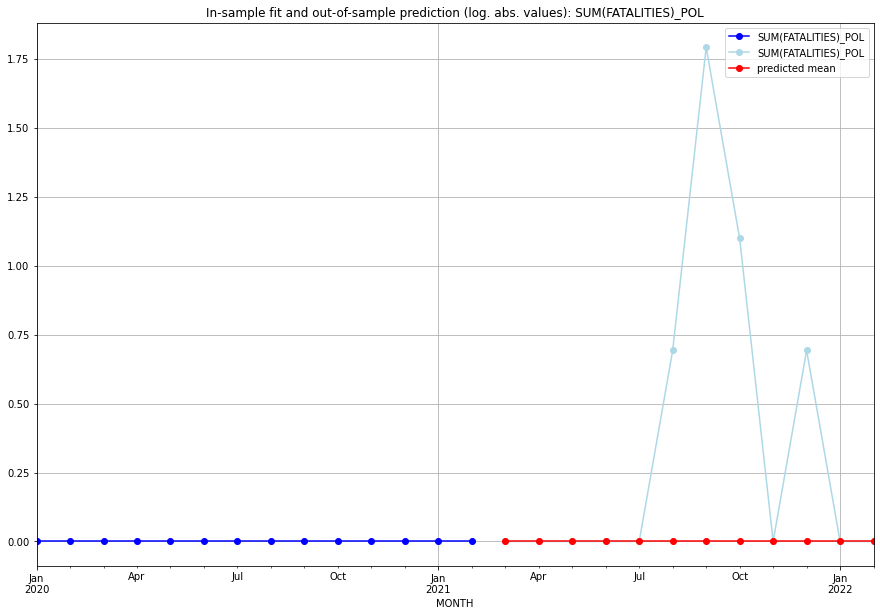

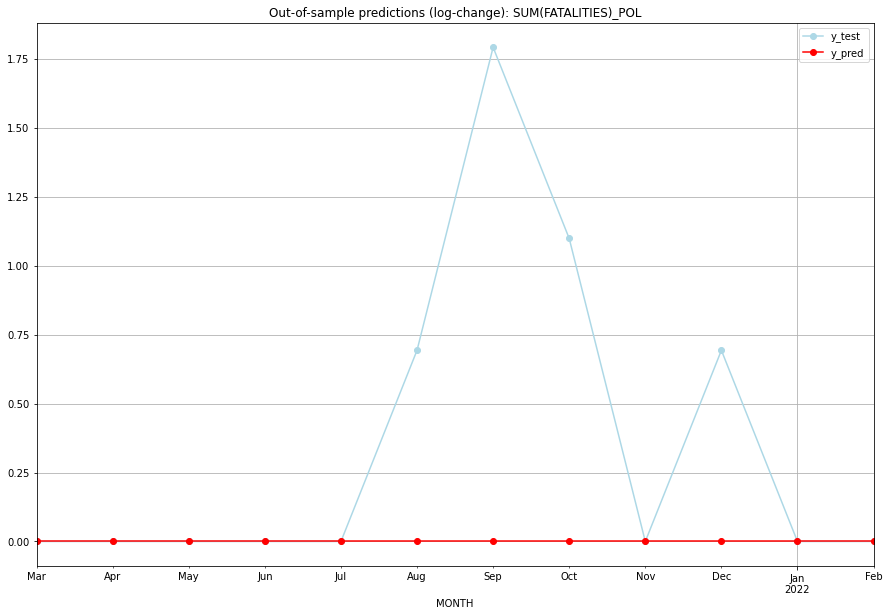

TADDA: 0.35638884325133796
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0    0.000000           0.0        0.000000   POL   
1  2021-04-01       0.0    0.000000           0.0        0.000000   POL   
2  2021-05-01       0.0    0.000000           0.0        0.000000   POL   
3  2021-06-01       0.0    0.000000           0.0        0.000000   POL   
4  2021-07-01       0.0    0.000000           0.0        0.000000   POL   
5  2021-08-01       0.0    0.693147           0.0        0.693147   POL   
6  2021-09-01       0.0    1.791759           0.0        1.791759   POL   
7  2021-10-01       0.0    1.098612           0.0        1.098612   POL   
8  2021-11-01       0.0    0.000000           0.0        0.000000   POL   
9  2021-12-01       0.0    0.693147           0.0        0.693147   POL   
10 2022-01-01       0.0    0.000000           0.0        0.000000   POL   
11 2022-02-01       0.0    0.000000           0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (2, 0, 1), (0, 1, 0, 12), 'n'], 'cv_score': 0.3433938469735107, 'fold_results': [nan, 0.3433938469735107]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_PRI   No. Observations:                   38
Model:             SARIMAX(2, 0, 1)x(0, 1, [], 12)   Log Likelihood                 -18.062
Date:                             Fri, 21 Oct 2022   AIC                             46.123
Time:                                     17:13:15   BIC                             52.414
Sample:                                 01-31-2018   HQIC                            47.935
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------

<Figure size 432x288 with 0 Axes>

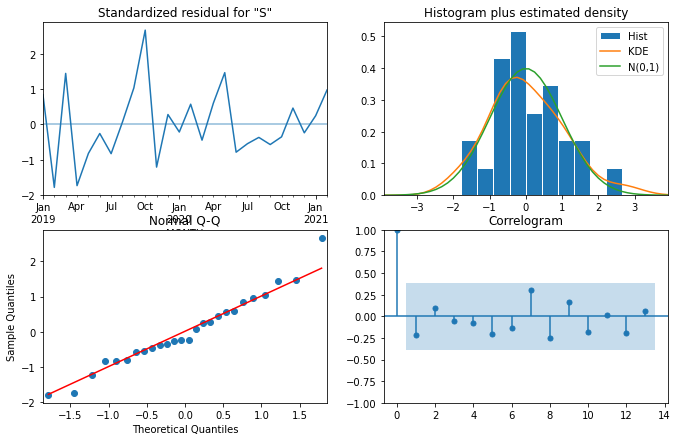

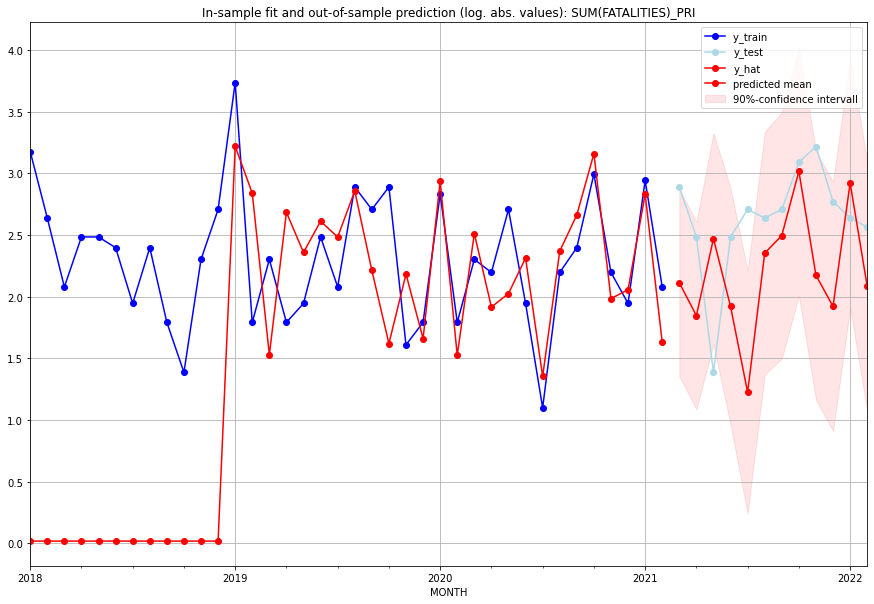

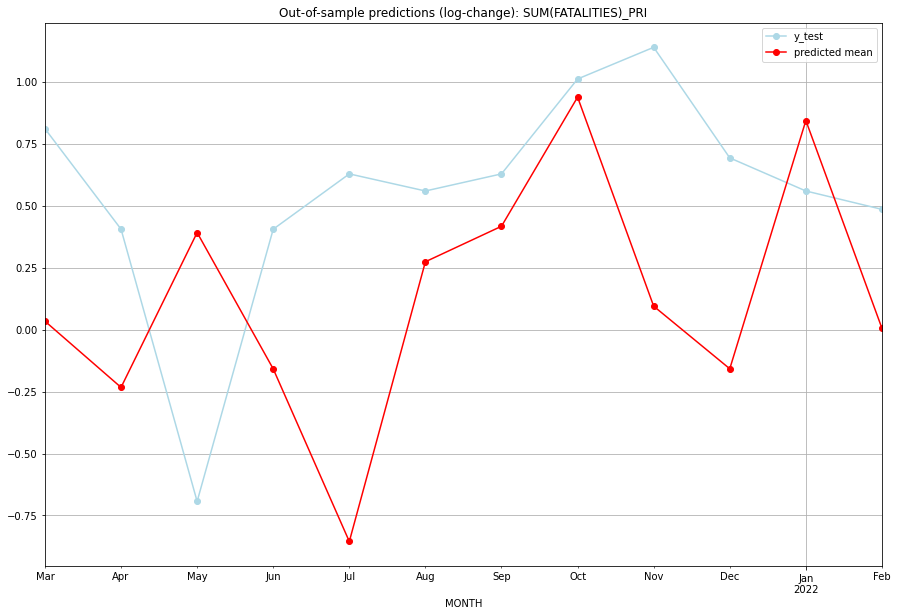

TADDA: 0.7977830077303638
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01   7.278106        17.0      0.034173        0.810930   PRI   
1  2021-04-01   5.337714        11.0     -0.232923        0.405465   PRI   
2  2021-05-01  10.837093         3.0      0.391797       -0.693147   PRI   
3  2021-06-01   5.828219        11.0     -0.158378        0.405465   PRI   
4  2021-07-01   2.402600        14.0     -0.854902        0.628609   PRI   
5  2021-08-01   9.522103        13.0      0.274037        0.559616   PRI   
6  2021-09-01  11.142685        14.0      0.417285        0.628609   PRI   
7  2021-10-01  19.445889        21.0      0.938340        1.011601   PRI   
8  2021-11-01   7.794738        24.0      0.094712        1.139434   PRI   
9  2021-12-01   5.831915        15.0     -0.157837        0.693147   PRI   
10 2022-01-01  17.603584        13.0      0.843913        0.559616   PRI   
11 2022-02-01   7.044576        12.0     

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 3), (0, 1, 0, 12), 'n'], 'cv_score': 0.28343311513851294, 'fold_results': [0.28343311513851294, nan]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_PRK   No. Observations:                   38
Model:             SARIMAX(0, 1, 3)x(0, 1, [], 12)   Log Likelihood                 -28.614
Date:                             Fri, 21 Oct 2022   AIC                             65.228
Time:                                     17:14:36   BIC                             70.103
Sample:                                 01-31-2018   HQIC                            66.580
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------

<Figure size 432x288 with 0 Axes>

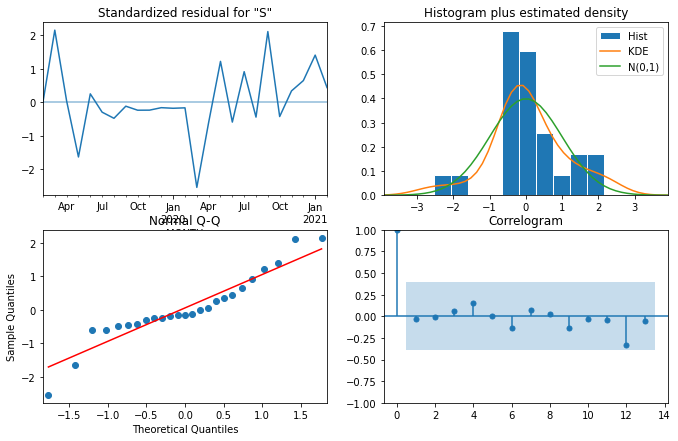

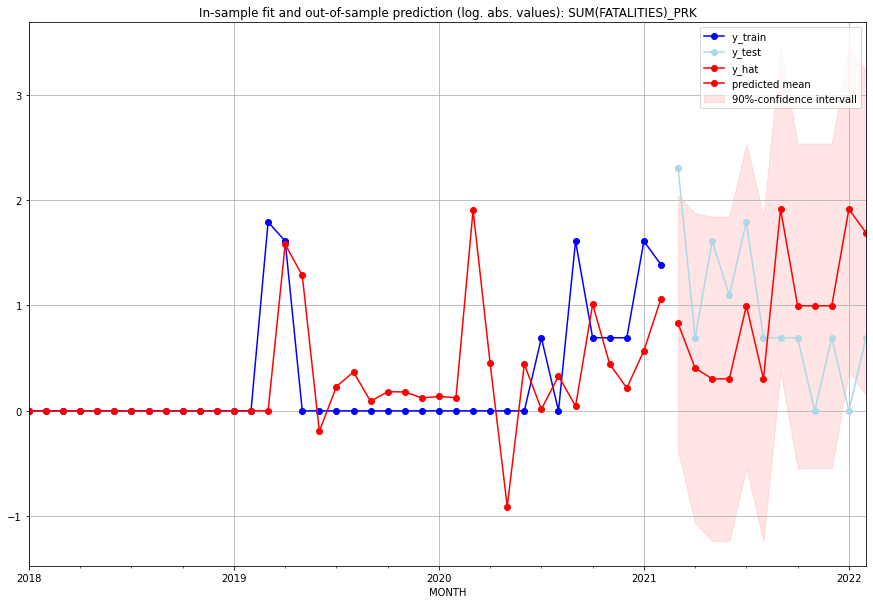

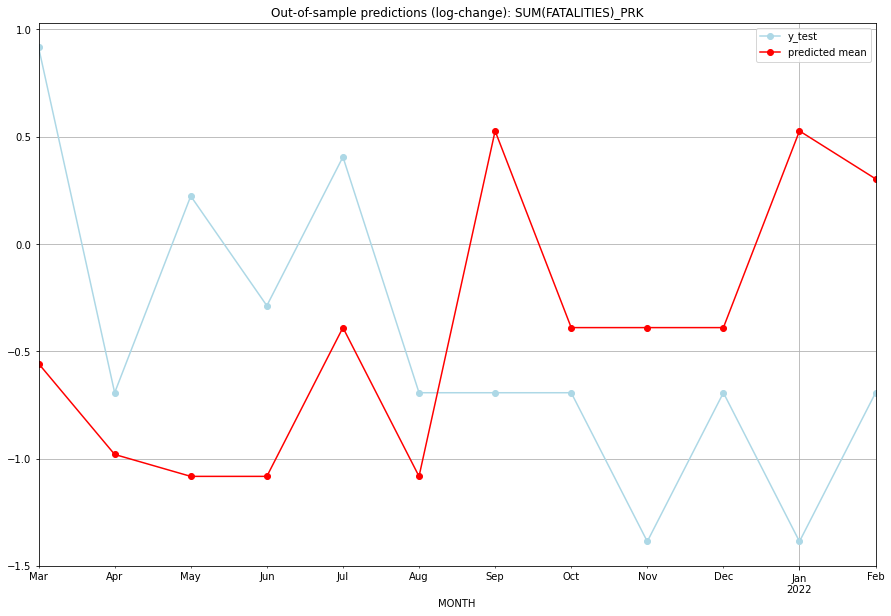

TADDA: 1.1805448681260542
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.290774         9.0     -0.557405        0.916291   PRK   
1  2021-04-01  0.500124         1.0     -0.980746       -0.693147   PRK   
2  2021-05-01  0.354491         4.0     -1.082868        0.223144   PRK   
3  2021-06-01  0.354491         2.0     -1.082868       -0.287682   PRK   
4  2021-07-01  1.708982         5.0     -0.389721        0.405465   PRK   
5  2021-08-01  0.354491         1.0     -1.082868       -0.693147   PRK   
6  2021-09-01  5.772456         1.0      0.526569       -0.693147   PRK   
7  2021-10-01  1.708982         1.0     -0.389721       -0.693147   PRK   
8  2021-11-01  1.708982         0.0     -0.389721       -1.386294   PRK   
9  2021-12-01  1.708982         1.0     -0.389721       -0.693147   PRK   
10 2022-01-01  5.772456         0.0      0.526569       -1.386294   PRK   
11 2022-02-01  4.417965         1.0      0.303426    

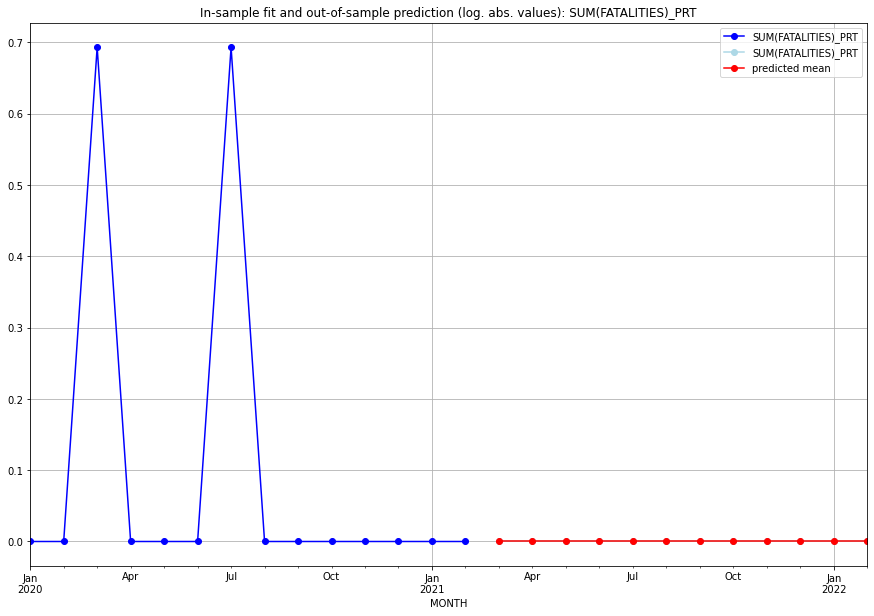

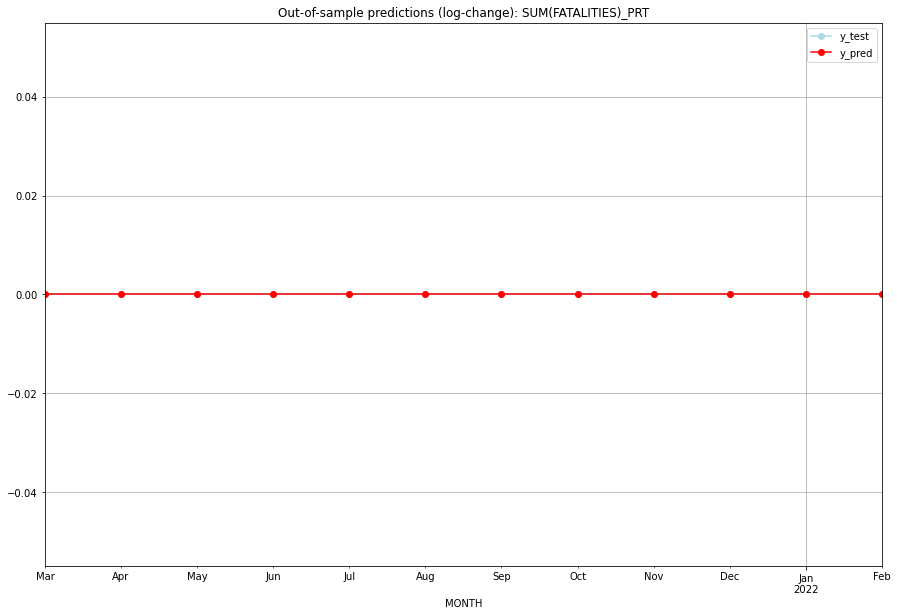

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   PRT   
1  2021-04-01       0.0         0.0           0.0             0.0   PRT   
2  2021-05-01       0.0         0.0           0.0             0.0   PRT   
3  2021-06-01       0.0         0.0           0.0             0.0   PRT   
4  2021-07-01       0.0         0.0           0.0             0.0   PRT   
5  2021-08-01       0.0         0.0           0.0             0.0   PRT   
6  2021-09-01       0.0         0.0           0.0             0.0   PRT   
7  2021-10-01       0.0         0.0           0.0             0.0   PRT   
8  2021-11-01       0.0         0.0           0.0             0.0   PRT   
9  2021-12-01       0.0         0.0           0.0             0.0   PRT   
10 2022-01-01       0.0         0.0           0.0             0.0   PRT   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [3, (3, 1, 2), (1, 0, 0, 12), 'n'], 'cv_score': 0.4674755665204654, 'fold_results': [0.5057026868339196, 0.42924844620701114]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_PRY   No. Observations:                   38
Model:             SARIMAX(3, 1, 2)x(1, 0, [], 12)   Log Likelihood                 -30.994
Date:                             Fri, 21 Oct 2022   AIC                             81.987
Time:                                     17:15:51   BIC                             98.096
Sample:                                 01-31-2018   HQIC                            87.666
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------

<Figure size 432x288 with 0 Axes>

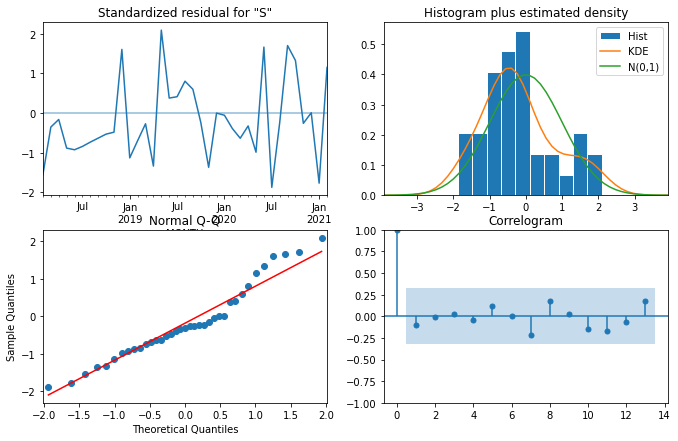

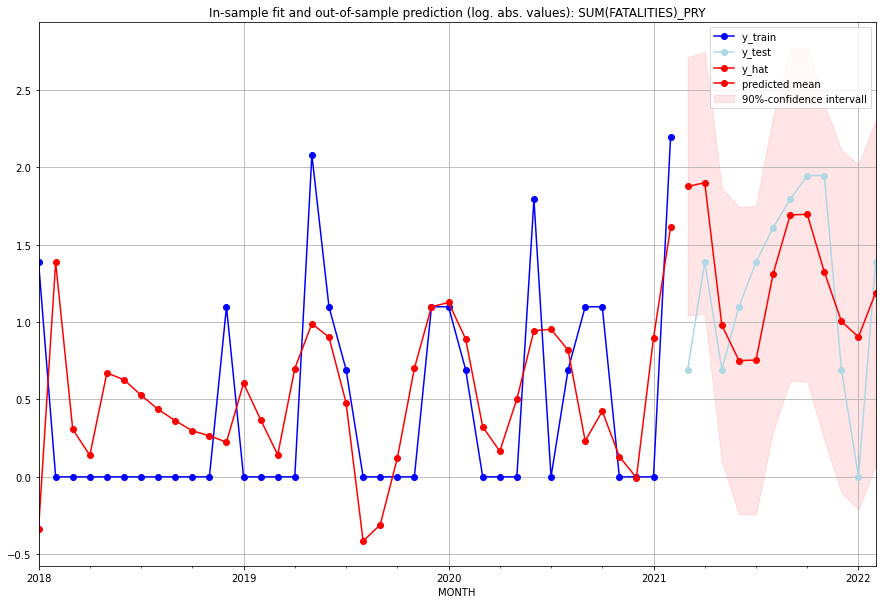

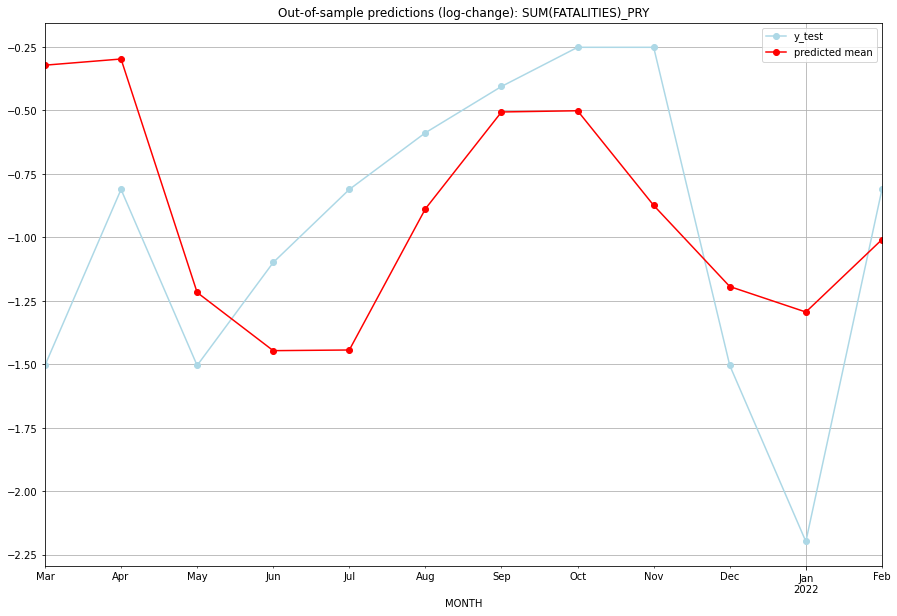

TADDA: 0.47054986575377916
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  5.524431         1.0     -0.321671       -1.504077   PRY   
1  2021-04-01  5.684906         3.0     -0.297372       -0.810930   PRY   
2  2021-05-01  1.665923         1.0     -1.216674       -1.504077   PRY   
3  2021-06-01  1.120056         2.0     -1.445782       -1.098612   PRY   
4  2021-07-01  1.125580         3.0     -1.443180       -0.810930   PRY   
5  2021-08-01  2.706157         4.0     -0.887229       -0.587787   PRY   
6  2021-09-01  4.426790         5.0     -0.505877       -0.405465   PRY   
7  2021-10-01  4.452708         6.0     -0.501112       -0.251314   PRY   
8  2021-11-01  2.756467         6.0     -0.873746       -0.251314   PRY   
9  2021-12-01  1.728987         1.0     -1.193294       -1.504077   PRY   
10 2022-01-01  1.468406         0.0     -1.293652       -2.197225   PRY   
11 2022-02-01  2.283540         3.0     -1.008303   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [3, (1, 1, 3), (2, 0, 1, 12), 'n'], 'cv_score': 0.592693606873308, 'fold_results': [nan, 0.5921975863117243, 0.7218654613766202, 0.46401777293157953]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_PSE   No. Observations:                   62
Model:             SARIMAX(1, 1, 3)x(2, 0, [1], 12)   Log Likelihood                 -58.288
Date:                              Fri, 21 Oct 2022   AIC                            138.576
Time:                                      17:18:40   BIC                            161.796
Sample:                                  01-31-2016   HQIC                           147.676
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|   

<Figure size 432x288 with 0 Axes>

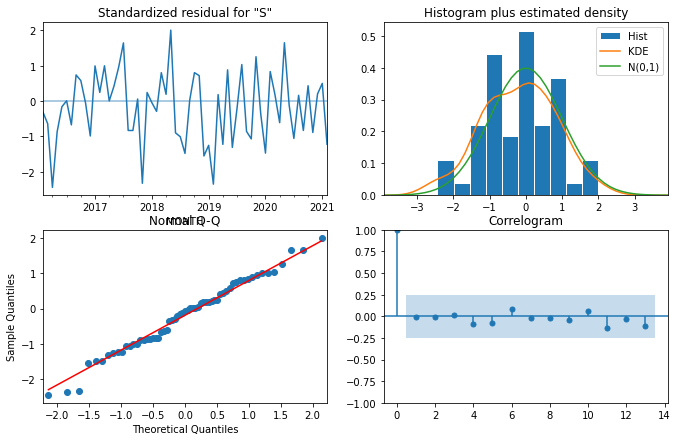

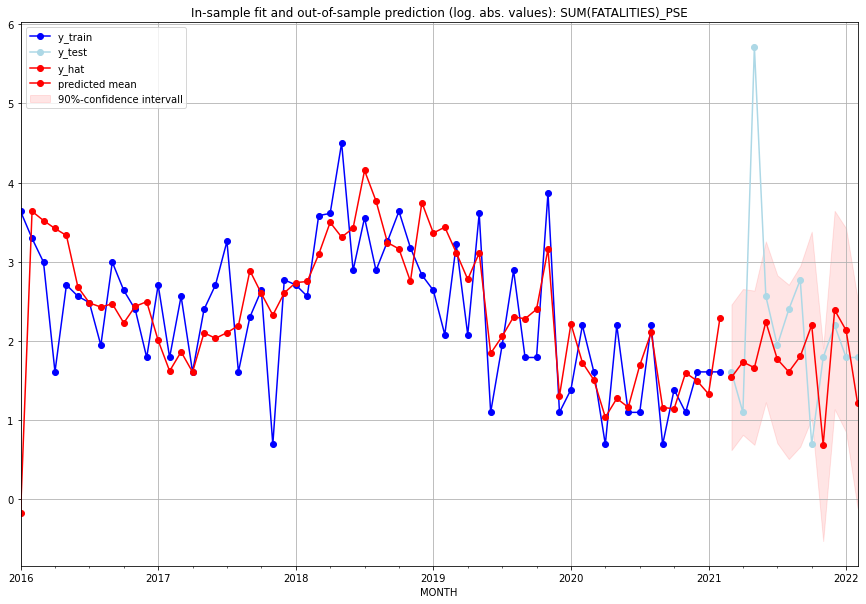

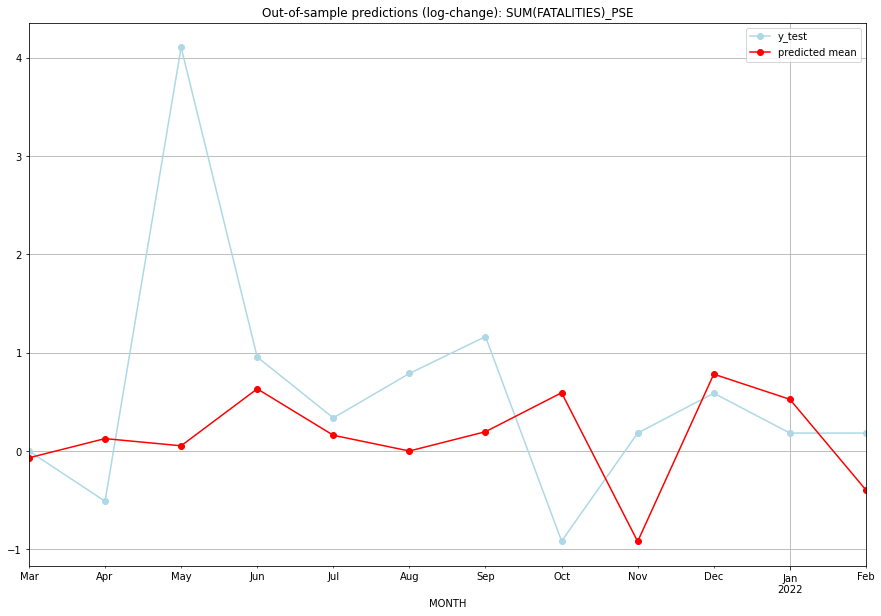

TADDA: 1.06447261091585
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  3.665319         4.0     -0.069282        0.000000   PSE   
1  2021-04-01  4.671438         2.0      0.126005       -0.510826   PSE   
2  2021-05-01  4.271686       302.0      0.052912        4.104295   PSE   
3  2021-06-01  8.406412        12.0      0.631954        0.955511   PSE   
4  2021-07-01  4.866924         6.0      0.159893        0.336472   PSE   
5  2021-08-01  3.999959        10.0     -0.000008        0.788457   PSE   
6  2021-09-01  5.083923        15.0      0.196212        1.163151   PSE   
7  2021-10-01  8.037205         1.0      0.591912       -0.916291   PSE   
8  2021-11-01  0.992511         5.0     -0.920042        0.182322   PSE   
9  2021-12-01  9.920288         8.0      0.781184        0.587787   PSE   
10 2022-01-01  7.456395         5.0      0.525485        0.182322   PSE   
11 2022-02-01  2.362985         5.0     -0.396609      

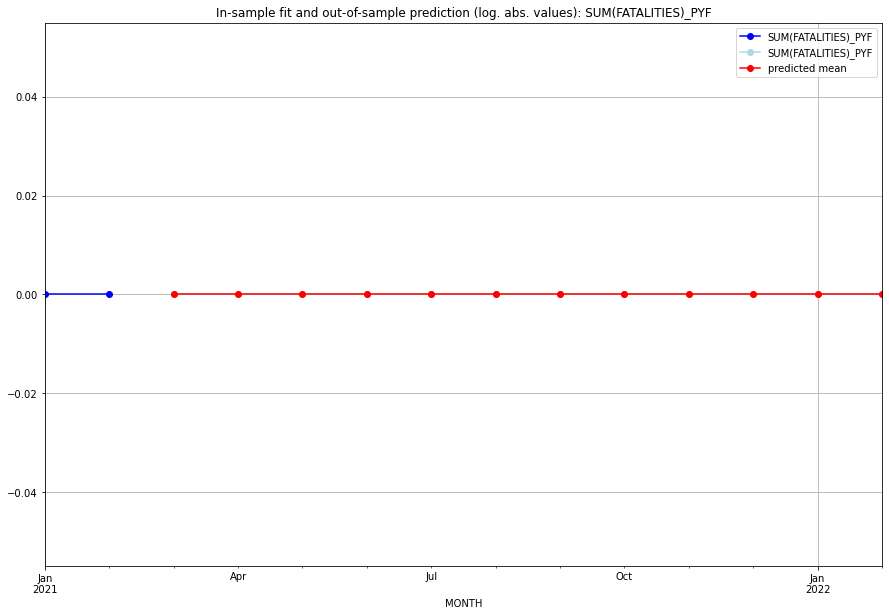

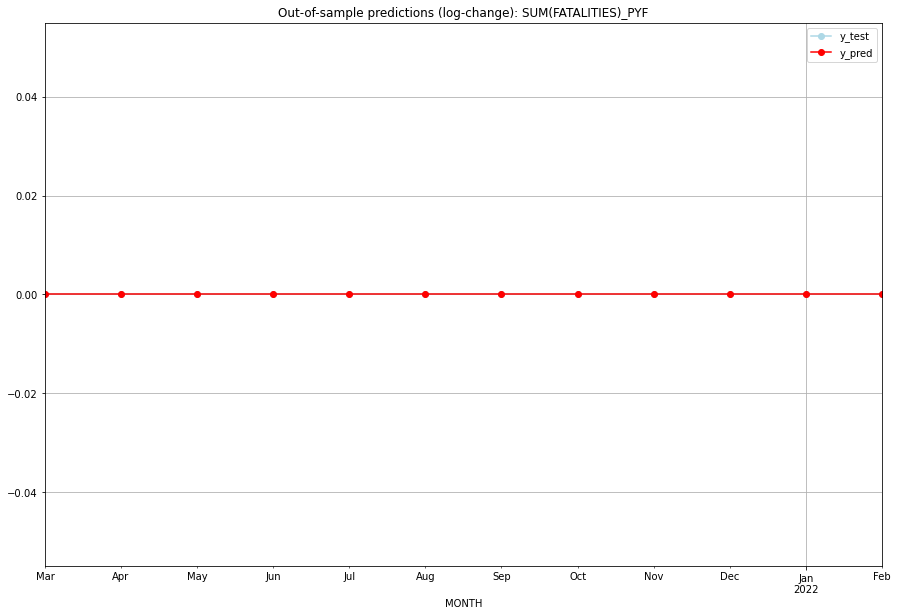

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   PYF   
1  2021-04-01       0.0         0.0           0.0             0.0   PYF   
2  2021-05-01       0.0         0.0           0.0             0.0   PYF   
3  2021-06-01       0.0         0.0           0.0             0.0   PYF   
4  2021-07-01       0.0         0.0           0.0             0.0   PYF   
5  2021-08-01       0.0         0.0           0.0             0.0   PYF   
6  2021-09-01       0.0         0.0           0.0             0.0   PYF   
7  2021-10-01       0.0         0.0           0.0             0.0   PYF   
8  2021-11-01       0.0         0.0           0.0             0.0   PYF   
9  2021-12-01       0.0         0.0           0.0             0.0   PYF   
10 2022-01-01       0.0         0.0           0.0             0.0   PYF   
11 2022-02-01       0.0         0.0           0.0             0.0   

<Figure size 432x288 with 0 Axes>

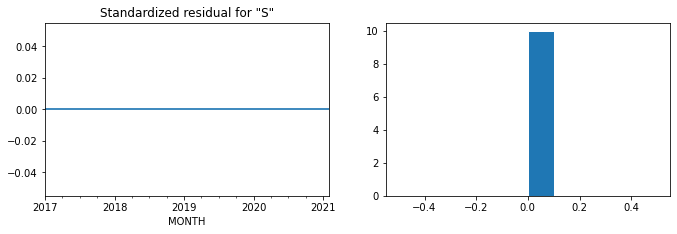

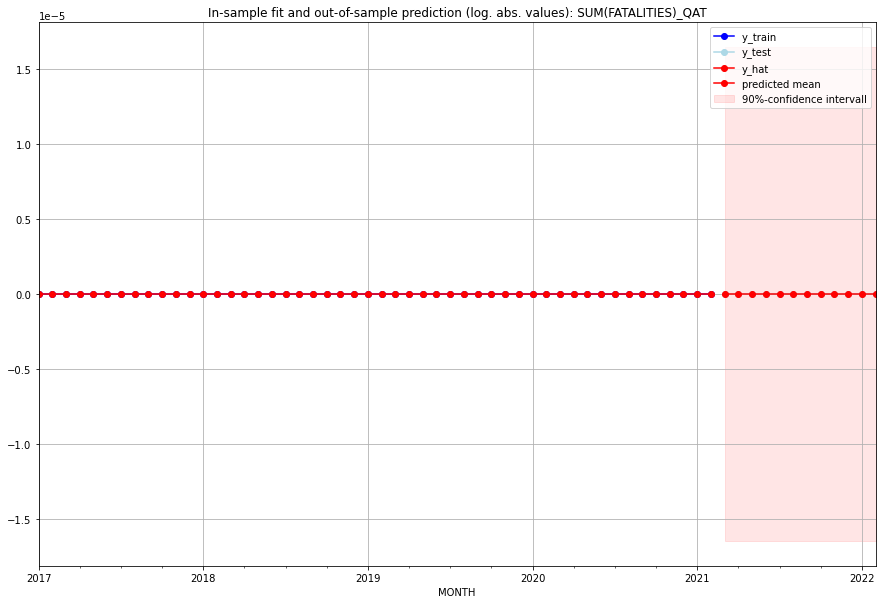

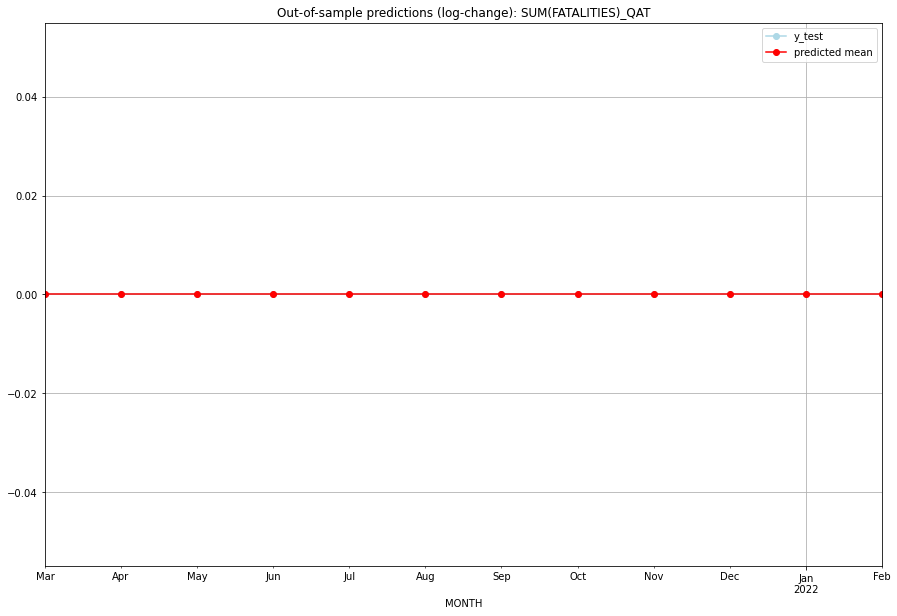

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   QAT   
1  2021-04-01       0.0         0.0           0.0             0.0   QAT   
2  2021-05-01       0.0         0.0           0.0             0.0   QAT   
3  2021-06-01       0.0         0.0           0.0             0.0   QAT   
4  2021-07-01       0.0         0.0           0.0             0.0   QAT   
5  2021-08-01       0.0         0.0           0.0             0.0   QAT   
6  2021-09-01       0.0         0.0           0.0             0.0   QAT   
7  2021-10-01       0.0         0.0           0.0             0.0   QAT   
8  2021-11-01       0.0         0.0           0.0             0.0   QAT   
9  2021-12-01       0.0         0.0           0.0             0.0   QAT   
10 2022-01-01       0.0         0.0           0.0             0.0   QAT   
11 2022-02-01       0.0         0.0           0.0             0.0   

<Figure size 432x288 with 0 Axes>

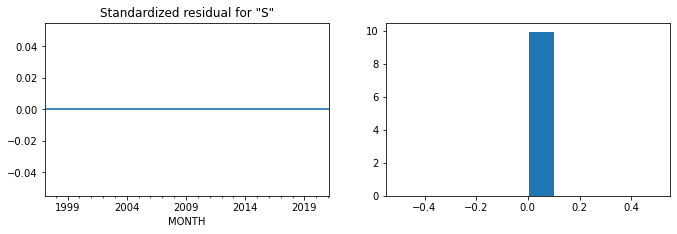

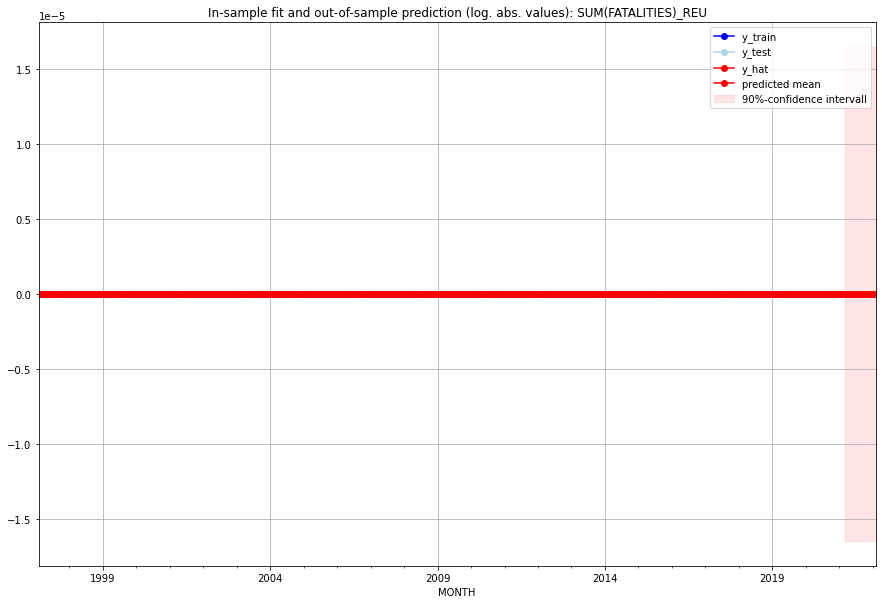

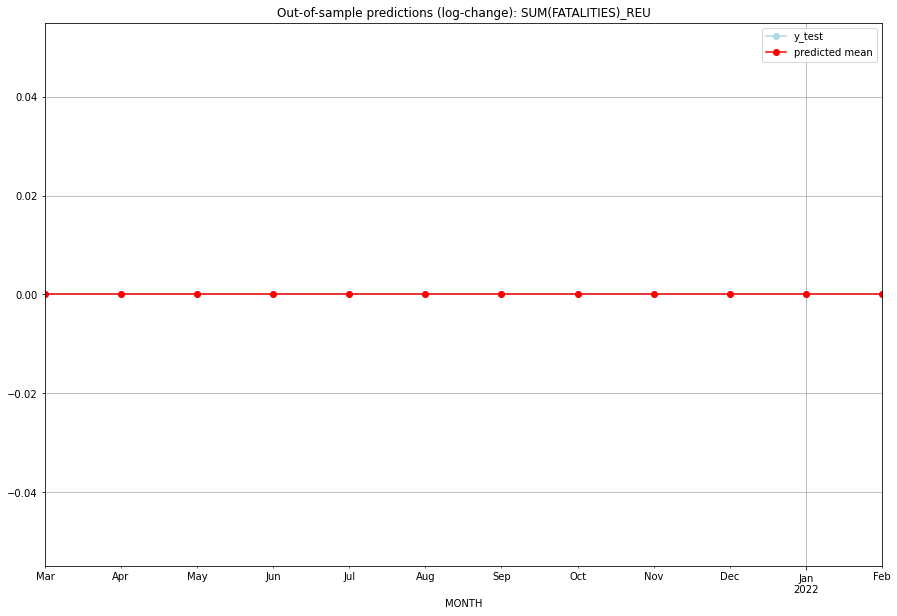

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   REU   
1  2021-04-01       0.0         0.0           0.0             0.0   REU   
2  2021-05-01       0.0         0.0           0.0             0.0   REU   
3  2021-06-01       0.0         0.0           0.0             0.0   REU   
4  2021-07-01       0.0         0.0           0.0             0.0   REU   
5  2021-08-01       0.0         0.0           0.0             0.0   REU   
6  2021-09-01       0.0         0.0           0.0             0.0   REU   
7  2021-10-01       0.0         0.0           0.0             0.0   REU   
8  2021-11-01       0.0         0.0           0.0             0.0   REU   
9  2021-12-01       0.0         0.0           0.0             0.0   REU   
10 2022-01-01       0.0         0.0           0.0             0.0   REU   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 3), (0, 1, 0, 12), 'n'], 'cv_score': 0.057762265046662105, 'fold_results': [0.057762265046662105, nan]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_ROU   No. Observations:                   38
Model:             SARIMAX(0, 1, 3)x(0, 1, [], 12)   Log Likelihood                  -9.772
Date:                             Fri, 21 Oct 2022   AIC                             27.544
Time:                                     17:19:50   BIC                             32.419
Sample:                                 01-31-2018   HQIC                            28.896
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------

<Figure size 432x288 with 0 Axes>

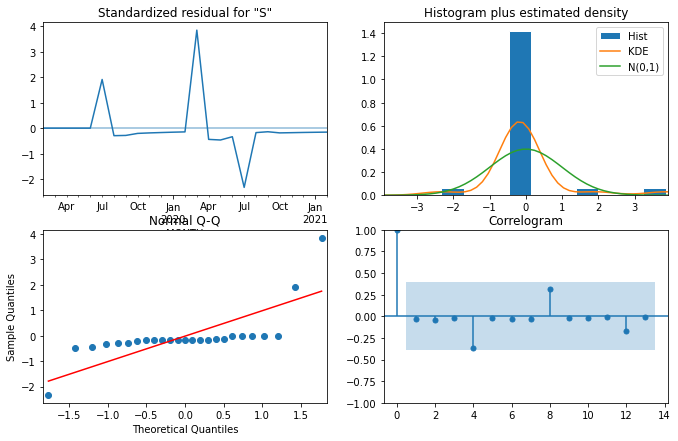

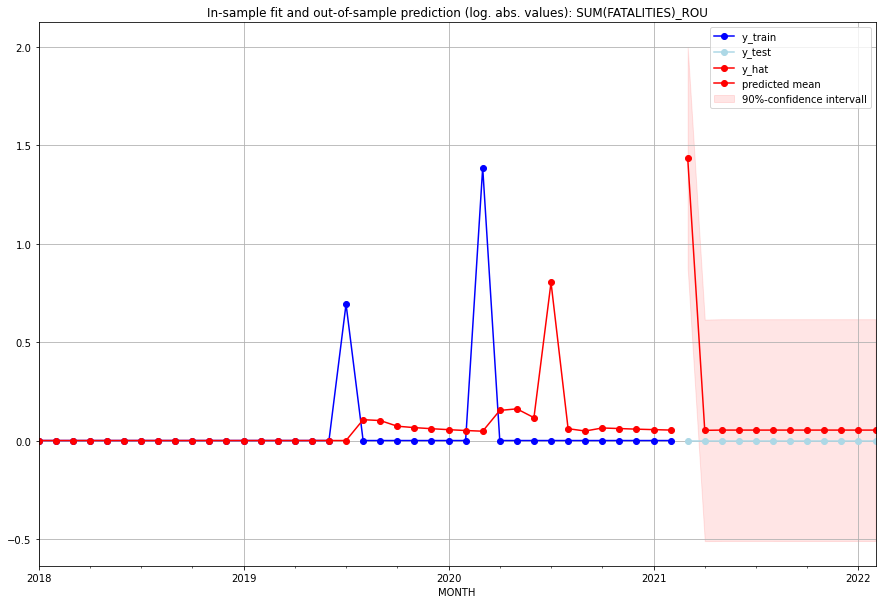

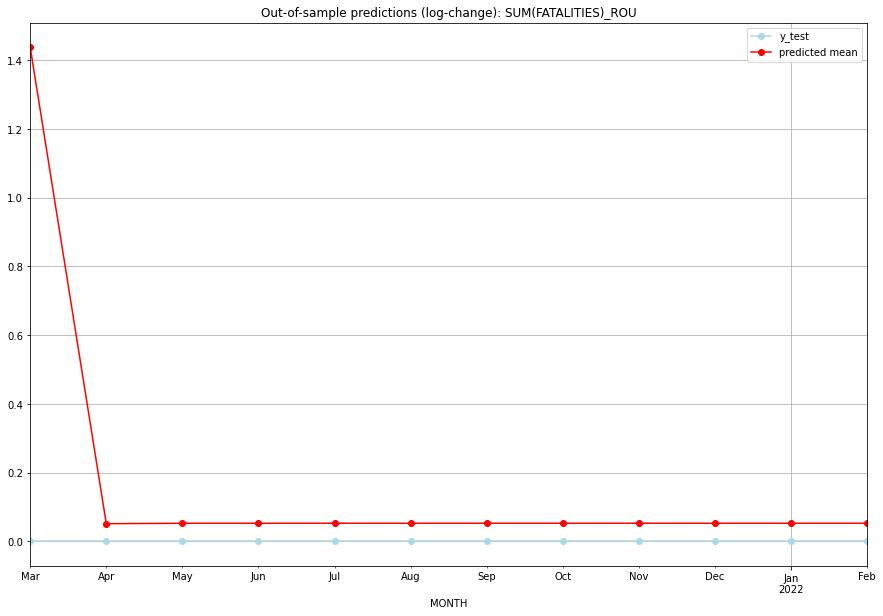

TADDA: 0.1682974424442715
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  3.209843         0.0      1.437425             0.0   ROU   
1  2021-04-01  0.053121         0.0      0.051758             0.0   ROU   
2  2021-05-01  0.054470         0.0      0.053039             0.0   ROU   
3  2021-06-01  0.054470         0.0      0.053039             0.0   ROU   
4  2021-07-01  0.054470         0.0      0.053039             0.0   ROU   
5  2021-08-01  0.054470         0.0      0.053039             0.0   ROU   
6  2021-09-01  0.054470         0.0      0.053039             0.0   ROU   
7  2021-10-01  0.054470         0.0      0.053039             0.0   ROU   
8  2021-11-01  0.054470         0.0      0.053039             0.0   ROU   
9  2021-12-01  0.054470         0.0      0.053039             0.0   ROU   
10 2022-01-01  0.054470         0.0      0.053039             0.0   ROU   
11 2022-02-01  0.054470         0.0      0.053039    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (3, 0, 3), (1, 0, 1, 12), 'n'], 'cv_score': 0.7299427099310016, 'fold_results': [0.636779661019773, 0.8231057588422304]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_RUS   No. Observations:                   38
Model:             SARIMAX(3, 0, 3)x(1, 0, [1], 12)   Log Likelihood                 -43.629
Date:                              Fri, 21 Oct 2022   AIC                            107.258
Time:                                      17:21:07   BIC                            123.633
Sample:                                  01-31-2018   HQIC                           113.084
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----

<Figure size 432x288 with 0 Axes>

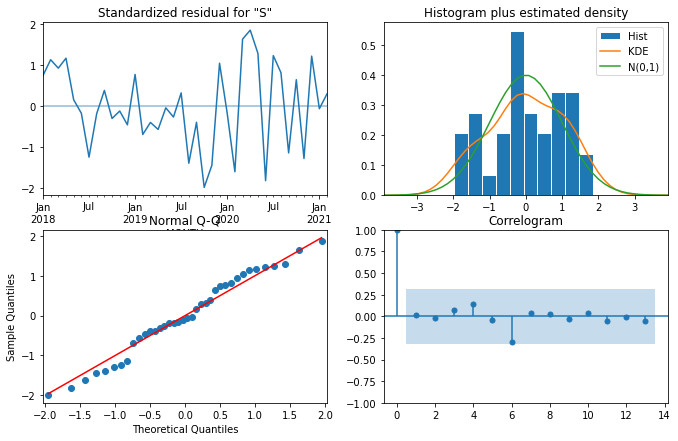

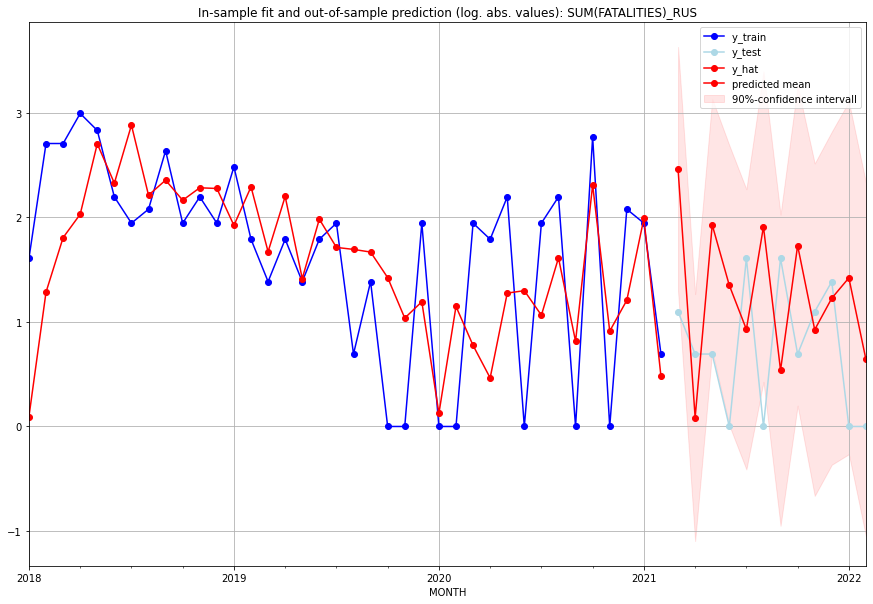

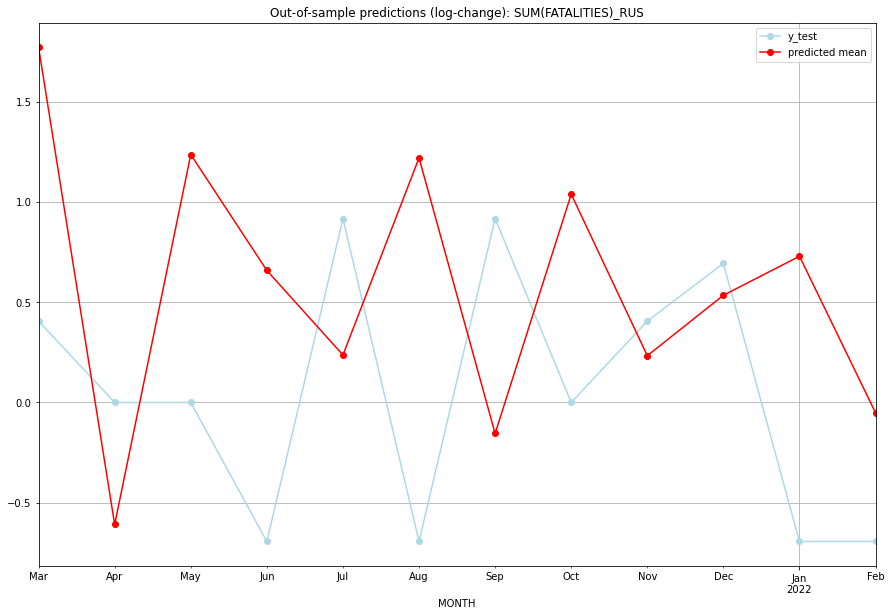

TADDA: 1.2014271839309003
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  10.748146         2.0      1.770548        0.405465   RUS   
1  2021-04-01   0.088710         1.0     -0.608154        0.000000   RUS   
2  2021-05-01   5.883281         1.0      1.235948        0.000000   RUS   
3  2021-06-01   2.861878         0.0      0.658006       -0.693147   RUS   
4  2021-07-01   1.533471         4.0      0.236443        0.916291   RUS   
5  2021-08-01   5.768796         0.0      1.219176       -0.693147   RUS   
6  2021-09-01   0.713289         4.0     -0.154732        0.916291   RUS   
7  2021-10-01   4.648919         1.0      1.038317        0.000000   RUS   
8  2021-11-01   1.525068         2.0      0.233121        0.405465   RUS   
9  2021-12-01   2.412615         3.0      0.534332        0.693147   RUS   
10 2022-01-01   3.145623         0.0      0.728906       -0.693147   RUS   
11 2022-02-01   0.898840         0.0     

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [3, (3, 1, 3), (1, 0, 0, 12), 'n'], 'cv_score': 0.6797378360097796, 'fold_results': [0.25827657404397936, 0.6736107173988647, 0.8498700688829447, 0.8608626323422331, 0.7560691873808757]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_RWA   No. Observations:                  289
Model:             SARIMAX(3, 1, 3)x(1, 0, [], 12)   Log Likelihood                -430.158
Date:                             Fri, 21 Oct 2022   AIC                            882.315
Time:                                     17:32:30   BIC                            922.608
Sample:                                 02-28-1997   HQIC                           898.462
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std 

<Figure size 432x288 with 0 Axes>

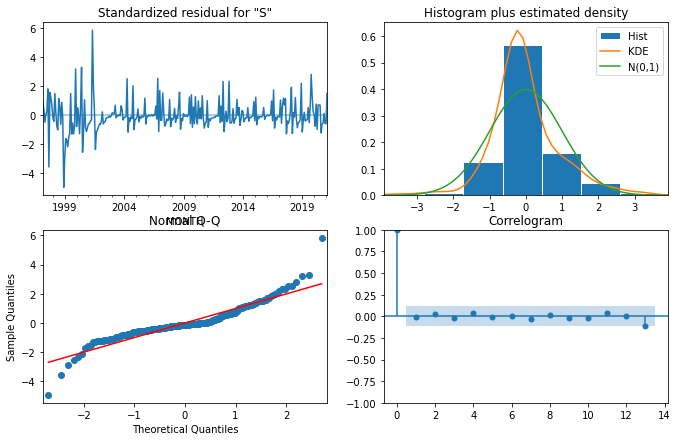

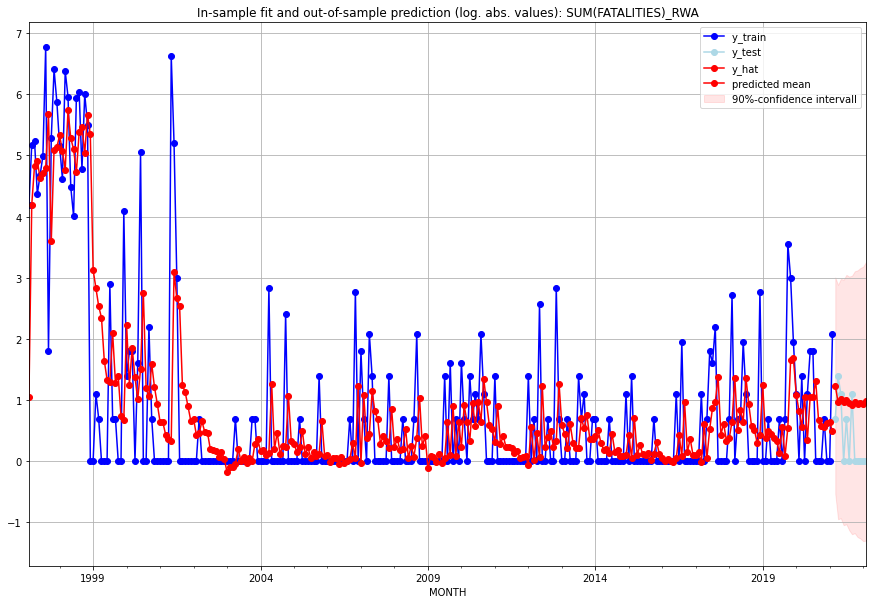

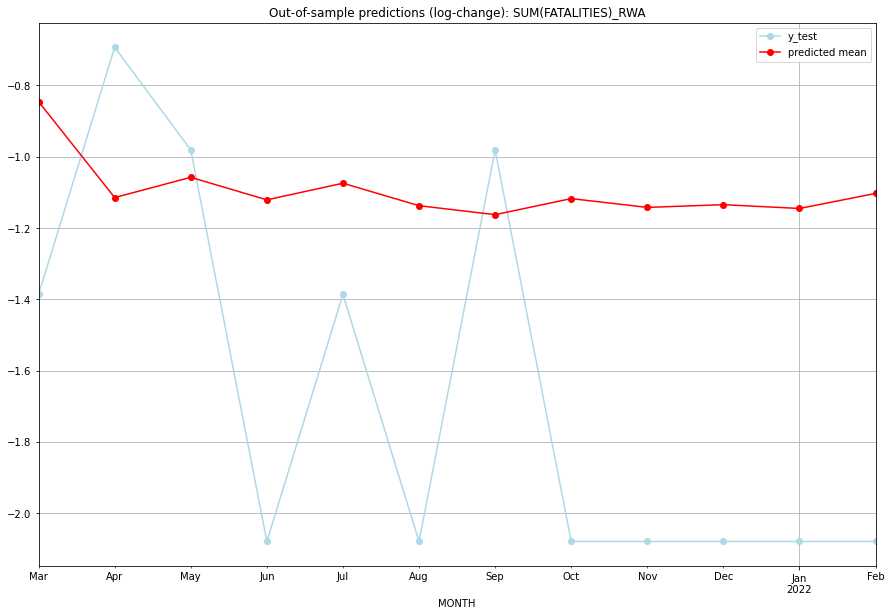

TADDA: 0.6823188068722278
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  2.434621         1.0     -0.845535       -1.386294   RWA   
1  2021-04-01  1.624136         3.0     -1.114690       -0.693147   RWA   
2  2021-05-01  1.777665         2.0     -1.057831       -0.980829   RWA   
3  2021-06-01  1.607444         0.0     -1.121071       -2.079442   RWA   
4  2021-07-01  1.731917         1.0     -1.074438       -1.386294   RWA   
5  2021-08-01  1.565048         0.0     -1.137464       -2.079442   RWA   
6  2021-09-01  1.501379         2.0     -1.162599       -0.980829   RWA   
7  2021-10-01  1.616530         0.0     -1.117593       -2.079442   RWA   
8  2021-11-01  1.552881         0.0     -1.142219       -2.079442   RWA   
9  2021-12-01  1.572426         0.0     -1.134592       -2.079442   RWA   
10 2022-01-01  1.545188         0.0     -1.145237       -2.079442   RWA   
11 2022-02-01  1.654941         0.0     -1.103019    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.99990045431305, 'fold_results': [1.3276487218655857, 0.4219158487065459, 0.3148660762098469, 0.8773506465825552, 2.057720978200716]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_SAU   No. Observations:                   74
Model:                SARIMAX(0, 1, 0)   Log Likelihood                -132.235
Date:                 Fri, 21 Oct 2022   AIC                            266.470
Time:                         17:36:11   BIC                            268.761
Sample:                     01-31-2015   HQIC                           267.383
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------

<Figure size 432x288 with 0 Axes>

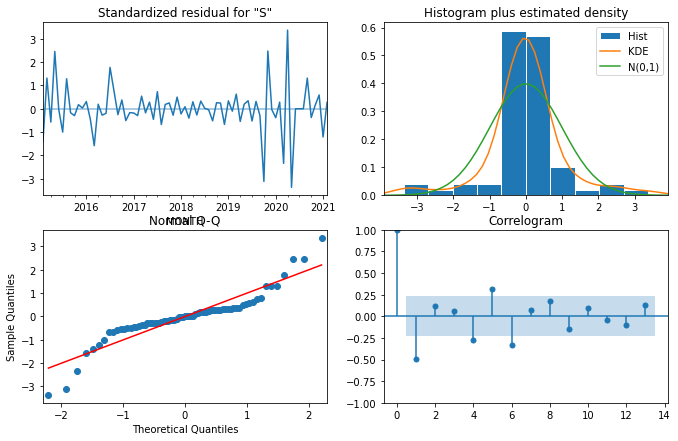

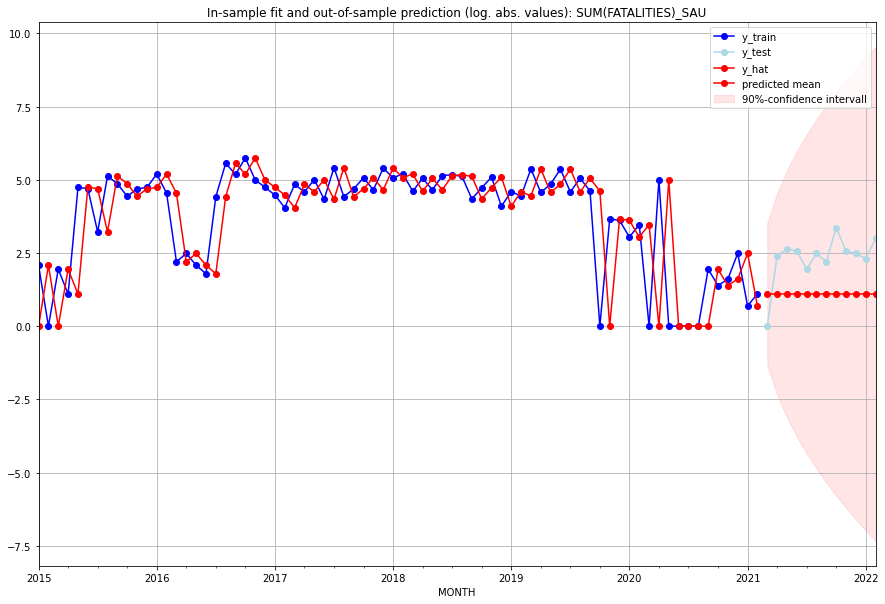

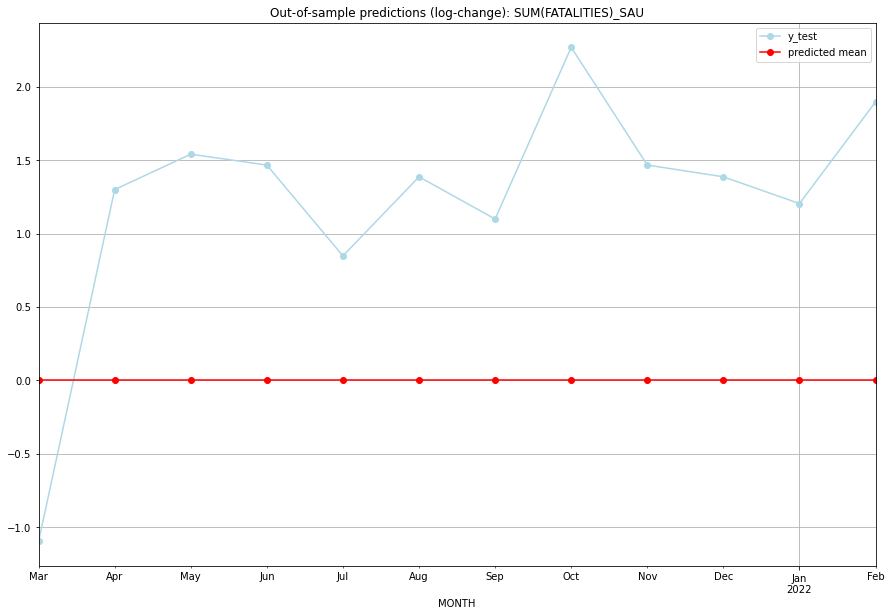

TADDA: 1.4132741377631375
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       2.0         0.0           0.0       -1.098612   SAU   
1  2021-04-01       2.0        10.0           0.0        1.299283   SAU   
2  2021-05-01       2.0        13.0           0.0        1.540445   SAU   
3  2021-06-01       2.0        12.0           0.0        1.466337   SAU   
4  2021-07-01       2.0         6.0           0.0        0.847298   SAU   
5  2021-08-01       2.0        11.0           0.0        1.386294   SAU   
6  2021-09-01       2.0         8.0           0.0        1.098612   SAU   
7  2021-10-01       2.0        28.0           0.0        2.268684   SAU   
8  2021-11-01       2.0        12.0           0.0        1.466337   SAU   
9  2021-12-01       2.0        11.0           0.0        1.386294   SAU   
10 2022-01-01       2.0         9.0           0.0        1.203973   SAU   
11 2022-02-01       2.0        19.0           0.0    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (1, 0, 2), (1, 0, 1, 12), 'n'], 'cv_score': 0.6883964152997117, 'fold_results': [0.9118900501520977, 0.6015140928460486, 0.5893250024033566, 0.5237062200147434, 0.8155467110823121]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_SDN   No. Observations:                  289
Model:             SARIMAX(1, 0, 2)x(1, 0, [1], 12)   Log Likelihood                -496.032
Date:                              Fri, 21 Oct 2022   AIC                           1008.064
Time:                                      17:47:36   BIC                           1037.395
Sample:                                  02-28-1997   HQIC                          1019.817
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef 

<Figure size 432x288 with 0 Axes>

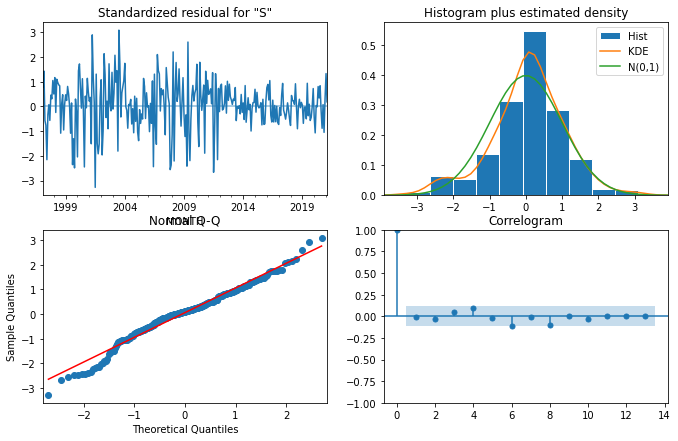

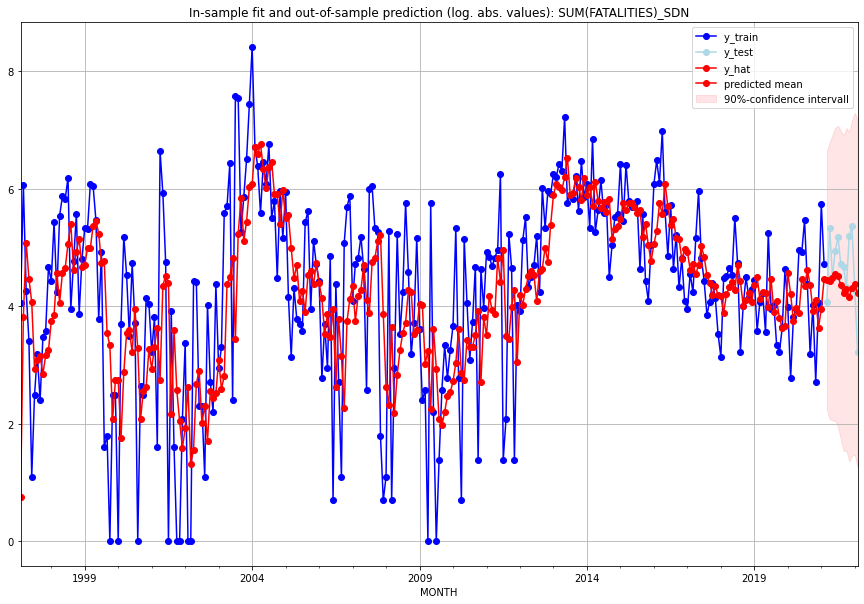

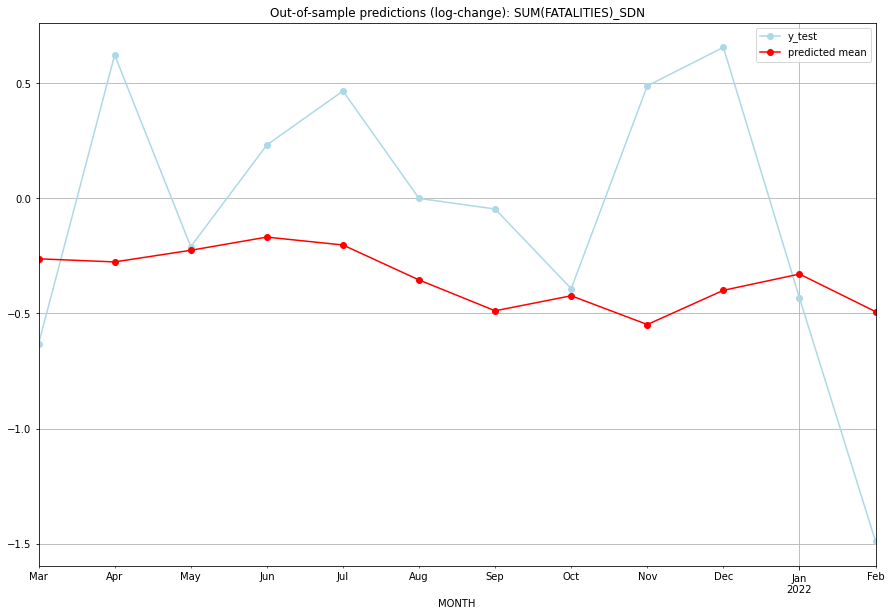

TADDA: 0.6642335455444786
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  84.379650        58.0     -0.262422       -0.631993   SDN   
1  2021-04-01  83.230513       206.0     -0.275973        0.623189   SDN   
2  2021-05-01  87.596646        89.0     -0.225436       -0.209721   SDN   
3  2021-06-01  92.821248       139.0     -0.168139        0.232112   SDN   
4  2021-07-01  89.656882       176.0     -0.202448        0.466620   SDN   
5  2021-08-01  76.882645       110.0     -0.354327        0.000000   SDN   
6  2021-09-01  67.115077       105.0     -0.488332       -0.046091   SDN   
7  2021-10-01  71.708614        74.0     -0.423070       -0.392042   SDN   
8  2021-11-01  63.171007       180.0     -0.547979        0.488967   SDN   
9  2021-12-01  73.451680       213.0     -0.399380        0.656446   SDN   
10 2022-01-01  78.900003        71.0     -0.328754       -0.432864   SDN   
11 2022-02-01  66.864724        24.0     

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (0, 0, 2), (0, 0, 0, 12), 'n'], 'cv_score': 0.3115285496796705, 'fold_results': [0.541019986251706, 0.28881132523331055, 0.39539609969964634, 0.18310204811135164, 0.1493132891023379]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_SEN   No. Observations:                  289
Model:                SARIMAX(0, 0, 2)   Log Likelihood                -429.700
Date:                 Fri, 21 Oct 2022   AIC                            869.400
Time:                         17:59:33   BIC                            887.733
Sample:                     02-28-1997   HQIC                           876.746
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------

<Figure size 432x288 with 0 Axes>

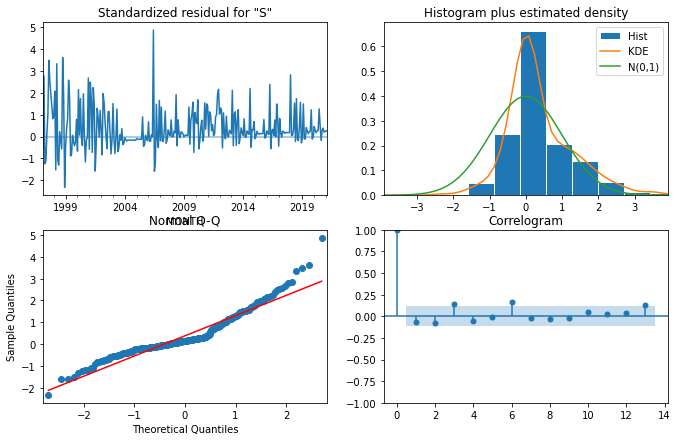



Best CV-Results
{'params': [2, (1, 0, 1), (2, 0, 2, 12), 'n'], 'cv_score': 0.4556994247487911, 'fold_results': [0.3554902393690416, 0.32521820216385805, 0.5481659947122192, 0.5939232627500455, nan]}
Training finished.
                                        SARIMAX Results                                        
Dep. Variable:                     SUM(FATALITIES)_SLE   No. Observations:                  289
Model:             SARIMAX(1, 0, 1)x(2, 0, [1, 2], 12)   Log Likelihood                -215.386
Date:                                 Fri, 21 Oct 2022   AIC                            448.773
Time:                                         18:12:26   BIC                            481.770
Sample:                                     02-28-1997   HQIC                           461.995
                                          - 02-28-2021                                         
Covariance Type:                                   opg                                         
            

<Figure size 432x288 with 0 Axes>

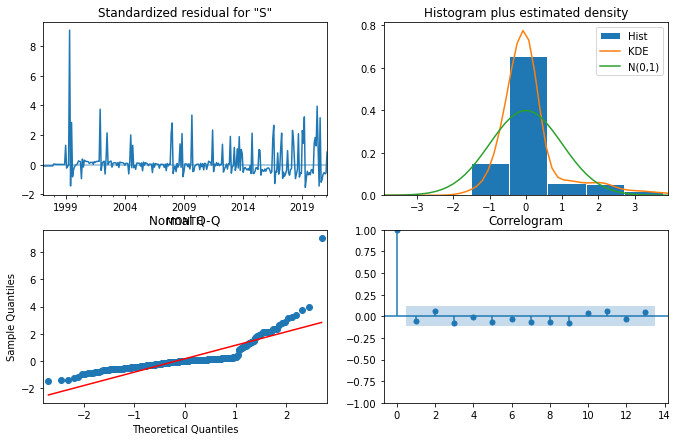

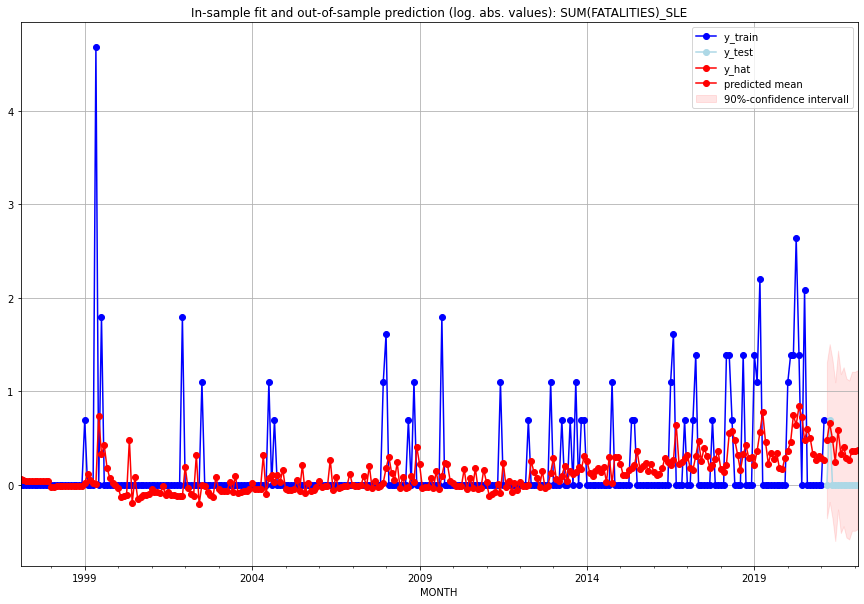

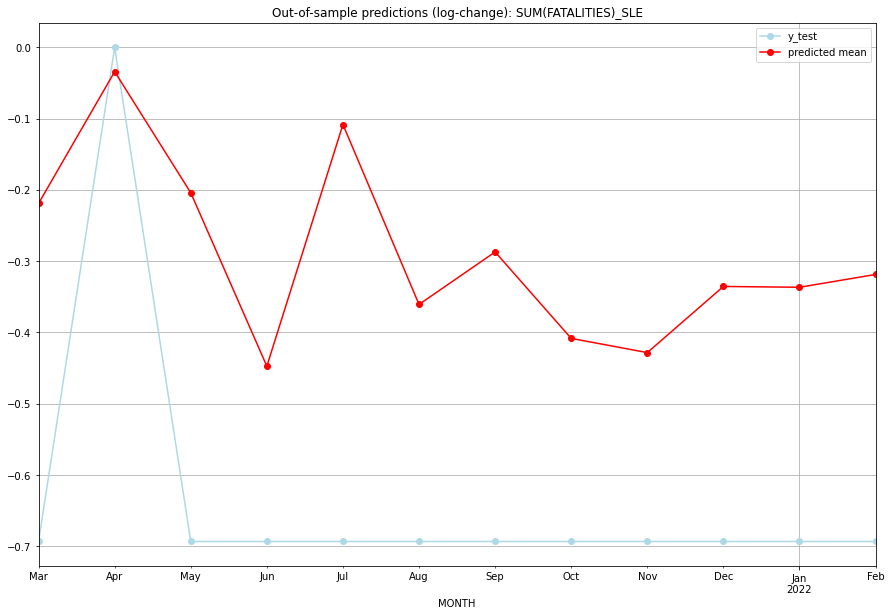

TADDA: 0.35044130433348325
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.606656         0.0     -0.218992       -0.693147   SLE   
1  2021-04-01  0.932909         1.0     -0.034121        0.000000   SLE   
2  2021-05-01  0.630847         0.0     -0.204047       -0.693147   SLE   
3  2021-06-01  0.278757         0.0     -0.447258       -0.693147   SLE   
4  2021-07-01  0.794764         0.0     -0.108273       -0.693147   SLE   
5  2021-08-01  0.394418         0.0     -0.360670       -0.693147   SLE   
6  2021-09-01  0.500932         0.0     -0.287061       -0.693147   SLE   
7  2021-10-01  0.329559         0.0     -0.408300       -0.693147   SLE   
8  2021-11-01  0.303338         0.0     -0.428219       -0.693147   SLE   
9  2021-12-01  0.430043         0.0     -0.335443       -0.693147   SLE   
10 2022-01-01  0.428431         0.0     -0.336571       -0.693147   SLE   
11 2022-02-01  0.454318         0.0     -0.318610   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (1, 0, 0), (0, 1, 1, 12), 'n'], 'cv_score': 0.2705849899589194, 'fold_results': [nan, 0.2705849899589194]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_SLV   No. Observations:                   38
Model:             SARIMAX(1, 0, 0)x(0, 1, [1], 12)   Log Likelihood                 -10.307
Date:                              Fri, 21 Oct 2022   AIC                             30.615
Time:                                      18:13:41   BIC                             36.905
Sample:                                  01-31-2018   HQIC                            32.426
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------

<Figure size 432x288 with 0 Axes>

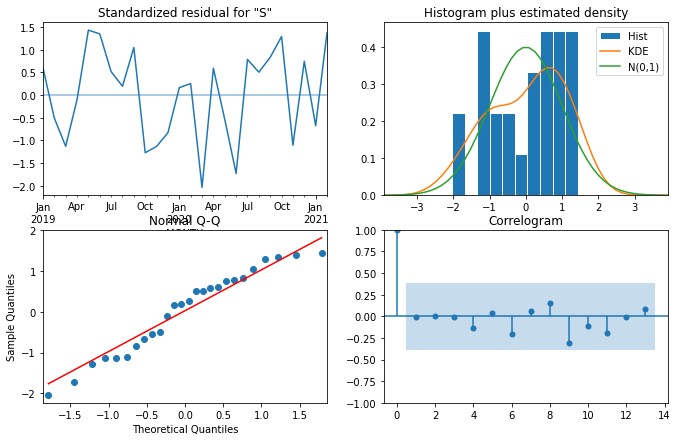

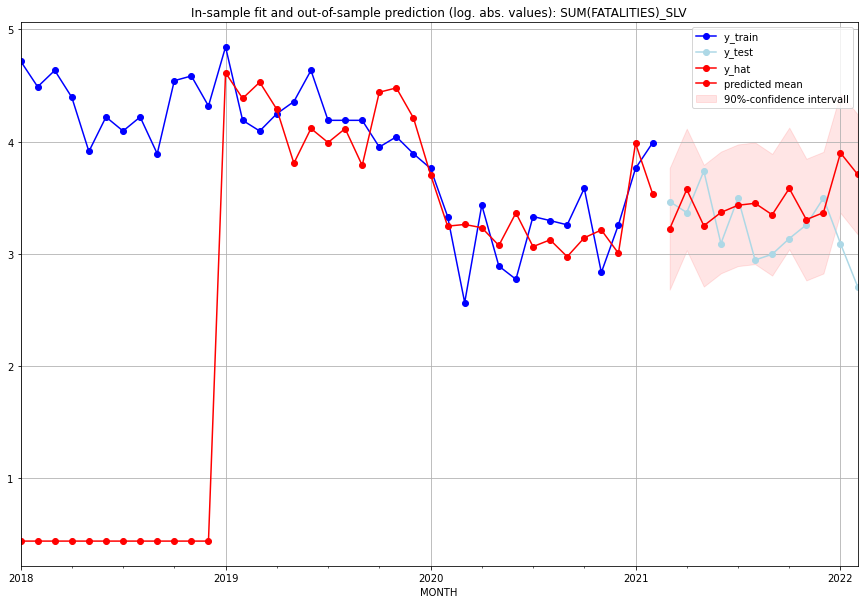

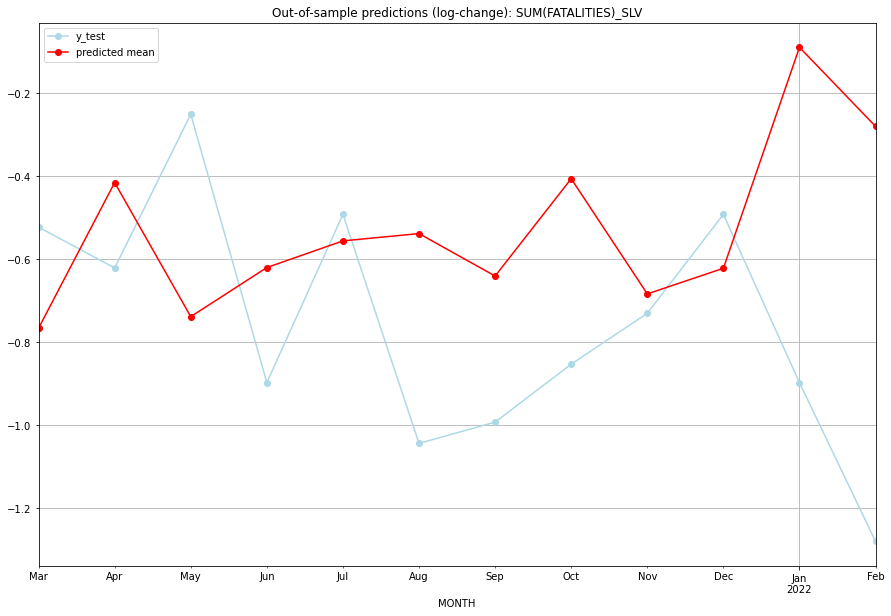

TADDA: 0.38068229104943346
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  24.081814        31.0     -0.766841       -0.523248   SLV   
1  2021-04-01  34.628366        28.0     -0.415842       -0.621688   SLV   
2  2021-05-01  24.789790        41.0     -0.739005       -0.251314   SLV   
3  2021-06-01  28.029365        21.0     -0.620676       -0.897942   SLV   
4  2021-07-01  29.956040        32.0     -0.556416       -0.492476   SLV   
5  2021-08-01  30.505290        18.0     -0.538829       -1.044545   SLV   
6  2021-09-01  27.441843        19.0     -0.641123       -0.993252   SLV   
7  2021-10-01  34.960714        22.0     -0.406557       -0.853490   SLV   
8  2021-11-01  26.241795        25.0     -0.684232       -0.730888   SLV   
9  2021-12-01  27.978445        32.0     -0.622432       -0.492476   SLV   
10 2022-01-01  48.359349        21.0     -0.089857       -0.897942   SLV   
11 2022-02-01  39.789649        14.0    

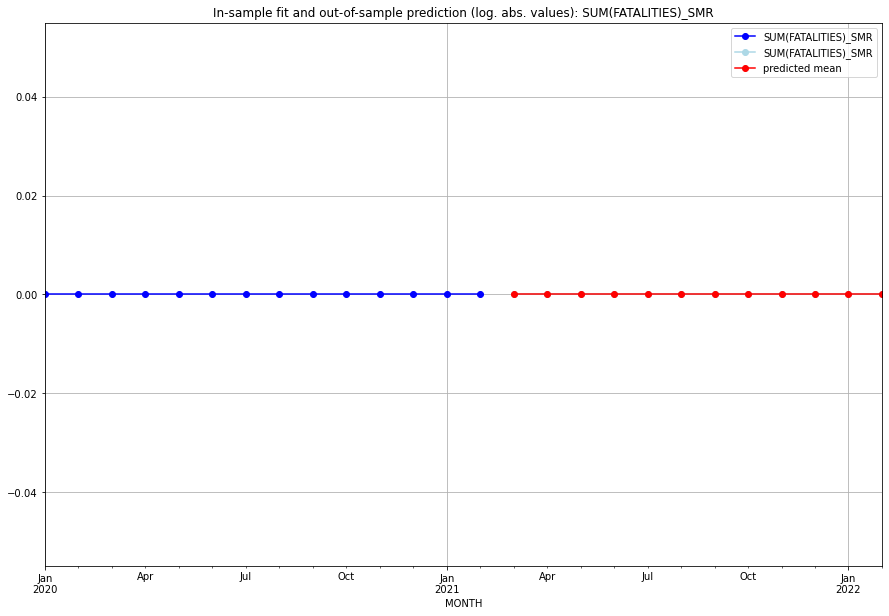

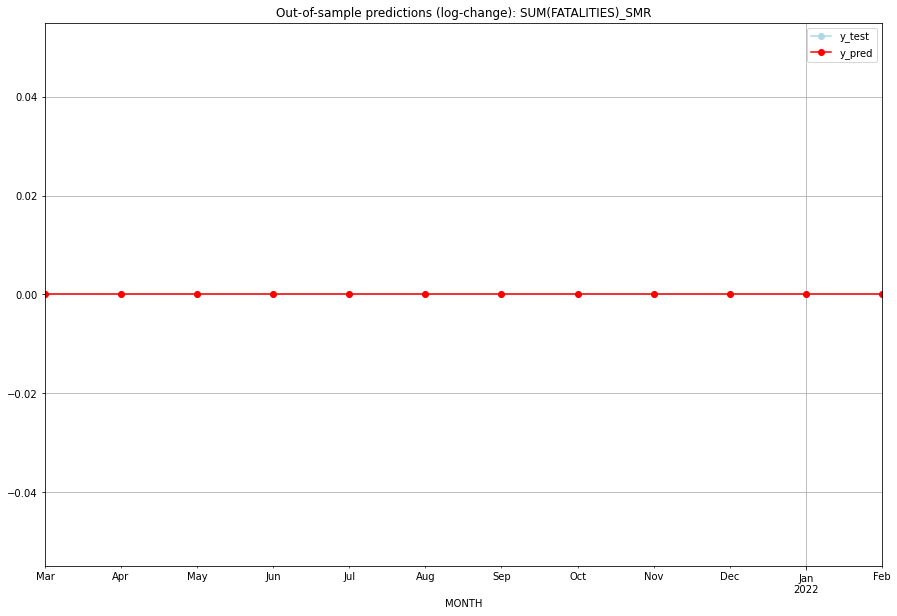

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   SMR   
1  2021-04-01       0.0         0.0           0.0             0.0   SMR   
2  2021-05-01       0.0         0.0           0.0             0.0   SMR   
3  2021-06-01       0.0         0.0           0.0             0.0   SMR   
4  2021-07-01       0.0         0.0           0.0             0.0   SMR   
5  2021-08-01       0.0         0.0           0.0             0.0   SMR   
6  2021-09-01       0.0         0.0           0.0             0.0   SMR   
7  2021-10-01       0.0         0.0           0.0             0.0   SMR   
8  2021-11-01       0.0         0.0           0.0             0.0   SMR   
9  2021-12-01       0.0         0.0           0.0             0.0   SMR   
10 2022-01-01       0.0         0.0           0.0             0.0   SMR   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.23167300007808134, 'fold_results': [0.1651273091517115, 0.21798512924871657, 0.1793142319553159, 0.4907191836195352, 0.1052191464151276]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_SOM   No. Observations:                  289
Model:                SARIMAX(0, 1, 0)   Log Likelihood                -431.320
Date:                 Fri, 21 Oct 2022   AIC                            864.640
Time:                         18:24:15   BIC                            868.303
Sample:                     02-28-1997   HQIC                           866.108
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------

<Figure size 432x288 with 0 Axes>

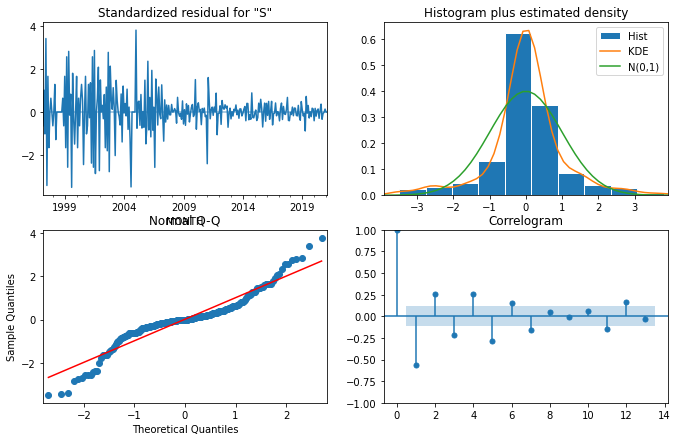

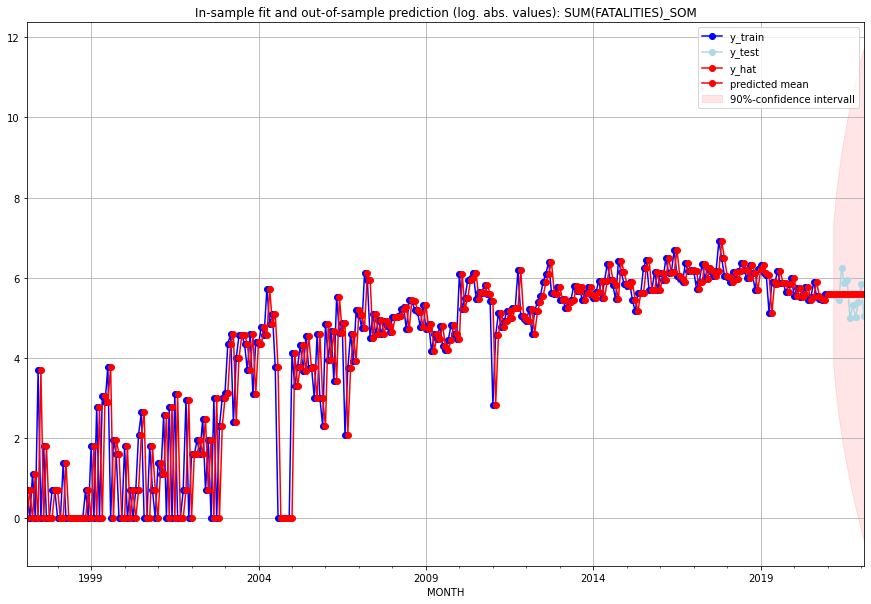

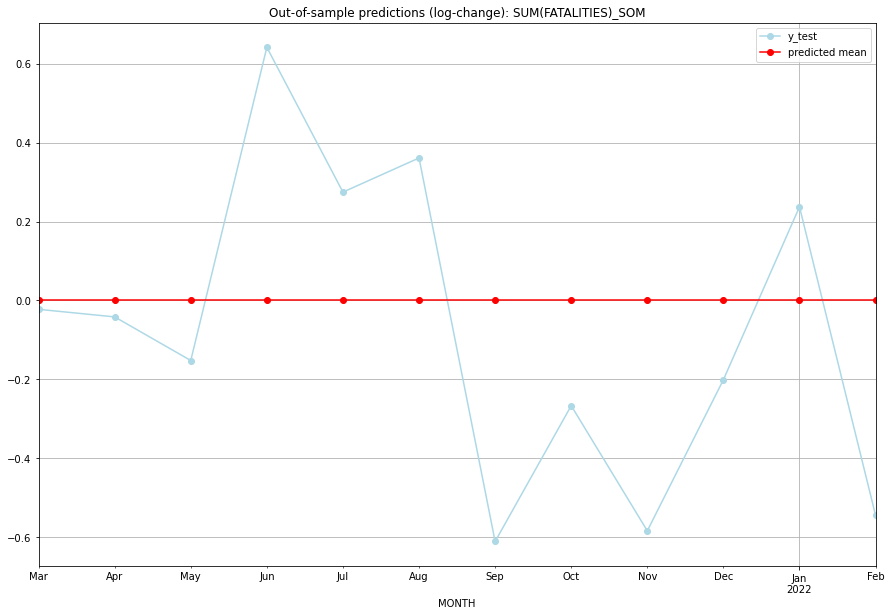

TADDA: 0.3282582418896612
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01     268.0       262.0           0.0       -0.022557   SOM   
1  2021-04-01     268.0       257.0           0.0       -0.041752   SOM   
2  2021-05-01     268.0       230.0           0.0       -0.152294   SOM   
3  2021-06-01     268.0       510.0           0.0        0.641658   SOM   
4  2021-07-01     268.0       353.0           0.0        0.274586   SOM   
5  2021-08-01     268.0       385.0           0.0        0.361126   SOM   
6  2021-09-01     268.0       145.0           0.0       -0.611105   SOM   
7  2021-10-01     268.0       205.0           0.0       -0.266835   SOM   
8  2021-11-01     268.0       149.0           0.0       -0.584076   SOM   
9  2021-12-01     268.0       219.0           0.0       -0.201084   SOM   
10 2022-01-01     268.0       340.0           0.0        0.237171   SOM   
11 2022-02-01     268.0       155.0           0.0    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (0, 1, 3), (0, 0, 0, 12), 'n'], 'cv_score': 0.0, 'fold_results': [nan, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_SRB   No. Observations:                   38
Model:                SARIMAX(0, 1, 3)   Log Likelihood                  -3.197
Date:                 Fri, 21 Oct 2022   AIC                             16.394
Time:                         18:25:31   BIC                             24.449
Sample:                     01-31-2018   HQIC                            19.234
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0162      0.033     -0.486      0.627      -0.081       

<Figure size 432x288 with 0 Axes>

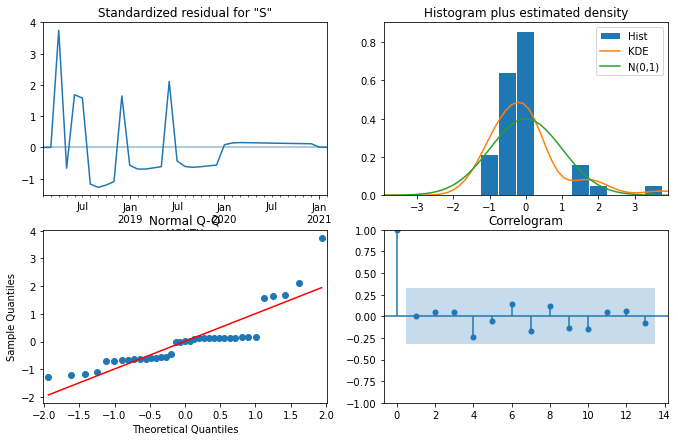

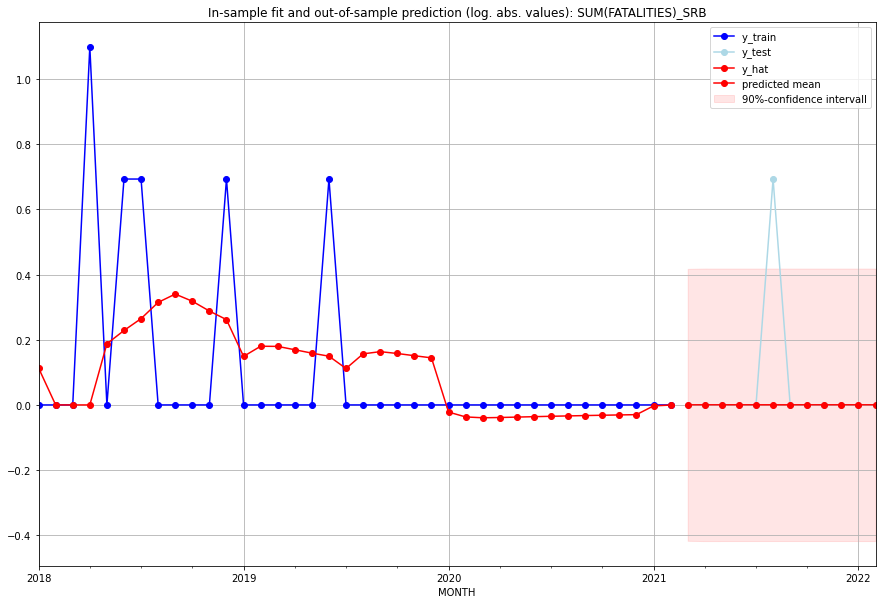

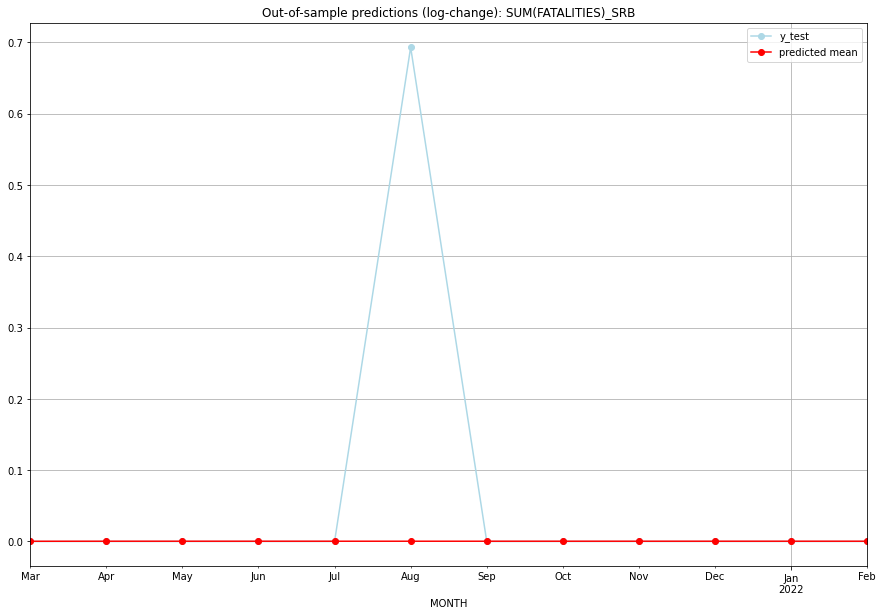

TADDA: 0.05807839272783544
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.000308         0.0      0.000308        0.000000   SRB   
1  2021-04-01  0.000383         0.0      0.000382        0.000000   SRB   
2  2021-05-01  0.000388         0.0      0.000388        0.000000   SRB   
3  2021-06-01  0.000388         0.0      0.000388        0.000000   SRB   
4  2021-07-01  0.000388         0.0      0.000388        0.000000   SRB   
5  2021-08-01  0.000388         1.0      0.000388        0.693147   SRB   
6  2021-09-01  0.000388         0.0      0.000388        0.000000   SRB   
7  2021-10-01  0.000388         0.0      0.000388        0.000000   SRB   
8  2021-11-01  0.000388         0.0      0.000388        0.000000   SRB   
9  2021-12-01  0.000388         0.0      0.000388        0.000000   SRB   
10 2022-01-01  0.000388         0.0      0.000388        0.000000   SRB   
11 2022-02-01  0.000388         0.0      0.000388   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (2, 0, 3), (1, 0, 0, 12), 'n'], 'cv_score': 0.6591083763875766, 'fold_results': [0.6297265449764703, 0.6492252522837735, 0.740975353754135, 0.6580558579643824, 0.6175588729591217]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_SSD   No. Observations:                  289
Model:             SARIMAX(2, 0, 3)x(1, 0, [], 12)   Log Likelihood                -553.937
Date:                             Fri, 21 Oct 2022   AIC                           1121.874
Time:                                     18:35:54   BIC                           1147.539
Sample:                                 02-28-1997   HQIC                          1132.157
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std er

<Figure size 432x288 with 0 Axes>

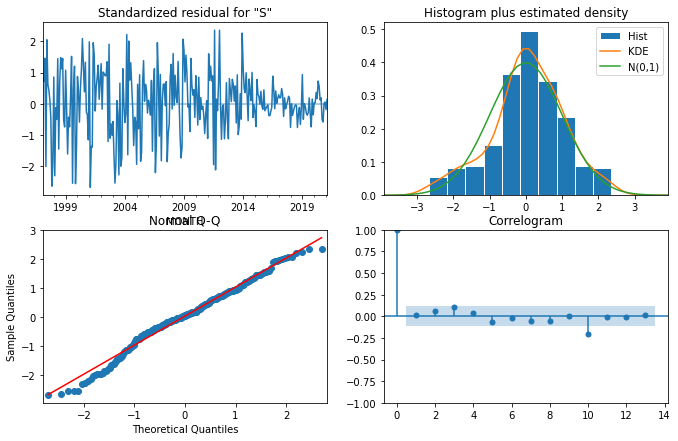

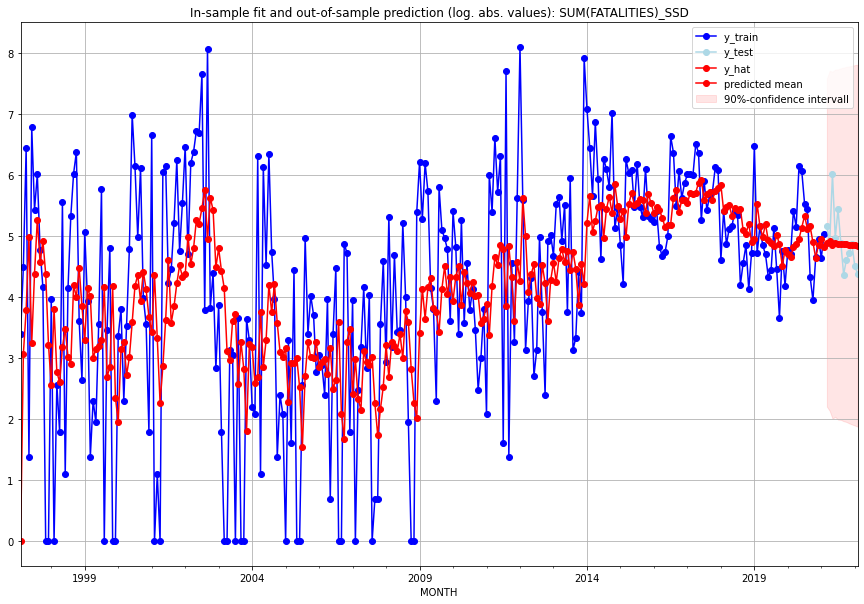

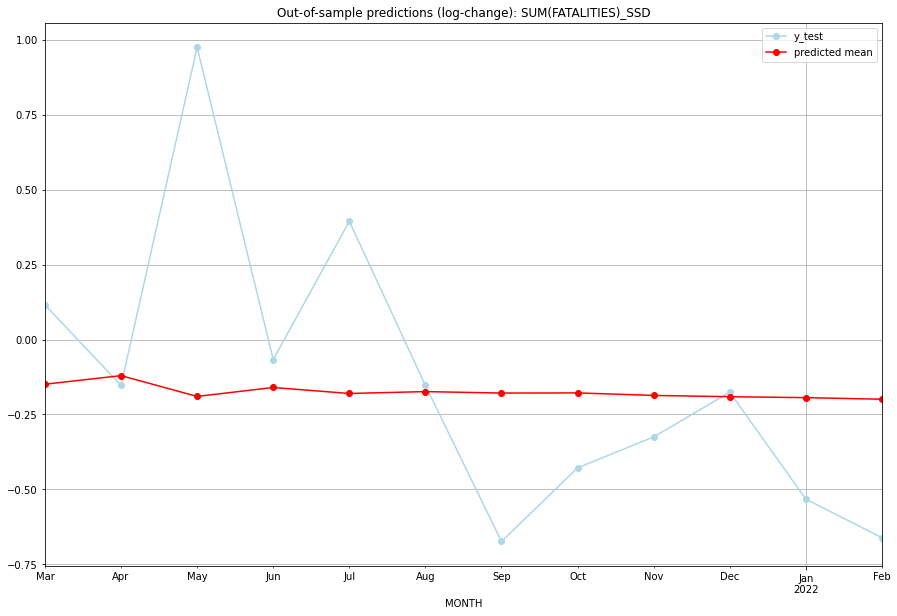

TADDA: 0.3641371588323663
Evaluation finished.
        MONTH    FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  132.525777       173.0     -0.149131        0.115630   SSD   
1  2021-04-01  136.403588       132.0     -0.120503       -0.153076   SSD   
2  2021-05-01  127.200425       410.0     -0.189830        0.975168   SSD   
3  2021-06-01  131.076114       144.0     -0.160047       -0.066691   SSD   
4  2021-07-01  128.457612       229.0     -0.180072        0.394654   SSD   
5  2021-08-01  129.279192       132.0     -0.173745       -0.153076   SSD   
6  2021-09-01  128.641068        78.0     -0.178656       -0.673977   SSD   
7  2021-10-01  128.706264       100.0     -0.178153       -0.428305   SSD   
8  2021-11-01  127.622248       111.0     -0.186545       -0.324926   SSD   
9  2021-12-01  127.077571       129.0     -0.190789       -0.175891   SSD   
10 2022-01-01  126.672667        90.0     -0.193955       -0.532566   SSD   
11 2022-02-01  126.000881    

<Figure size 432x288 with 0 Axes>

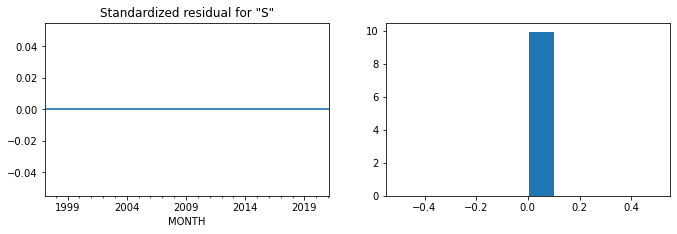

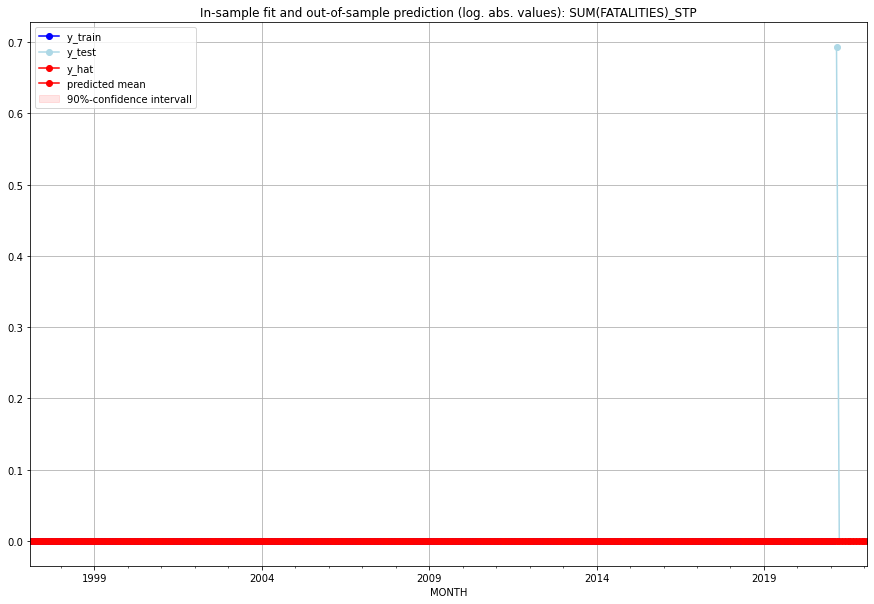

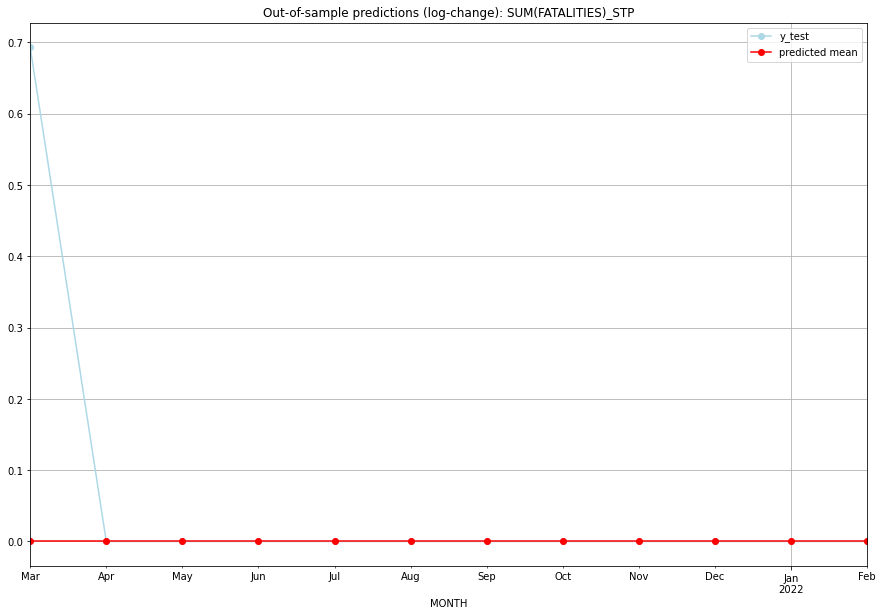

TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         1.0           0.0        0.693147   STP   
1  2021-04-01       0.0         0.0           0.0        0.000000   STP   
2  2021-05-01       0.0         0.0           0.0        0.000000   STP   
3  2021-06-01       0.0         0.0           0.0        0.000000   STP   
4  2021-07-01       0.0         0.0           0.0        0.000000   STP   
5  2021-08-01       0.0         0.0           0.0        0.000000   STP   
6  2021-09-01       0.0         0.0           0.0        0.000000   STP   
7  2021-10-01       0.0         0.0           0.0        0.000000   STP   
8  2021-11-01       0.0         0.0           0.0        0.000000   STP   
9  2021-12-01       0.0         0.0           0.0        0.000000   STP   
10 2022-01-01       0.0         0.0           0.0        0.000000   STP   
11 2022-02-01       0.0         0.0           0.0  

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (1, 0, 3), (0, 1, 0, 12), 'n'], 'cv_score': 0.057762265046662105, 'fold_results': [nan, 0.057762265046662105]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_SUR   No. Observations:                   38
Model:             SARIMAX(1, 0, 3)x(0, 1, [], 12)   Log Likelihood                 -19.883
Date:                             Fri, 21 Oct 2022   AIC                             49.765
Time:                                     18:37:41   BIC                             56.056
Sample:                                 01-31-2018   HQIC                            51.577
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------

<Figure size 432x288 with 0 Axes>

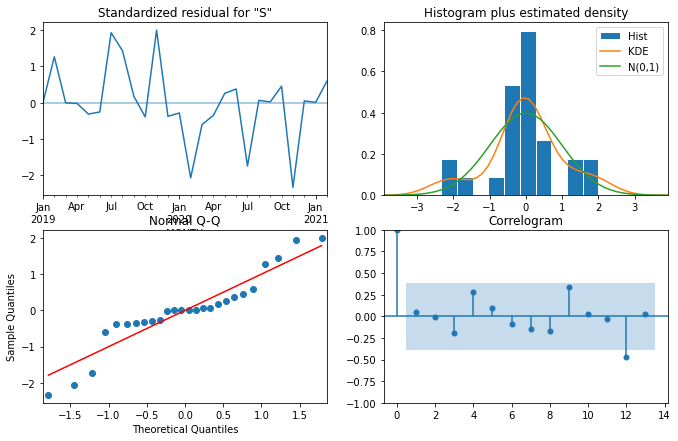

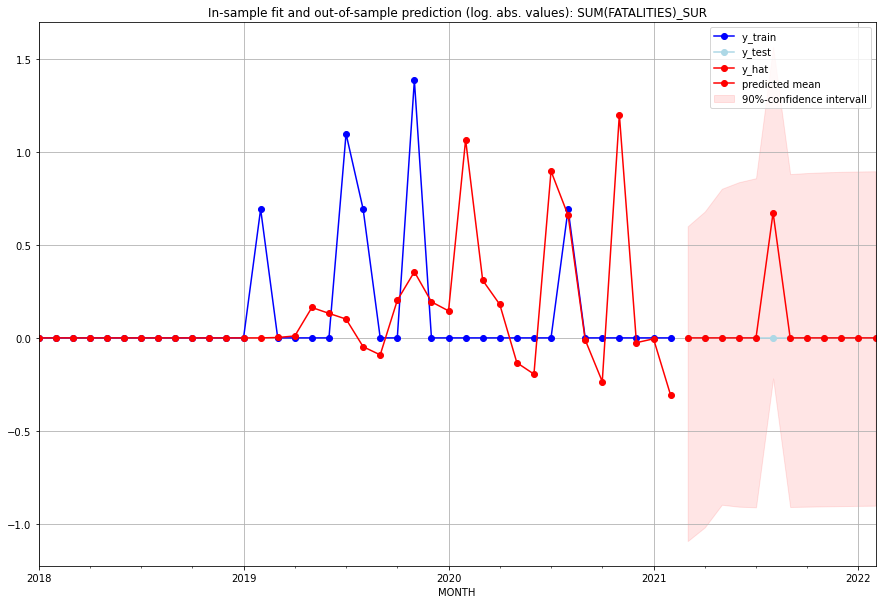

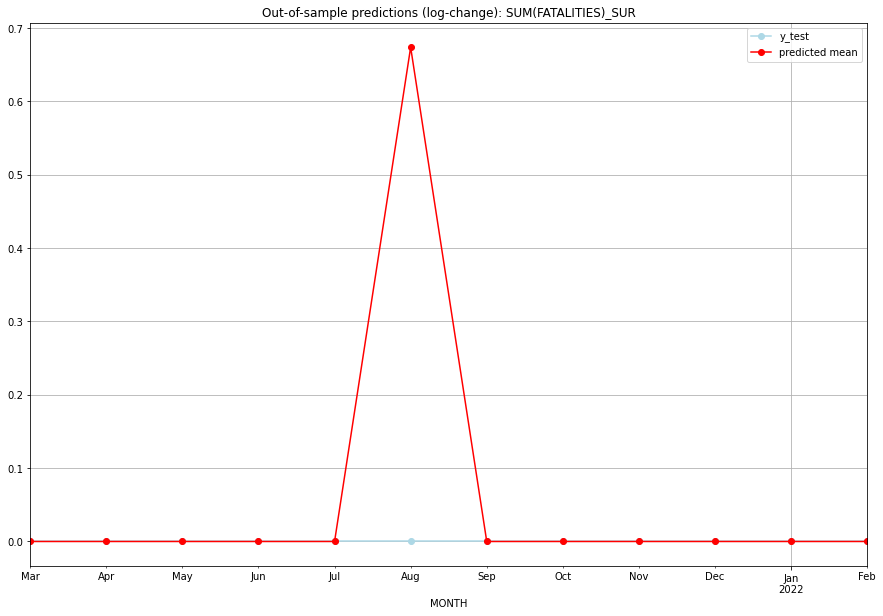

TADDA: 0.05615193377669131
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.000000         0.0      0.000000             0.0   SUR   
1  2021-04-01  0.000000         0.0      0.000000             0.0   SUR   
2  2021-05-01  0.000000         0.0      0.000000             0.0   SUR   
3  2021-06-01  0.000000         0.0      0.000000             0.0   SUR   
4  2021-07-01  0.000000         0.0      0.000000             0.0   SUR   
5  2021-08-01  0.961723         0.0      0.673823             0.0   SUR   
6  2021-09-01  0.000000         0.0      0.000000             0.0   SUR   
7  2021-10-01  0.000000         0.0      0.000000             0.0   SUR   
8  2021-11-01  0.000000         0.0      0.000000             0.0   SUR   
9  2021-12-01  0.000000         0.0      0.000000             0.0   SUR   
10 2022-01-01  0.000000         0.0      0.000000             0.0   SUR   
11 2022-02-01  0.000000         0.0      0.000000   

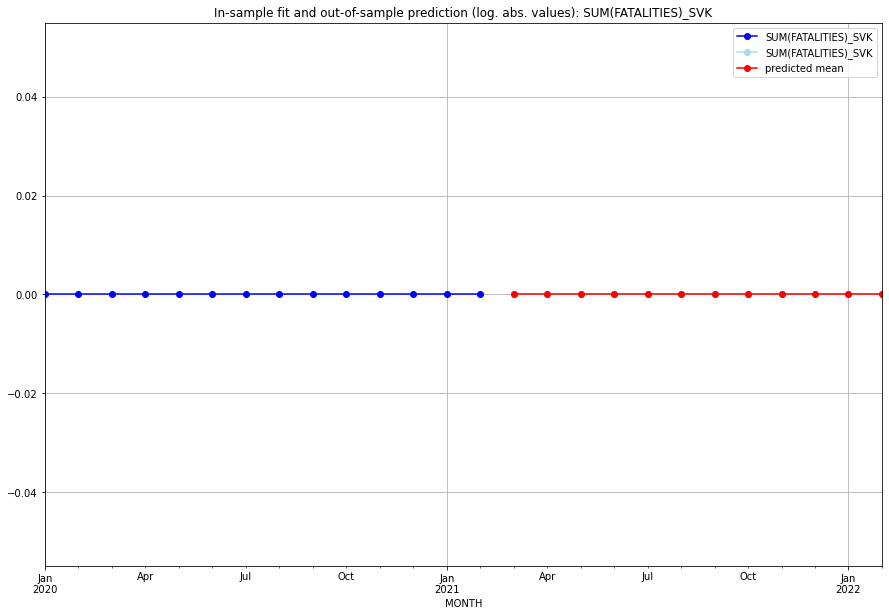

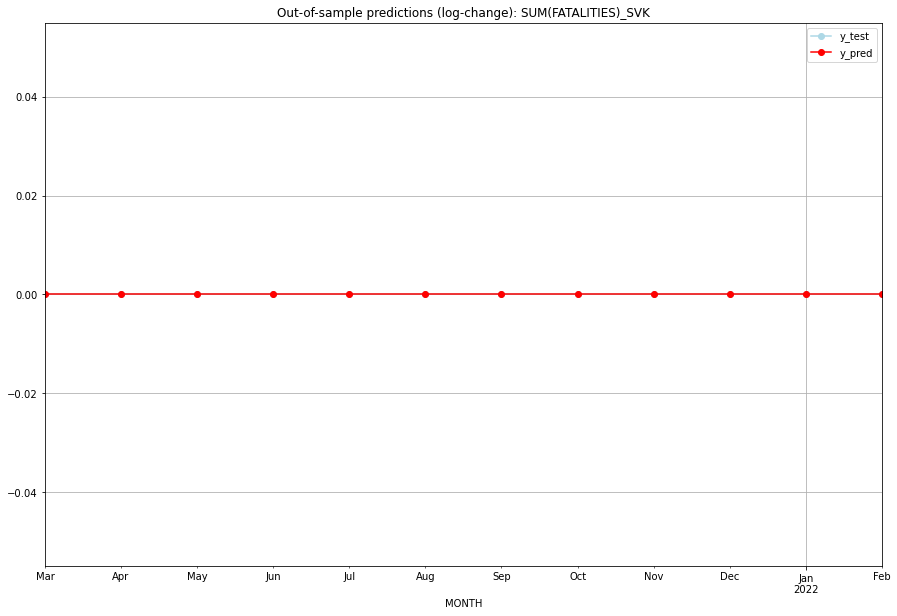

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   SVK   
1  2021-04-01       0.0         0.0           0.0             0.0   SVK   
2  2021-05-01       0.0         0.0           0.0             0.0   SVK   
3  2021-06-01       0.0         0.0           0.0             0.0   SVK   
4  2021-07-01       0.0         0.0           0.0             0.0   SVK   
5  2021-08-01       0.0         0.0           0.0             0.0   SVK   
6  2021-09-01       0.0         0.0           0.0             0.0   SVK   
7  2021-10-01       0.0         0.0           0.0             0.0   SVK   
8  2021-11-01       0.0         0.0           0.0             0.0   SVK   
9  2021-12-01       0.0         0.0           0.0             0.0   SVK   
10 2022-01-01       0.0         0.0           0.0             0.0   SVK   
11 2022-02-01       0.0         0.0           0.0             0.0   

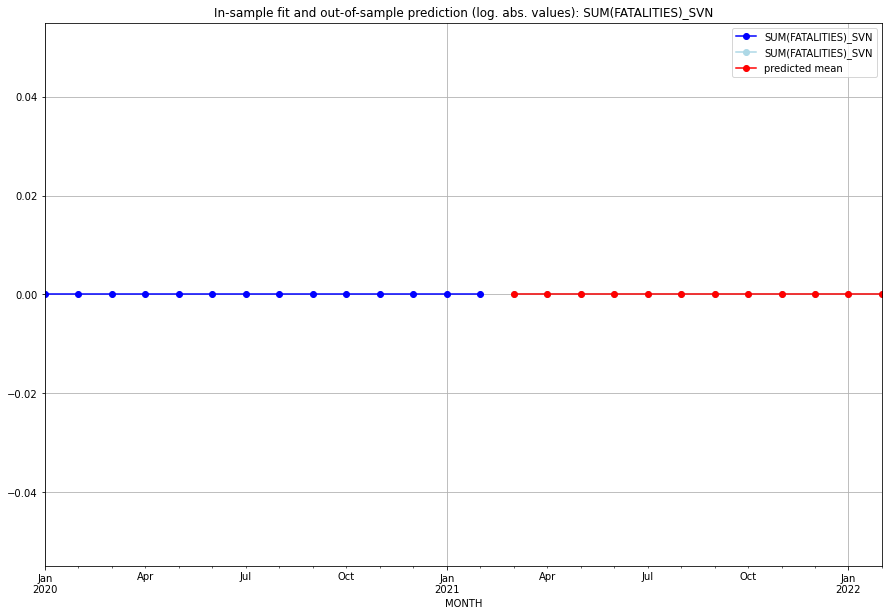

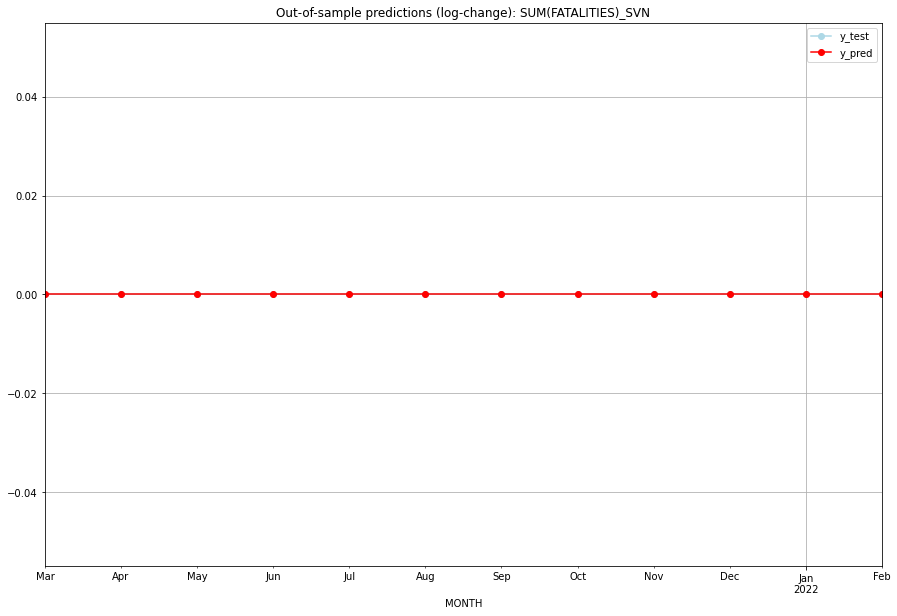

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   SVN   
1  2021-04-01       0.0         0.0           0.0             0.0   SVN   
2  2021-05-01       0.0         0.0           0.0             0.0   SVN   
3  2021-06-01       0.0         0.0           0.0             0.0   SVN   
4  2021-07-01       0.0         0.0           0.0             0.0   SVN   
5  2021-08-01       0.0         0.0           0.0             0.0   SVN   
6  2021-09-01       0.0         0.0           0.0             0.0   SVN   
7  2021-10-01       0.0         0.0           0.0             0.0   SVN   
8  2021-11-01       0.0         0.0           0.0             0.0   SVN   
9  2021-12-01       0.0         0.0           0.0             0.0   SVN   
10 2022-01-01       0.0         0.0           0.0             0.0   SVN   
11 2022-02-01       0.0         0.0           0.0             0.0   

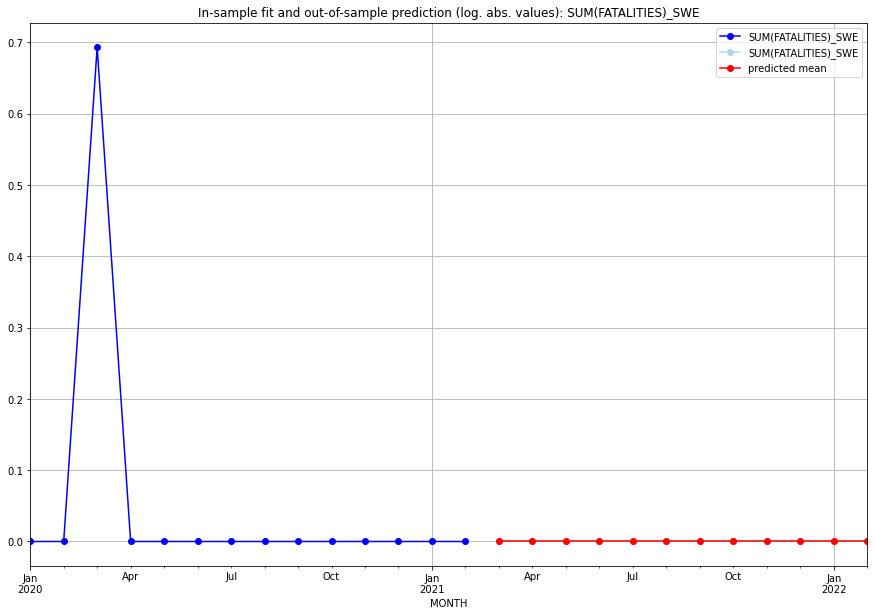

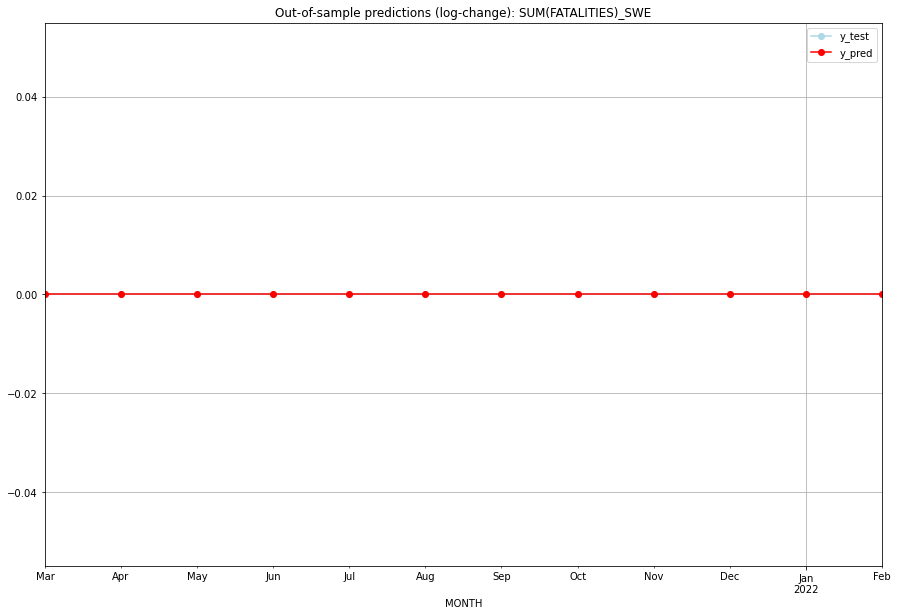

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   SWE   
1  2021-04-01       0.0         0.0           0.0             0.0   SWE   
2  2021-05-01       0.0         0.0           0.0             0.0   SWE   
3  2021-06-01       0.0         0.0           0.0             0.0   SWE   
4  2021-07-01       0.0         0.0           0.0             0.0   SWE   
5  2021-08-01       0.0         0.0           0.0             0.0   SWE   
6  2021-09-01       0.0         0.0           0.0             0.0   SWE   
7  2021-10-01       0.0         0.0           0.0             0.0   SWE   
8  2021-11-01       0.0         0.0           0.0             0.0   SWE   
9  2021-12-01       0.0         0.0           0.0             0.0   SWE   
10 2022-01-01       0.0         0.0           0.0             0.0   SWE   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.09634572526320548, 'fold_results': [0.0, 0.0, 0.0, 0.1493132891023379, 0.33241533721368954]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_SWZ   No. Observations:                  289
Model:                         SARIMAX   Log Likelihood                  25.189
Date:                 Fri, 21 Oct 2022   AIC                            -48.378
Time:                         18:51:37   BIC                            -44.711
Sample:                     02-28-1997   HQIC                           -46.908
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2     

<Figure size 432x288 with 0 Axes>

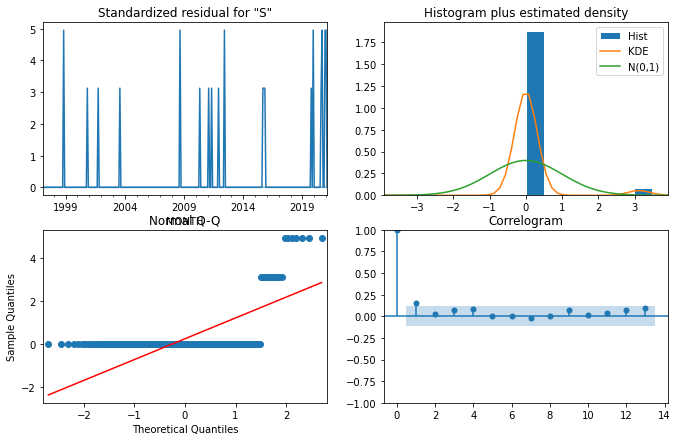

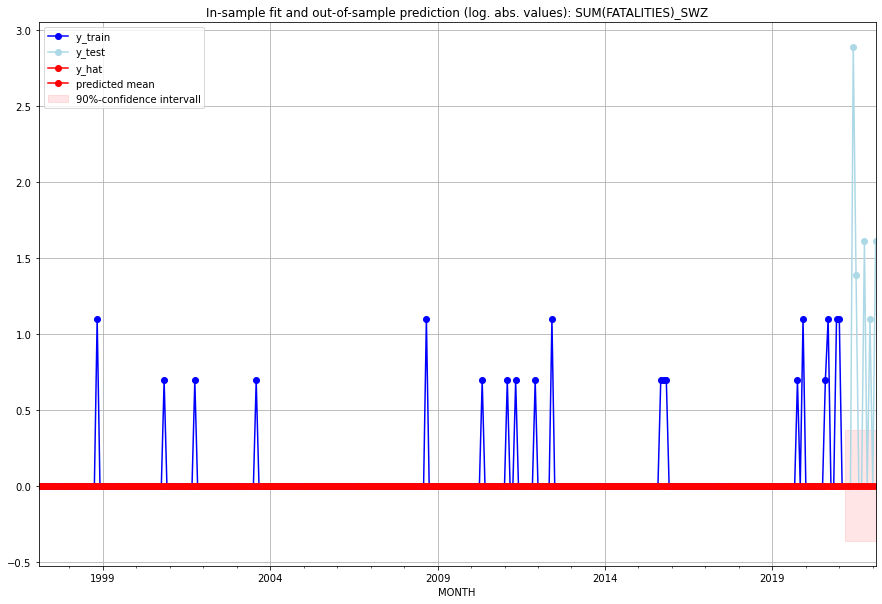

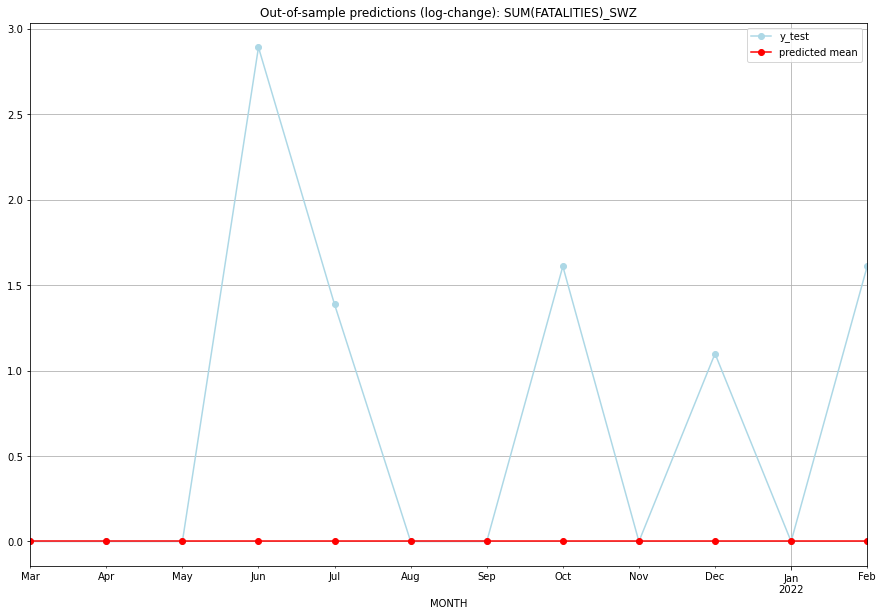

TADDA: 0.7161795193793639
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0        0.000000   SWZ   
1  2021-04-01       0.0         0.0           0.0        0.000000   SWZ   
2  2021-05-01       0.0         0.0           0.0        0.000000   SWZ   
3  2021-06-01       0.0        17.0           0.0        2.890372   SWZ   
4  2021-07-01       0.0         3.0           0.0        1.386294   SWZ   
5  2021-08-01       0.0         0.0           0.0        0.000000   SWZ   
6  2021-09-01       0.0         0.0           0.0        0.000000   SWZ   
7  2021-10-01       0.0         4.0           0.0        1.609438   SWZ   
8  2021-11-01       0.0         0.0           0.0        0.000000   SWZ   
9  2021-12-01       0.0         2.0           0.0        1.098612   SWZ   
10 2022-01-01       0.0         0.0           0.0        0.000000   SWZ   
11 2022-02-01       0.0         4.0           0.0    

<Figure size 432x288 with 0 Axes>

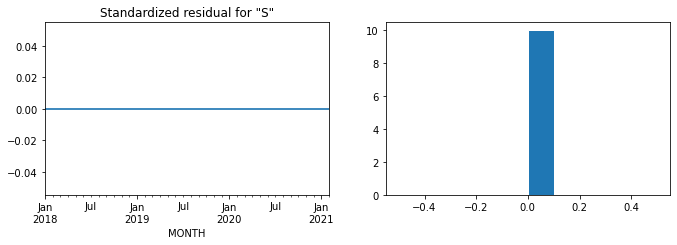

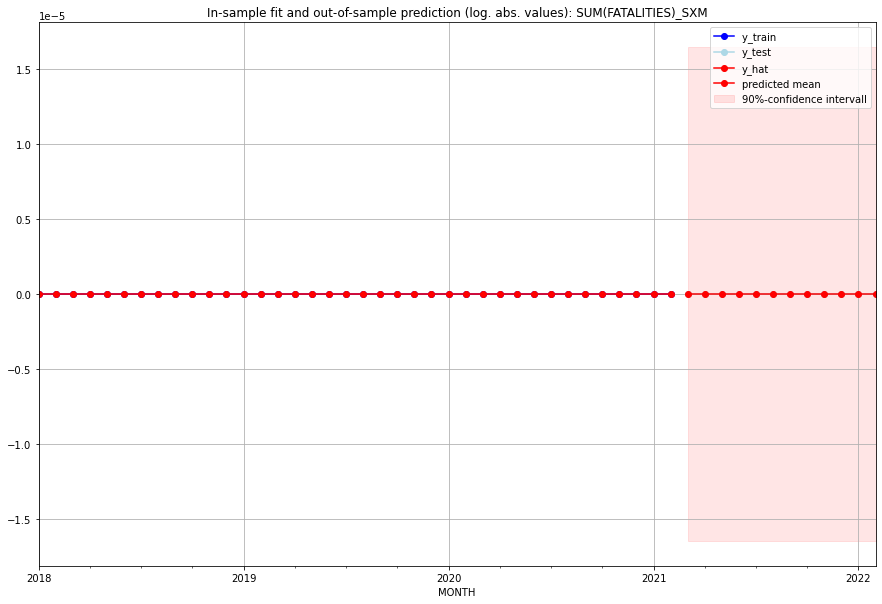

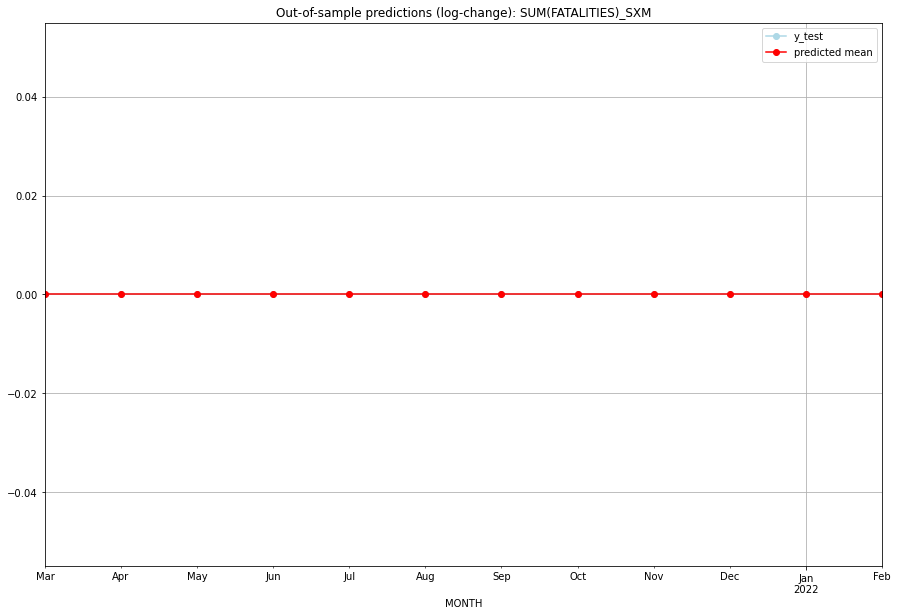

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   SXM   
1  2021-04-01       0.0         0.0           0.0             0.0   SXM   
2  2021-05-01       0.0         0.0           0.0             0.0   SXM   
3  2021-06-01       0.0         0.0           0.0             0.0   SXM   
4  2021-07-01       0.0         0.0           0.0             0.0   SXM   
5  2021-08-01       0.0         0.0           0.0             0.0   SXM   
6  2021-09-01       0.0         0.0           0.0             0.0   SXM   
7  2021-10-01       0.0         0.0           0.0             0.0   SXM   
8  2021-11-01       0.0         0.0           0.0             0.0   SXM   
9  2021-12-01       0.0         0.0           0.0             0.0   SXM   
10 2022-01-01       0.0         0.0           0.0             0.0   SXM   
11 2022-02-01       0.0         0.0           0.0             0.0   

<Figure size 432x288 with 0 Axes>

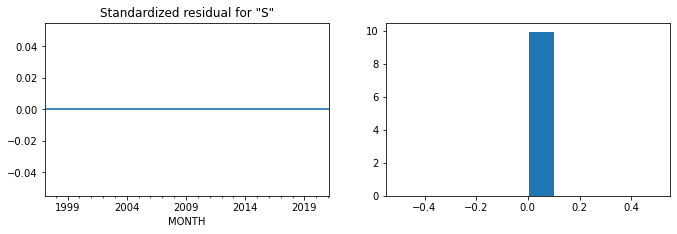

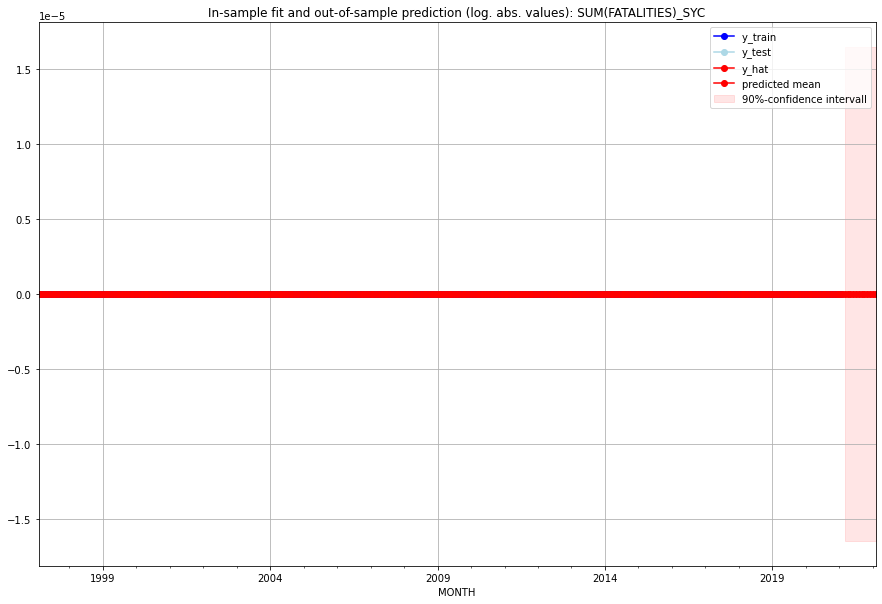

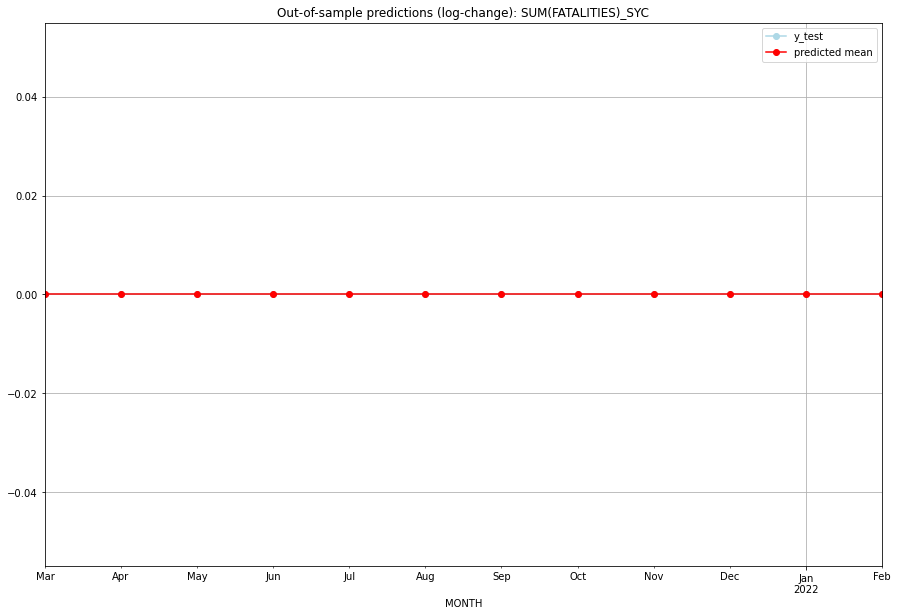

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   SYC   
1  2021-04-01       0.0         0.0           0.0             0.0   SYC   
2  2021-05-01       0.0         0.0           0.0             0.0   SYC   
3  2021-06-01       0.0         0.0           0.0             0.0   SYC   
4  2021-07-01       0.0         0.0           0.0             0.0   SYC   
5  2021-08-01       0.0         0.0           0.0             0.0   SYC   
6  2021-09-01       0.0         0.0           0.0             0.0   SYC   
7  2021-10-01       0.0         0.0           0.0             0.0   SYC   
8  2021-11-01       0.0         0.0           0.0             0.0   SYC   
9  2021-12-01       0.0         0.0           0.0             0.0   SYC   
10 2022-01-01       0.0         0.0           0.0             0.0   SYC   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (3, 1, 3), (0, 0, 0, 12), 'n'], 'cv_score': 0.4072980238928028, 'fold_results': [nan, 0.3250412387875005, 0.48955480899810505]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_SYR   No. Observations:                   50
Model:                SARIMAX(3, 1, 3)   Log Likelihood                 -18.704
Date:                 Fri, 21 Oct 2022   AIC                             51.409
Time:                         18:53:41   BIC                             64.651
Sample:                     01-31-2017   HQIC                            56.433
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8548 

<Figure size 432x288 with 0 Axes>

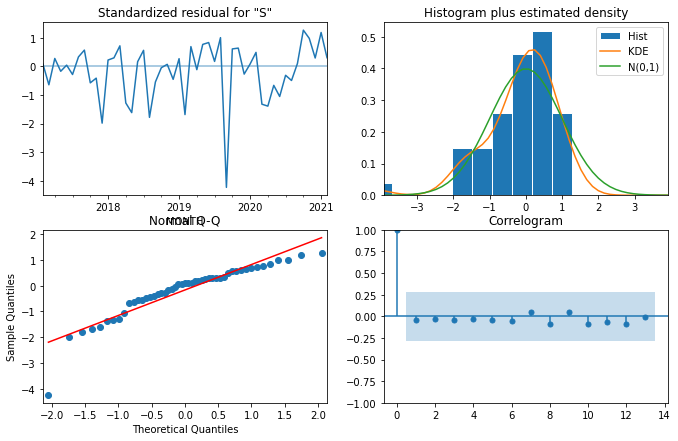

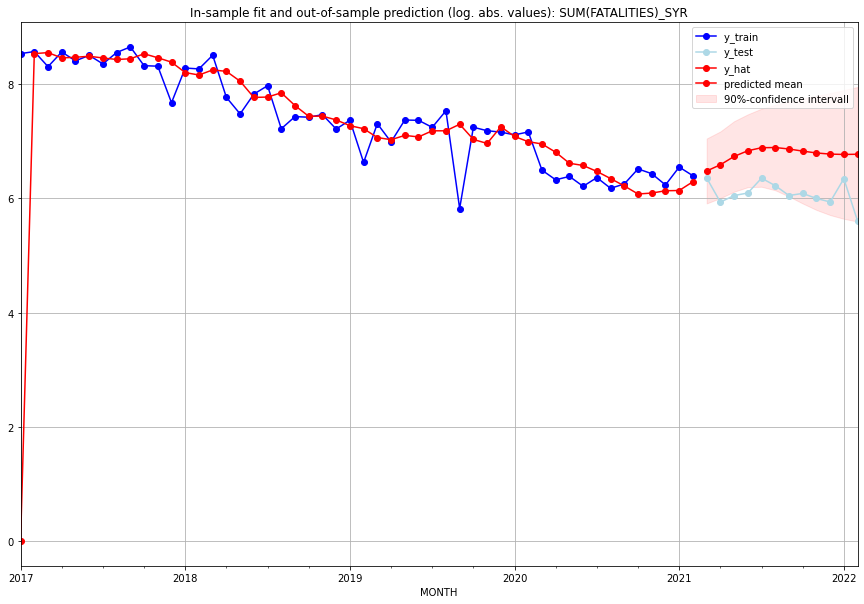

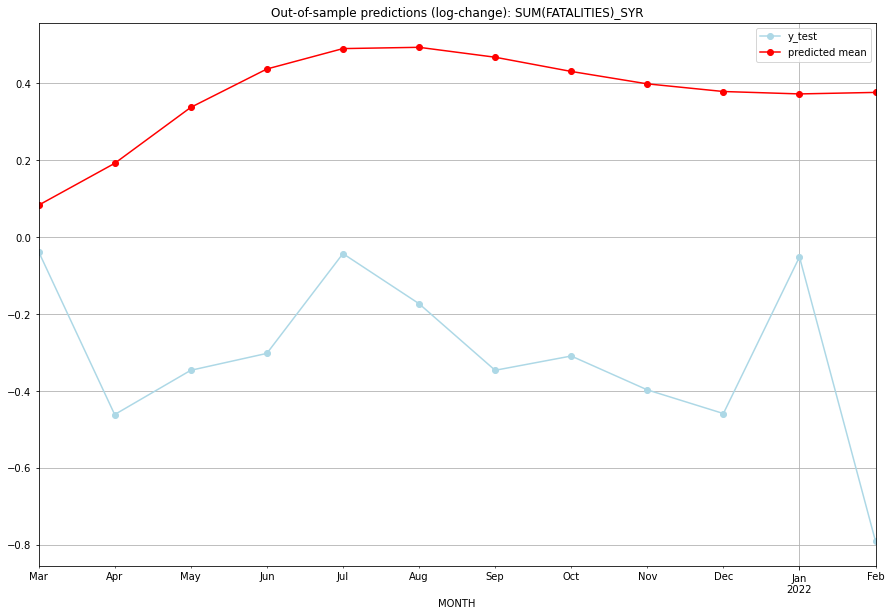

TADDA: 1.053087104822821
Evaluation finished.
        MONTH    FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  648.855003       575.0      0.083159       -0.037483   SYR   
1  2021-04-01  723.594258       376.0      0.192021       -0.461346   SYR   
2  2021-05-01  837.108639       422.0      0.337557       -0.346219   SYR   
3  2021-06-01  925.072696       441.0      0.437362       -0.302281   SYR   
4  2021-07-01  975.554630       572.0      0.490440       -0.042705   SYR   
5  2021-08-01  978.829530       502.0      0.493788       -0.173001   SYR   
6  2021-09-01  953.889883       422.0      0.468005       -0.346219   SYR   
7  2021-10-01  919.212829       438.0      0.431014       -0.309091   SYR   
8  2021-11-01  889.992557       401.0      0.398745       -0.397139   SYR   
9  2021-12-01  872.419299       377.0      0.378825       -0.458697   SYR   
10 2022-01-01  866.961154       567.0      0.372556       -0.051469   SYR   
11 2022-02-01  870.382421     

<Figure size 432x288 with 0 Axes>

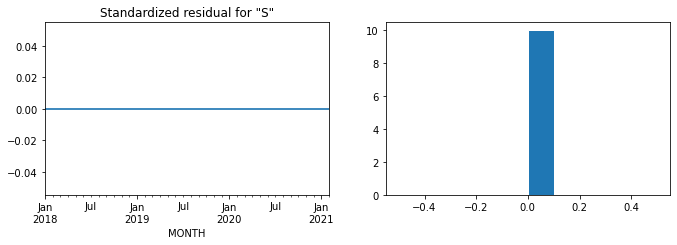

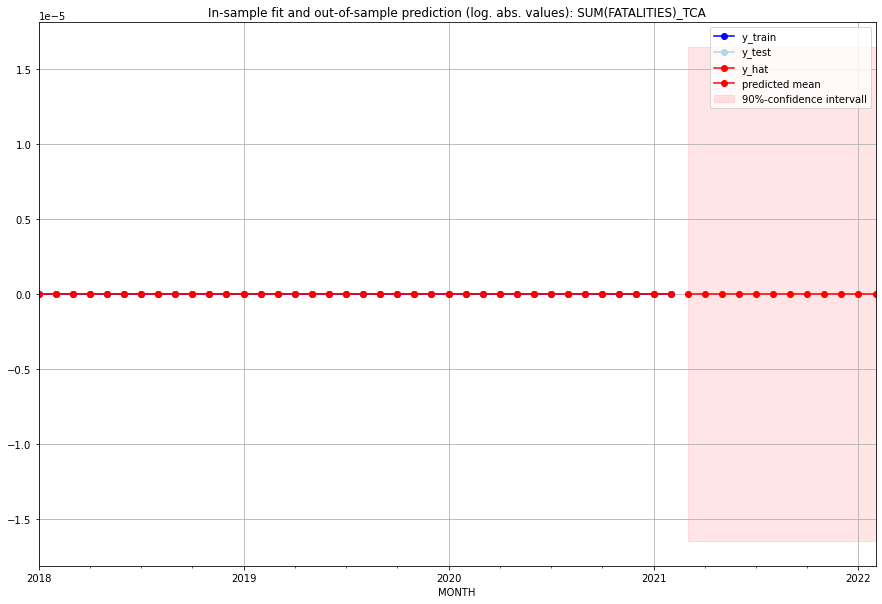

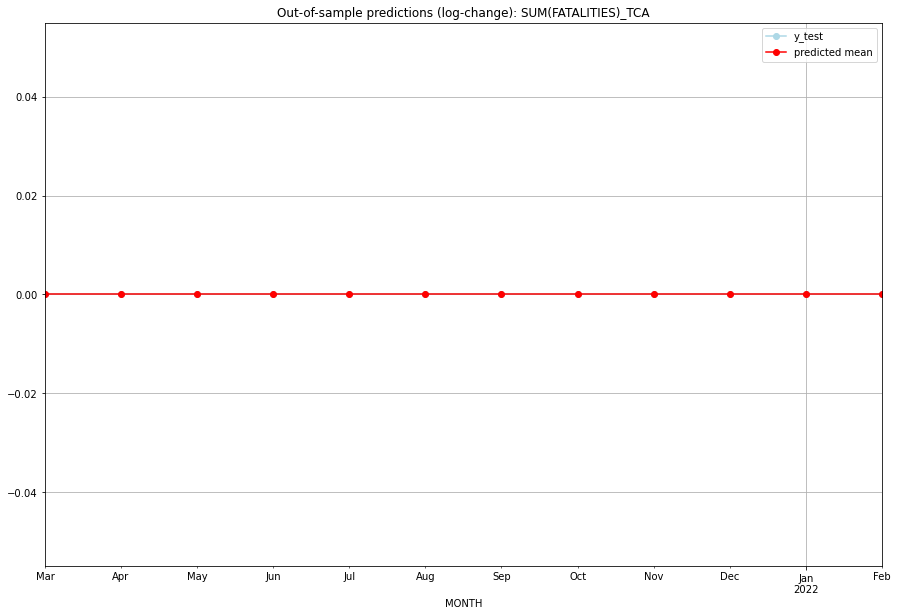

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   TCA   
1  2021-04-01       0.0         0.0           0.0             0.0   TCA   
2  2021-05-01       0.0         0.0           0.0             0.0   TCA   
3  2021-06-01       0.0         0.0           0.0             0.0   TCA   
4  2021-07-01       0.0         0.0           0.0             0.0   TCA   
5  2021-08-01       0.0         0.0           0.0             0.0   TCA   
6  2021-09-01       0.0         0.0           0.0             0.0   TCA   
7  2021-10-01       0.0         0.0           0.0             0.0   TCA   
8  2021-11-01       0.0         0.0           0.0             0.0   TCA   
9  2021-12-01       0.0         0.0           0.0             0.0   TCA   
10 2022-01-01       0.0         0.0           0.0             0.0   TCA   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (0, 1, 1), (1, 0, 1, 12), 'n'], 'cv_score': 1.3866438075099692, 'fold_results': [1.7130027879748209, 1.6296296970976352, 1.4488242830092803, 1.1816701667957406, 0.9600921026723697]}
Training finished.
                                     SARIMAX Results                                      
Dep. Variable:                SUM(FATALITIES)_TCD   No. Observations:                  289
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 12)   Log Likelihood                -571.607
Date:                            Fri, 21 Oct 2022   AIC                           1155.214
Time:                                    19:03:20   BIC                           1177.192
Sample:                                02-28-1997   HQIC                          1164.022
                                     - 02-28-2021                                         
Covariance Type:                              opg                                         
                 coef    std err      

<Figure size 432x288 with 0 Axes>

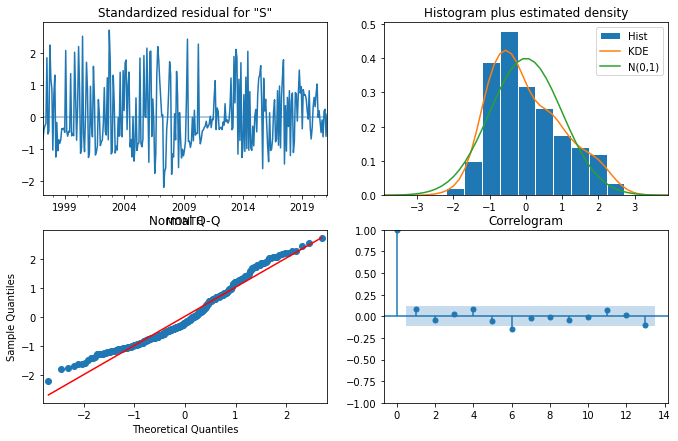

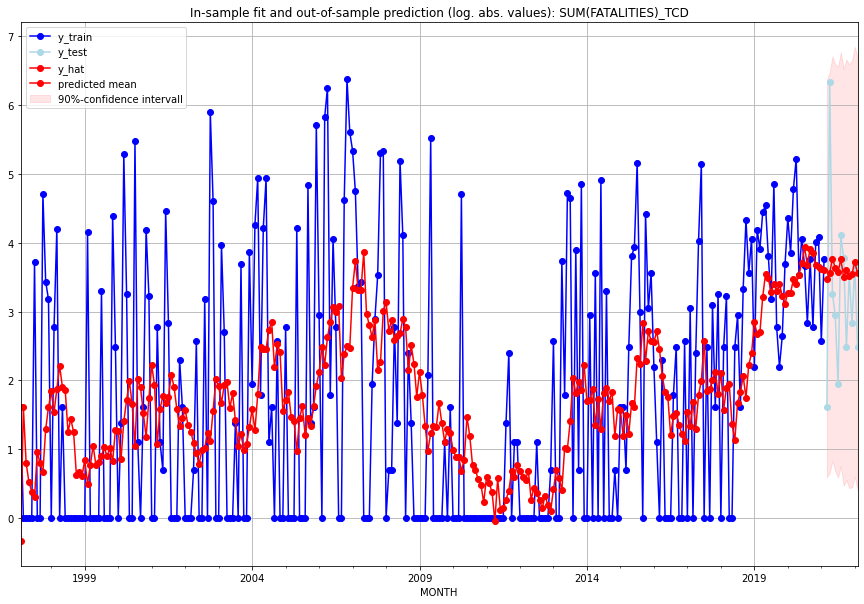

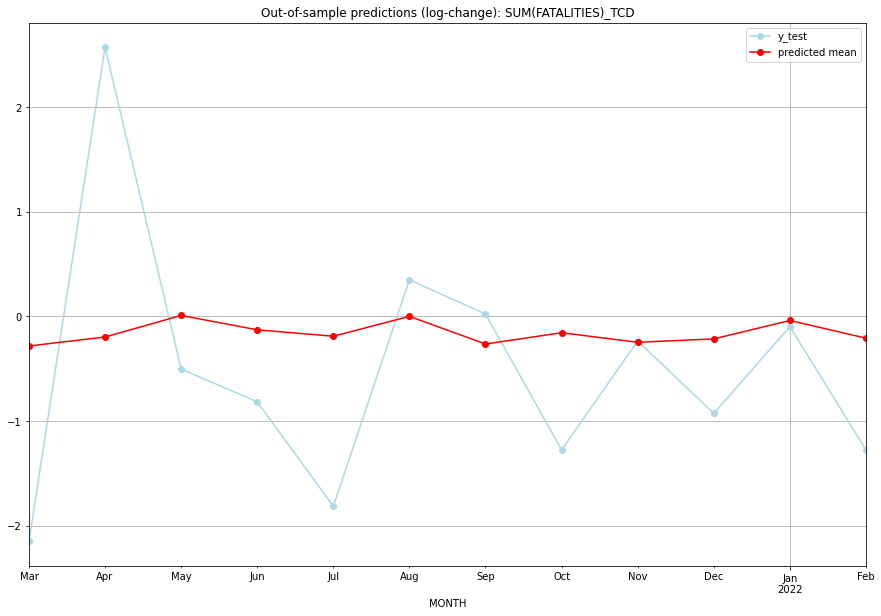

TADDA: 0.9619012687851572
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  31.408672         4.0     -0.282774       -2.151762   TCD   
1  2021-04-01  34.315066       562.0     -0.196890        2.572080   TCD   
2  2021-05-01  42.392911        25.0      0.009096       -0.503104   TCD   
3  2021-06-01  36.812647        18.0     -0.128556       -0.816761   TCD   
4  2021-07-01  34.571138         6.0     -0.189666       -1.815290   TCD   
5  2021-08-01  42.006825        60.0      0.000159        0.349674   TCD   
6  2021-09-01  32.022569        43.0     -0.264009        0.022990   TCD   
7  2021-10-01  35.783072        11.0     -0.156162       -1.276293   TCD   
8  2021-11-01  32.562456        33.0     -0.247792       -0.234840   TCD   
9  2021-12-01  33.677545        16.0     -0.215108       -0.927987   TCD   
10 2022-01-01  40.353349        38.0     -0.039047       -0.097638   TCD   
11 2022-02-01  33.906466        11.0     

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (1, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.5143346159005393, 'fold_results': [0.35638884325133796, 1.0164207235526577, 0.19188209108283716, 0.3226000842423243, 0.6843813373735396]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_TGO   No. Observations:                  289
Model:                SARIMAX(1, 0, 0)   Log Likelihood                -234.578
Date:                 Fri, 21 Oct 2022   AIC                            473.155
Time:                         19:15:59   BIC                            480.488
Sample:                     02-28-1997   HQIC                           476.094
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------

<Figure size 432x288 with 0 Axes>

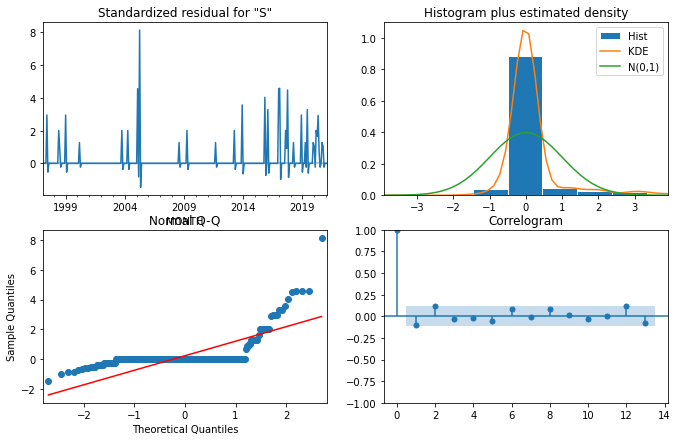

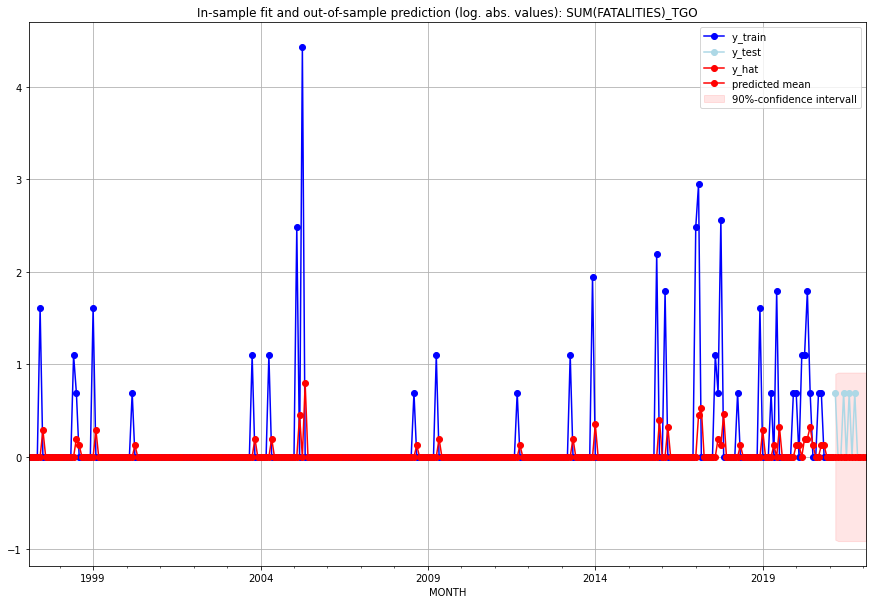

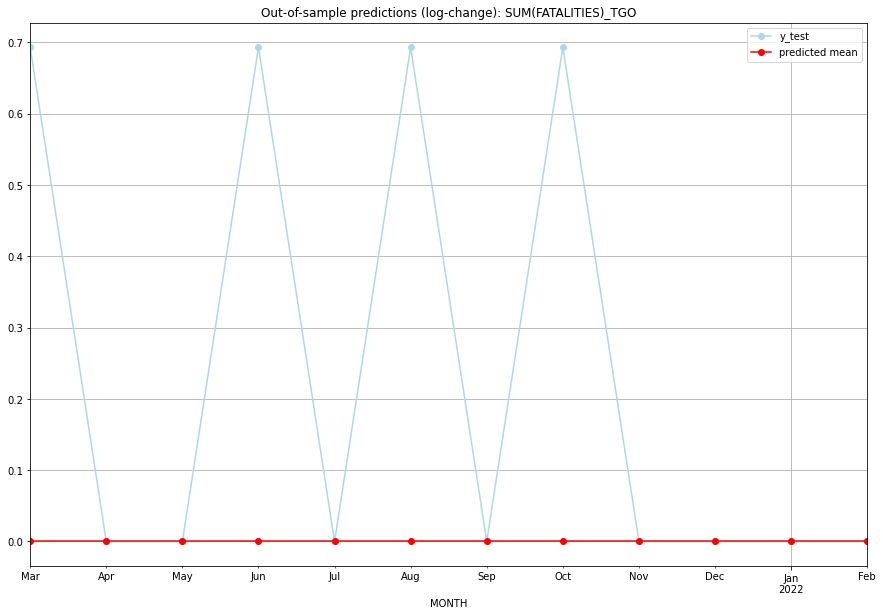

TADDA: 0.23104906018664842
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         1.0           0.0        0.693147   TGO   
1  2021-04-01       0.0         0.0           0.0        0.000000   TGO   
2  2021-05-01       0.0         0.0           0.0        0.000000   TGO   
3  2021-06-01       0.0         1.0           0.0        0.693147   TGO   
4  2021-07-01       0.0         0.0           0.0        0.000000   TGO   
5  2021-08-01       0.0         1.0           0.0        0.693147   TGO   
6  2021-09-01       0.0         0.0           0.0        0.000000   TGO   
7  2021-10-01       0.0         1.0           0.0        0.693147   TGO   
8  2021-11-01       0.0         0.0           0.0        0.000000   TGO   
9  2021-12-01       0.0         0.0           0.0        0.000000   TGO   
10 2022-01-01       0.0         0.0           0.0        0.000000   TGO   
11 2022-02-01       0.0         0.0           0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (1, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.5524194796455645, 'fold_results': [0.7153254867998972, 0.5861374993457816, 0.44105383083666694, 0.40707322578561417, 0.6125073554598629]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_THA   No. Observations:                  134
Model:                SARIMAX(1, 0, 0)   Log Likelihood                -120.938
Date:                 Fri, 21 Oct 2022   AIC                            249.876
Time:                         19:21:58   BIC                            261.468
Sample:                     01-31-2010   HQIC                           254.587
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------

<Figure size 432x288 with 0 Axes>

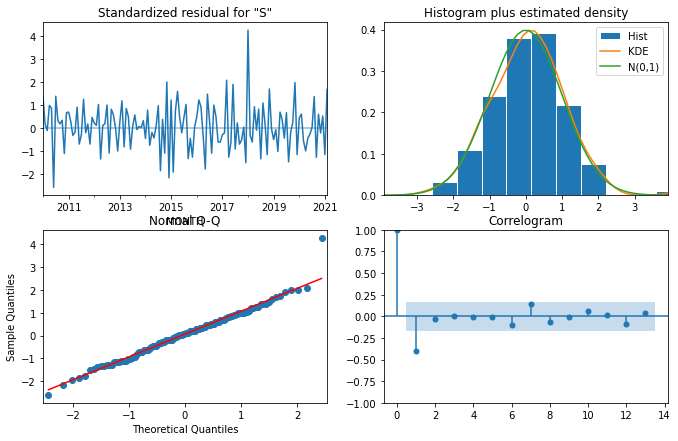

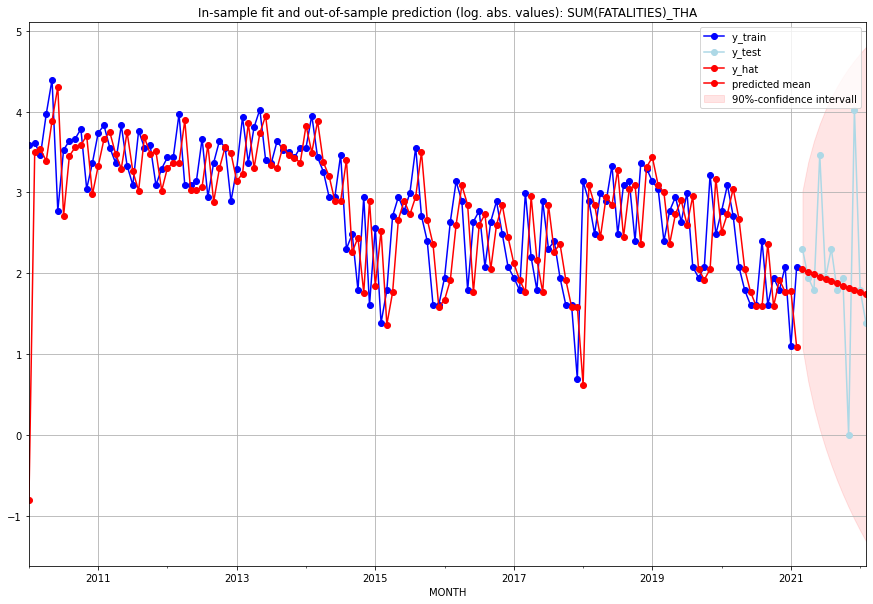

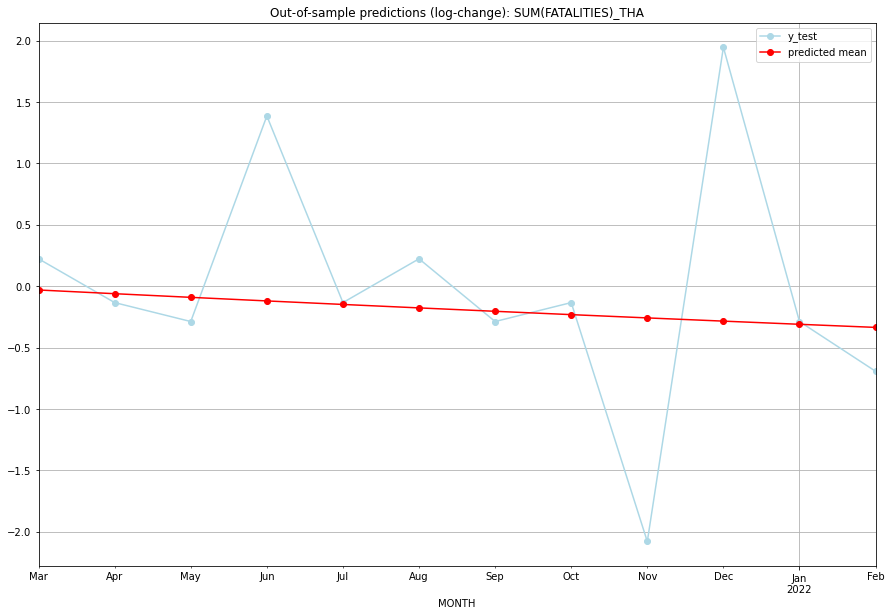

TADDA: 0.6391230555472104
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  6.757490         9.0     -0.030783        0.223144   THA   
1  2021-04-01  6.526421         6.0     -0.061022       -0.133531   THA   
2  2021-05-01  6.306135         5.0     -0.090727       -0.287682   THA   
3  2021-06-01  6.096018        31.0     -0.119908        1.386294   THA   
4  2021-07-01  5.895495         6.0     -0.148573       -0.133531   THA   
5  2021-08-01  5.704032         9.0     -0.176732        0.223144   THA   
6  2021-09-01  5.521126         5.0     -0.204394       -0.287682   THA   
7  2021-10-01  5.346310         6.0     -0.231568       -0.133531   THA   
8  2021-11-01  5.179144         0.0     -0.258262       -2.079442   THA   
9  2021-12-01  5.019218        55.0     -0.284484        1.945910   THA   
10 2022-01-01  4.866147         5.0     -0.310243       -0.287682   THA   
11 2022-02-01  4.719570         3.0     -0.335548    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (0, 1, 3), (0, 0, 0, 12), 'n'], 'cv_score': 0.11552453009332421, 'fold_results': [nan, 0.11552453009332421]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_TJK   No. Observations:                   38
Model:                SARIMAX(0, 1, 3)   Log Likelihood                 -52.269
Date:                 Fri, 21 Oct 2022   AIC                            116.537
Time:                         19:23:13   BIC                            126.203
Sample:                     01-31-2018   HQIC                           119.945
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.0467      0.056      0.8

<Figure size 432x288 with 0 Axes>

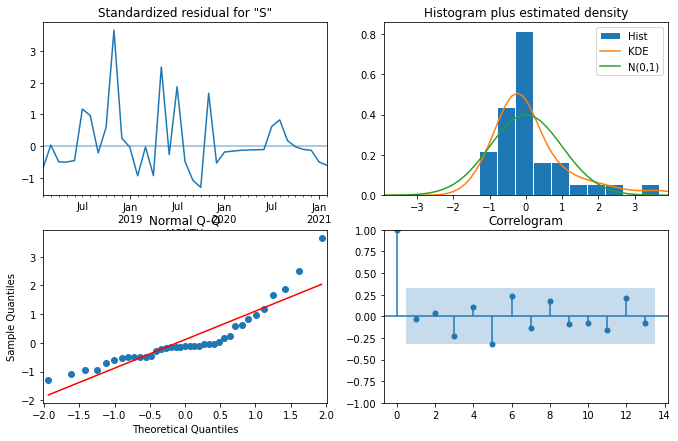

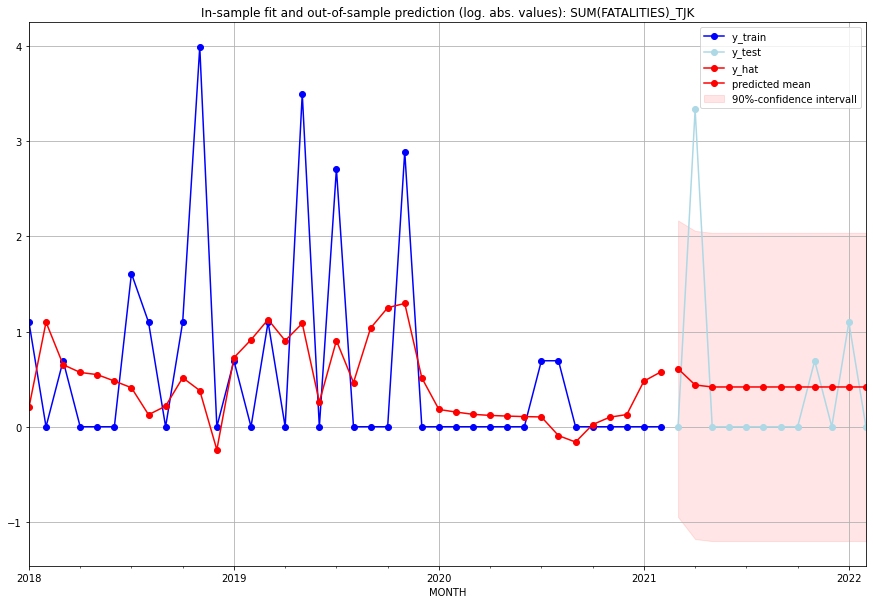

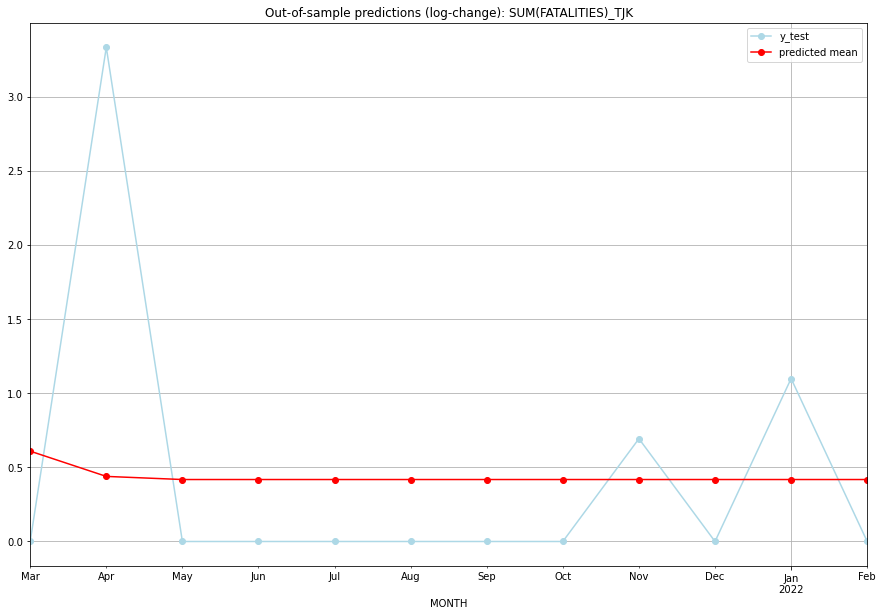

TADDA: 0.6501036126771402
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.838831         0.0      0.609130        0.000000   TJK   
1  2021-04-01  0.550971        27.0      0.438881        3.332205   TJK   
2  2021-05-01  0.518675         0.0      0.417838        0.000000   TJK   
3  2021-06-01  0.518675         0.0      0.417838        0.000000   TJK   
4  2021-07-01  0.518675         0.0      0.417838        0.000000   TJK   
5  2021-08-01  0.518675         0.0      0.417838        0.000000   TJK   
6  2021-09-01  0.518675         0.0      0.417838        0.000000   TJK   
7  2021-10-01  0.518675         0.0      0.417838        0.000000   TJK   
8  2021-11-01  0.518675         1.0      0.417838        0.693147   TJK   
9  2021-12-01  0.518675         0.0      0.417838        0.000000   TJK   
10 2022-01-01  0.518675         2.0      0.417838        1.098612   TJK   
11 2022-02-01  0.518675         0.0      0.417838    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (2, 0, 1), (2, 1, 0, 12), 'n'], 'cv_score': 0.057762265046662105, 'fold_results': [nan, 0.057762265046662105]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_TKM   No. Observations:                   38
Model:             SARIMAX(2, 0, 1)x(2, 1, [], 12)   Log Likelihood                 -21.410
Date:                             Fri, 21 Oct 2022   AIC                             54.820
Time:                                     19:24:28   BIC                             62.369
Sample:                                 01-31-2018   HQIC                            56.994
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------

<Figure size 432x288 with 0 Axes>

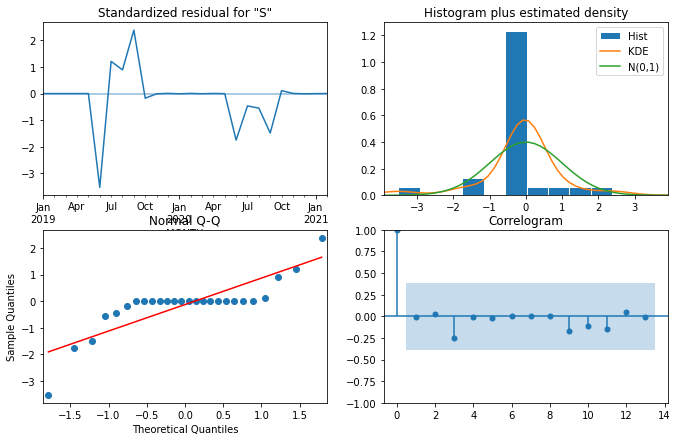

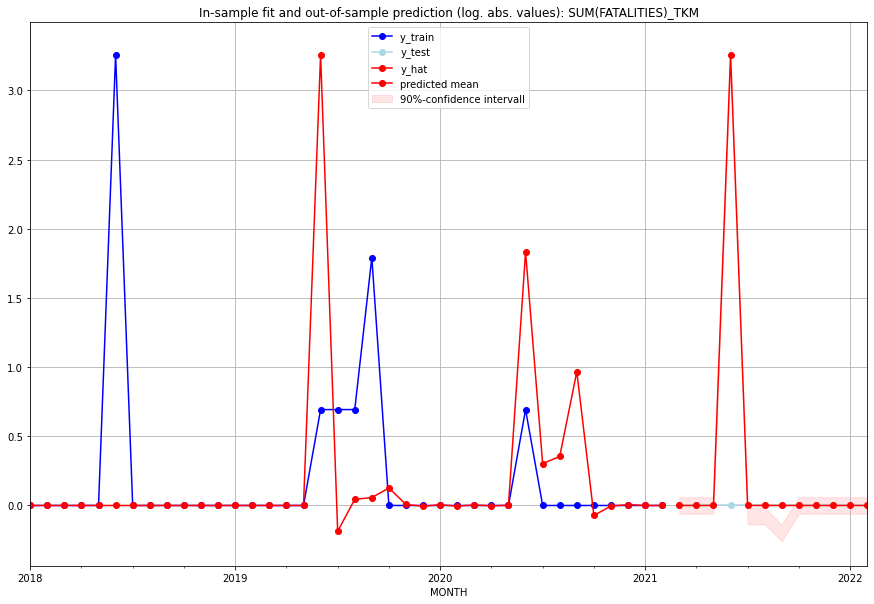

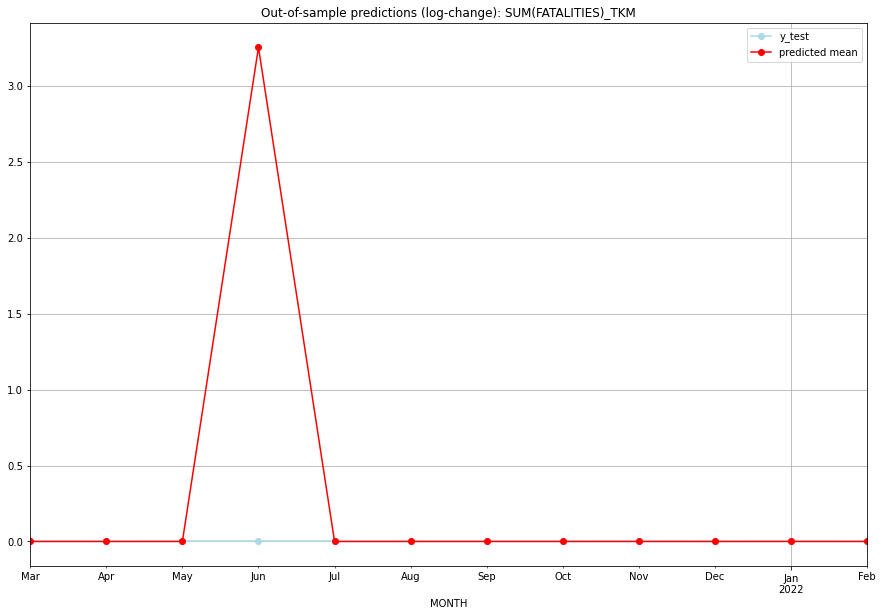

TADDA: 0.27119725935803835
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01   0.000082         0.0      0.000082             0.0   TKM   
1  2021-04-01   0.000000         0.0      0.000000             0.0   TKM   
2  2021-05-01   0.000074         0.0      0.000074             0.0   TKM   
3  2021-06-01  24.895691         0.0      3.254077             0.0   TKM   
4  2021-07-01   0.000000         0.0      0.000000             0.0   TKM   
5  2021-08-01   0.000000         0.0      0.000000             0.0   TKM   
6  2021-09-01   0.000000         0.0      0.000000             0.0   TKM   
7  2021-10-01   0.000000         0.0      0.000000             0.0   TKM   
8  2021-11-01   0.000068         0.0      0.000068             0.0   TKM   
9  2021-12-01   0.000000         0.0      0.000000             0.0   TKM   
10 2022-01-01   0.000066         0.0      0.000066             0.0   TKM   
11 2022-02-01   0.000000         0.0    

<Figure size 432x288 with 0 Axes>

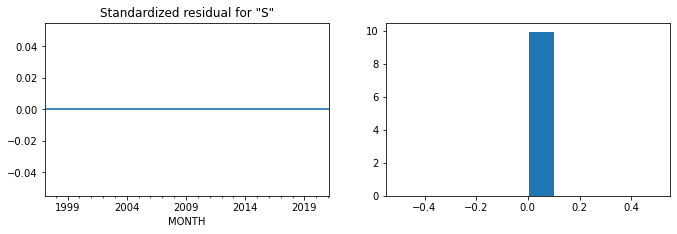

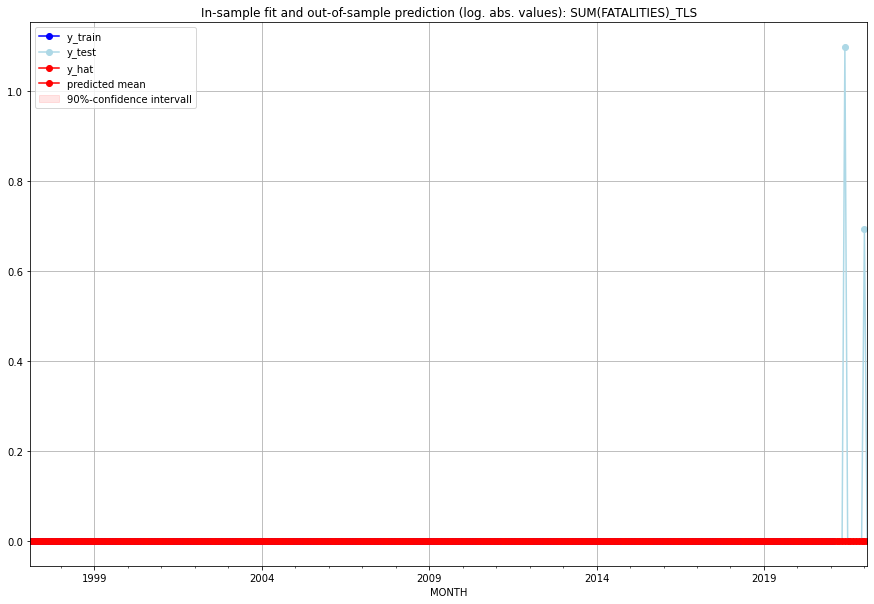

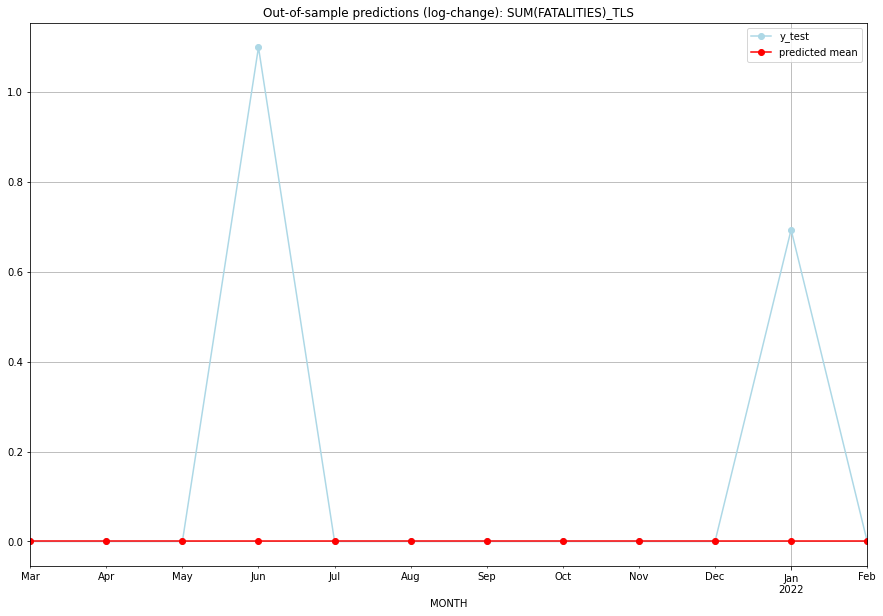

TADDA: 0.1493132891023379
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0        0.000000   TLS   
1  2021-04-01       0.0         0.0           0.0        0.000000   TLS   
2  2021-05-01       0.0         0.0           0.0        0.000000   TLS   
3  2021-06-01       0.0         2.0           0.0        1.098612   TLS   
4  2021-07-01       0.0         0.0           0.0        0.000000   TLS   
5  2021-08-01       0.0         0.0           0.0        0.000000   TLS   
6  2021-09-01       0.0         0.0           0.0        0.000000   TLS   
7  2021-10-01       0.0         0.0           0.0        0.000000   TLS   
8  2021-11-01       0.0         0.0           0.0        0.000000   TLS   
9  2021-12-01       0.0         0.0           0.0        0.000000   TLS   
10 2022-01-01       0.0         1.0           0.0        0.693147   TLS   
11 2022-02-01       0.0         0.0           0.0    

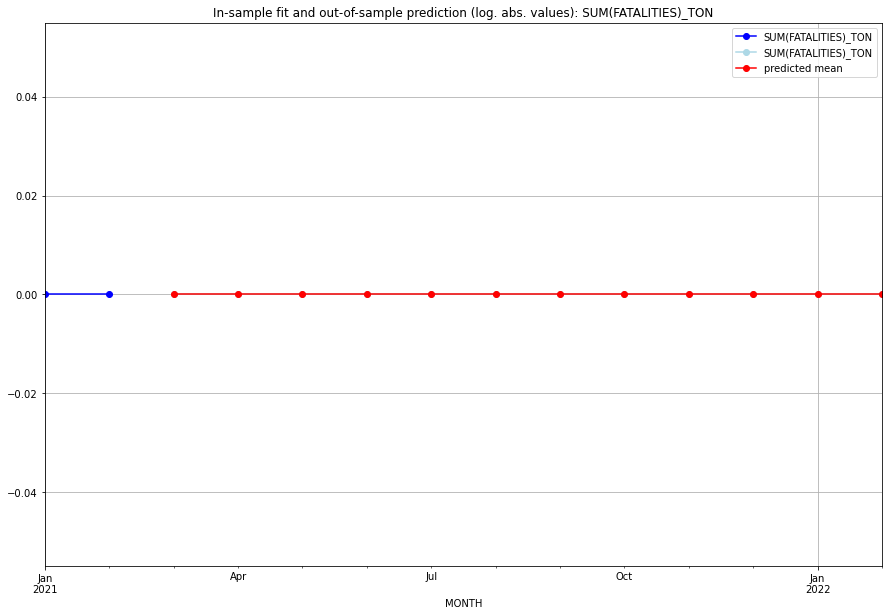

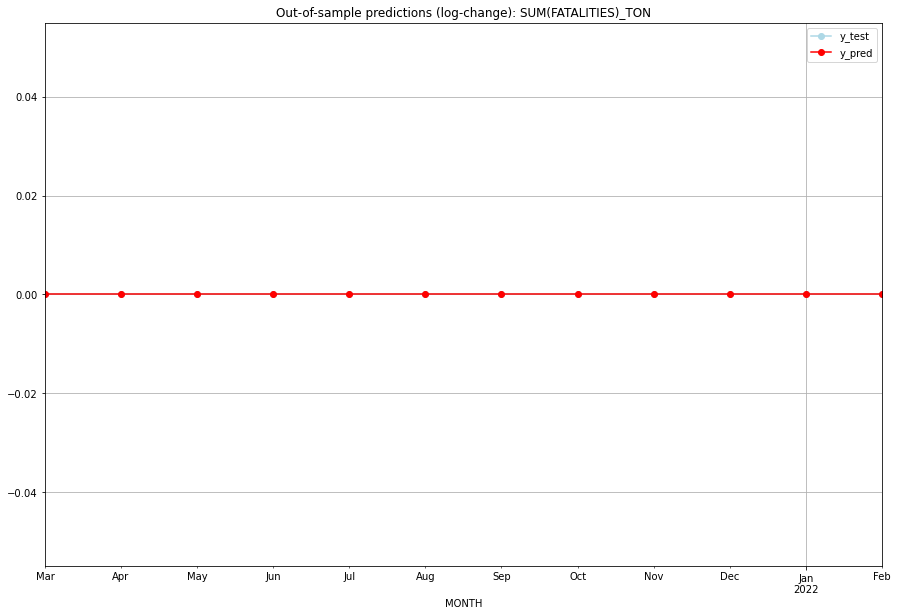

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   TON   
1  2021-04-01       0.0         0.0           0.0             0.0   TON   
2  2021-05-01       0.0         0.0           0.0             0.0   TON   
3  2021-06-01       0.0         0.0           0.0             0.0   TON   
4  2021-07-01       0.0         0.0           0.0             0.0   TON   
5  2021-08-01       0.0         0.0           0.0             0.0   TON   
6  2021-09-01       0.0         0.0           0.0             0.0   TON   
7  2021-10-01       0.0         0.0           0.0             0.0   TON   
8  2021-11-01       0.0         0.0           0.0             0.0   TON   
9  2021-12-01       0.0         0.0           0.0             0.0   TON   
10 2022-01-01       0.0         0.0           0.0             0.0   TON   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (3, 1, 3), (0, 0, 0, 12), 'n'], 'cv_score': 0.5049554762963986, 'fold_results': [nan, 0.5049554762963986]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_TTO   No. Observations:                   38
Model:                SARIMAX(3, 1, 3)   Log Likelihood                 -25.906
Date:                 Fri, 21 Oct 2022   AIC                             67.811
Time:                         19:25:46   BIC                             80.698
Sample:                     01-31-2018   HQIC                            72.354
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0380      0.030     -1.253

<Figure size 432x288 with 0 Axes>

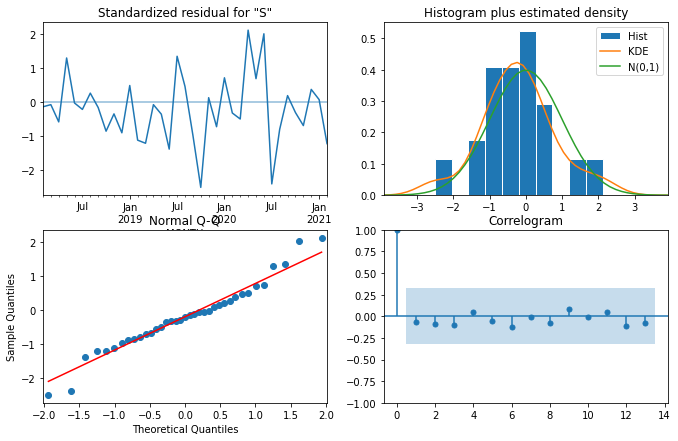

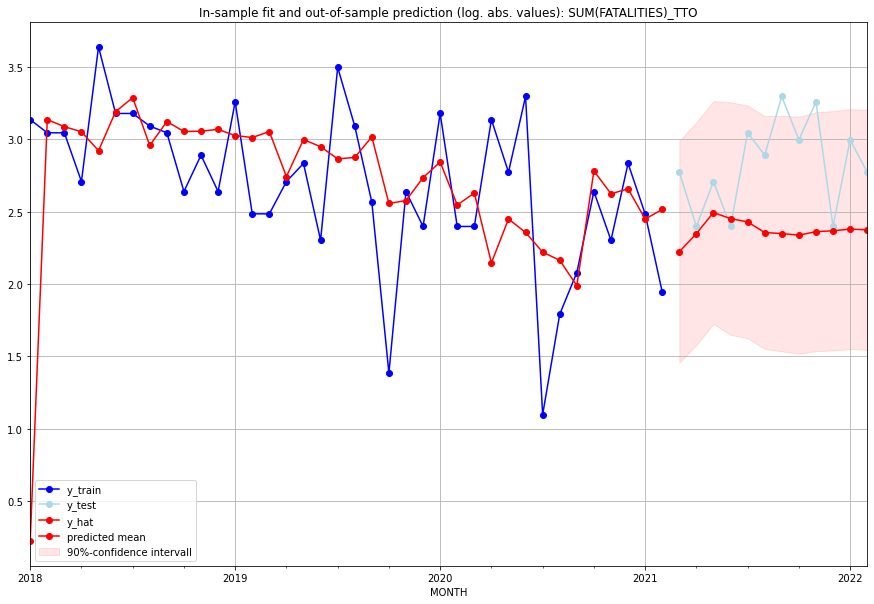

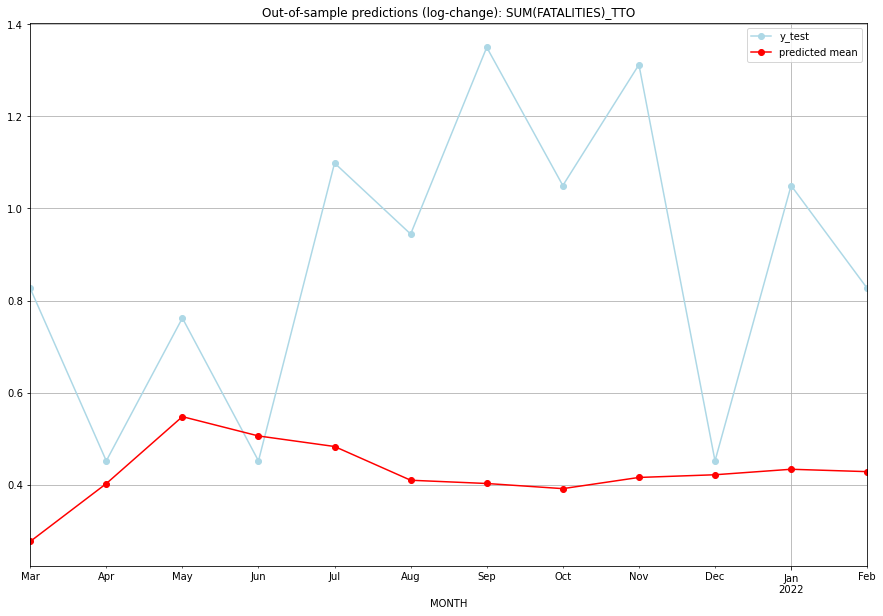

TADDA: 0.46352912712928673
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01   8.234273        15.0      0.277012        0.826679   TTO   
1  2021-04-01   9.470726        10.0      0.402673        0.451985   TTO   
2  2021-05-01  11.109367        14.0      0.548069        0.762140   TTO   
3  2021-06-01  10.612196        10.0      0.506146        0.451985   TTO   
4  2021-07-01  10.349261        20.0      0.483243        1.098612   TTO   
5  2021-08-01   9.547626        17.0      0.409991        0.944462   TTO   
6  2021-09-01   9.473401        26.0      0.402929        1.349927   TTO   
7  2021-10-01   9.357032        19.0      0.391756        1.049822   TTO   
8  2021-11-01   9.611734        25.0      0.416050        1.312186   TTO   
9  2021-12-01   9.674003        10.0      0.421901        0.451985   TTO   
10 2022-01-01   9.802126        19.0      0.433833        1.049822   TTO   
11 2022-02-01   9.746331        15.0    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (2, 0, 3), (0, 0, 0, 12), 'n'], 'cv_score': 0.573521485695005, 'fold_results': [0.8332105292037205, 0.5602213328114237, 0.44335126277509285, 0.4737763856899431, 0.557047917994845]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_TUN   No. Observations:                  289
Model:                SARIMAX(2, 0, 3)   Log Likelihood                -305.300
Date:                 Fri, 21 Oct 2022   AIC                            622.599
Time:                         19:37:44   BIC                            644.598
Sample:                     02-28-1997   HQIC                           631.414
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------

<Figure size 432x288 with 0 Axes>

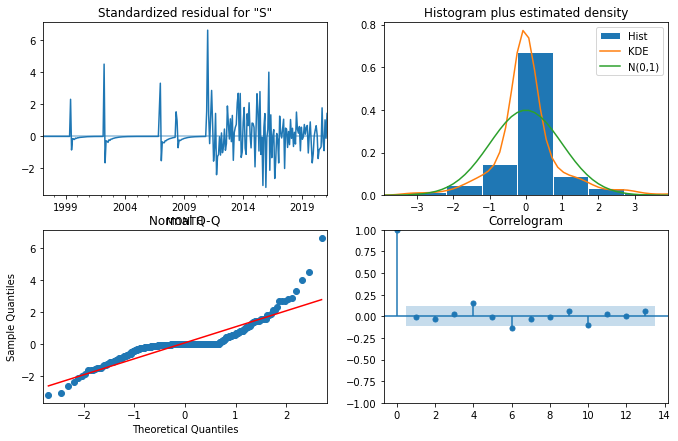

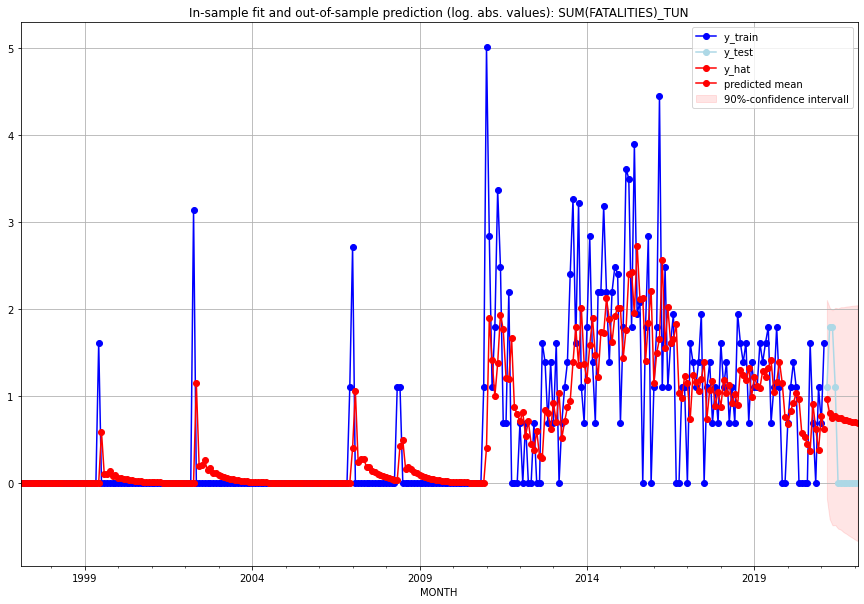

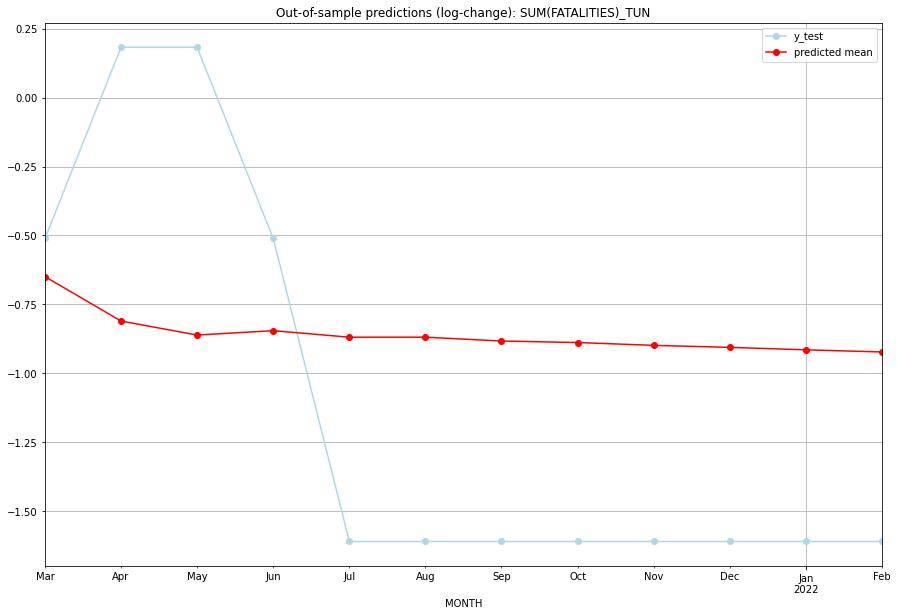

TADDA: 0.8254925063691313
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.612699         2.0     -0.649054       -0.510826   TUN   
1  2021-04-01  1.223971         5.0     -0.810143        0.182322   TUN   
2  2021-05-01  1.113760         5.0     -0.860970        0.182322   TUN   
3  2021-06-01  1.147595         2.0     -0.845089       -0.510826   TUN   
4  2021-07-01  1.097372         0.0     -0.868753       -1.609438   TUN   
5  2021-08-01  1.097466         0.0     -0.868708       -1.609438   TUN   
6  2021-09-01  1.068504         0.0     -0.882612       -1.609438   TUN   
7  2021-10-01  1.057288         0.0     -0.888049       -1.609438   TUN   
8  2021-11-01  1.036172         0.0     -0.898366       -1.609438   TUN   
9  2021-12-01  1.021459         0.0     -0.905619       -1.609438   TUN   
10 2022-01-01  1.003508         0.0     -0.914538       -1.609438   TUN   
11 2022-02-01  0.987998         0.0     -0.922310    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (1, 0, 1), (1, 1, 1, 12), 'n'], 'cv_score': 0.4913729385754521, 'fold_results': [nan, 0.42587339940095376, 0.5059520267518176, 0.5422933895735849]}
Training finished.
                                     SARIMAX Results                                      
Dep. Variable:                SUM(FATALITIES)_TUR   No. Observations:                   62
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 12)   Log Likelihood                 -43.611
Date:                            Fri, 21 Oct 2022   AIC                             97.222
Time:                                    19:40:30   BIC                            106.783
Sample:                                01-31-2016   HQIC                           100.863
                                     - 02-28-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      

<Figure size 432x288 with 0 Axes>

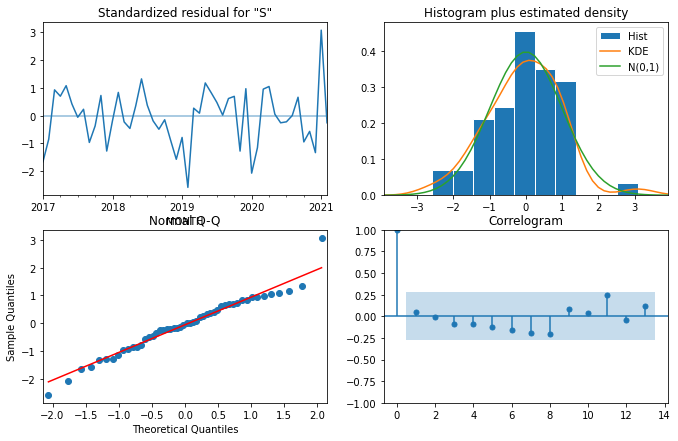

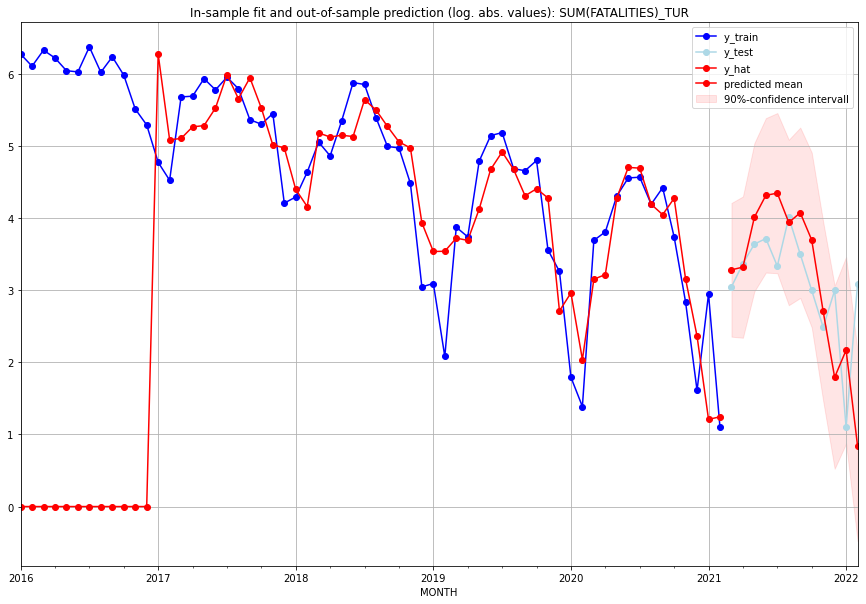

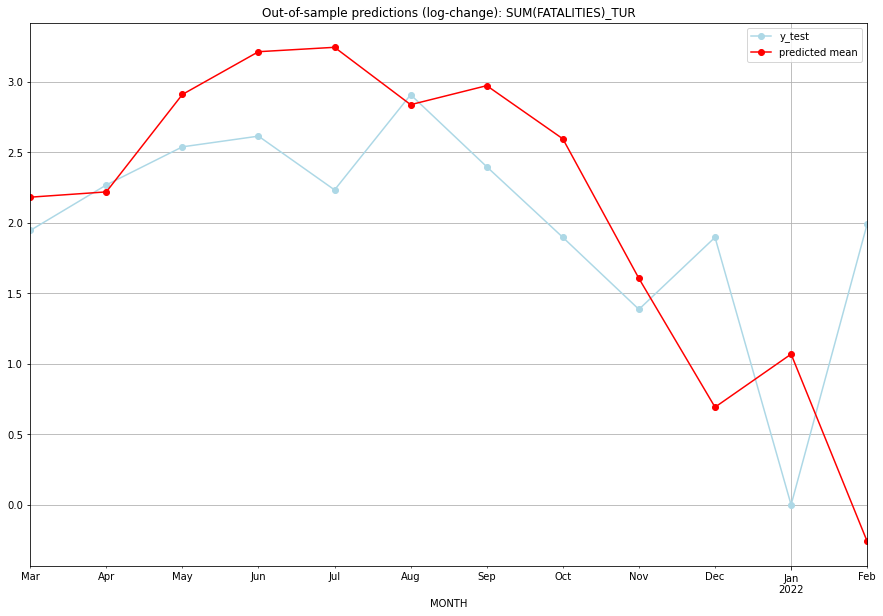

TADDA: 0.7180503286558317
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  25.591502        20.0      2.181979        1.945910   TUR   
1  2021-04-01  26.609247        28.0      2.219538        2.268684   TUR   
2  2021-05-01  54.102179        37.0      2.910577        2.538974   TUR   
3  2021-06-01  73.620354        40.0      3.213801        2.614960   TUR   
4  2021-07-01  75.983508        27.0      3.244979        2.233592   TUR   
5  2021-08-01  50.251783        54.0      2.838138        2.908721   TUR   
6  2021-09-01  57.650629        32.0      2.972986        2.397895   TUR   
7  2021-10-01  39.226012        19.0      2.595902        1.897120   TUR   
8  2021-11-01  13.940184        11.0      1.605442        1.386294   TUR   
9  2021-12-01   4.996911        19.0      0.692632        1.897120   TUR   
10 2022-01-01   7.735781         2.0      1.068815        0.000000   TUR   
11 2022-02-01   1.312897        21.0     

<Figure size 432x288 with 0 Axes>

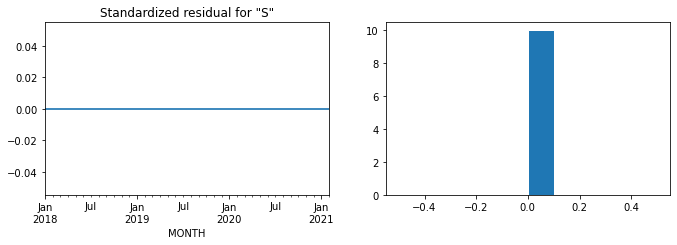

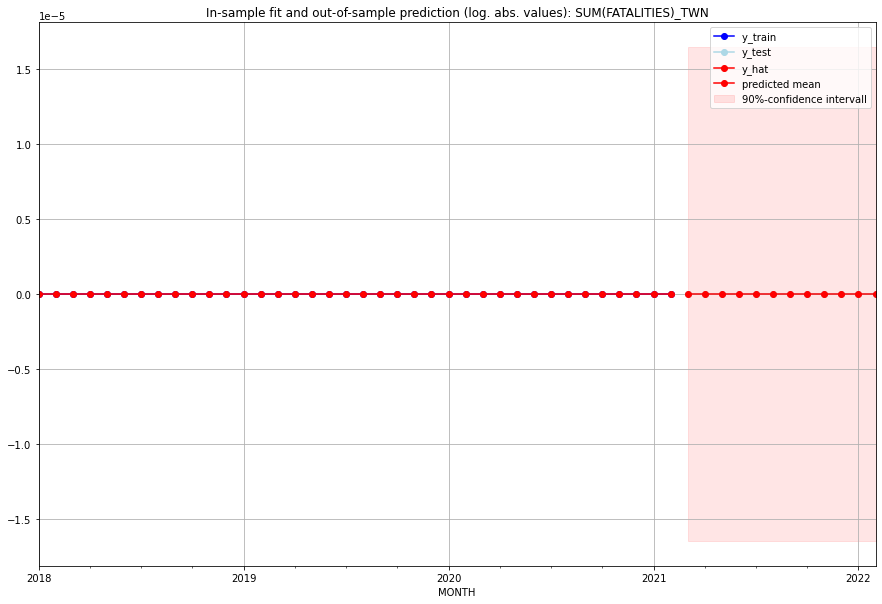

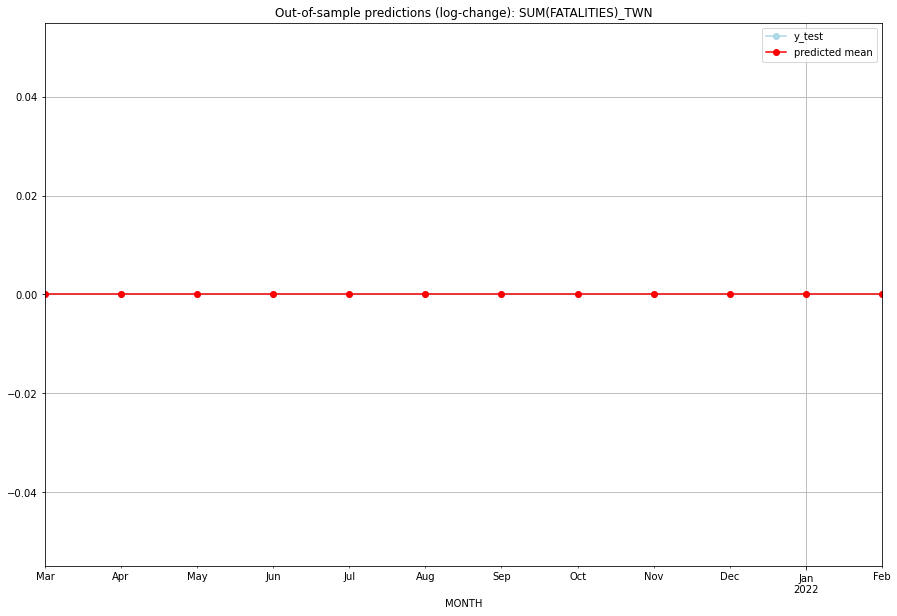

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   TWN   
1  2021-04-01       0.0         0.0           0.0             0.0   TWN   
2  2021-05-01       0.0         0.0           0.0             0.0   TWN   
3  2021-06-01       0.0         0.0           0.0             0.0   TWN   
4  2021-07-01       0.0         0.0           0.0             0.0   TWN   
5  2021-08-01       0.0         0.0           0.0             0.0   TWN   
6  2021-09-01       0.0         0.0           0.0             0.0   TWN   
7  2021-10-01       0.0         0.0           0.0             0.0   TWN   
8  2021-11-01       0.0         0.0           0.0             0.0   TWN   
9  2021-12-01       0.0         0.0           0.0             0.0   TWN   
10 2022-01-01       0.0         0.0           0.0             0.0   TWN   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (2, 1, 2), (2, 1, 2, 12), 'n'], 'cv_score': 0.9561102290799783, 'fold_results': [0.913514451807136, nan, 0.8809938953943175, 0.6291611807962284, 1.4007713883222317]}
Training finished.
                                     SARIMAX Results                                      
Dep. Variable:                SUM(FATALITIES)_TZA   No. Observations:                  289
Model:             SARIMAX(2, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -403.316
Date:                            Fri, 21 Oct 2022   AIC                            824.633
Time:                                    19:53:13   BIC                            857.216
Sample:                                02-28-1997   HQIC                           837.708
                                     - 02-28-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|

<Figure size 432x288 with 0 Axes>

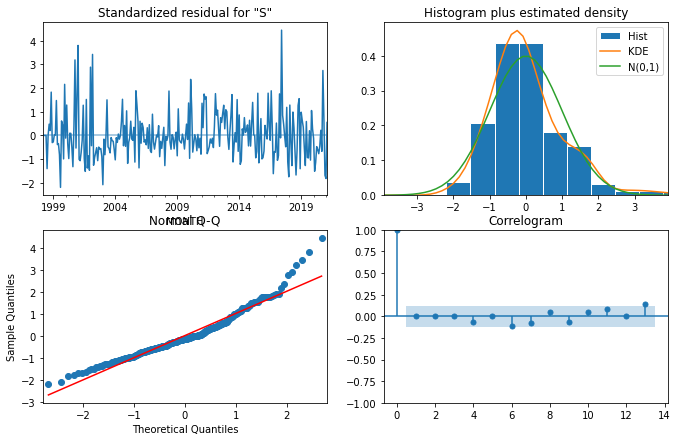

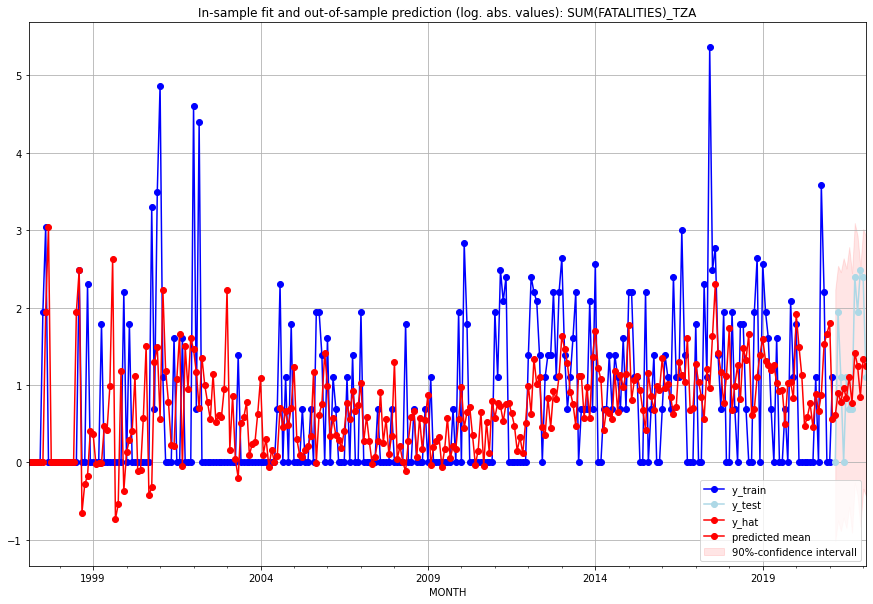

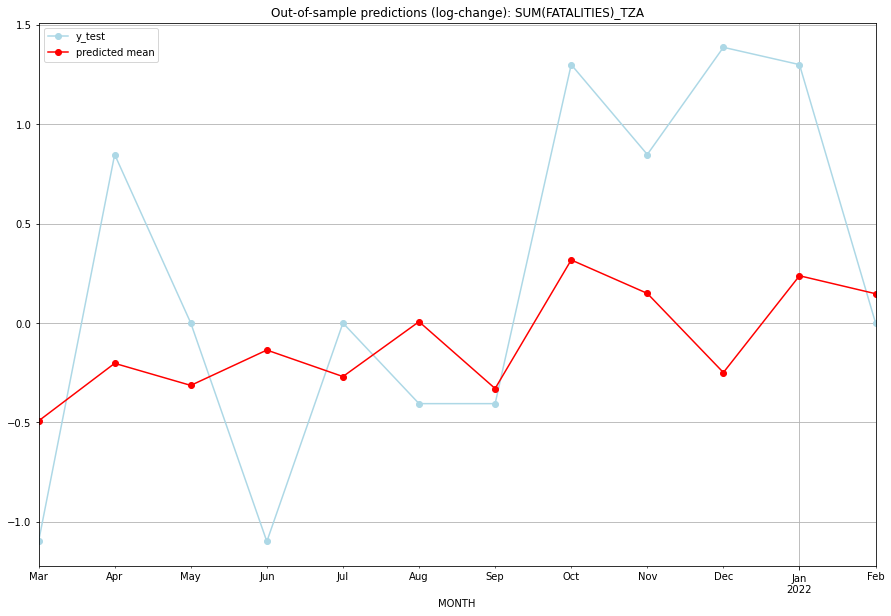

TADDA: 0.7227770400720072
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.833429         0.0     -0.492424       -1.098612   TZA   
1  2021-04-01  1.449349         6.0     -0.202790        0.847298   TZA   
2  2021-05-01  1.192226         2.0     -0.313695        0.000000   TZA   
3  2021-06-01  1.618496         0.0     -0.136012       -1.098612   TZA   
4  2021-07-01  1.291811         2.0     -0.269270        0.000000   TZA   
5  2021-08-01  2.020070         1.0      0.006668       -0.405465   TZA   
6  2021-09-01  1.157868         1.0     -0.329492       -0.405465   TZA   
7  2021-10-01  3.119393        10.0      0.317093        1.299283   TZA   
8  2021-11-01  2.481649         6.0      0.148894        0.847298   TZA   
9  2021-12-01  1.338669        11.0     -0.249030        1.386294   TZA   
10 2022-01-01  2.804632        10.0      0.237607        1.299283   TZA   
11 2022-02-01  2.476089         2.0      0.147295    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.6942697717144355, 'fold_results': [1.0028587664728958, 1.0477222482707786, 0.37194705474261003, 0.3539413956299396, 0.6948793934559528]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_UGA   No. Observations:                  289
Model:                SARIMAX(0, 1, 0)   Log Likelihood                -486.596
Date:                 Fri, 21 Oct 2022   AIC                            975.191
Time:                         20:04:14   BIC                            978.854
Sample:                     02-28-1997   HQIC                           976.659
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------

<Figure size 432x288 with 0 Axes>

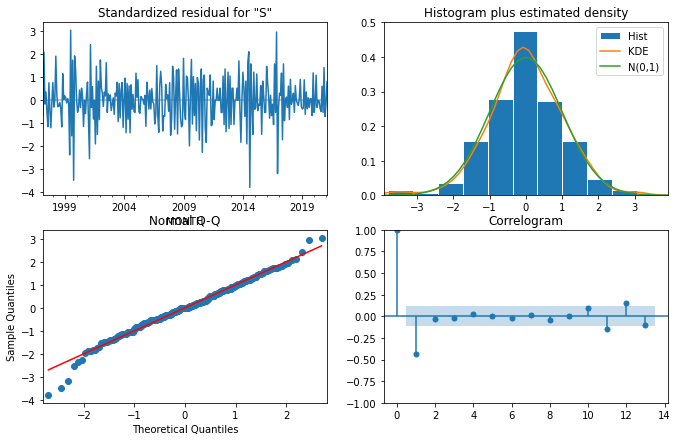

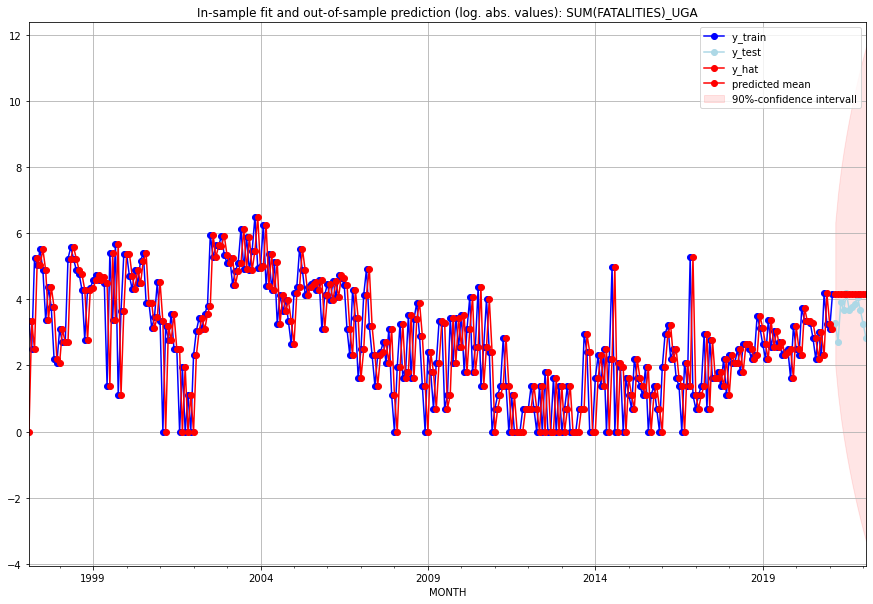

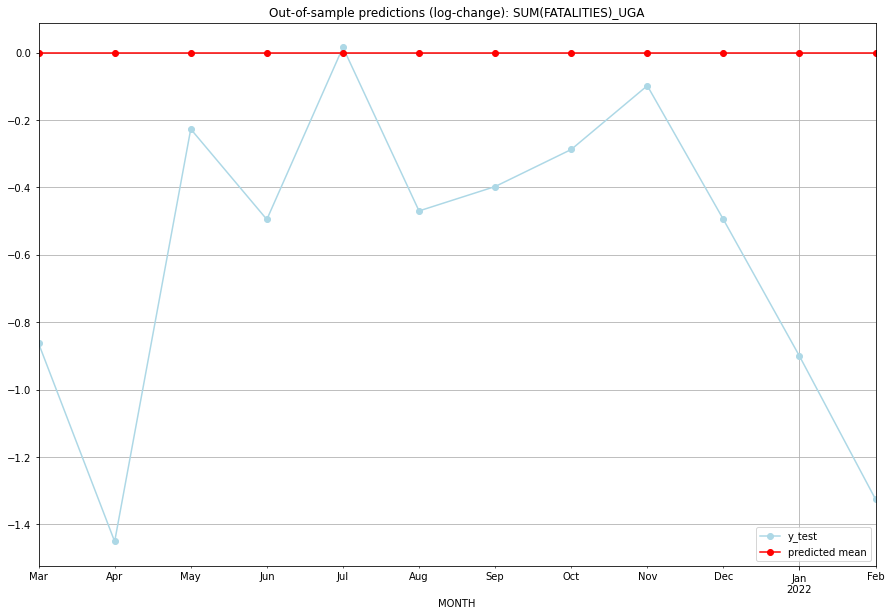

TADDA: 0.5856123865052247
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01      63.0        26.0           0.0       -0.863046   UGA   
1  2021-04-01      63.0        14.0           0.0       -1.450833   UGA   
2  2021-05-01      63.0        50.0           0.0       -0.227057   UGA   
3  2021-06-01      63.0        38.0           0.0       -0.495321   UGA   
4  2021-07-01      63.0        64.0           0.0        0.015504   UGA   
5  2021-08-01      63.0        39.0           0.0       -0.470004   UGA   
6  2021-09-01      63.0        42.0           0.0       -0.397683   UGA   
7  2021-10-01      63.0        47.0           0.0       -0.287682   UGA   
8  2021-11-01      63.0        57.0           0.0       -0.098440   UGA   
9  2021-12-01      63.0        38.0           0.0       -0.495321   UGA   
10 2022-01-01      63.0        25.0           0.0       -0.900787   UGA   
11 2022-02-01      63.0        16.0           0.0    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [3, (0, 0, 3), (0, 1, 0, 12), 'n'], 'cv_score': 0.391082805232779, 'fold_results': [nan, 0.391082805232779]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_UKR   No. Observations:                   38
Model:             SARIMAX(0, 0, 3)x(0, 1, [], 12)   Log Likelihood                 -25.109
Date:                             Fri, 21 Oct 2022   AIC                             64.218
Time:                                     20:05:29   BIC                             73.024
Sample:                                 01-31-2018   HQIC                            66.754
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------

<Figure size 432x288 with 0 Axes>

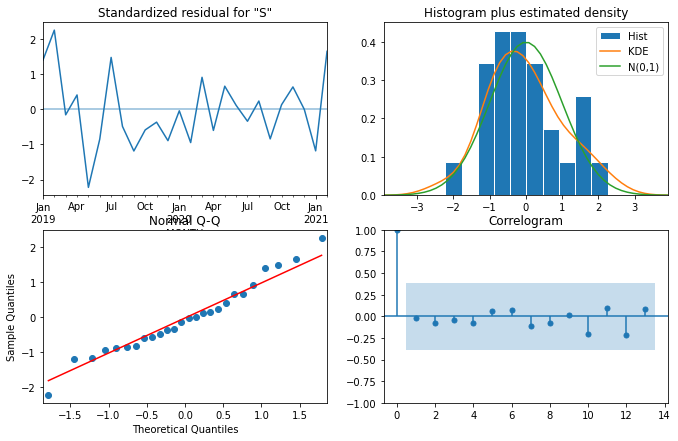

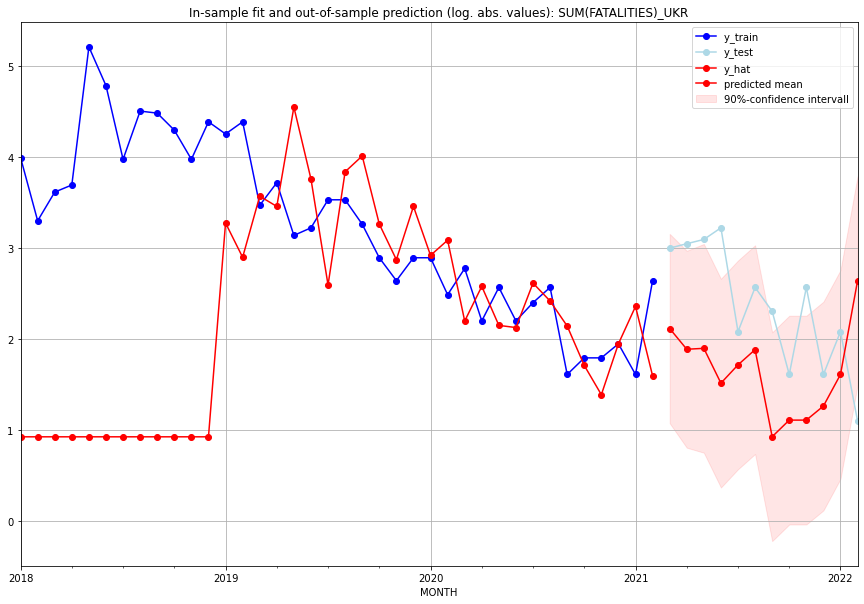

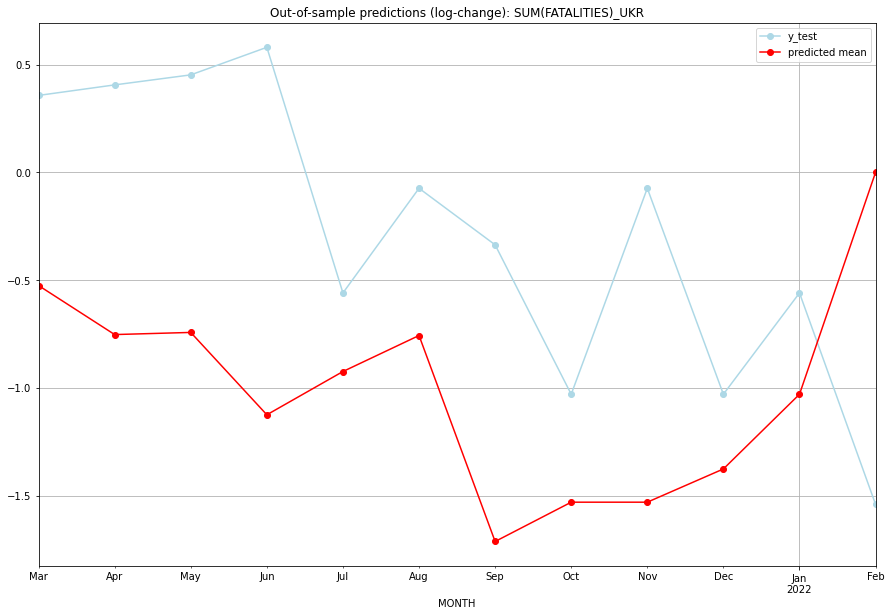

TADDA: 1.23518826977368
Evaluation finished.
        MONTH   FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01   7.278948        19.0 -5.253414e-01        0.356675   UKR   
1  2021-04-01   5.595332        20.0 -7.526952e-01        0.405465   UKR   
2  2021-05-01   5.661179        21.0 -7.427609e-01        0.451985   UKR   
3  2021-06-01   3.546169        24.0 -1.124772e+00        0.579818   UKR   
4  2021-07-01   4.556429         7.0 -9.241017e-01       -0.559616   UKR   
5  2021-08-01   5.566689        12.0 -7.570476e-01       -0.074108   UKR   
6  2021-09-01   1.525650         9.0 -1.712559e+00       -0.336472   UKR   
7  2021-10-01   2.030780         4.0 -1.530237e+00       -1.029619   UKR   
8  2021-11-01   2.030780        12.0 -1.530237e+00       -0.074108   UKR   
9  2021-12-01   2.535909         4.0 -1.376087e+00       -1.029619   UKR   
10 2022-01-01   4.000000         7.0 -1.029619e+00       -0.559616   UKR   
11 2022-02-01  13.000000         2.0  4.440

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 3), (0, 1, 0, 12), 'n'], 'cv_score': 0.0, 'fold_results': [nan, 0.0]}
Training finished.
                                      SARIMAX Results                                      
Dep. Variable:                 SUM(FATALITIES)_URY   No. Observations:                   38
Model:             SARIMAX(0, 0, 3)x(0, 1, [], 12)   Log Likelihood                  -6.062
Date:                             Fri, 21 Oct 2022   AIC                             20.123
Time:                                     20:07:23   BIC                             25.156
Sample:                                 01-31-2018   HQIC                            21.572
                                      - 02-28-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------

<Figure size 432x288 with 0 Axes>

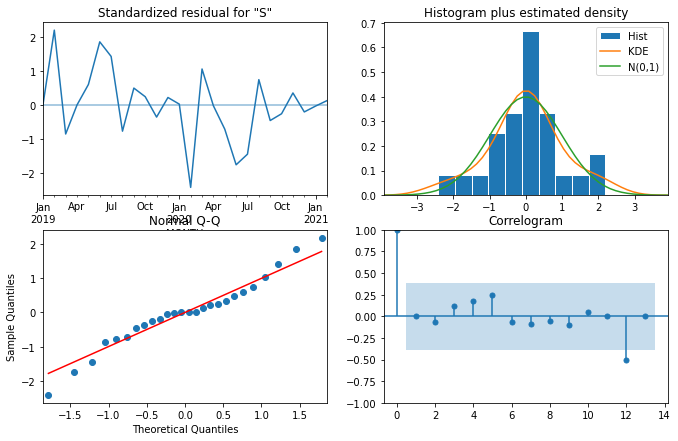

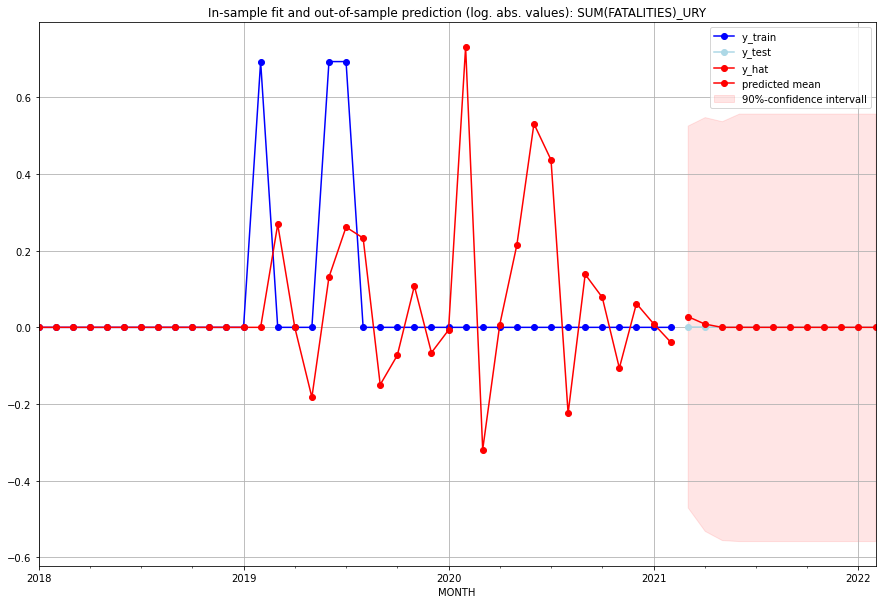

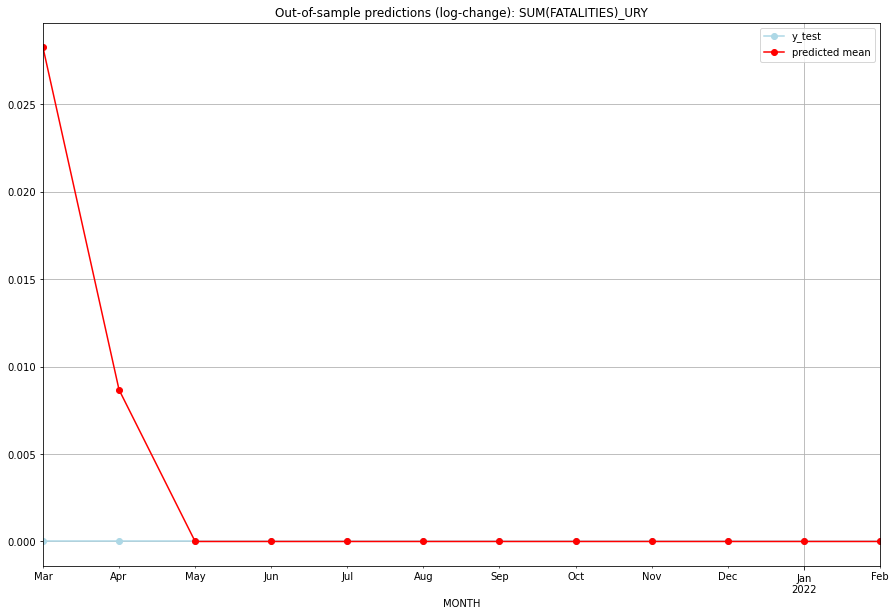

TADDA: 0.0030773957531064684
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.028657         0.0  2.825362e-02             0.0   URY   
1  2021-04-01  0.008713         0.0  8.675127e-03             0.0   URY   
2  2021-05-01  0.000000         0.0  0.000000e+00             0.0   URY   
3  2021-06-01  0.000000         0.0  0.000000e+00             0.0   URY   
4  2021-07-01  0.000000         0.0  8.033030e-18             0.0   URY   
5  2021-08-01  0.000000         0.0  3.338304e-17             0.0   URY   
6  2021-09-01  0.000000         0.0  1.492536e-17             0.0   URY   
7  2021-10-01  0.000000         0.0  0.000000e+00             0.0   URY   
8  2021-11-01  0.000000         0.0  1.072409e-17             0.0   URY   
9  2021-12-01  0.000000         0.0  3.166752e-18             0.0   URY   
10 2022-01-01  0.000000         0.0  2.149865e-18             0.0   URY   
11 2022-02-01  0.000000         0.0  2.698752e-18 

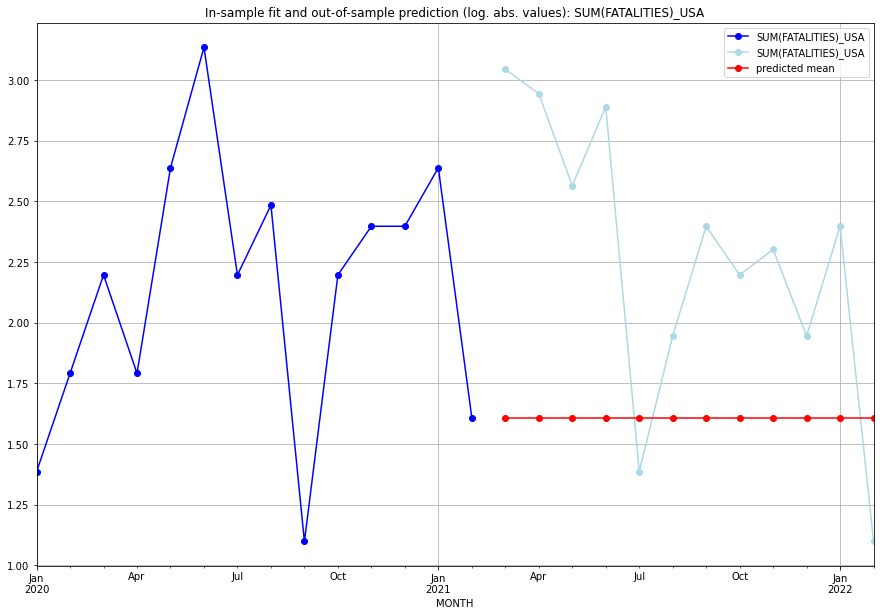

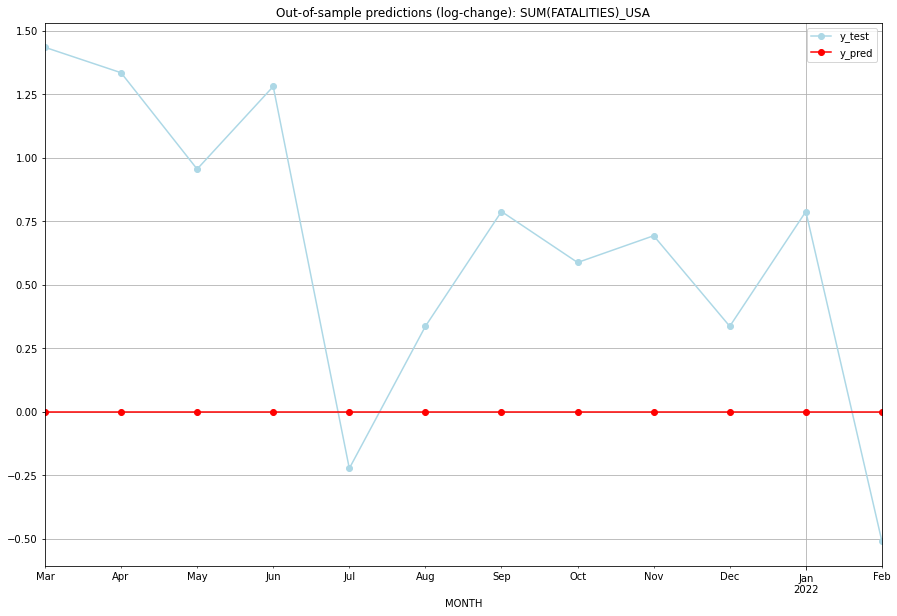

TADDA: 0.772607758085366
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.609438    3.044522           0.0        1.435085   USA   
1  2021-04-01  1.609438    2.944439           0.0        1.335001   USA   
2  2021-05-01  1.609438    2.564949           0.0        0.955511   USA   
3  2021-06-01  1.609438    2.890372           0.0        1.280934   USA   
4  2021-07-01  1.609438    1.386294           0.0       -0.223144   USA   
5  2021-08-01  1.609438    1.945910           0.0        0.336472   USA   
6  2021-09-01  1.609438    2.397895           0.0        0.788457   USA   
7  2021-10-01  1.609438    2.197225           0.0        0.587787   USA   
8  2021-11-01  1.609438    2.302585           0.0        0.693147   USA   
9  2021-12-01  1.609438    1.945910           0.0        0.336472   USA   
10 2022-01-01  1.609438    2.397895           0.0        0.788457   USA   
11 2022-02-01  1.609438    1.098612           0.0     

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [2, (3, 1, 0), (1, 0, 1, 12), 'n'], 'cv_score': 0.1915300836365329, 'fold_results': [0.21049833622156278, 0.172561831051503]}
Training finished.
                                      SARIMAX Results                                       
Dep. Variable:                  SUM(FATALITIES)_UZB   No. Observations:                   38
Model:             SARIMAX(3, 1, 0)x(1, 0, [1], 12)   Log Likelihood                 -11.500
Date:                              Fri, 21 Oct 2022   AIC                             39.001
Time:                                      20:08:36   BIC                             51.888
Sample:                                  01-31-2018   HQIC                            43.544
                                       - 02-28-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---

<Figure size 432x288 with 0 Axes>

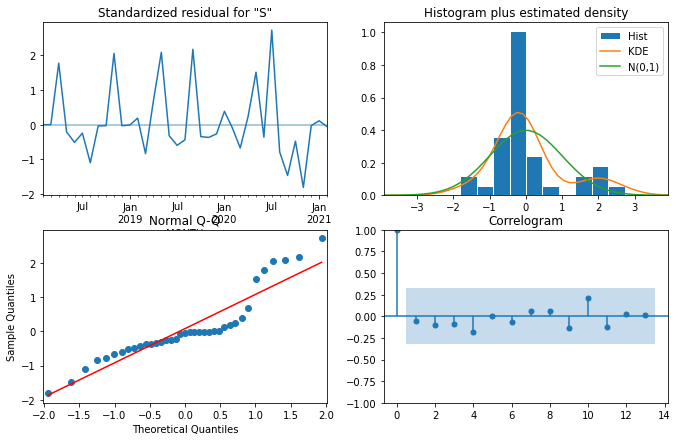

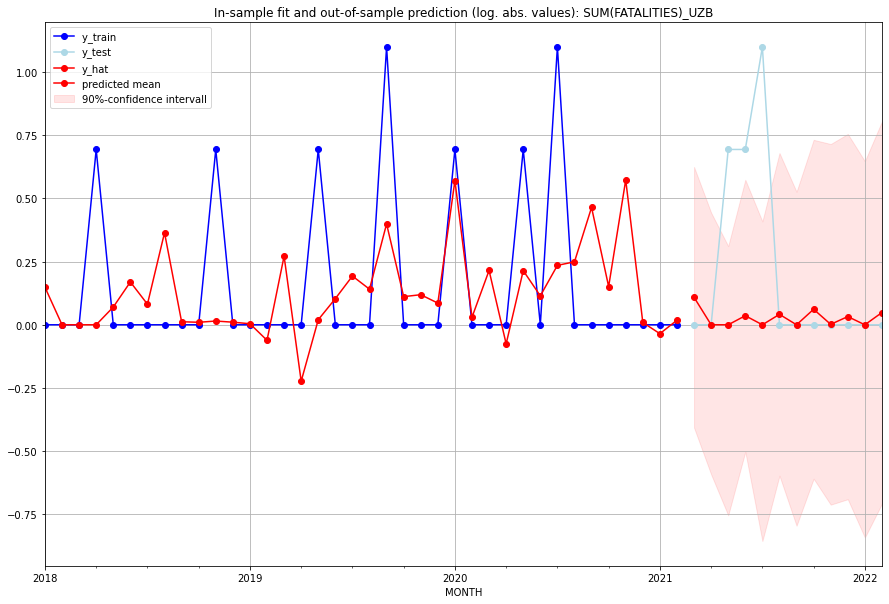

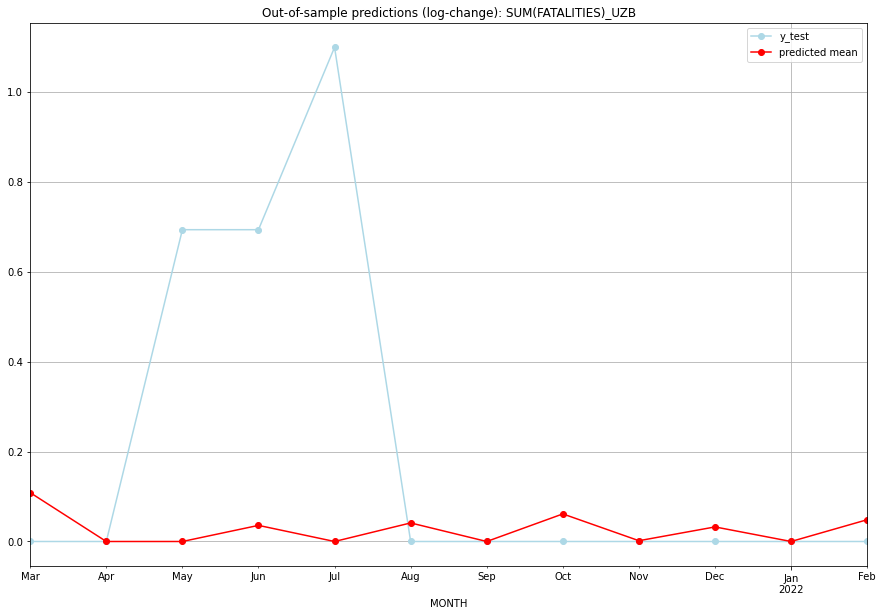

TADDA: 0.22856520832224
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  0.114685         0.0      0.108572        0.000000   UZB   
1  2021-04-01  0.000000         0.0      0.000000        0.000000   UZB   
2  2021-05-01  0.000000         1.0      0.000000        0.693147   UZB   
3  2021-06-01  0.036460         1.0      0.035811        0.693147   UZB   
4  2021-07-01  0.000000         2.0      0.000000        1.098612   UZB   
5  2021-08-01  0.042127         0.0      0.041264        0.000000   UZB   
6  2021-09-01  0.000000         0.0      0.000000        0.000000   UZB   
7  2021-10-01  0.063229         0.0      0.061311        0.000000   UZB   
8  2021-11-01  0.001738         0.0      0.001736        0.000000   UZB   
9  2021-12-01  0.032919         0.0      0.032389        0.000000   UZB   
10 2022-01-01  0.000000         0.0      0.000000        0.000000   UZB   
11 2022-02-01  0.049606         0.0      0.048415      

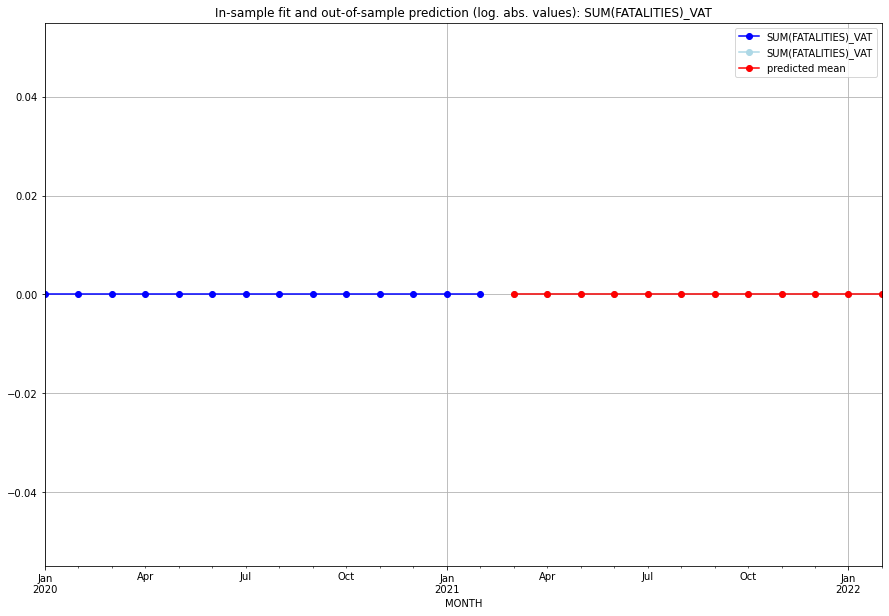

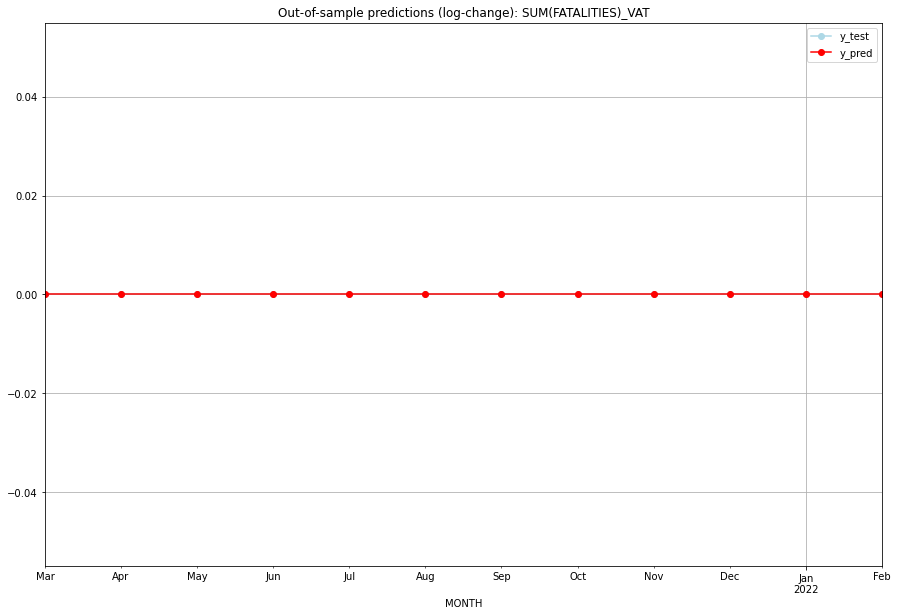

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   VAT   
1  2021-04-01       0.0         0.0           0.0             0.0   VAT   
2  2021-05-01       0.0         0.0           0.0             0.0   VAT   
3  2021-06-01       0.0         0.0           0.0             0.0   VAT   
4  2021-07-01       0.0         0.0           0.0             0.0   VAT   
5  2021-08-01       0.0         0.0           0.0             0.0   VAT   
6  2021-09-01       0.0         0.0           0.0             0.0   VAT   
7  2021-10-01       0.0         0.0           0.0             0.0   VAT   
8  2021-11-01       0.0         0.0           0.0             0.0   VAT   
9  2021-12-01       0.0         0.0           0.0             0.0   VAT   
10 2022-01-01       0.0         0.0           0.0             0.0   VAT   
11 2022-02-01       0.0         0.0           0.0             0.0   

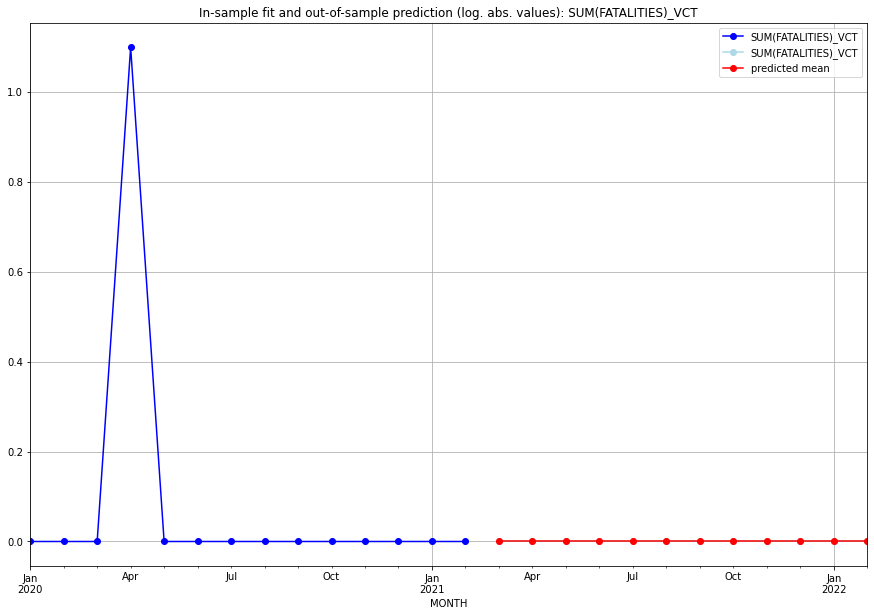

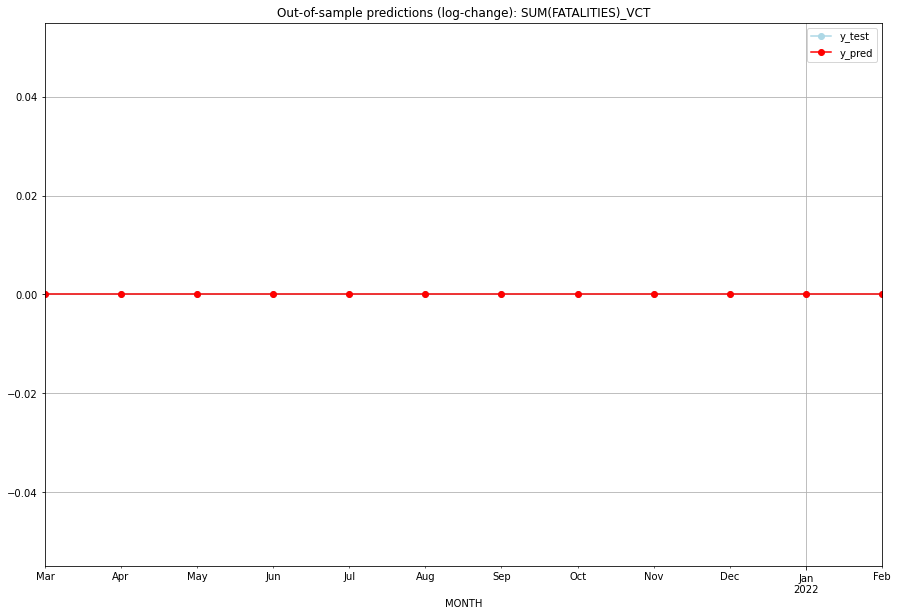

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   VCT   
1  2021-04-01       0.0         0.0           0.0             0.0   VCT   
2  2021-05-01       0.0         0.0           0.0             0.0   VCT   
3  2021-06-01       0.0         0.0           0.0             0.0   VCT   
4  2021-07-01       0.0         0.0           0.0             0.0   VCT   
5  2021-08-01       0.0         0.0           0.0             0.0   VCT   
6  2021-09-01       0.0         0.0           0.0             0.0   VCT   
7  2021-10-01       0.0         0.0           0.0             0.0   VCT   
8  2021-11-01       0.0         0.0           0.0             0.0   VCT   
9  2021-12-01       0.0         0.0           0.0             0.0   VCT   
10 2022-01-01       0.0         0.0           0.0             0.0   VCT   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (0, 0, 3), (0, 0, 2, 12), 'n'], 'cv_score': 0.5605696000019514, 'fold_results': [0.33605609724884794, 0.785083102755055]}
Training finished.
                                        SARIMAX Results                                        
Dep. Variable:                     SUM(FATALITIES)_VEN   No. Observations:                   38
Model:             SARIMAX(0, 0, 3)x(0, 0, [1, 2], 12)   Log Likelihood                 -52.516
Date:                                 Fri, 21 Oct 2022   AIC                            119.031
Time:                                         20:09:54   BIC                            130.494
Sample:                                     01-31-2018   HQIC                           123.110
                                          - 02-28-2021                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|    

<Figure size 432x288 with 0 Axes>

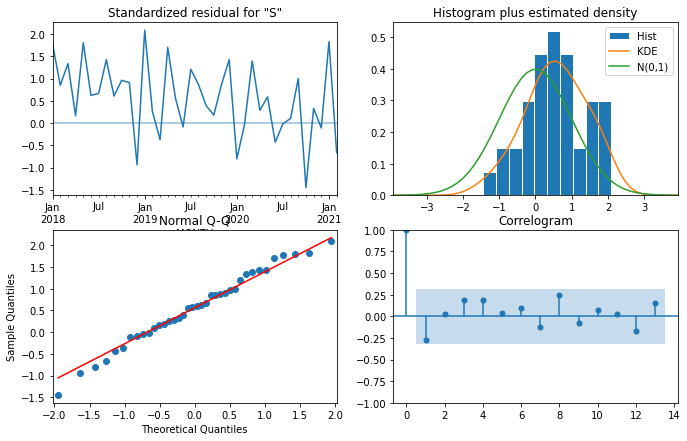

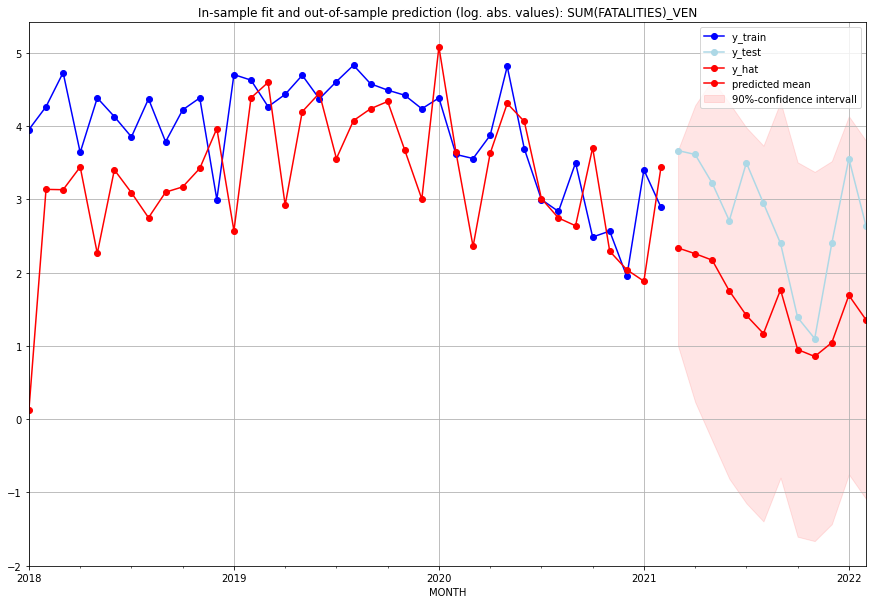

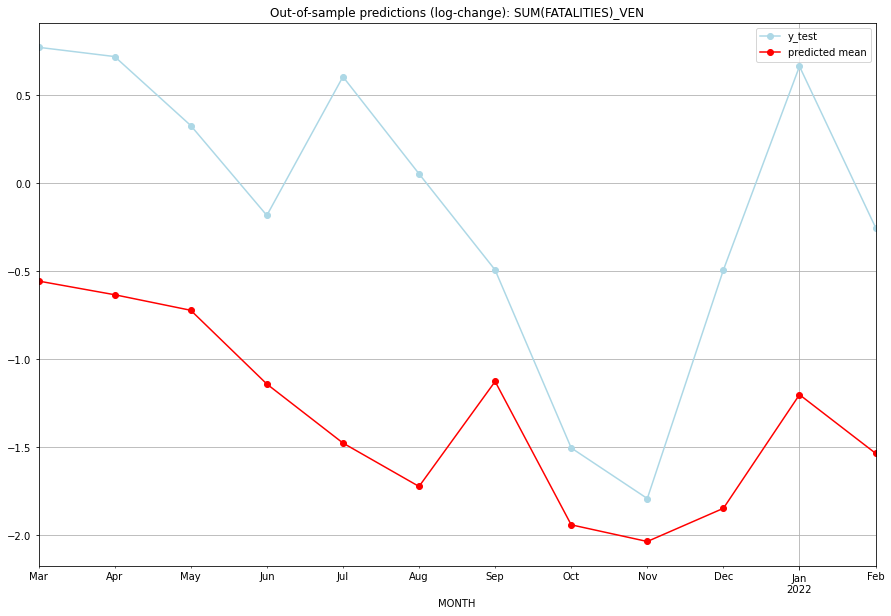

TADDA: 1.7234711939525071
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  9.327447        38.0     -0.555567        0.773190   VEN   
1  2021-04-01  8.555204        36.0     -0.633286        0.720546   VEN   
2  2021-05-01  7.746642        24.0     -0.721702        0.328504   VEN   
3  2021-06-01  4.751686        14.0     -1.140879       -0.182322   VEN   
4  2021-07-01  3.113060        32.0     -1.476205        0.606136   VEN   
5  2021-08-01  2.213269        18.0     -1.723083        0.054067   VEN   
6  2021-09-01  4.836634        10.0     -1.126217       -0.492476   VEN   
7  2021-10-01  1.583659         3.0     -1.941165       -1.504077   VEN   
8  2021-11-01  1.350053         2.0     -2.035934       -1.791759   VEN   
9  2021-12-01  1.837562        10.0     -1.847427       -0.492476   VEN   
10 2022-01-01  4.414076        34.0     -1.201370        0.664976   VEN   
11 2022-02-01  2.879693        13.0     -1.534616    

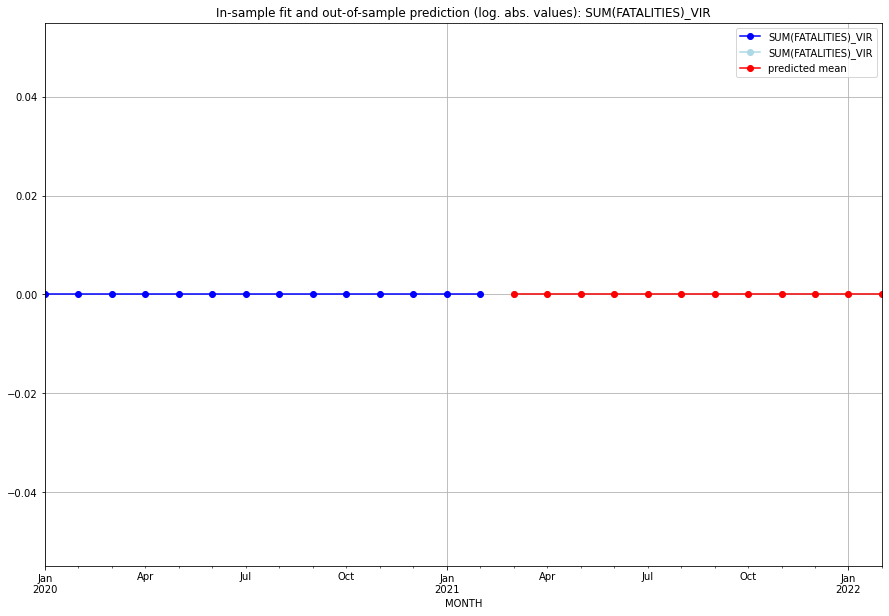

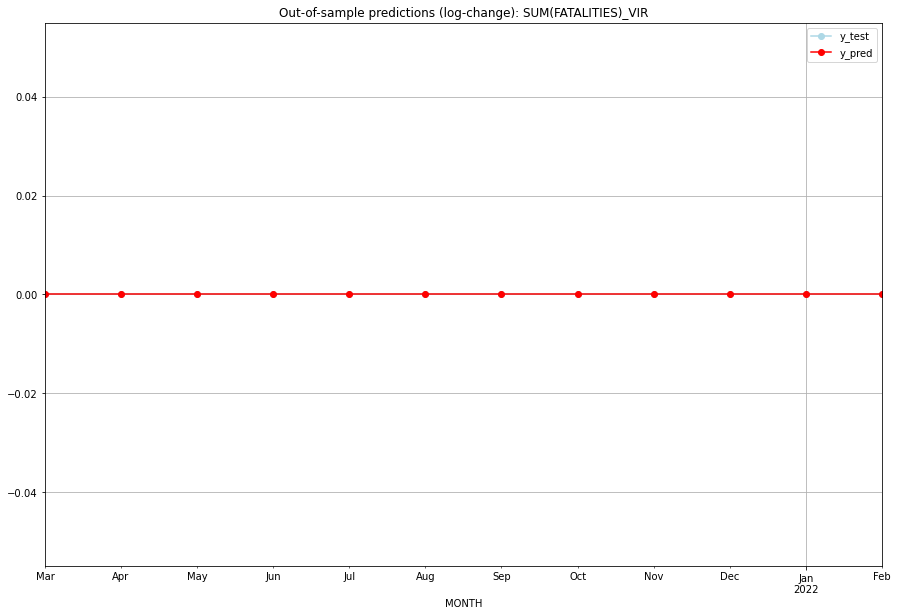

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   VIR   
1  2021-04-01       0.0         0.0           0.0             0.0   VIR   
2  2021-05-01       0.0         0.0           0.0             0.0   VIR   
3  2021-06-01       0.0         0.0           0.0             0.0   VIR   
4  2021-07-01       0.0         0.0           0.0             0.0   VIR   
5  2021-08-01       0.0         0.0           0.0             0.0   VIR   
6  2021-09-01       0.0         0.0           0.0             0.0   VIR   
7  2021-10-01       0.0         0.0           0.0             0.0   VIR   
8  2021-11-01       0.0         0.0           0.0             0.0   VIR   
9  2021-12-01       0.0         0.0           0.0             0.0   VIR   
10 2022-01-01       0.0         0.0           0.0             0.0   VIR   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.14910624710236195, 'fold_results': [0.23104906018664842, 0.17328679513998632, 0.1493132891023379, 0.19188209108283716, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_VNM   No. Observations:                  134
Model:                         SARIMAX   Log Likelihood                -132.136
Date:                 Fri, 21 Oct 2022   AIC                            266.272
Time:                         20:16:28   BIC                            269.170
Sample:                     01-31-2010   HQIC                           267.449
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------

<Figure size 432x288 with 0 Axes>

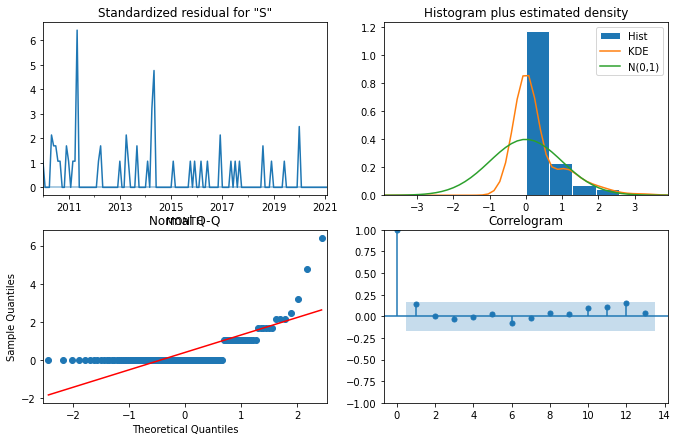

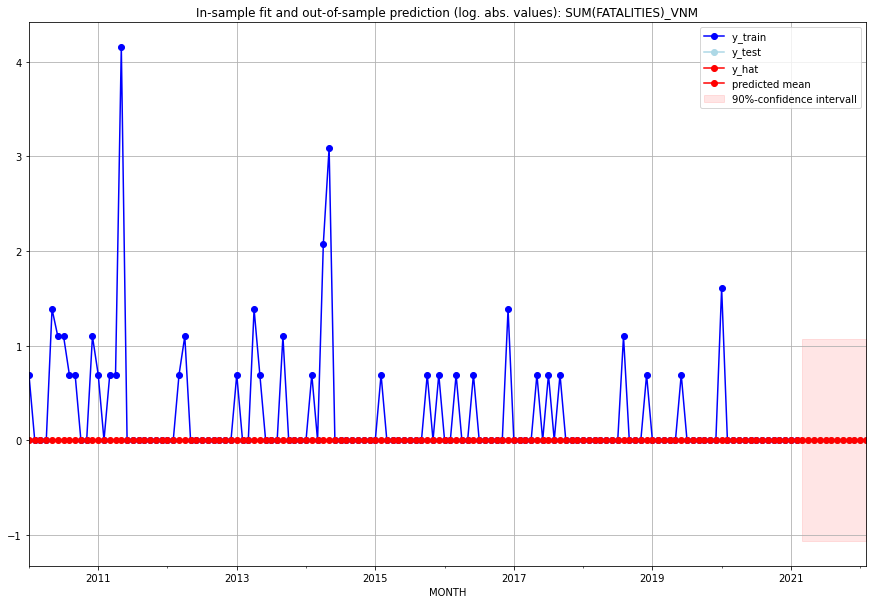

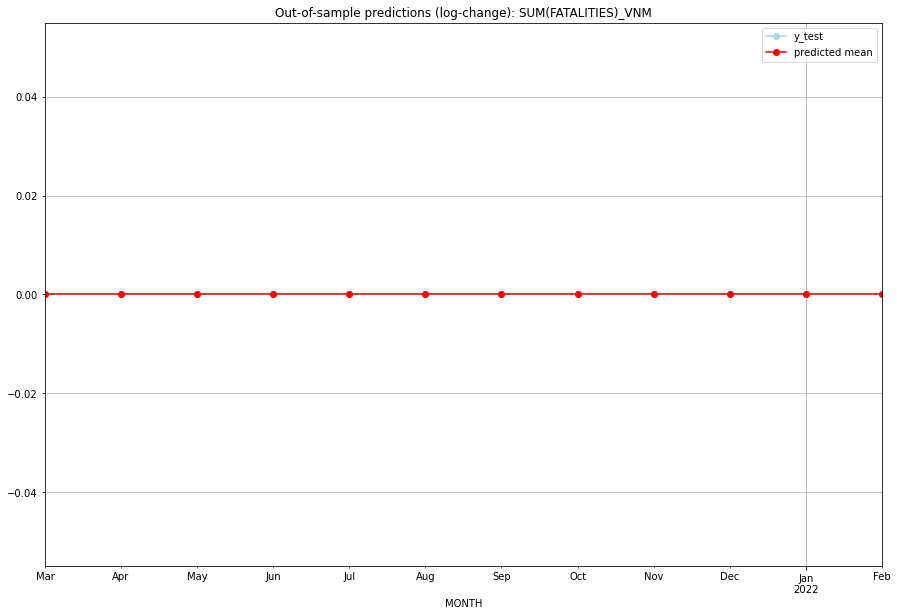

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   VNM   
1  2021-04-01       0.0         0.0           0.0             0.0   VNM   
2  2021-05-01       0.0         0.0           0.0             0.0   VNM   
3  2021-06-01       0.0         0.0           0.0             0.0   VNM   
4  2021-07-01       0.0         0.0           0.0             0.0   VNM   
5  2021-08-01       0.0         0.0           0.0             0.0   VNM   
6  2021-09-01       0.0         0.0           0.0             0.0   VNM   
7  2021-10-01       0.0         0.0           0.0             0.0   VNM   
8  2021-11-01       0.0         0.0           0.0             0.0   VNM   
9  2021-12-01       0.0         0.0           0.0             0.0   VNM   
10 2022-01-01       0.0         0.0           0.0             0.0   VNM   
11 2022-02-01       0.0         0.0           0.0             0.0   

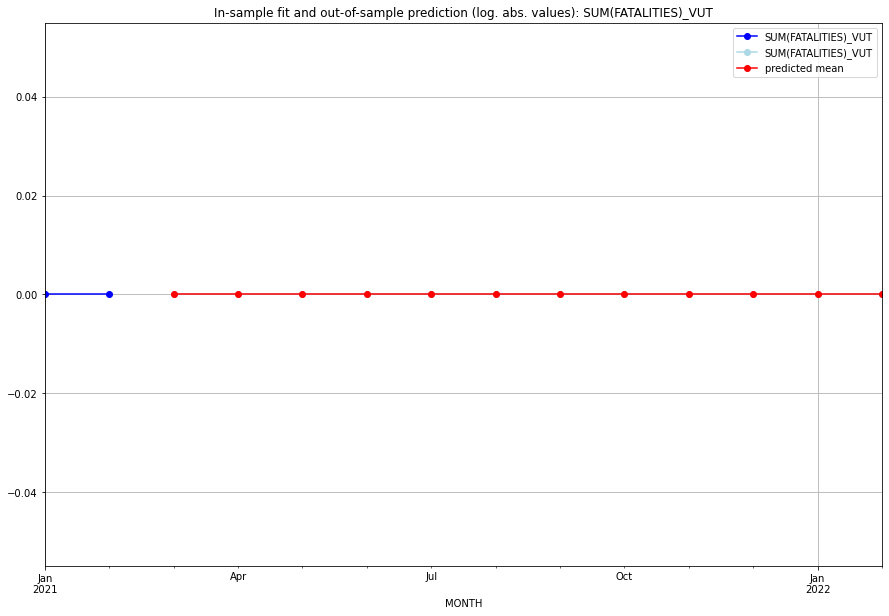

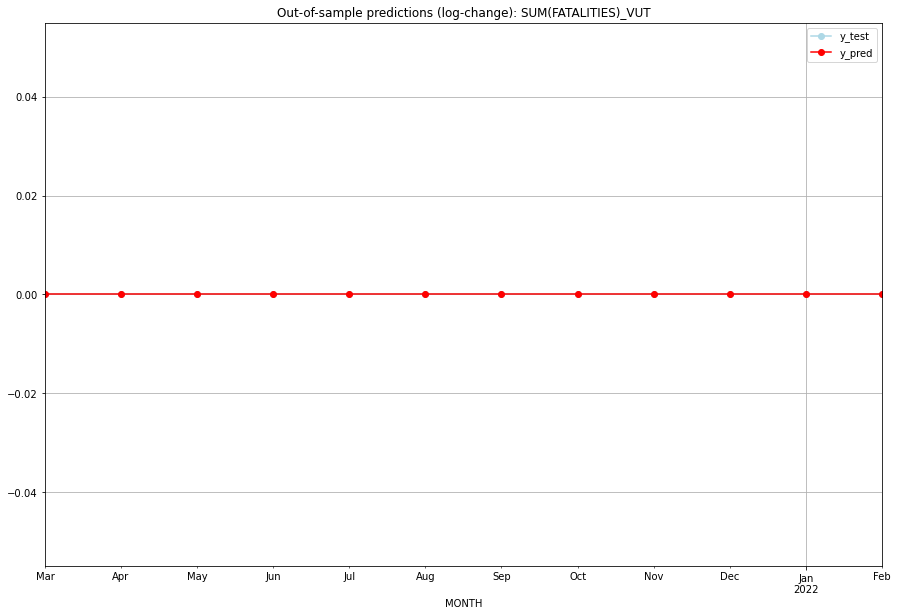

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   VUT   
1  2021-04-01       0.0         0.0           0.0             0.0   VUT   
2  2021-05-01       0.0         0.0           0.0             0.0   VUT   
3  2021-06-01       0.0         0.0           0.0             0.0   VUT   
4  2021-07-01       0.0         0.0           0.0             0.0   VUT   
5  2021-08-01       0.0         0.0           0.0             0.0   VUT   
6  2021-09-01       0.0         0.0           0.0             0.0   VUT   
7  2021-10-01       0.0         0.0           0.0             0.0   VUT   
8  2021-11-01       0.0         0.0           0.0             0.0   VUT   
9  2021-12-01       0.0         0.0           0.0             0.0   VUT   
10 2022-01-01       0.0         0.0           0.0             0.0   VUT   
11 2022-02-01       0.0         0.0           0.0             0.0   

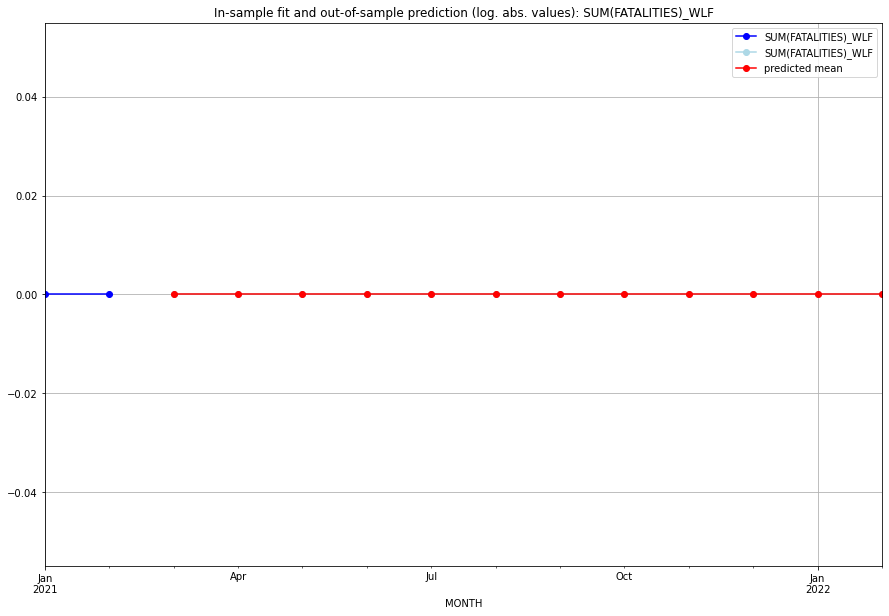

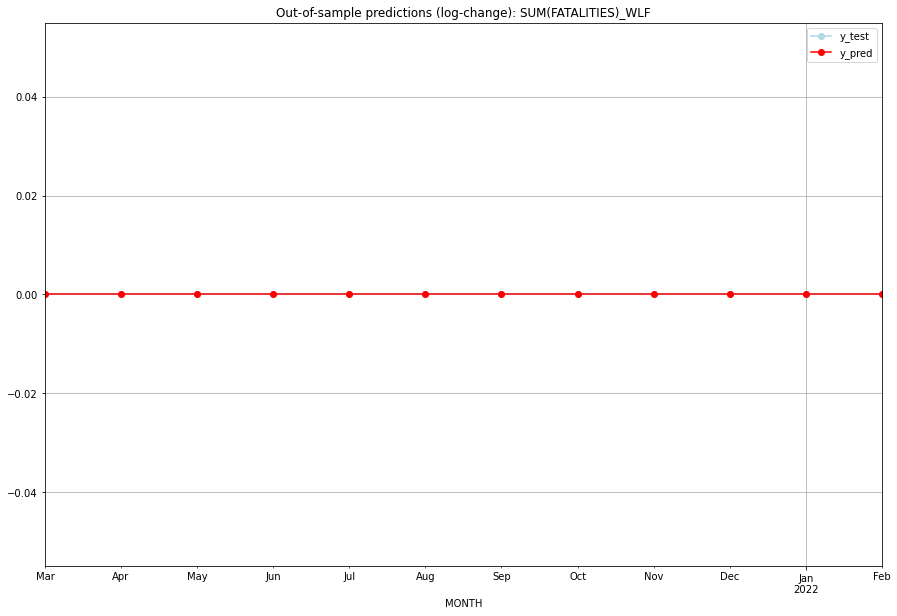

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   WLF   
1  2021-04-01       0.0         0.0           0.0             0.0   WLF   
2  2021-05-01       0.0         0.0           0.0             0.0   WLF   
3  2021-06-01       0.0         0.0           0.0             0.0   WLF   
4  2021-07-01       0.0         0.0           0.0             0.0   WLF   
5  2021-08-01       0.0         0.0           0.0             0.0   WLF   
6  2021-09-01       0.0         0.0           0.0             0.0   WLF   
7  2021-10-01       0.0         0.0           0.0             0.0   WLF   
8  2021-11-01       0.0         0.0           0.0             0.0   WLF   
9  2021-12-01       0.0         0.0           0.0             0.0   WLF   
10 2022-01-01       0.0         0.0           0.0             0.0   WLF   
11 2022-02-01       0.0         0.0           0.0             0.0   

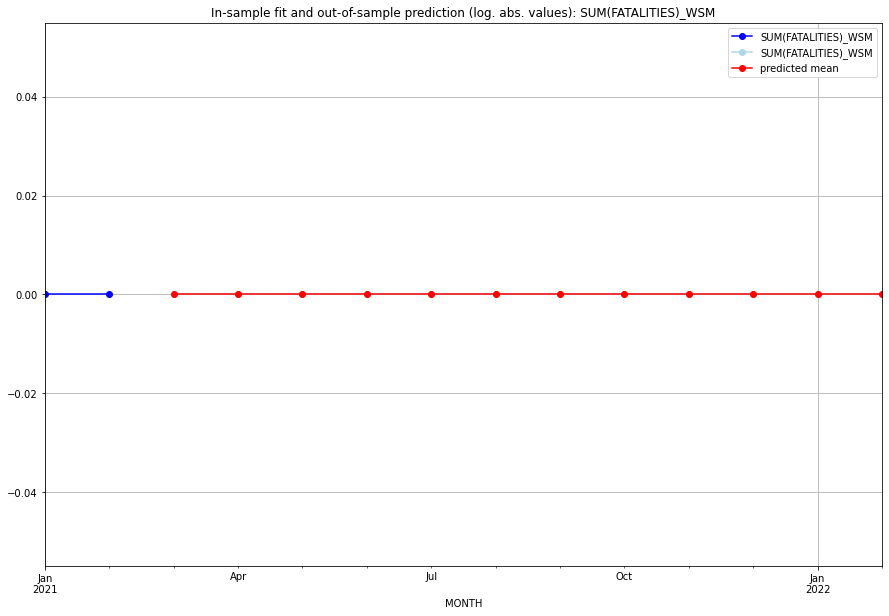

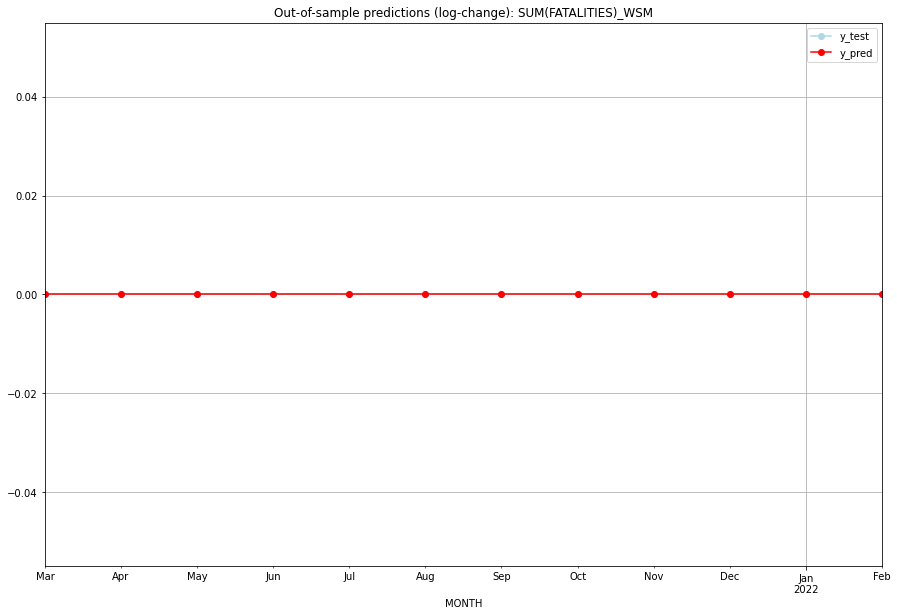

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   WSM   
1  2021-04-01       0.0         0.0           0.0             0.0   WSM   
2  2021-05-01       0.0         0.0           0.0             0.0   WSM   
3  2021-06-01       0.0         0.0           0.0             0.0   WSM   
4  2021-07-01       0.0         0.0           0.0             0.0   WSM   
5  2021-08-01       0.0         0.0           0.0             0.0   WSM   
6  2021-09-01       0.0         0.0           0.0             0.0   WSM   
7  2021-10-01       0.0         0.0           0.0             0.0   WSM   
8  2021-11-01       0.0         0.0           0.0             0.0   WSM   
9  2021-12-01       0.0         0.0           0.0             0.0   WSM   
10 2022-01-01       0.0         0.0           0.0             0.0   WSM   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.7231088296192528, 'fold_results': [0.7161795193793639, 0.8654928084817018, 0.3226000842423243, 1.1630008016586992, 0.5482709343341752]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_XAR   No. Observations:                  289
Model:                         SARIMAX   Log Likelihood                -441.847
Date:                 Fri, 21 Oct 2022   AIC                            885.694
Time:                         20:24:43   BIC                            889.361
Sample:                     02-28-1997   HQIC                           887.163
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------

<Figure size 432x288 with 0 Axes>

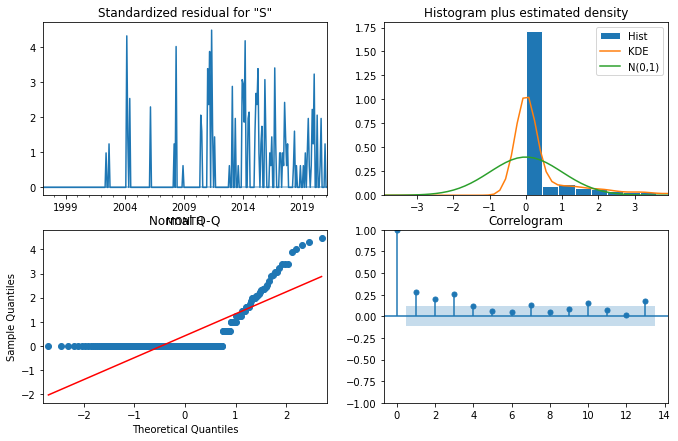

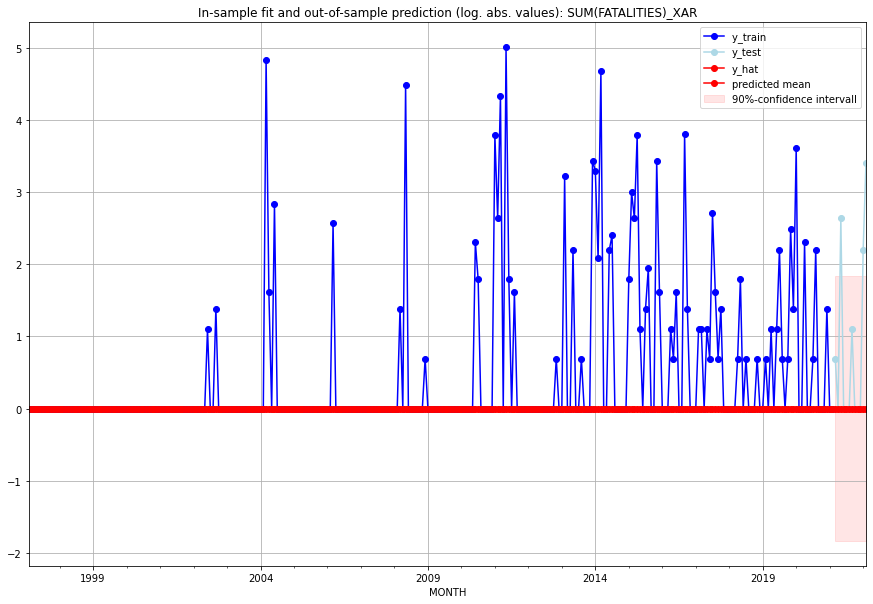

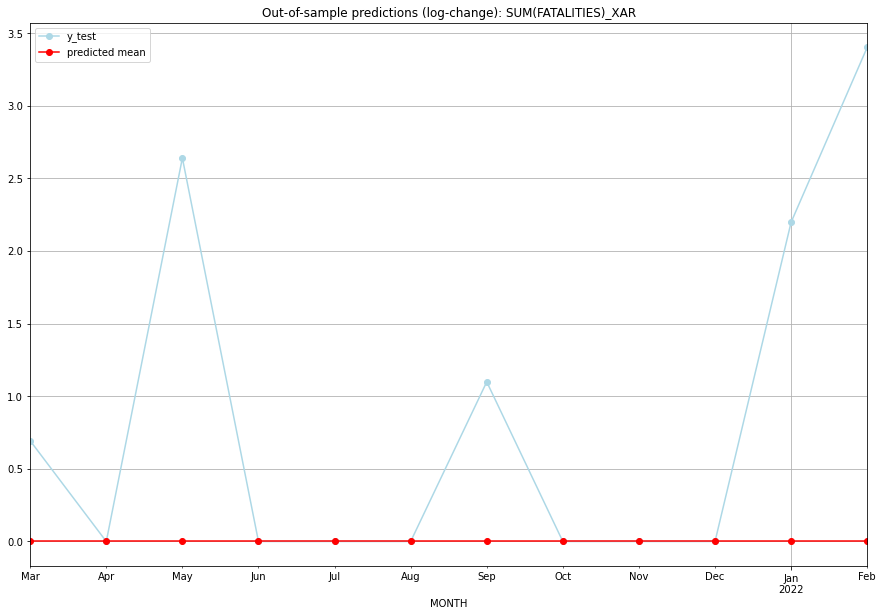

TADDA: 0.8357698964868074
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         1.0           0.0        0.693147   XAR   
1  2021-04-01       0.0         0.0           0.0        0.000000   XAR   
2  2021-05-01       0.0        13.0           0.0        2.639057   XAR   
3  2021-06-01       0.0         0.0           0.0        0.000000   XAR   
4  2021-07-01       0.0         0.0           0.0        0.000000   XAR   
5  2021-08-01       0.0         0.0           0.0        0.000000   XAR   
6  2021-09-01       0.0         2.0           0.0        1.098612   XAR   
7  2021-10-01       0.0         0.0           0.0        0.000000   XAR   
8  2021-11-01       0.0         0.0           0.0        0.000000   XAR   
9  2021-12-01       0.0         0.0           0.0        0.000000   XAR   
10 2022-01-01       0.0         8.0           0.0        2.197225   XAR   
11 2022-02-01       0.0        29.0           0.0    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.0, 'fold_results': [0.0, 0.0, 0.0, 0.0, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_XIT   No. Observations:                  289
Model:                         SARIMAX   Log Likelihood                 114.301
Date:                 Fri, 21 Oct 2022   AIC                           -226.602
Time:                         20:33:38   BIC                           -222.935
Sample:                     02-28-1997   HQIC                          -225.133
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0265      0.000    113.874      0.000    

<Figure size 432x288 with 0 Axes>

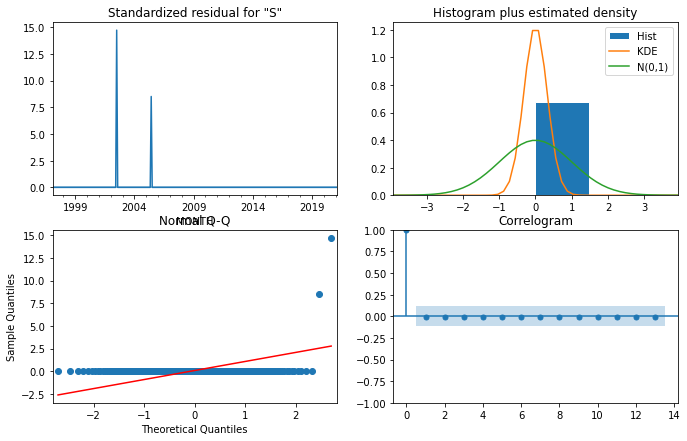

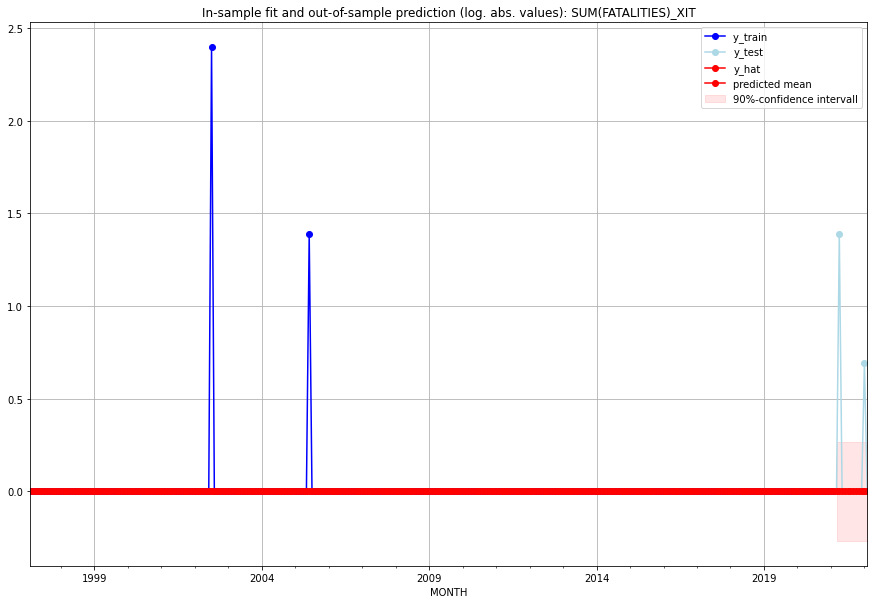

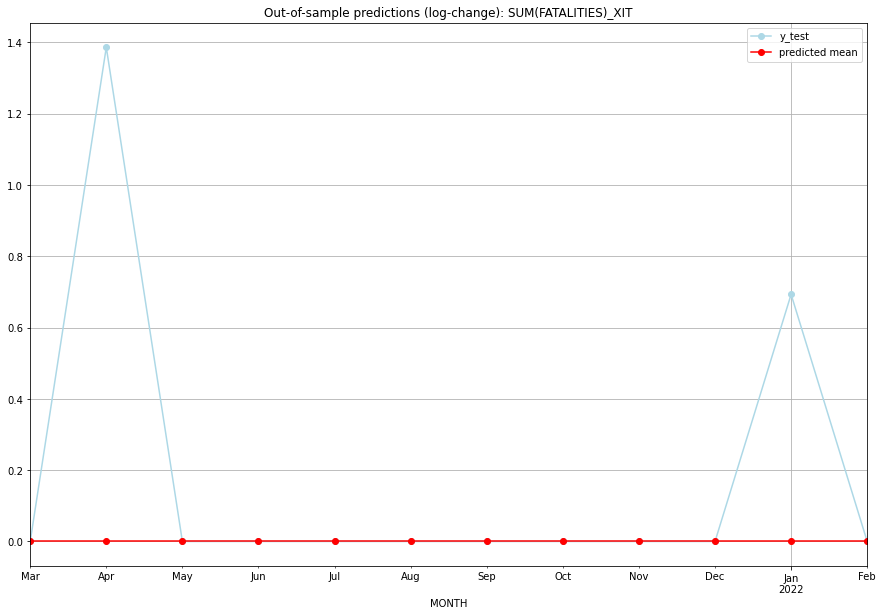

TADDA: 0.17328679513998632
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0        0.000000   XIT   
1  2021-04-01       0.0         3.0           0.0        1.386294   XIT   
2  2021-05-01       0.0         0.0           0.0        0.000000   XIT   
3  2021-06-01       0.0         0.0           0.0        0.000000   XIT   
4  2021-07-01       0.0         0.0           0.0        0.000000   XIT   
5  2021-08-01       0.0         0.0           0.0        0.000000   XIT   
6  2021-09-01       0.0         0.0           0.0        0.000000   XIT   
7  2021-10-01       0.0         0.0           0.0        0.000000   XIT   
8  2021-11-01       0.0         0.0           0.0        0.000000   XIT   
9  2021-12-01       0.0         0.0           0.0        0.000000   XIT   
10 2022-01-01       0.0         1.0           0.0        0.693147   XIT   
11 2022-02-01       0.0         0.0           0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.02986265782046758, 'fold_results': [0.0, 0.0, 0.0, 0.0, 0.1493132891023379]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_XKK   No. Observations:                  289
Model:                         SARIMAX   Log Likelihood                -112.227
Date:                 Fri, 21 Oct 2022   AIC                            226.454
Time:                         20:41:45   BIC                            230.120
Sample:                     02-28-1997   HQIC                           227.923
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.1273      

<Figure size 432x288 with 0 Axes>

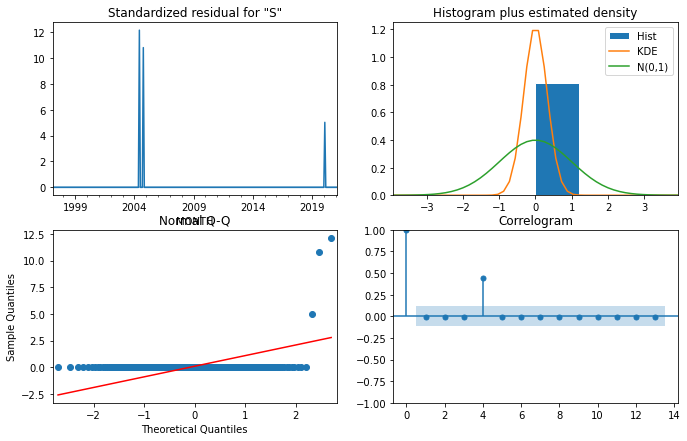

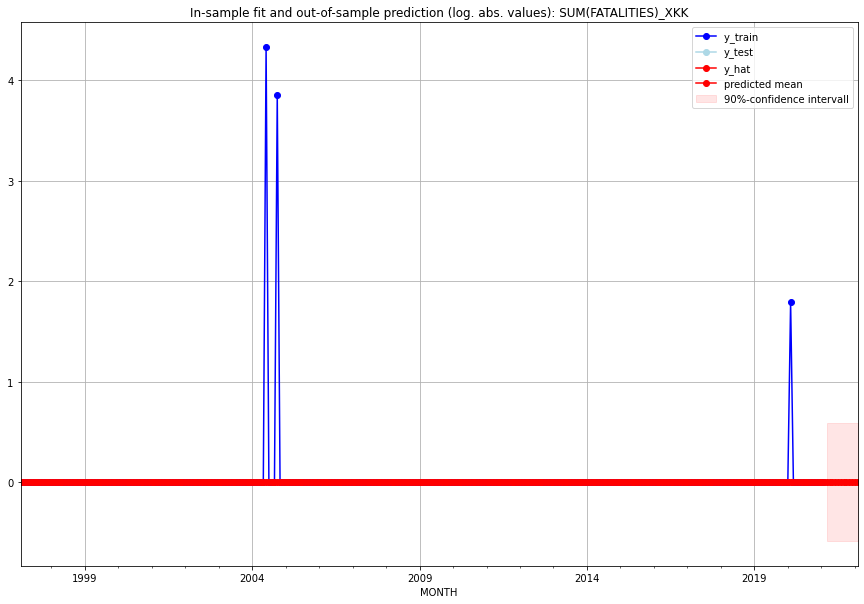

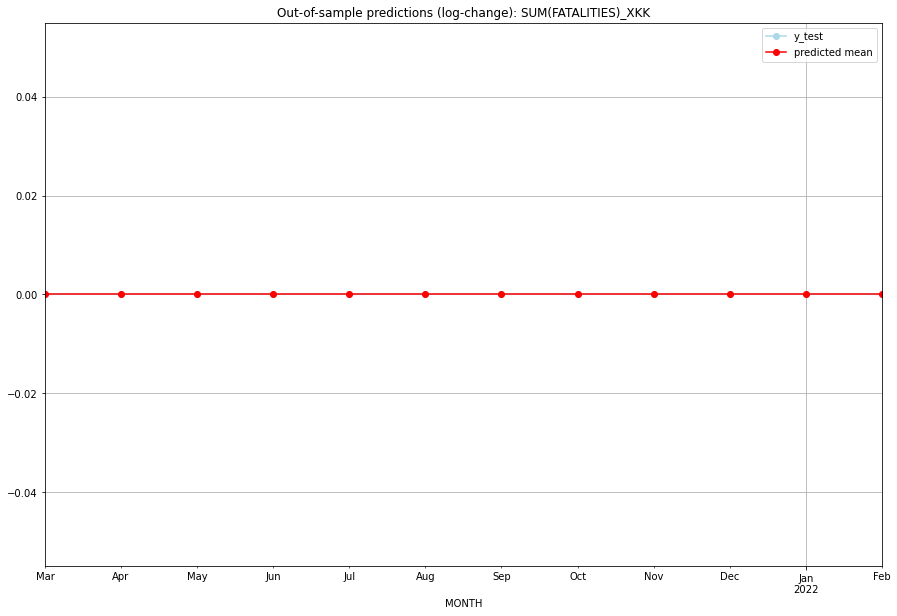

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   XKK   
1  2021-04-01       0.0         0.0           0.0             0.0   XKK   
2  2021-05-01       0.0         0.0           0.0             0.0   XKK   
3  2021-06-01       0.0         0.0           0.0             0.0   XKK   
4  2021-07-01       0.0         0.0           0.0             0.0   XKK   
5  2021-08-01       0.0         0.0           0.0             0.0   XKK   
6  2021-09-01       0.0         0.0           0.0             0.0   XKK   
7  2021-10-01       0.0         0.0           0.0             0.0   XKK   
8  2021-11-01       0.0         0.0           0.0             0.0   XKK   
9  2021-12-01       0.0         0.0           0.0             0.0   XKK   
10 2022-01-01       0.0         0.0           0.0             0.0   XKK   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.0, 'fold_results': [0.0, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_XKO   No. Observations:                   38
Model:                         SARIMAX   Log Likelihood                   0.493
Date:                 Fri, 21 Oct 2022   AIC                              1.013
Time:                         20:42:33   BIC                              2.651
Sample:                     01-31-2018   HQIC                             1.596
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0570      0.005     11.741      0.000       0.048       

<Figure size 432x288 with 0 Axes>

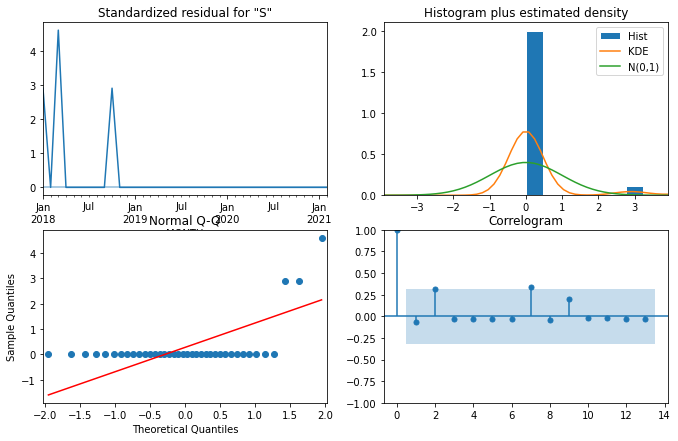

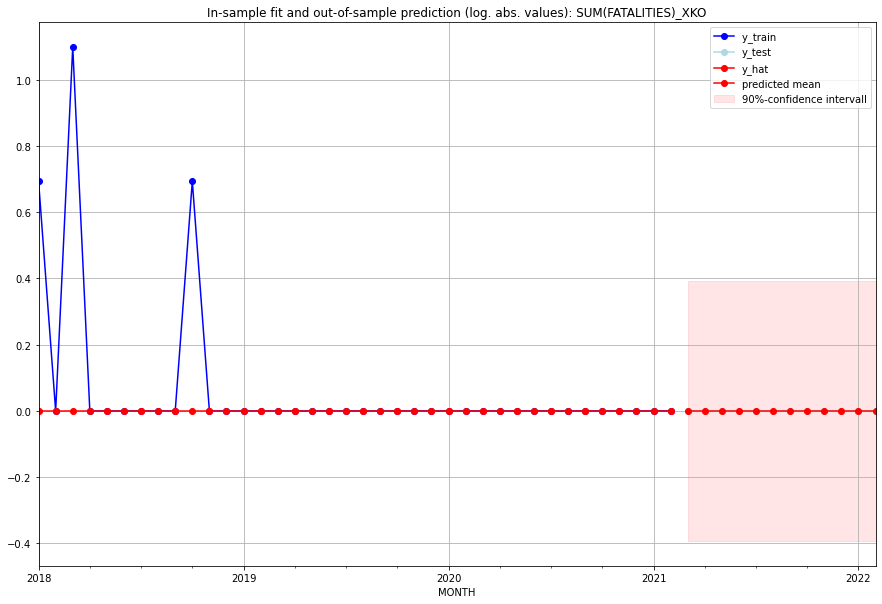

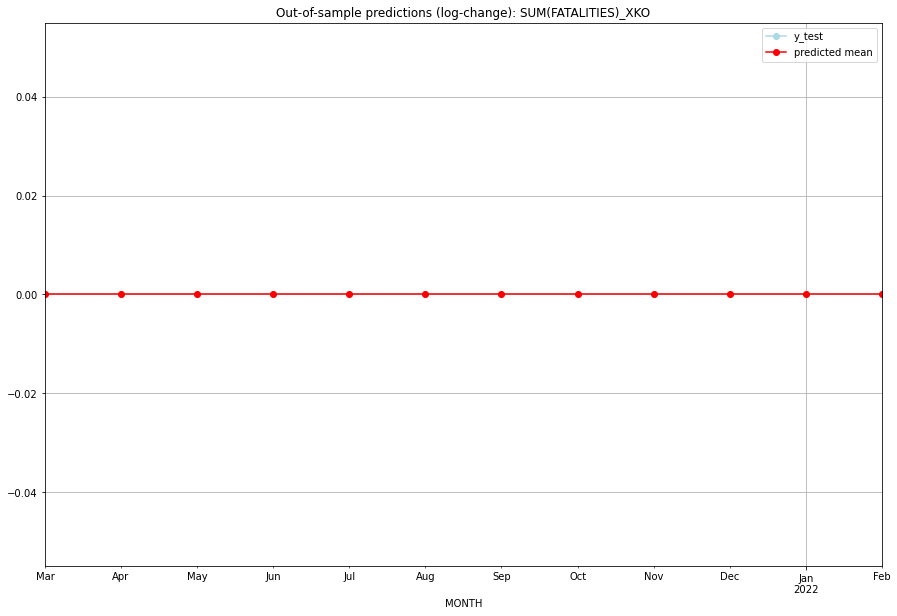

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   XKO   
1  2021-04-01       0.0         0.0           0.0             0.0   XKO   
2  2021-05-01       0.0         0.0           0.0             0.0   XKO   
3  2021-06-01       0.0         0.0           0.0             0.0   XKO   
4  2021-07-01       0.0         0.0           0.0             0.0   XKO   
5  2021-08-01       0.0         0.0           0.0             0.0   XKO   
6  2021-09-01       0.0         0.0           0.0             0.0   XKO   
7  2021-10-01       0.0         0.0           0.0             0.0   XKO   
8  2021-11-01       0.0         0.0           0.0             0.0   XKO   
9  2021-12-01       0.0         0.0           0.0             0.0   XKO   
10 2022-01-01       0.0         0.0           0.0             0.0   XKO   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.028881132523331052, 'fold_results': [0.057762265046662105, 0.0]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_XNC   No. Observations:                   38
Model:                         SARIMAX   Log Likelihood                  15.952
Date:                 Fri, 21 Oct 2022   AIC                            -29.904
Time:                         20:43:16   BIC                            -28.267
Sample:                     01-31-2018   HQIC                           -29.322
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0253      0.002     13

<Figure size 432x288 with 0 Axes>

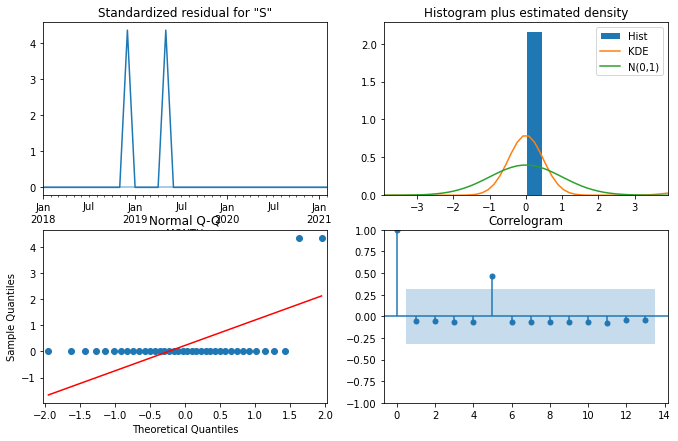

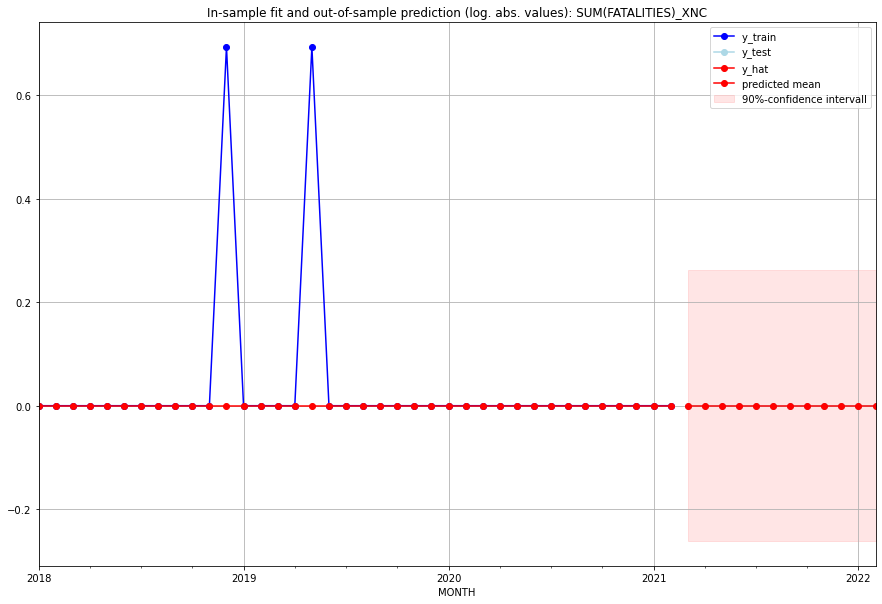

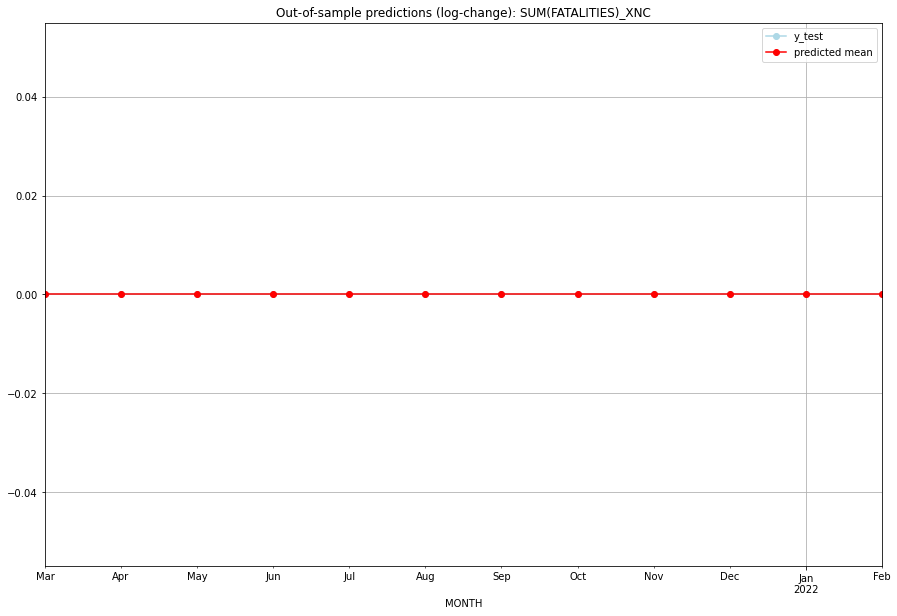

TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01       0.0         0.0           0.0             0.0   XNC   
1  2021-04-01       0.0         0.0           0.0             0.0   XNC   
2  2021-05-01       0.0         0.0           0.0             0.0   XNC   
3  2021-06-01       0.0         0.0           0.0             0.0   XNC   
4  2021-07-01       0.0         0.0           0.0             0.0   XNC   
5  2021-08-01       0.0         0.0           0.0             0.0   XNC   
6  2021-09-01       0.0         0.0           0.0             0.0   XNC   
7  2021-10-01       0.0         0.0           0.0             0.0   XNC   
8  2021-11-01       0.0         0.0           0.0             0.0   XNC   
9  2021-12-01       0.0         0.0           0.0             0.0   XNC   
10 2022-01-01       0.0         0.0           0.0             0.0   XNC   
11 2022-02-01       0.0         0.0           0.0             0.0   

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (2, 1, 3), (0, 0, 0, 12), 'n'], 'cv_score': 0.26838481619890353, 'fold_results': [nan, 0.35361843163628026, 0.17242883770196774, 0.3782023018232455, 0.16928969363412052]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_YEM   No. Observations:                   74
Model:                SARIMAX(2, 1, 3)   Log Likelihood                  -8.077
Date:                 Fri, 21 Oct 2022   AIC                             30.154
Time:                         20:47:16   BIC                             46.187
Sample:                     01-31-2015   HQIC                            36.544
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------

<Figure size 432x288 with 0 Axes>

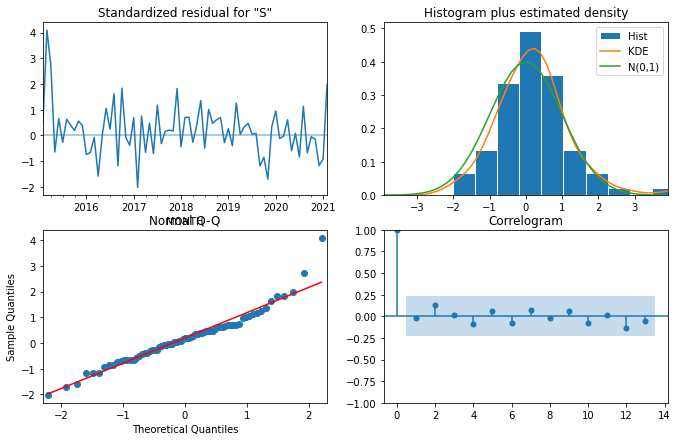

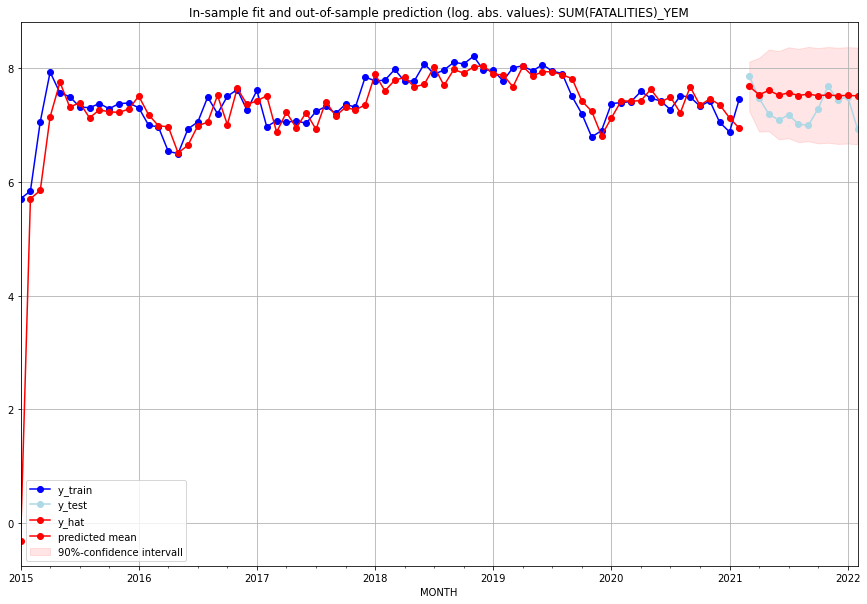

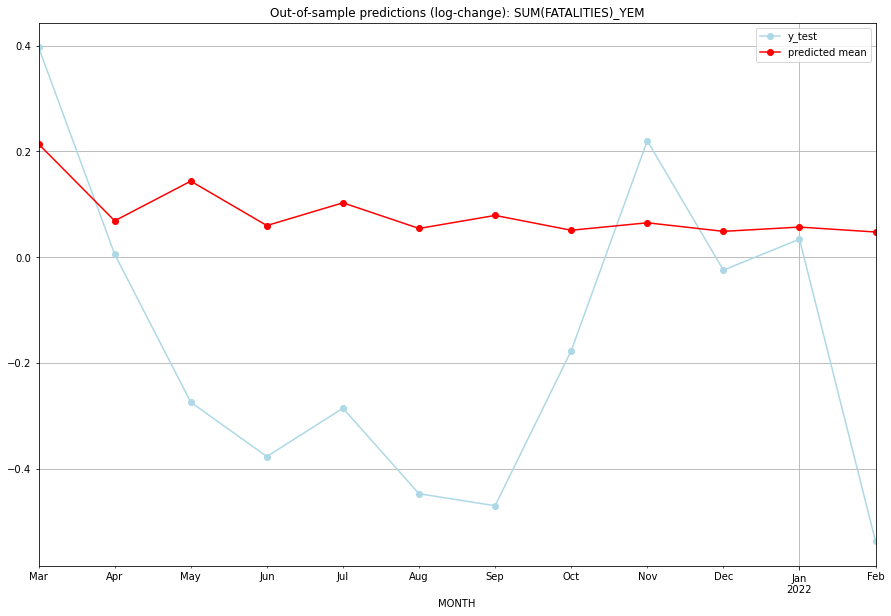

TADDA: 0.34937321430449725
Evaluation finished.
        MONTH     FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  2151.940283      2584.0      0.214099        0.396990   YEM   
1  2021-04-01  1860.724940      1747.0      0.068768        0.005737   YEM   
2  2021-05-01  2005.805793      1320.0      0.143809       -0.274346   YEM   
3  2021-06-01  1844.154964      1191.0      0.059828       -0.377102   YEM   
4  2021-07-01  1925.259112      1305.0      0.102845       -0.285766   YEM   
5  2021-08-01  1834.006232      1110.0      0.054313       -0.447475   YEM   
6  2021-09-01  1879.812367      1085.0      0.078969       -0.470234   YEM   
7  2021-10-01  1827.792679      1455.0      0.050921       -0.177042   YEM   
8  2021-11-01  1853.817552      2165.0      0.065051        0.220147   YEM   
9  2021-12-01  1823.992614      1695.0      0.048841       -0.024462   YEM   
10 2022-01-01  1838.829673      1797.0      0.056938        0.033940   YEM   
11 2022-02-01  1

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 0), (0, 0, 0, 12), 'n'], 'cv_score': 0.41374650780283184, 'fold_results': [0.40429294842879004, 0.5776573654570557, 0.45093000209283357, 0.405981581911853, 0.22987064112362696]}
Training finished.
                                SARIMAX Results                                
Dep. Variable:     SUM(FATALITIES)_ZAF   No. Observations:                  289
Model:                SARIMAX(0, 1, 0)   Log Likelihood                -408.038
Date:                 Fri, 21 Oct 2022   AIC                            818.076
Time:                         20:58:37   BIC                            821.739
Sample:                     02-28-1997   HQIC                           819.544
                          - 02-28-2021                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------

<Figure size 432x288 with 0 Axes>

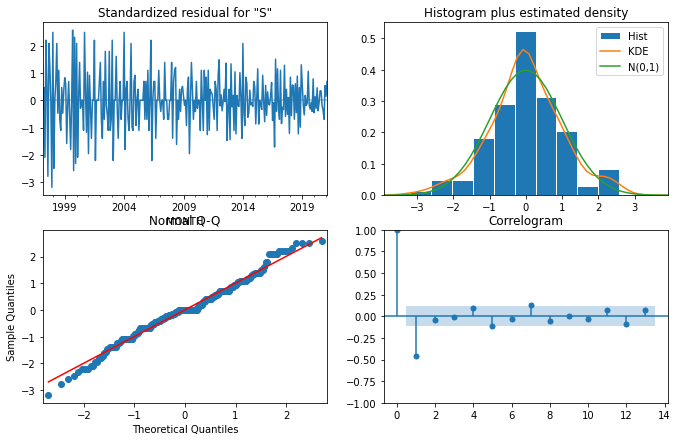

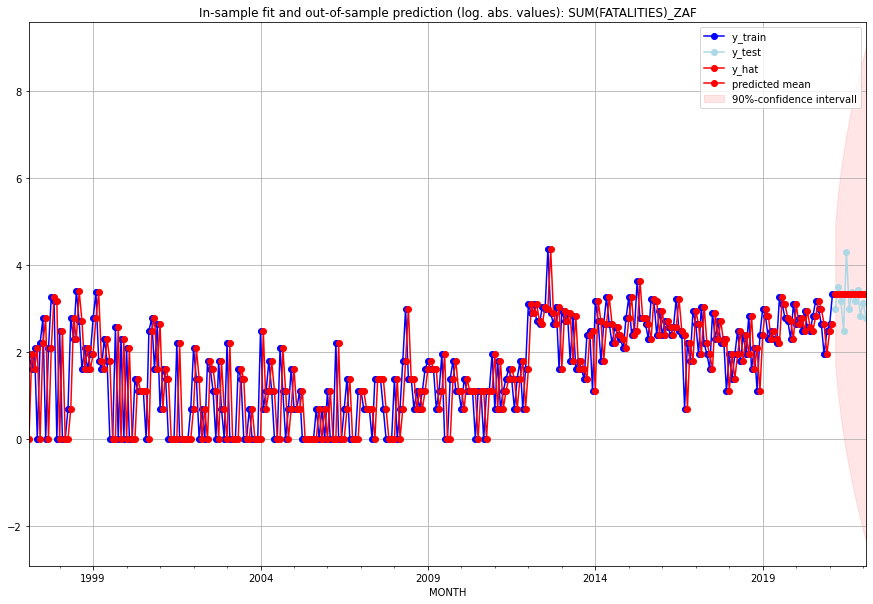

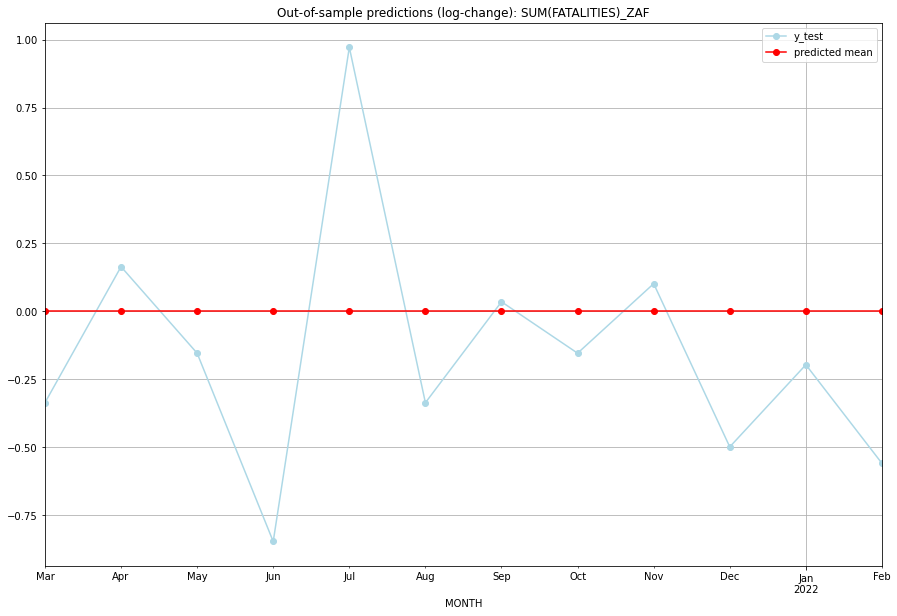

TADDA: 0.3630748825021725
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01      27.0        19.0  4.440892e-16       -0.336472   ZAF   
1  2021-04-01      27.0        32.0  4.440892e-16        0.164303   ZAF   
2  2021-05-01      27.0        23.0  4.440892e-16       -0.154151   ZAF   
3  2021-06-01      27.0        11.0  4.440892e-16       -0.847298   ZAF   
4  2021-07-01      27.0        73.0  4.440892e-16        0.971861   ZAF   
5  2021-08-01      27.0        19.0  4.440892e-16       -0.336472   ZAF   
6  2021-09-01      27.0        28.0  4.440892e-16        0.035091   ZAF   
7  2021-10-01      27.0        23.0  4.440892e-16       -0.154151   ZAF   
8  2021-11-01      27.0        30.0  4.440892e-16        0.101783   ZAF   
9  2021-12-01      27.0        16.0  4.440892e-16       -0.498991   ZAF   
10 2022-01-01      27.0        22.0  4.440892e-16       -0.196710   ZAF   
11 2022-02-01      27.0        15.0  4.440892e-16    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [0, (0, 1, 0), (2, 0, 2, 12), 'n'], 'cv_score': 0.5001582340891157, 'fold_results': [0.5002931486770059, 0.17055655594911148, 0.5607995689310529, 0.5050034414984693, 0.7641384553899391]}
Training finished.
                                        SARIMAX Results                                        
Dep. Variable:                     SUM(FATALITIES)_ZMB   No. Observations:                  289
Model:             SARIMAX(0, 1, 0)x(2, 0, [1, 2], 12)   Log Likelihood                -327.050
Date:                                 Fri, 21 Oct 2022   AIC                            664.099
Time:                                         21:11:44   BIC                            682.414
Sample:                                     02-28-1997   HQIC                           671.439
                                          - 02-28-2021                                         
Covariance Type:                                   opg                                       

<Figure size 432x288 with 0 Axes>

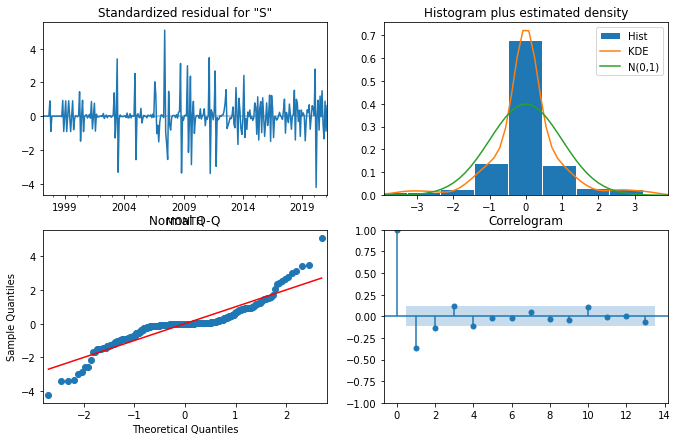

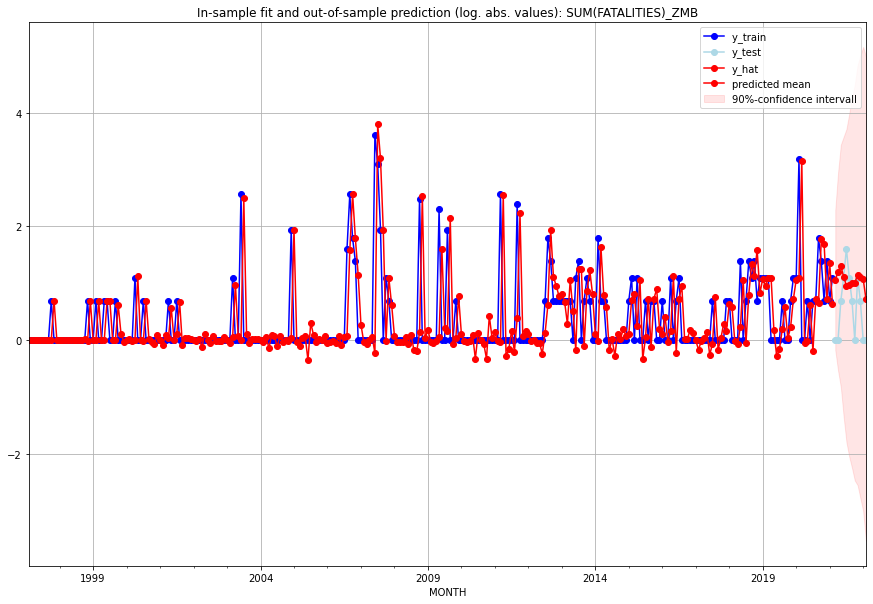

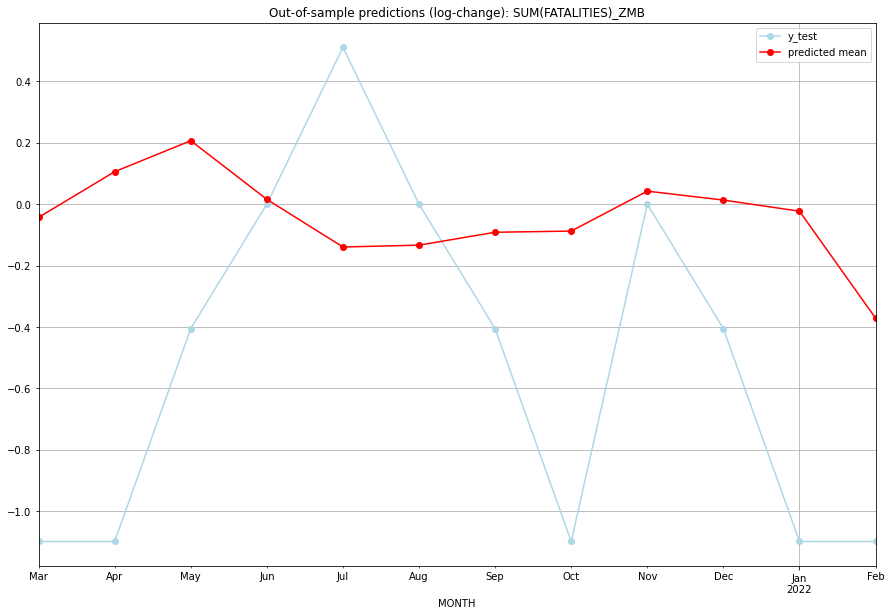

TADDA: 0.6438243930728554
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.873484         0.0     -0.043087       -1.098612   ZMB   
1  2021-04-01  2.334681         0.0      0.105765       -1.098612   ZMB   
2  2021-05-01  2.688784         1.0      0.206685       -0.405465   ZMB   
3  2021-06-01  2.047387         2.0      0.015672        0.000000   ZMB   
4  2021-07-01  1.609402         4.0     -0.139491        0.510826   ZMB   
5  2021-08-01  1.625009         2.0     -0.133528        0.000000   ZMB   
6  2021-09-01  1.737671         1.0     -0.091505       -0.405465   ZMB   
7  2021-10-01  1.748135         0.0     -0.087690       -1.098612   ZMB   
8  2021-11-01  2.129972         2.0      0.042412        0.000000   ZMB   
9  2021-12-01  2.040110         1.0      0.013281       -0.405465   ZMB   
10 2022-01-01  1.932091         0.0     -0.022897       -1.098612   ZMB   
11 2022-02-01  1.069579         0.0     -0.371267    

  0%|          | 0/2304 [00:00<?, ?it/s]



Best CV-Results
{'params': [1, (2, 0, 2), (2, 0, 2, 12), 'n'], 'cv_score': 0.4842564106272421, 'fold_results': [0.3839491861771615, 0.48531936707487794, nan, 0.5449674556052909, 0.5227896336516382]}
Training finished.
                                     SARIMAX Results                                      
Dep. Variable:                SUM(FATALITIES)_ZWE   No. Observations:                  289
Model:             SARIMAX(2, 0, 2)x(2, 0, 2, 12)   Log Likelihood                -303.753
Date:                            Fri, 21 Oct 2022   AIC                            627.506
Time:                                    21:24:14   BIC                            664.170
Sample:                                02-28-1997   HQIC                           642.197
                                     - 02-28-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|

<Figure size 432x288 with 0 Axes>

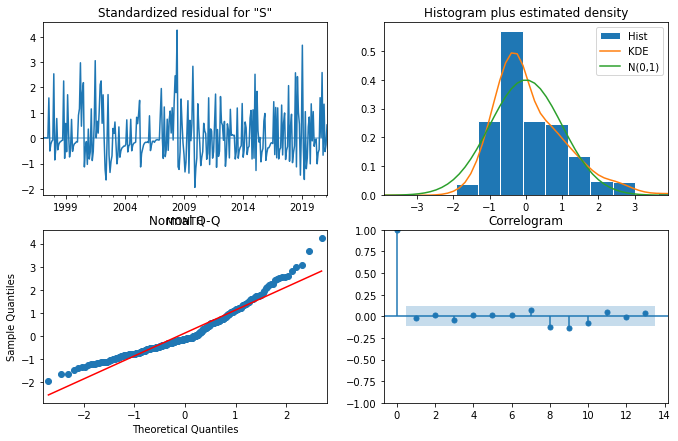

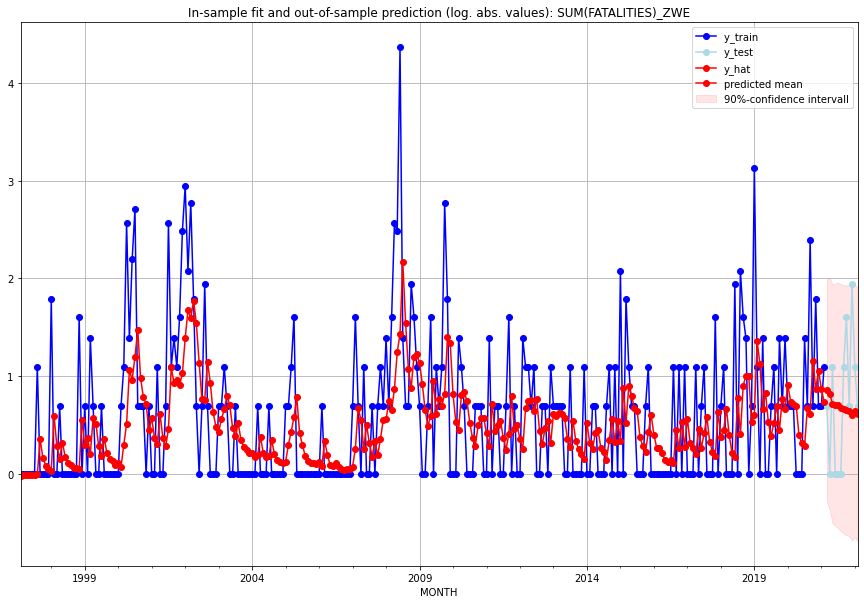

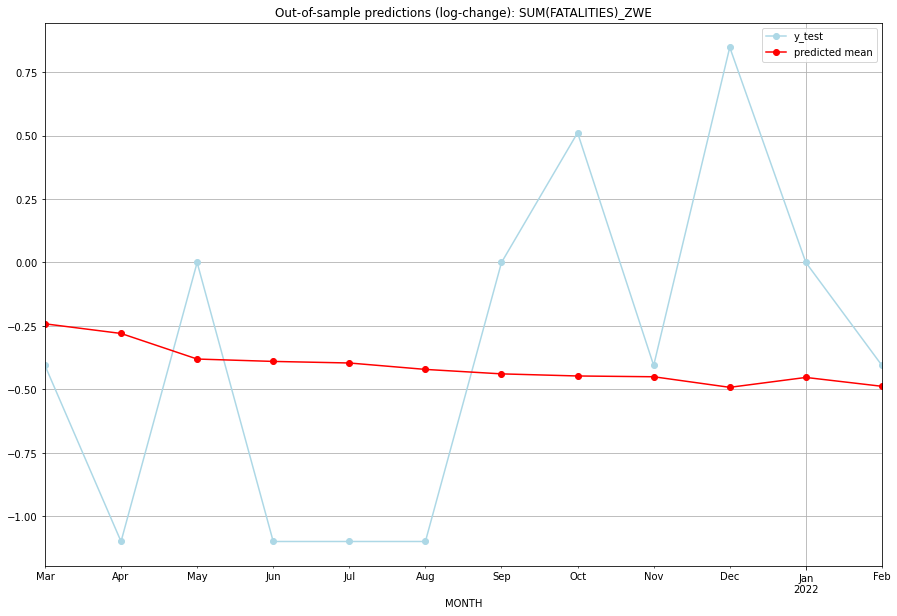

TADDA: 0.6421444157855717
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0  \
0  2021-03-01  1.356426         1.0     -0.241466       -0.405465   ZWE   
1  2021-04-01  1.268605         0.0     -0.279447       -1.098612   ZWE   
2  2021-05-01  1.051245         2.0     -0.380166        0.000000   ZWE   
3  2021-06-01  1.032093         0.0     -0.389546       -1.098612   ZWE   
4  2021-07-01  1.019563         0.0     -0.395731       -1.098612   ZWE   
5  2021-08-01  0.969180         0.0     -0.420995       -1.098612   ZWE   
6  2021-09-01  0.934864         2.0     -0.438575        0.000000   ZWE   
7  2021-10-01  0.918857         4.0     -0.446883        0.510826   ZWE   
8  2021-11-01  0.912968         1.0     -0.449956       -0.405465   ZWE   
9  2021-12-01  0.834946         6.0     -0.491597        0.847298   ZWE   
10 2022-01-01  0.907885         2.0     -0.452617        0.000000   ZWE   
11 2022-02-01  0.842411         1.0     -0.487537    

In [8]:
# warnings.simplefilter(action='ignore')

sarimax_res = pd.DataFrame(columns=["MONTH", "FAT_PRED", "FAT_ACTUAL", "LC(FAT_PRED)", "LC(FAT_ACTUAL)", "GID_0", "PARAMETERS", "TIMESTAMP"])
csv_file = "../data/"+MODEL_NAME+"_PREDICTIONS.csv"

if os.path.exists(csv_file):
    existing_res = pd.read_csv("../data/"+MODEL_NAME+"_PREDICTIONS.csv")
    # print(existing_res)
    print("File already exists.")
    
else:
    sarimax_res.to_csv(csv_file, index=False, mode="a", header=True)
    existing_res = sarimax_res

for i, g in enumerate(gid_list):
# for i, g in enumerate(["XNC"]):
    print("######## "+g+" ("+str(i+1)+"/"+str(len(gid_list))+") #########")
    # print(existing_res[existing_res["GID_0"] == g])
    print(len(existing_res[existing_res["GID_0"] == g]))
    
    
    # skip country if results already exiast
    if len(existing_res[existing_res["GID_0"] == g]) > 0:
        print("Model for this country has already been fitted.")
        continue
    
    # add time series of neighboring  countries as predictor variables

    if NEIGHBORS == True:
        neighbor = gid0_neighbors[gid0_neighbors["GID_0"] == g]["NEIGHBOUR"].tolist()
    else:
        neighbor = []
    print("Neighbor countries: "+ str(neighbor))

    # measure time 
    st = time.time()

    res = sarimax(target_variable = TARGET_VARIABLE,
                  target_country = g,
                  predictor_countries = neighbor,
                  n_lags_X = N_LAGS_X,
                  seasonal_periodicity = SEASONAL_PERIODICITY)

    # append country results to csv with timestamp
    res["TIMESTAMP"] = datetime.datetime.now()
    
    res.to_csv(csv_file, index=False, mode="a", header=False)

    et = time.time()
    elapsed_time = et - st
    print('Execution time:', time.strftime("%M:%S", time.gmtime(elapsed_time)))

    sarimax_res = pd.concat([sarimax_res, res], ignore_index=True)

    # break

In [9]:
# varimax_res.to_csv("../data/"+MODEL_NAME+"_PREDICTIONS.csv", index=False)

In [10]:
sarimax_res

,MONTH,FAT_PRED,FAT_ACTUAL,LC(FAT_PRED),LC(FAT_ACTUAL),GID_0,PARAMETERS,TIMESTAMP
0,2021-03-01 00:00:00,0.0,0.0,-1.609438,-1.609438,MAR,"{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'],...",2022-10-21 14:44:58.914181
1,2021-04-01 00:00:00,0.0,1.0,-1.609438,-0.916291,MAR,"{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'],...",2022-10-21 14:44:58.914181
2,2021-05-01 00:00:00,0.0,0.0,-1.609438,-1.609438,MAR,"{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'],...",2022-10-21 14:44:58.914181
3,2021-06-01 00:00:00,0.0,0.0,-1.609438,-1.609438,MAR,"{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'],...",2022-10-21 14:44:58.914181
4,2021-07-01 00:00:00,0.0,0.0,-1.609438,-1.609438,MAR,"{'params': [0, (0, 0, 0), (0, 0, 0, 12), 'n'],...",2022-10-21 14:44:58.914181
...,...,...,...,...,...,...,...,...
1255,2021-10-01 00:00:00,0.918857,4.0,-0.446883,0.510826,ZWE,"{'params': [1, (2, 0, 2), (2, 0, 2, 12), 'n'],...",2022-10-21 21:24:15.359301
1256,2021-11-01 00:00:00,0.912968,1.0,-0.449956,-0.405465,ZWE,"{'params': [1, (2, 0, 2), (2, 0, 2, 12), 'n'],...",2022-10-21 21:24:15.359301
1257,2021-12-01 00:00:00,0.834946,6.0,-0.491597,0.847298,ZWE,"{'params': [1, (2, 0, 2), (2, 0, 2, 12), 'n'],...",2022-10-21 21:24:15.359301
1258,2022-01-01 00:00:00,0.907885,2.0,-0.452617,0.0,ZWE,"{'params': [1, (2, 0, 2), (2, 0, 2, 12), 'n'],...",2022-10-21 21:24:15.359301
